<center><h1>1-cd: Convolutional Neural Networks (ConvNets)</h1></center>

<center><h2><a href="https://rdfia.github.io/">Course link</a></h2></center>

# Warning :
# Do "File -> Save a copy in Drive" before you start modifying the notebook, otherwise your modifications will not be saved.


In [ ]:
#!git clone https://github.com/cdancette/deep-learning-polytech-tp6-7.git
! wget https://github.com/rdfia/rdfia.github.io/raw/master/code/2-cd/utils.py

--2024-10-29 13:12:40--  https://github.com/rdfia/rdfia.github.io/raw/master/code/2-cd/utils.py
Resolving github.com (github.com)... 20.205.243.166
Connecting to github.com (github.com)|20.205.243.166|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://raw.githubusercontent.com/rdfia/rdfia.github.io/master/code/2-cd/utils.py [following]
--2024-10-29 13:12:40--  https://raw.githubusercontent.com/rdfia/rdfia.github.io/master/code/2-cd/utils.py
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 2627 (2.6K) [text/plain]
Saving to: ‘utils.py’

utils.py            100%[===================>]   2.57K  --.-KB/s    in 0s      

2024-10-29 13:12:41 (35.1 MB/s) - ‘utils.py’ saved [2627/2627]



In [ ]:
%run 'utils.py'

In [ ]:
import argparse
import os
import time

import torch
import torch.nn as nn
import torch.nn.parallel
import torch.backends.cudnn as cudnn
import torch.optim
import torch.utils.data
import torchvision.transforms as transforms
import torchvision.datasets as datasets

from utils import *

PRINT_INTERVAL = 200
PATH="datasets"

# Code de base

In [ ]:
class ConvNet(nn.Module):
    """
    This class defines the structure of the neural network
    """

    def __init__(self):
        super(ConvNet, self).__init__()
        # We first define the convolution and pooling layers as a features extractor
        self.features = nn.Sequential(
            nn.Conv2d(3, 6, (5, 5), stride=1, padding=2),
            nn.Tanh(),
            nn.MaxPool2d((2, 2), stride=2, padding=0),
            nn.Conv2d(6, 16, (5, 5), stride=1, padding=0),
            nn.Tanh(),
            nn.MaxPool2d((2, 2), stride=2, padding=0,ceil_mode=True)
        )
        # We then define fully connected layers as a classifier
        self.classifier = nn.Sequential(
            nn.Linear(576, 256),
            nn.Tanh(),
            nn.Linear(256, 84),
            nn.Tanh(),
            nn.Linear(84, 10)
            # Reminder: The softmax is included in the loss, do not put it here
        )

    # Method called when we apply the network to an input batch
    def forward(self, input):
        bsize = input.size(0) # batch size
        output = self.features(input) # output of the conv layers
        output = output.view(bsize, -1) # we flatten the 2D feature maps into one 1D vector for each input
        output = self.classifier(output) # we compute the output of the fc layers
        return output



def get_dataset(batch_size, cuda=False):
    """
    This function loads the dataset and performs transformations on each
    image (listed in `transform = ...`).
    """
    train_dataset = datasets.CIFAR10(PATH, train=True, download=True,
        transform=transforms.Compose([
            transforms.ToTensor()
        ]))

    val_dataset = datasets.CIFAR10(PATH, train=False, download=True,
        transform=transforms.Compose([
            transforms.ToTensor()
        ]))

    train_loader = torch.utils.data.DataLoader(train_dataset,
                        batch_size=batch_size, shuffle=True, pin_memory=cuda, num_workers=2)
    val_loader = torch.utils.data.DataLoader(val_dataset,
                        batch_size=batch_size, shuffle=False, pin_memory=cuda, num_workers=2)

    return train_loader, val_loader



def epoch(data, model, criterion, optimizer=None, cuda=False):
    """
    Make a pass (called epoch in English) on the data `data` with the
     model `model`. Evaluates `criterion` as loss.
     If `optimizer` is given, perform a training epoch using
     the given optimizer, otherwise, perform an evaluation epoch (no backward)
     of the model.
    """

    # indicates whether the model is in eval or train mode (some layers behave differently in train and eval)
    model.eval() if optimizer is None else model.train()

    # objects to store metric averages
    avg_loss = AverageMeter()
    avg_top1_acc = AverageMeter()
    avg_top5_acc = AverageMeter()
    avg_batch_time = AverageMeter()
    global loss_plot

    # we iterate on the batches
    tic = time.time()
    for i, (input, target) in enumerate(data):

        if cuda: # only with GPU, and not with CPU
            input = input.cuda()
            target = target.cuda()

        # forward
        output = model(input)
        loss = criterion(output, target)

        # backward if we are training
        if optimizer:
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

        # compute metrics
        prec1, prec5 = accuracy(output, target, topk=(1, 5))
        batch_time = time.time() - tic
        tic = time.time()

        # update
        avg_loss.update(loss.item())
        avg_top1_acc.update(prec1.item())
        avg_top5_acc.update(prec5.item())
        avg_batch_time.update(batch_time)
        if optimizer:
            loss_plot.update(avg_loss.val)
        # print info
        if i % PRINT_INTERVAL == 0:
            print('[{0:s} Batch {1:03d}/{2:03d}]\t'
                  'Time {batch_time.val:.3f}s ({batch_time.avg:.3f}s)\t'
                  'Loss {loss.val:.4f} ({loss.avg:.4f})\t'
                  'Prec@1 {top1.val:5.1f} ({top1.avg:5.1f})\t'
                  'Prec@5 {top5.val:5.1f} ({top5.avg:5.1f})'.format(
                   "EVAL" if optimizer is None else "TRAIN", i, len(data), batch_time=avg_batch_time, loss=avg_loss,
                   top1=avg_top1_acc, top5=avg_top5_acc))
            if optimizer:
                loss_plot.plot()

    # Print summary
    print('\n===============> Total time {batch_time:d}s\t'
          'Avg loss {loss.avg:.4f}\t'
          'Avg Prec@1 {top1.avg:5.2f} %\t'
          'Avg Prec@5 {top5.avg:5.2f} %\n'.format(
           batch_time=int(avg_batch_time.sum), loss=avg_loss,
           top1=avg_top1_acc, top5=avg_top5_acc))

    return avg_top1_acc, avg_top5_acc, avg_loss


def main(batch_size=128, lr=0.1, epochs=5, cuda=False):

    # ex :
    #   {"batch_size": 128, "epochs": 5, "lr": 0.1}

    # define model, loss, optim
    model = ConvNet()
    criterion = nn.CrossEntropyLoss()
    optimizer = torch.optim.SGD(model.parameters(), lr)

    if cuda: # only with GPU, and not with CPU
        cudnn.benchmark = True
        model = model.cuda()
        criterion = criterion.cuda()

    # Get the data
    train, test = get_dataset(batch_size, cuda)

    # init plots
    plot = AccLossPlot()
    global loss_plot
    loss_plot = TrainLossPlot()

    # We iterate on the epochs
    for i in range(epochs):
        print("=================\n=== EPOCH "+str(i+1)+" =====\n=================\n")
        # Train phase
        top1_acc, avg_top5_acc, loss = epoch(train, model, criterion, optimizer, cuda)
        # Test phase
        top1_acc_test, top5_acc_test, loss_test = epoch(test, model, criterion, cuda=cuda)
        # plot
        plot.update(loss.avg, loss_test.avg, top1_acc.avg, top1_acc_test.avg)


Files already downloaded and verified
Files already downloaded and verified
=== EPOCH 1 =====

[TRAIN Batch 000/391]	Time 0.139s (0.139s)	Loss 2.3048 (2.3048)	Prec@1   7.8 (  7.8)	Prec@5  52.3 ( 52.3)


<Figure size 640x480 with 0 Axes>

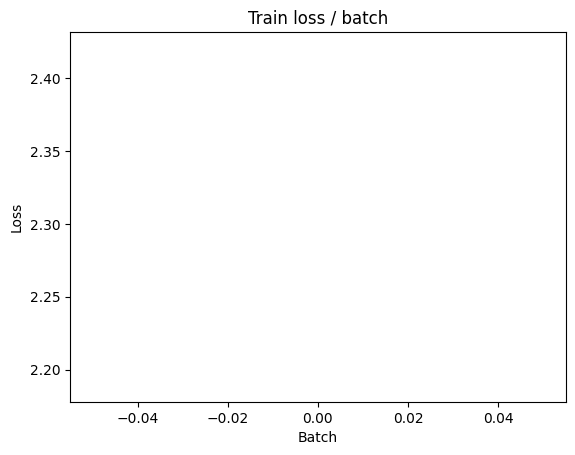

[TRAIN Batch 200/391]	Time 0.004s (0.020s)	Loss 1.8797 (2.1423)	Prec@1  30.5 ( 20.8)	Prec@5  82.0 ( 69.4)


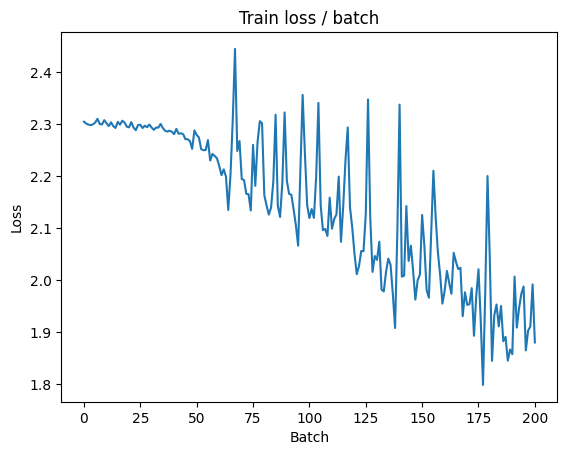


===============> Total time 8s	Avg loss 1.9719	Avg Prec@1 27.88 %	Avg Prec@5 77.14 %

[EVAL Batch 000/079]	Time 0.123s (0.123s)	Loss 1.6168 (1.6168)	Prec@1  46.9 ( 46.9)	Prec@5  91.4 ( 91.4)

===============> Total time 1s	Avg loss 1.6637	Avg Prec@1 39.90 %	Avg Prec@5 88.74 %



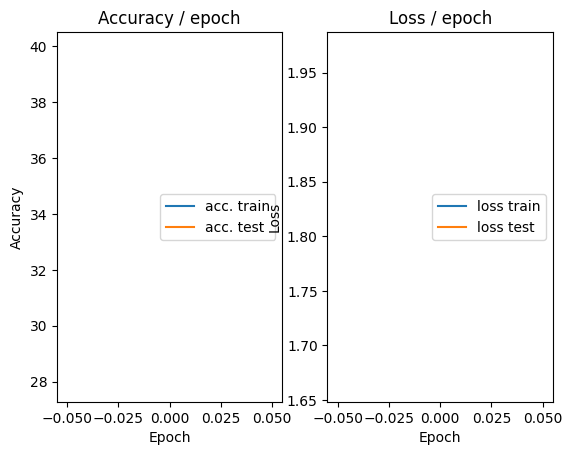

=== EPOCH 2 =====

[TRAIN Batch 000/391]	Time 0.133s (0.133s)	Loss 1.6694 (1.6694)	Prec@1  41.4 ( 41.4)	Prec@5  89.1 ( 89.1)


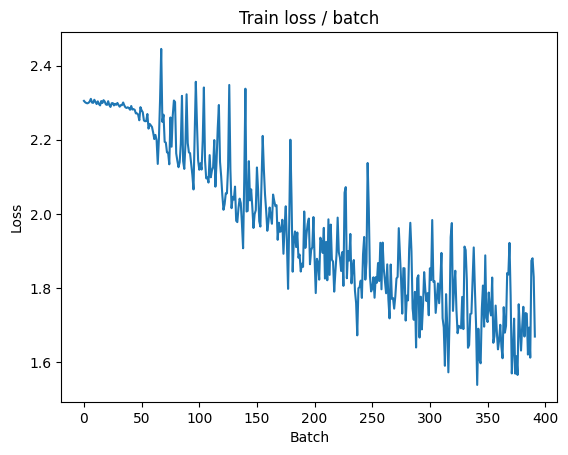

[TRAIN Batch 200/391]	Time 0.013s (0.021s)	Loss 1.4582 (1.6385)	Prec@1  47.7 ( 40.6)	Prec@5  87.5 ( 88.9)


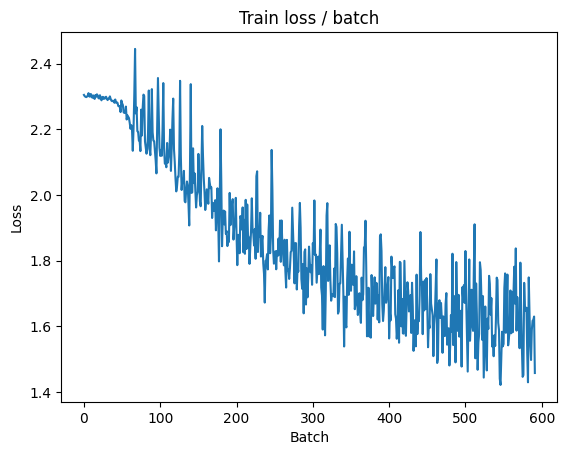


===============> Total time 8s	Avg loss 1.5911	Avg Prec@1 42.52 %	Avg Prec@5 89.68 %

[EVAL Batch 000/079]	Time 0.165s (0.165s)	Loss 1.5074 (1.5074)	Prec@1  46.9 ( 46.9)	Prec@5  89.8 ( 89.8)

===============> Total time 2s	Avg loss 1.5315	Avg Prec@1 44.64 %	Avg Prec@5 90.51 %



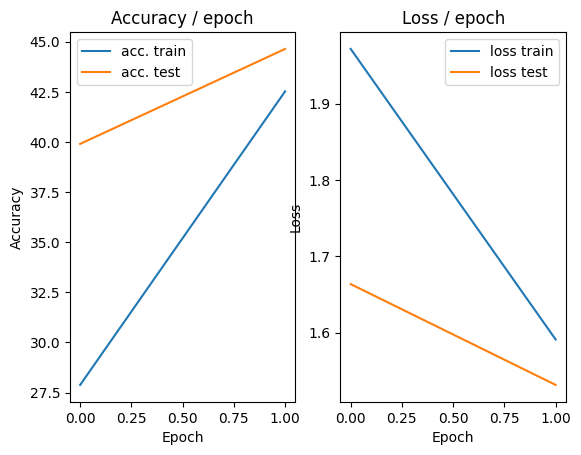

=== EPOCH 3 =====

[TRAIN Batch 000/391]	Time 0.152s (0.152s)	Loss 1.6300 (1.6300)	Prec@1  37.5 ( 37.5)	Prec@5  88.3 ( 88.3)


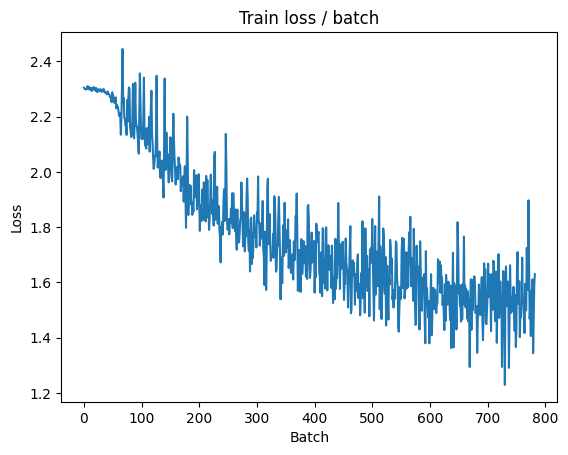

[TRAIN Batch 200/391]	Time 0.035s (0.022s)	Loss 1.4761 (1.4741)	Prec@1  53.1 ( 47.0)	Prec@5  87.5 ( 91.8)


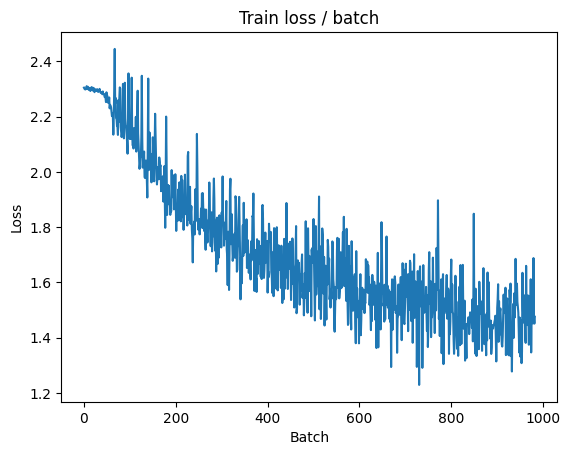


===============> Total time 8s	Avg loss 1.4416	Avg Prec@1 48.10 %	Avg Prec@5 92.10 %

[EVAL Batch 000/079]	Time 0.156s (0.156s)	Loss 1.3423 (1.3423)	Prec@1  46.9 ( 46.9)	Prec@5  93.0 ( 93.0)

===============> Total time 1s	Avg loss 1.4155	Avg Prec@1 49.13 %	Avg Prec@5 92.45 %



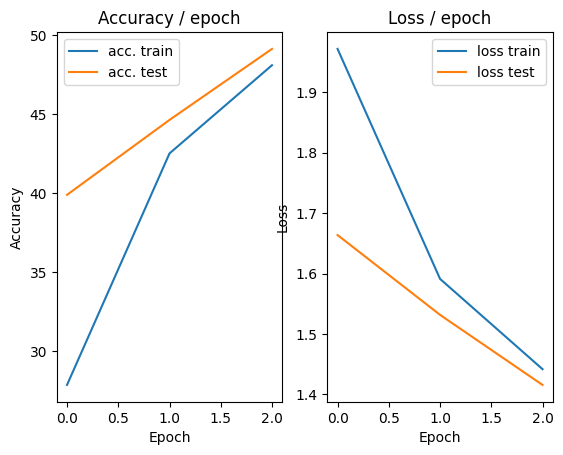

=== EPOCH 4 =====

[TRAIN Batch 000/391]	Time 0.213s (0.213s)	Loss 1.4839 (1.4839)	Prec@1  46.9 ( 46.9)	Prec@5  91.4 ( 91.4)


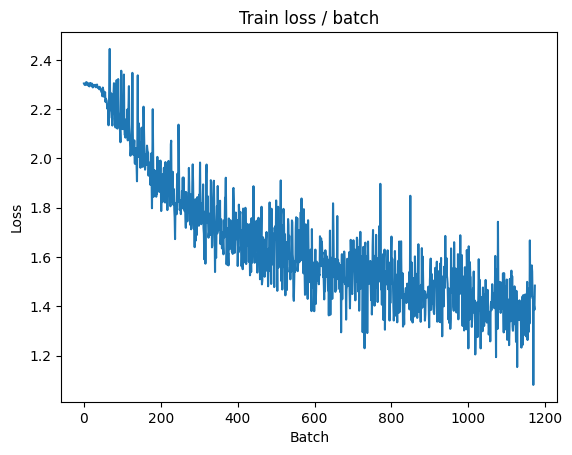

[TRAIN Batch 200/391]	Time 0.008s (0.024s)	Loss 1.3921 (1.3573)	Prec@1  48.4 ( 51.3)	Prec@5  96.1 ( 93.3)


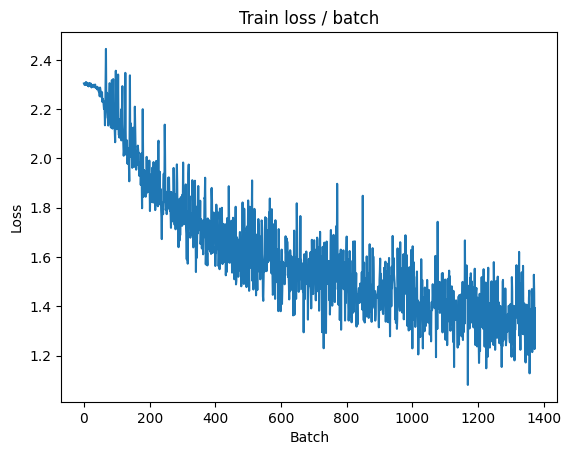


===============> Total time 8s	Avg loss 1.3418	Avg Prec@1 51.88 %	Avg Prec@5 93.55 %

[EVAL Batch 000/079]	Time 0.126s (0.126s)	Loss 1.2423 (1.2423)	Prec@1  52.3 ( 52.3)	Prec@5  93.8 ( 93.8)

===============> Total time 1s	Avg loss 1.3507	Avg Prec@1 51.32 %	Avg Prec@5 93.60 %



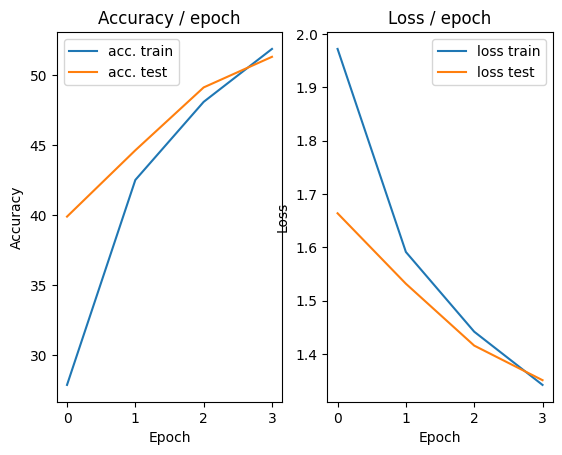

=== EPOCH 5 =====

[TRAIN Batch 000/391]	Time 0.161s (0.161s)	Loss 1.2537 (1.2537)	Prec@1  58.6 ( 58.6)	Prec@5  93.0 ( 93.0)


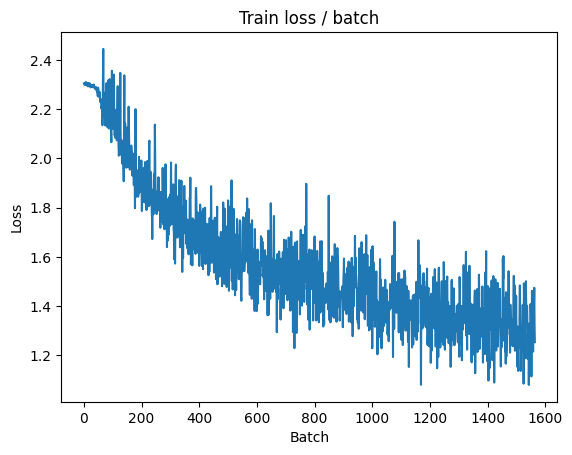

[TRAIN Batch 200/391]	Time 0.036s (0.026s)	Loss 1.2359 (1.2642)	Prec@1  55.5 ( 54.6)	Prec@5  94.5 ( 94.6)


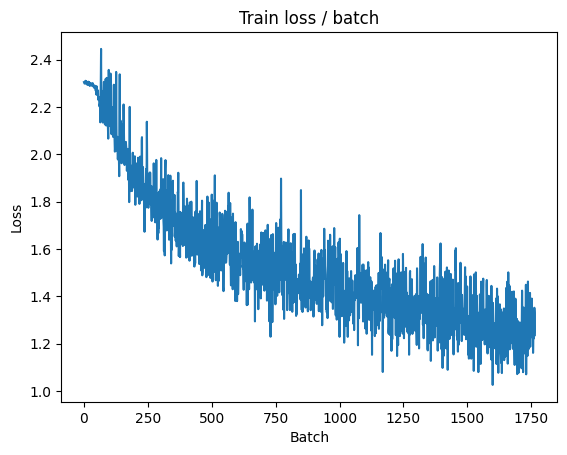


===============> Total time 9s	Avg loss 1.2602	Avg Prec@1 54.97 %	Avg Prec@5 94.57 %

[EVAL Batch 000/079]	Time 0.126s (0.126s)	Loss 1.1622 (1.1622)	Prec@1  51.6 ( 51.6)	Prec@5  95.3 ( 95.3)

===============> Total time 1s	Avg loss 1.2723	Avg Prec@1 54.18 %	Avg Prec@5 94.00 %



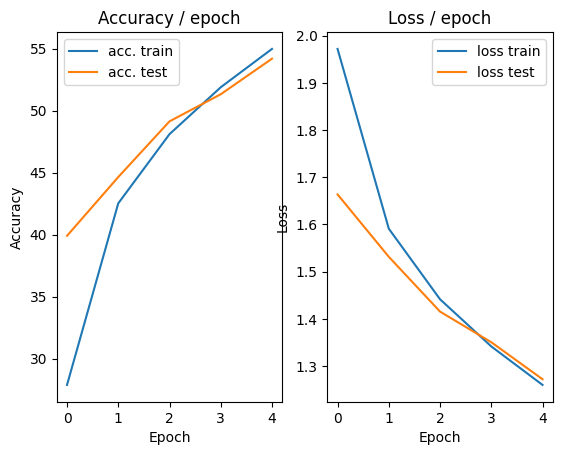

=== EPOCH 6 =====

[TRAIN Batch 000/391]	Time 0.229s (0.229s)	Loss 1.2225 (1.2225)	Prec@1  57.0 ( 57.0)	Prec@5  90.6 ( 90.6)


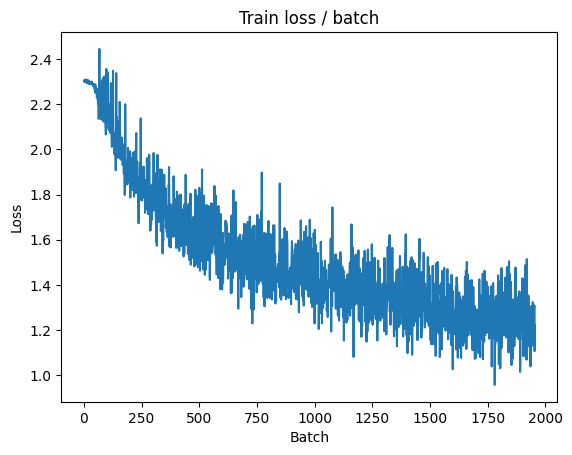

[TRAIN Batch 200/391]	Time 0.058s (0.027s)	Loss 1.2064 (1.2091)	Prec@1  54.7 ( 56.5)	Prec@5  96.1 ( 95.0)


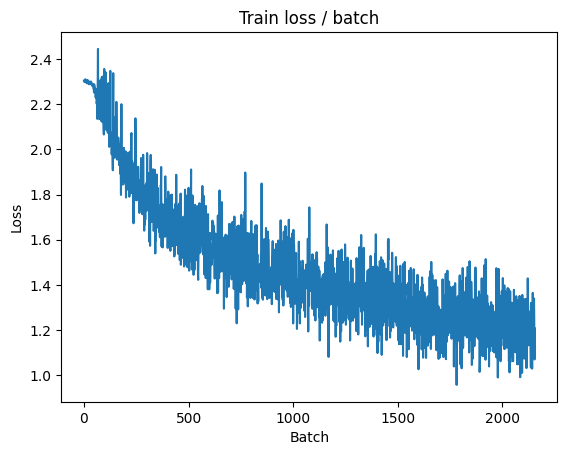


===============> Total time 9s	Avg loss 1.2006	Avg Prec@1 57.09 %	Avg Prec@5 95.15 %

[EVAL Batch 000/079]	Time 0.126s (0.126s)	Loss 1.1199 (1.1199)	Prec@1  58.6 ( 58.6)	Prec@5  93.8 ( 93.8)

===============> Total time 1s	Avg loss 1.2724	Avg Prec@1 54.75 %	Avg Prec@5 94.34 %



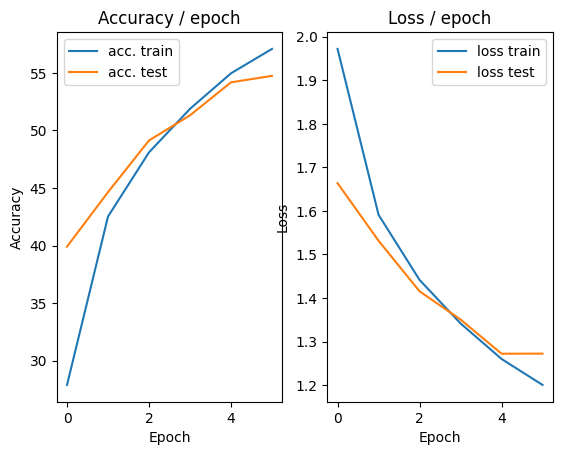

=== EPOCH 7 =====

[TRAIN Batch 000/391]	Time 0.140s (0.140s)	Loss 1.1366 (1.1366)	Prec@1  57.0 ( 57.0)	Prec@5  96.1 ( 96.1)


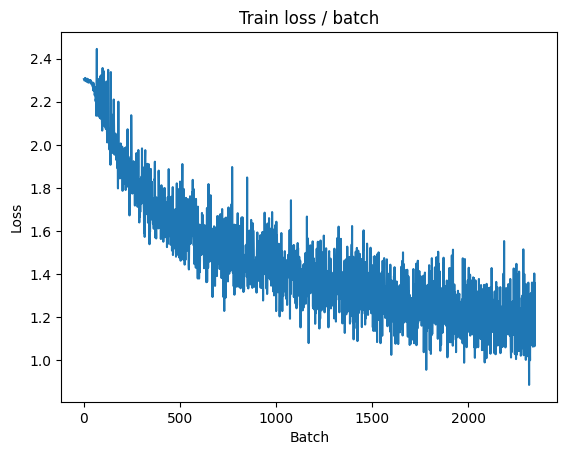

[TRAIN Batch 200/391]	Time 0.007s (0.021s)	Loss 1.1880 (1.1500)	Prec@1  53.1 ( 59.0)	Prec@5  98.4 ( 95.8)


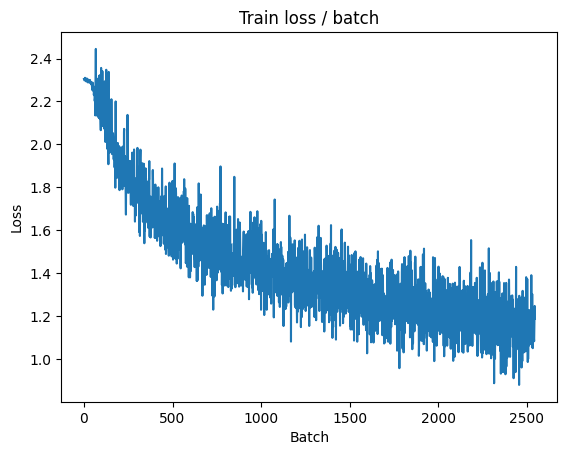


===============> Total time 9s	Avg loss 1.1483	Avg Prec@1 59.22 %	Avg Prec@5 95.70 %

[EVAL Batch 000/079]	Time 0.154s (0.154s)	Loss 1.0267 (1.0267)	Prec@1  64.8 ( 64.8)	Prec@5  94.5 ( 94.5)

===============> Total time 1s	Avg loss 1.1636	Avg Prec@1 58.41 %	Avg Prec@5 95.43 %



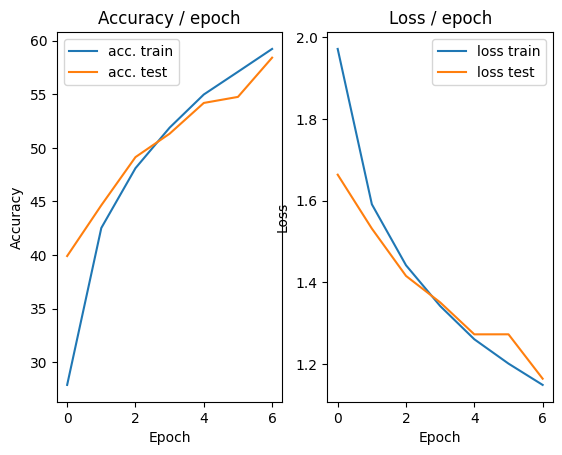

=== EPOCH 8 =====

[TRAIN Batch 000/391]	Time 0.145s (0.145s)	Loss 1.0951 (1.0951)	Prec@1  59.4 ( 59.4)	Prec@5  96.9 ( 96.9)


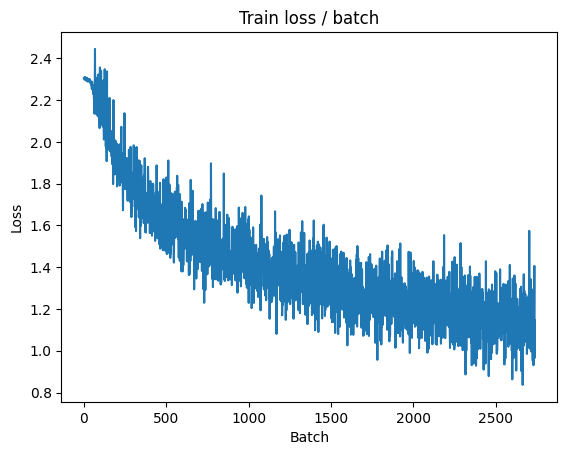

[TRAIN Batch 200/391]	Time 0.031s (0.021s)	Loss 1.4070 (1.0938)	Prec@1  46.9 ( 61.2)	Prec@5  93.0 ( 96.0)


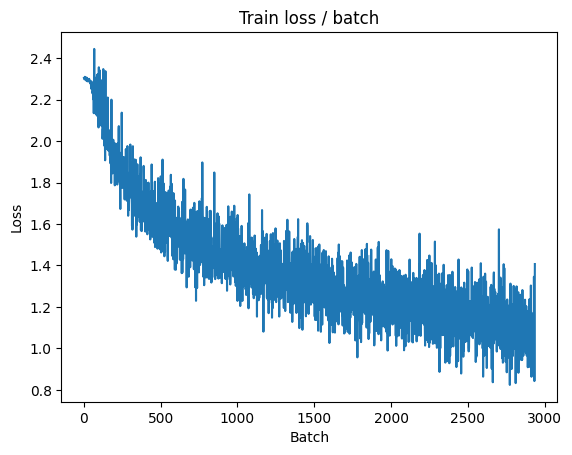


===============> Total time 8s	Avg loss 1.0981	Avg Prec@1 61.08 %	Avg Prec@5 96.06 %

[EVAL Batch 000/079]	Time 0.197s (0.197s)	Loss 1.0887 (1.0887)	Prec@1  61.7 ( 61.7)	Prec@5  96.1 ( 96.1)

===============> Total time 1s	Avg loss 1.2151	Avg Prec@1 57.59 %	Avg Prec@5 95.01 %



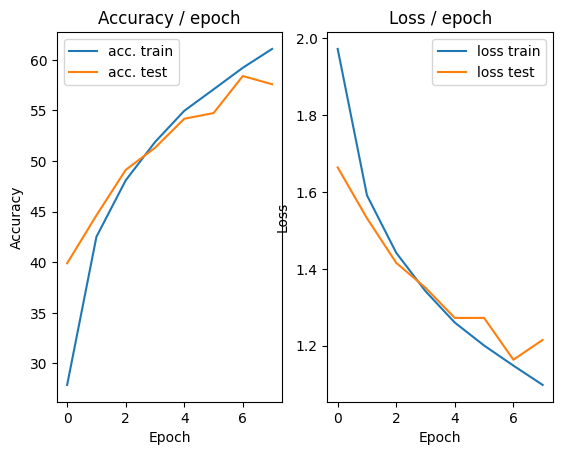

=== EPOCH 9 =====

[TRAIN Batch 000/391]	Time 0.158s (0.158s)	Loss 1.0709 (1.0709)	Prec@1  64.1 ( 64.1)	Prec@5  96.9 ( 96.9)


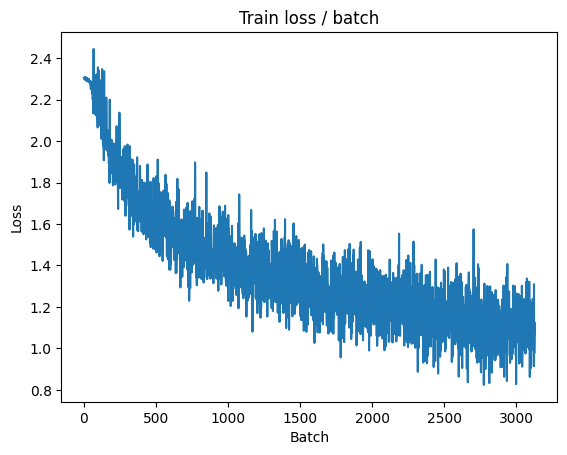

[TRAIN Batch 200/391]	Time 0.006s (0.021s)	Loss 1.2213 (1.0699)	Prec@1  60.2 ( 62.1)	Prec@5  91.4 ( 96.3)


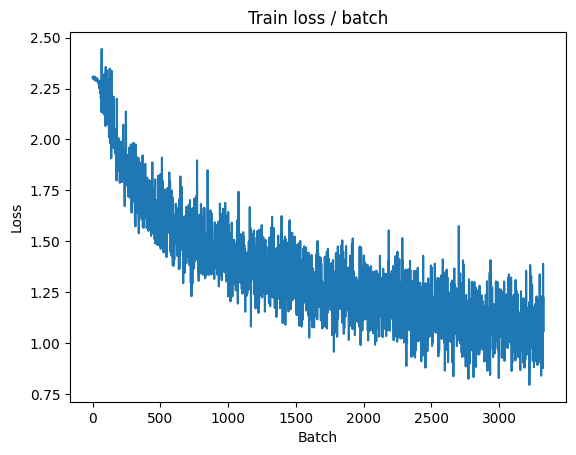


===============> Total time 8s	Avg loss 1.0612	Avg Prec@1 62.29 %	Avg Prec@5 96.43 %

[EVAL Batch 000/079]	Time 0.126s (0.126s)	Loss 1.0358 (1.0358)	Prec@1  62.5 ( 62.5)	Prec@5  94.5 ( 94.5)

===============> Total time 2s	Avg loss 1.2209	Avg Prec@1 57.08 %	Avg Prec@5 94.86 %



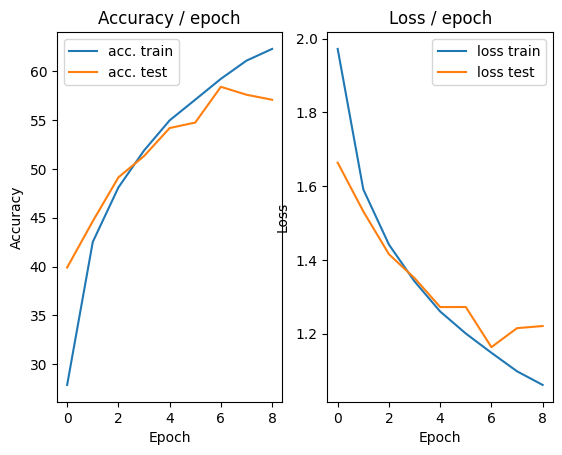

=== EPOCH 10 =====

[TRAIN Batch 000/391]	Time 0.230s (0.230s)	Loss 0.9875 (0.9875)	Prec@1  60.9 ( 60.9)	Prec@5  96.9 ( 96.9)


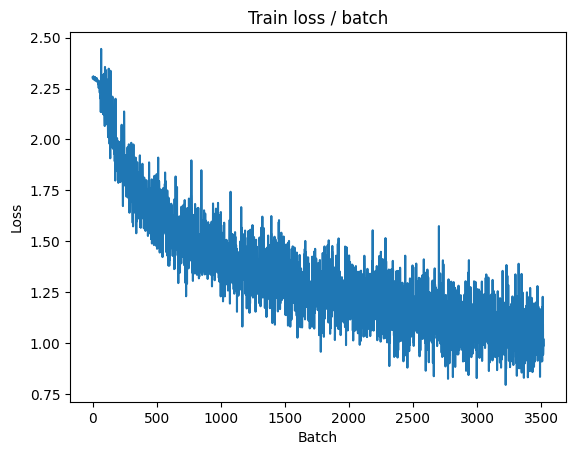

[TRAIN Batch 200/391]	Time 0.019s (0.021s)	Loss 0.9996 (1.0220)	Prec@1  61.7 ( 63.7)	Prec@5  97.7 ( 96.7)


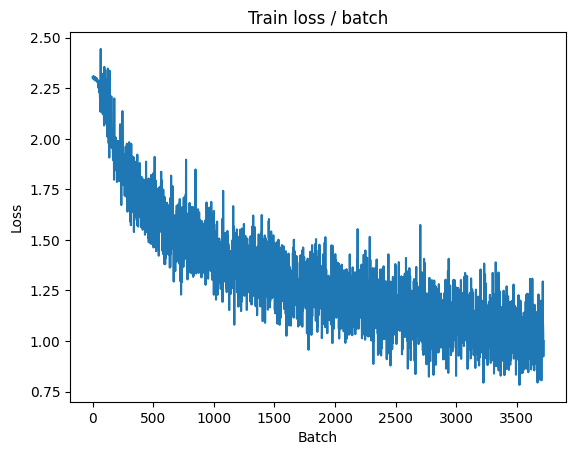


===============> Total time 7s	Avg loss 1.0145	Avg Prec@1 64.02 %	Avg Prec@5 96.75 %

[EVAL Batch 000/079]	Time 0.132s (0.132s)	Loss 1.0950 (1.0950)	Prec@1  60.2 ( 60.2)	Prec@5  95.3 ( 95.3)

===============> Total time 1s	Avg loss 1.1218	Avg Prec@1 60.55 %	Avg Prec@5 95.73 %



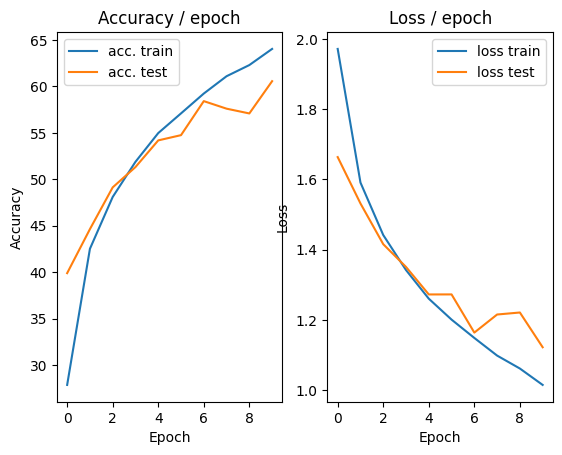

=== EPOCH 11 =====

[TRAIN Batch 000/391]	Time 0.166s (0.166s)	Loss 0.9760 (0.9760)	Prec@1  67.2 ( 67.2)	Prec@5  96.9 ( 96.9)


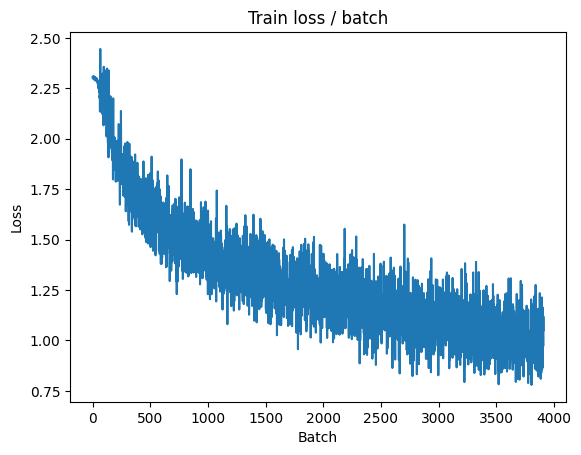

[TRAIN Batch 200/391]	Time 0.004s (0.026s)	Loss 1.0339 (0.9639)	Prec@1  65.6 ( 65.7)	Prec@5  96.1 ( 97.2)


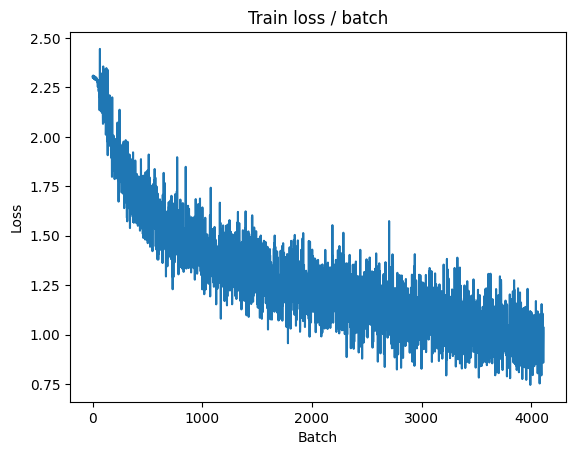


===============> Total time 9s	Avg loss 0.9733	Avg Prec@1 65.40 %	Avg Prec@5 97.09 %

[EVAL Batch 000/079]	Time 0.135s (0.135s)	Loss 0.9742 (0.9742)	Prec@1  65.6 ( 65.6)	Prec@5  95.3 ( 95.3)

===============> Total time 1s	Avg loss 1.0902	Avg Prec@1 61.25 %	Avg Prec@5 96.15 %



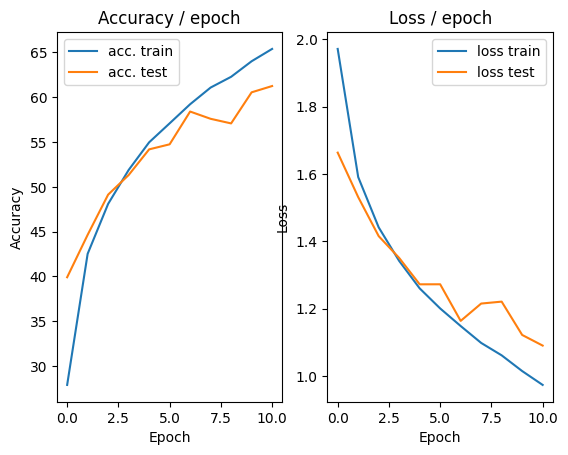

=== EPOCH 12 =====

[TRAIN Batch 000/391]	Time 0.168s (0.168s)	Loss 1.0452 (1.0452)	Prec@1  64.1 ( 64.1)	Prec@5  96.1 ( 96.1)


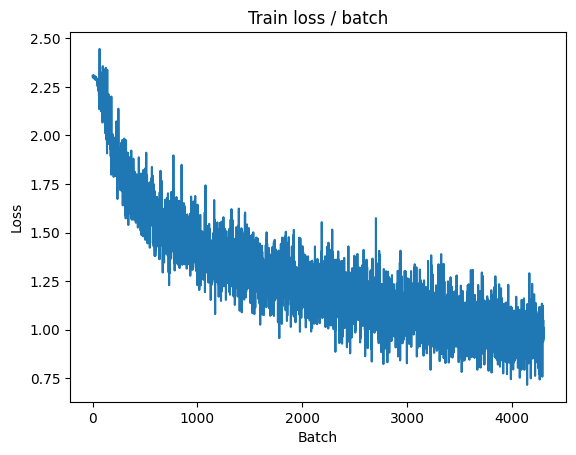

[TRAIN Batch 200/391]	Time 0.004s (0.026s)	Loss 0.9531 (0.9240)	Prec@1  64.1 ( 67.2)	Prec@5  96.9 ( 97.5)


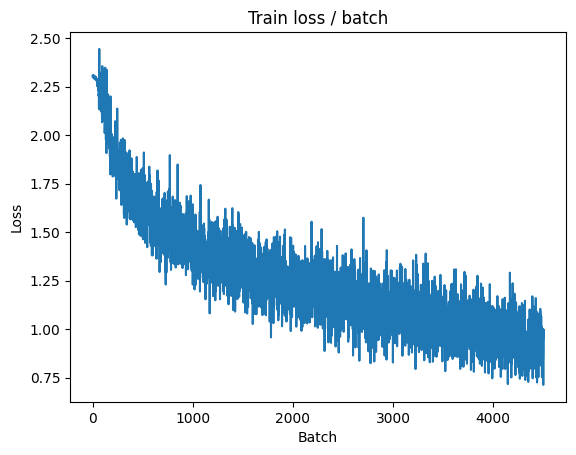


===============> Total time 9s	Avg loss 0.9333	Avg Prec@1 66.93 %	Avg Prec@5 97.33 %

[EVAL Batch 000/079]	Time 0.129s (0.129s)	Loss 1.0856 (1.0856)	Prec@1  60.2 ( 60.2)	Prec@5  96.1 ( 96.1)

===============> Total time 1s	Avg loss 1.1589	Avg Prec@1 59.42 %	Avg Prec@5 95.68 %



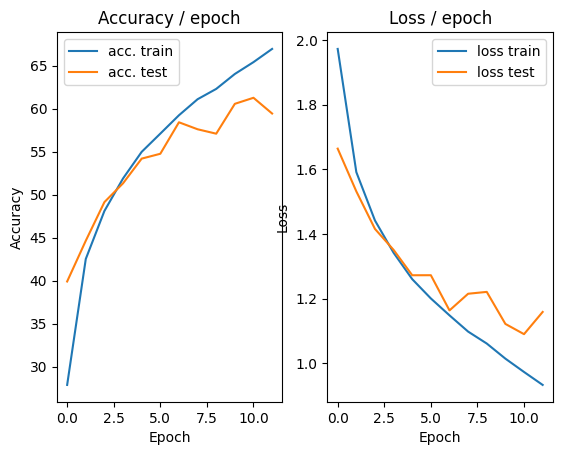

=== EPOCH 13 =====

[TRAIN Batch 000/391]	Time 0.168s (0.168s)	Loss 0.8304 (0.8304)	Prec@1  71.9 ( 71.9)	Prec@5  98.4 ( 98.4)


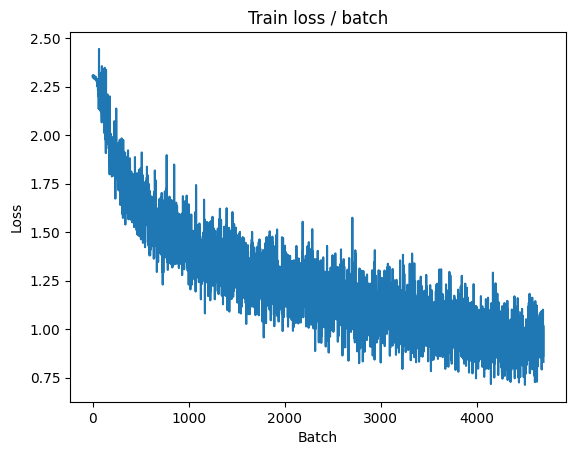

[TRAIN Batch 200/391]	Time 0.046s (0.023s)	Loss 0.8554 (0.8939)	Prec@1  66.4 ( 68.1)	Prec@5  98.4 ( 97.6)


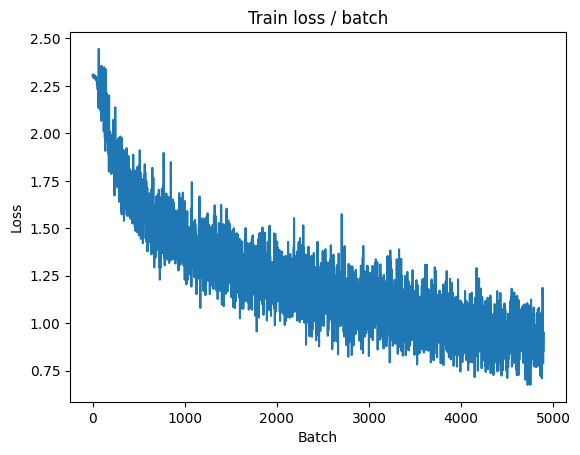


===============> Total time 9s	Avg loss 0.8971	Avg Prec@1 68.14 %	Avg Prec@5 97.55 %

[EVAL Batch 000/079]	Time 0.131s (0.131s)	Loss 1.0578 (1.0578)	Prec@1  67.2 ( 67.2)	Prec@5  94.5 ( 94.5)

===============> Total time 1s	Avg loss 1.1184	Avg Prec@1 60.34 %	Avg Prec@5 96.01 %



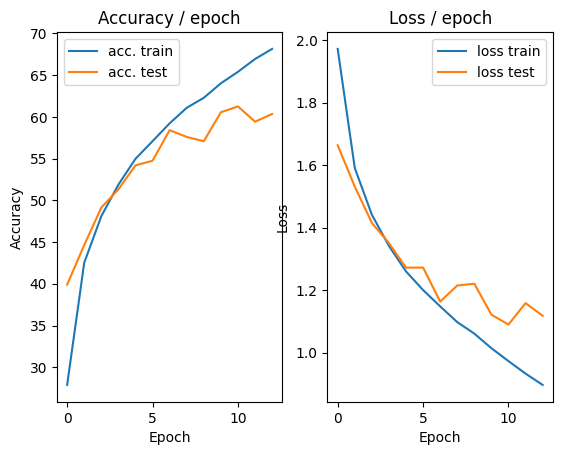

=== EPOCH 14 =====

[TRAIN Batch 000/391]	Time 0.172s (0.172s)	Loss 0.8155 (0.8155)	Prec@1  69.5 ( 69.5)	Prec@5  99.2 ( 99.2)


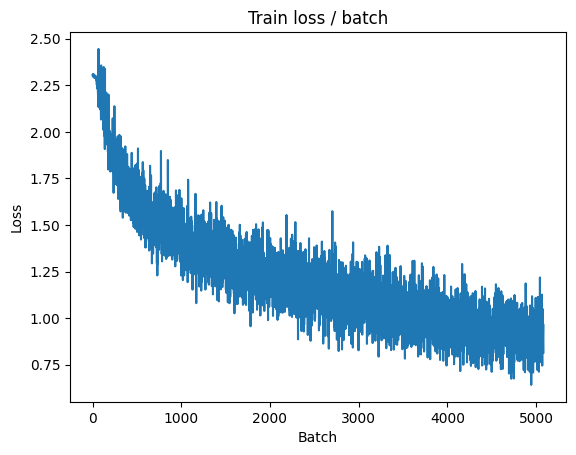

[TRAIN Batch 200/391]	Time 0.014s (0.021s)	Loss 0.8683 (0.8602)	Prec@1  71.1 ( 69.8)	Prec@5  97.7 ( 97.8)


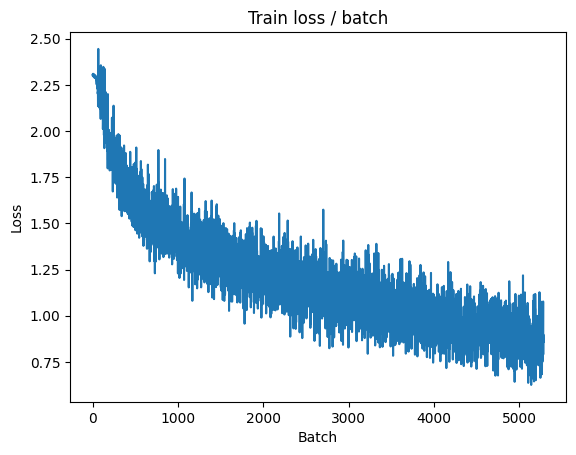


===============> Total time 9s	Avg loss 0.8618	Avg Prec@1 69.72 %	Avg Prec@5 97.81 %

[EVAL Batch 000/079]	Time 0.143s (0.143s)	Loss 1.1184 (1.1184)	Prec@1  62.5 ( 62.5)	Prec@5  94.5 ( 94.5)

===============> Total time 1s	Avg loss 1.1837	Avg Prec@1 59.13 %	Avg Prec@5 95.20 %



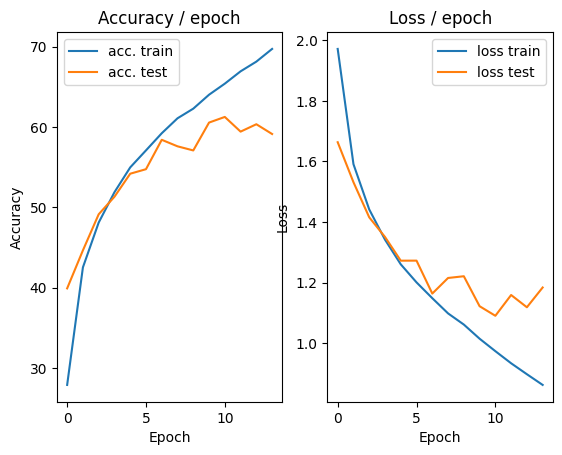

=== EPOCH 15 =====

[TRAIN Batch 000/391]	Time 0.190s (0.190s)	Loss 0.7971 (0.7971)	Prec@1  74.2 ( 74.2)	Prec@5  97.7 ( 97.7)


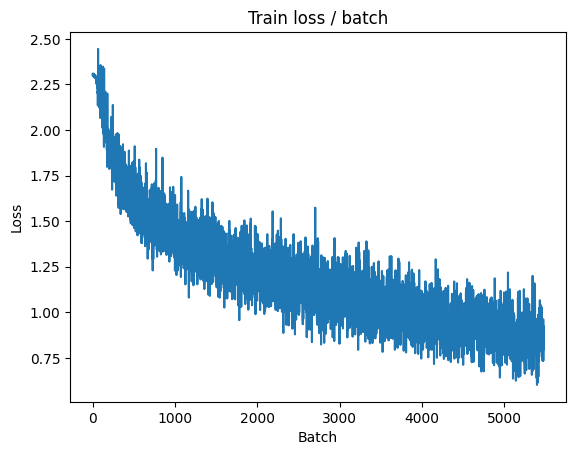

[TRAIN Batch 200/391]	Time 0.006s (0.021s)	Loss 0.9544 (0.8059)	Prec@1  68.0 ( 71.9)	Prec@5  96.9 ( 98.2)


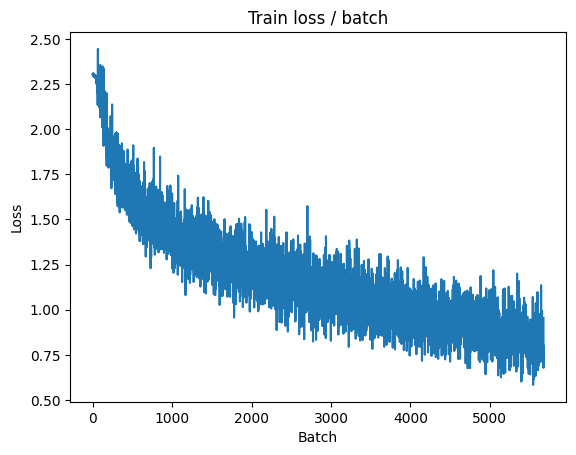


===============> Total time 8s	Avg loss 0.8228	Avg Prec@1 70.98 %	Avg Prec@5 98.09 %

[EVAL Batch 000/079]	Time 0.176s (0.176s)	Loss 1.0386 (1.0386)	Prec@1  63.3 ( 63.3)	Prec@5  95.3 ( 95.3)

===============> Total time 1s	Avg loss 1.0886	Avg Prec@1 62.36 %	Avg Prec@5 96.48 %



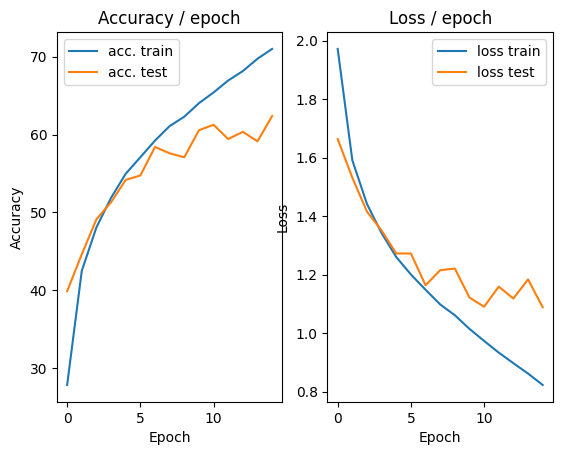

=== EPOCH 16 =====

[TRAIN Batch 000/391]	Time 0.171s (0.171s)	Loss 0.6800 (0.6800)	Prec@1  76.6 ( 76.6)	Prec@5 100.0 (100.0)


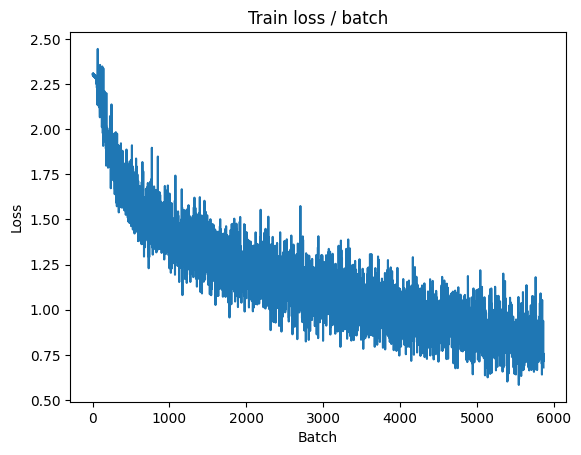

[TRAIN Batch 200/391]	Time 0.006s (0.021s)	Loss 0.8266 (0.7780)	Prec@1  70.3 ( 72.6)	Prec@5  96.9 ( 98.4)


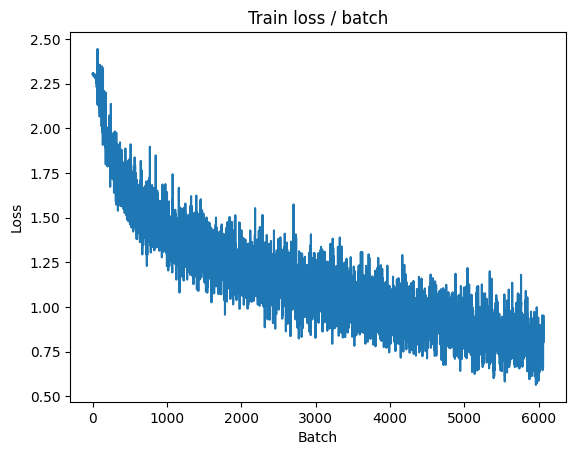


===============> Total time 8s	Avg loss 0.7857	Avg Prec@1 72.40 %	Avg Prec@5 98.30 %

[EVAL Batch 000/079]	Time 0.148s (0.148s)	Loss 1.1383 (1.1383)	Prec@1  57.8 ( 57.8)	Prec@5  95.3 ( 95.3)

===============> Total time 2s	Avg loss 1.1744	Avg Prec@1 60.09 %	Avg Prec@5 95.96 %



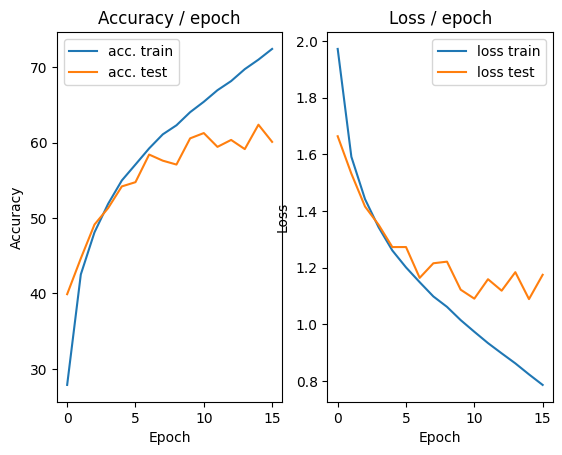

=== EPOCH 17 =====

[TRAIN Batch 000/391]	Time 0.184s (0.184s)	Loss 0.6376 (0.6376)	Prec@1  74.2 ( 74.2)	Prec@5  99.2 ( 99.2)


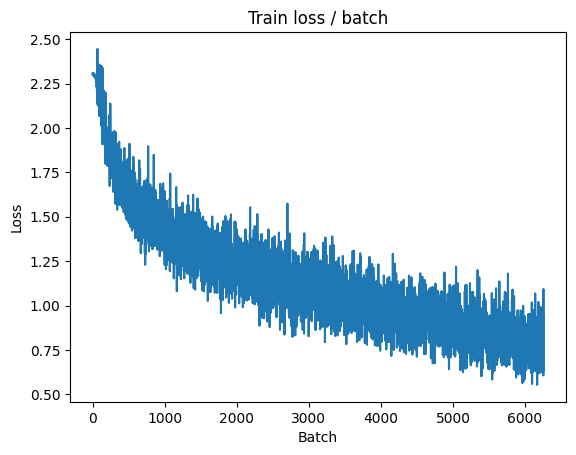

[TRAIN Batch 200/391]	Time 0.033s (0.023s)	Loss 0.6970 (0.7307)	Prec@1  75.0 ( 74.6)	Prec@5 100.0 ( 98.5)


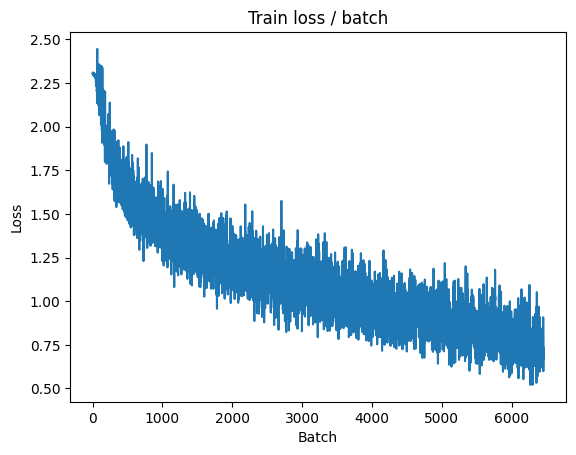


===============> Total time 8s	Avg loss 0.7501	Avg Prec@1 73.85 %	Avg Prec@5 98.42 %

[EVAL Batch 000/079]	Time 0.144s (0.144s)	Loss 1.0122 (1.0122)	Prec@1  66.4 ( 66.4)	Prec@5  94.5 ( 94.5)

===============> Total time 1s	Avg loss 1.1233	Avg Prec@1 61.94 %	Avg Prec@5 96.09 %



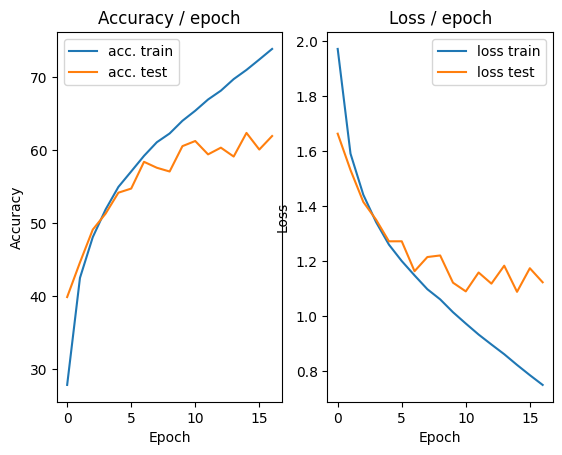

=== EPOCH 18 =====

[TRAIN Batch 000/391]	Time 0.176s (0.176s)	Loss 0.5977 (0.5977)	Prec@1  78.9 ( 78.9)	Prec@5 100.0 (100.0)


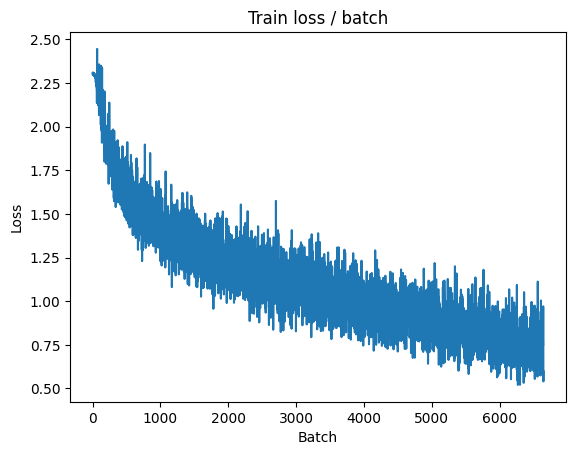

[TRAIN Batch 200/391]	Time 0.006s (0.026s)	Loss 0.8334 (0.7030)	Prec@1  69.5 ( 75.3)	Prec@5  99.2 ( 98.7)


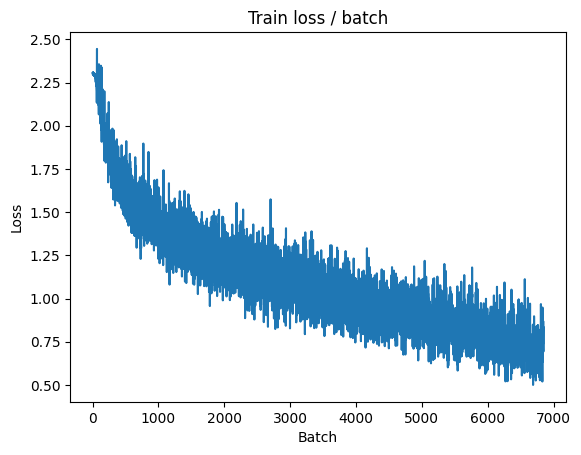


===============> Total time 9s	Avg loss 0.7150	Avg Prec@1 74.91 %	Avg Prec@5 98.67 %

[EVAL Batch 000/079]	Time 0.141s (0.141s)	Loss 1.1847 (1.1847)	Prec@1  60.2 ( 60.2)	Prec@5  95.3 ( 95.3)

===============> Total time 1s	Avg loss 1.1187	Avg Prec@1 63.15 %	Avg Prec@5 96.01 %



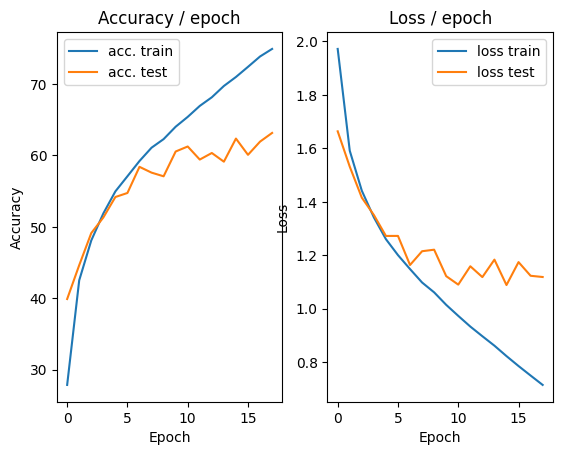

=== EPOCH 19 =====

[TRAIN Batch 000/391]	Time 0.181s (0.181s)	Loss 0.6328 (0.6328)	Prec@1  77.3 ( 77.3)	Prec@5  99.2 ( 99.2)


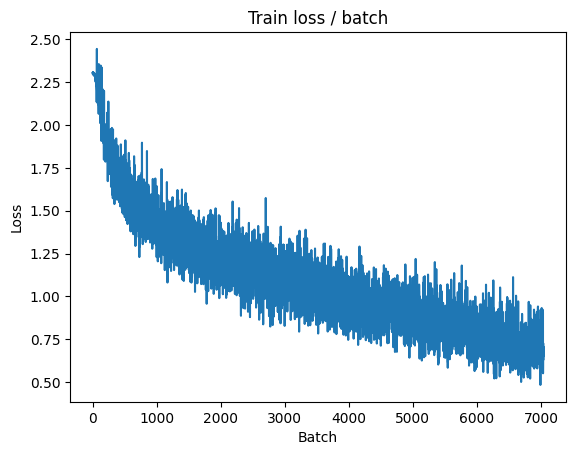

[TRAIN Batch 200/391]	Time 0.032s (0.026s)	Loss 0.7861 (0.6627)	Prec@1  67.2 ( 77.0)	Prec@5  98.4 ( 98.8)


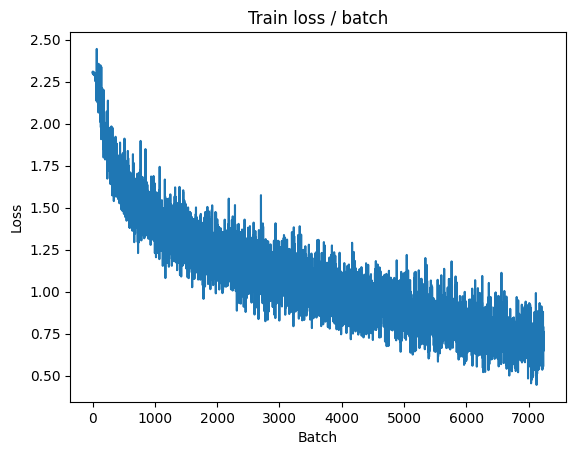


===============> Total time 9s	Avg loss 0.6709	Avg Prec@1 76.46 %	Avg Prec@5 98.85 %

[EVAL Batch 000/079]	Time 0.140s (0.140s)	Loss 1.2346 (1.2346)	Prec@1  65.6 ( 65.6)	Prec@5  94.5 ( 94.5)

===============> Total time 1s	Avg loss 1.2041	Avg Prec@1 60.74 %	Avg Prec@5 95.69 %



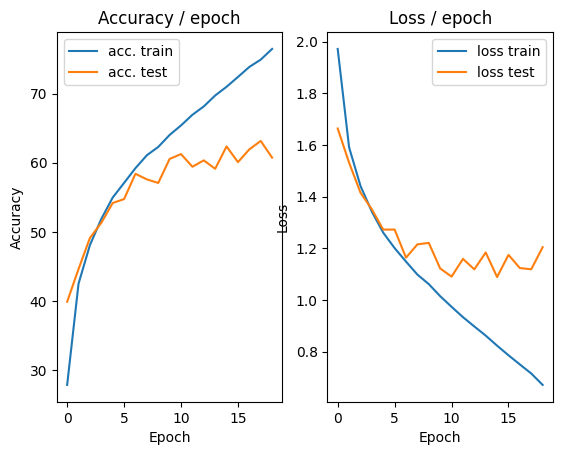

=== EPOCH 20 =====

[TRAIN Batch 000/391]	Time 0.176s (0.176s)	Loss 0.7864 (0.7864)	Prec@1  82.0 ( 82.0)	Prec@5  96.9 ( 96.9)


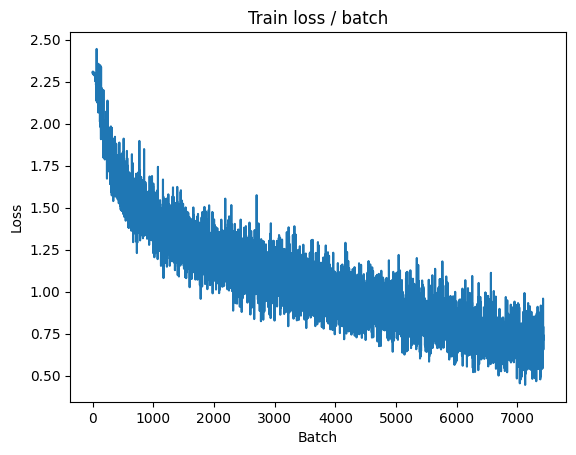

[TRAIN Batch 200/391]	Time 0.036s (0.022s)	Loss 0.5590 (0.6157)	Prec@1  82.0 ( 78.9)	Prec@5 100.0 ( 99.1)


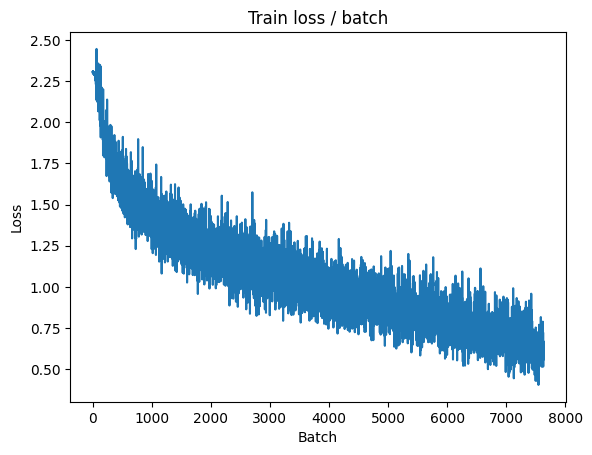


===============> Total time 9s	Avg loss 0.6338	Avg Prec@1 77.95 %	Avg Prec@5 98.98 %

[EVAL Batch 000/079]	Time 0.155s (0.155s)	Loss 1.2384 (1.2384)	Prec@1  60.2 ( 60.2)	Prec@5  95.3 ( 95.3)

===============> Total time 1s	Avg loss 1.2443	Avg Prec@1 60.29 %	Avg Prec@5 95.62 %



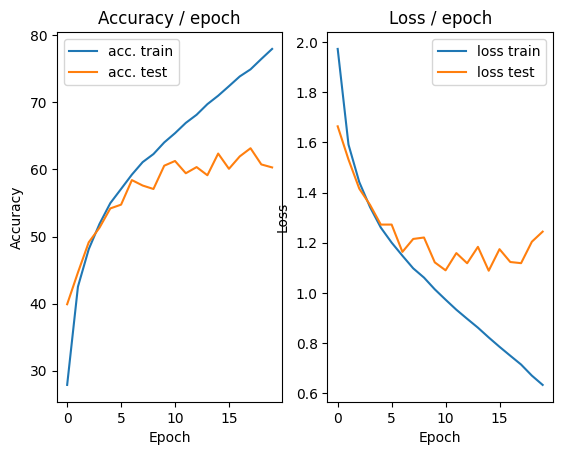

In [ ]:
main(batch_size=128, lr=0.1, epochs=20,cuda=True)

# Partie 3

## Standardization of exemples

In [ ]:
class ConvNet(nn.Module):
    """
    This class defines the structure of the neural network
    """

    def __init__(self):
        super(ConvNet, self).__init__()
        # We first define the convolution and pooling layers as a features extractor
        self.features = nn.Sequential(
            nn.Conv2d(3, 6, (5, 5), stride=1, padding=2),
            nn.Tanh(),
            nn.MaxPool2d((2, 2), stride=2, padding=0),
            nn.Conv2d(6, 16, (5, 5), stride=1, padding=0),
            nn.Tanh(),
            nn.MaxPool2d((2, 2), stride=2, padding=0),
        )
        # We then define fully connected layers as a classifier
        self.classifier = nn.Sequential(
            nn.Linear(576, 256),
            nn.Tanh(),
            nn.Linear(256, 84),
            nn.Tanh(),
            nn.Linear(84, 10)
            # Reminder: The softmax is included in the loss, do not put it here
        )

    # Method called when we apply the network to an input batch
    def forward(self, input):
        bsize = input.size(0) # batch size
        output = self.features(input) # output of the conv layers
        output = output.view(bsize, -1) # we flatten the 2D feature maps into one 1D vector for each input
        output = self.classifier(output) # we compute the output of the fc layers
        return output



def get_dataset(batch_size, cuda=False):
    """
    This function loads the dataset and performs transformations on each
    image (listed in `transform = ...`).
    """
    train_dataset = datasets.CIFAR10(PATH, train=True, download=True,
        transform=transforms.Compose([
            transforms.ToTensor(),
            transforms.Normalize([0.491, 0.482, 0.447],[0.202, 0.199, 0.201])
        ]))



    val_dataset = datasets.CIFAR10(PATH, train=False, download=True,
        transform=transforms.Compose([
            transforms.ToTensor(),
            transforms.Normalize([0.491, 0.482, 0.447],[0.202, 0.199, 0.201])
        ]))

    train_loader = torch.utils.data.DataLoader(train_dataset,
                        batch_size=batch_size, shuffle=True, pin_memory=cuda, num_workers=2)
    val_loader = torch.utils.data.DataLoader(val_dataset,
                        batch_size=batch_size, shuffle=False, pin_memory=cuda, num_workers=2)

    return train_loader, val_loader



def epoch(data, model, criterion, optimizer=None, cuda=False):
    """
    Make a pass (called epoch in English) on the data `data` with the
     model `model`. Evaluates `criterion` as loss.
     If `optimizer` is given, perform a training epoch using
     the given optimizer, otherwise, perform an evaluation epoch (no backward)
     of the model.
    """

    # indicates whether the model is in eval or train mode (some layers behave differently in train and eval)
    model.eval() if optimizer is None else model.train()

    # objects to store metric averages
    avg_loss = AverageMeter()
    avg_top1_acc = AverageMeter()
    avg_top5_acc = AverageMeter()
    avg_batch_time = AverageMeter()
    global loss_plot

    # we iterate on the batches
    tic = time.time()
    for i, (input, target) in enumerate(data):

        if cuda: # only with GPU, and not with CPU
            input = input.cuda()
            target = target.cuda()

        # forward
        output = model(input)
        loss = criterion(output, target)

        # backward if we are training
        if optimizer:
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

        # compute metrics
        prec1, prec5 = accuracy(output, target, topk=(1, 5))
        batch_time = time.time() - tic
        tic = time.time()

        # update
        avg_loss.update(loss.item())
        avg_top1_acc.update(prec1.item())
        avg_top5_acc.update(prec5.item())
        avg_batch_time.update(batch_time)
        if optimizer:
            loss_plot.update(avg_loss.val)
        # print info
        if i % PRINT_INTERVAL == 0:
            print('[{0:s} Batch {1:03d}/{2:03d}]\t'
                  'Time {batch_time.val:.3f}s ({batch_time.avg:.3f}s)\t'
                  'Loss {loss.val:.4f} ({loss.avg:.4f})\t'
                  'Prec@1 {top1.val:5.1f} ({top1.avg:5.1f})\t'
                  'Prec@5 {top5.val:5.1f} ({top5.avg:5.1f})'.format(
                   "EVAL" if optimizer is None else "TRAIN", i, len(data), batch_time=avg_batch_time, loss=avg_loss,
                   top1=avg_top1_acc, top5=avg_top5_acc))
            if optimizer:
                loss_plot.plot()

    # Print summary
    print('\n===============> Total time {batch_time:d}s\t'
          'Avg loss {loss.avg:.4f}\t'
          'Avg Prec@1 {top1.avg:5.2f} %\t'
          'Avg Prec@5 {top5.avg:5.2f} %\n'.format(
           batch_time=int(avg_batch_time.sum), loss=avg_loss,
           top1=avg_top1_acc, top5=avg_top5_acc))

    return avg_top1_acc, avg_top5_acc, avg_loss


def main(batch_size=128, lr=0.1, epochs=5, cuda=False):

    # ex :
    #   {"batch_size": 128, "epochs": 5, "lr": 0.1}

    # define model, loss, optim
    model = ConvNet()
    criterion = nn.CrossEntropyLoss()
    optimizer = torch.optim.SGD(model.parameters(), lr)

    if cuda: # only with GPU, and not with CPU
        cudnn.benchmark = True
        model = model.cuda()
        criterion = criterion.cuda()

    # Get the data
    train, test = get_dataset(batch_size, cuda)

    # init plots
    plot = AccLossPlot()
    global loss_plot
    loss_plot = TrainLossPlot()

    # We iterate on the epochs
    for i in range(epochs):
        print("=================\n=== EPOCH "+str(i+1)+" =====\n=================\n")
        # Train phase
        top1_acc, avg_top5_acc, loss = epoch(train, model, criterion, optimizer, cuda)
        # Test phase
        top1_acc_test, top5_acc_test, loss_test = epoch(test, model, criterion, cuda=cuda)
        # plot
        plot.update(loss.avg, loss_test.avg, top1_acc.avg, top1_acc_test.avg)


Files already downloaded and verified
Files already downloaded and verified
=== EPOCH 1 =====

[TRAIN Batch 000/391]	Time 0.164s (0.164s)	Loss 2.3015 (2.3015)	Prec@1  11.7 ( 11.7)	Prec@5  48.4 ( 48.4)


<Figure size 640x480 with 0 Axes>

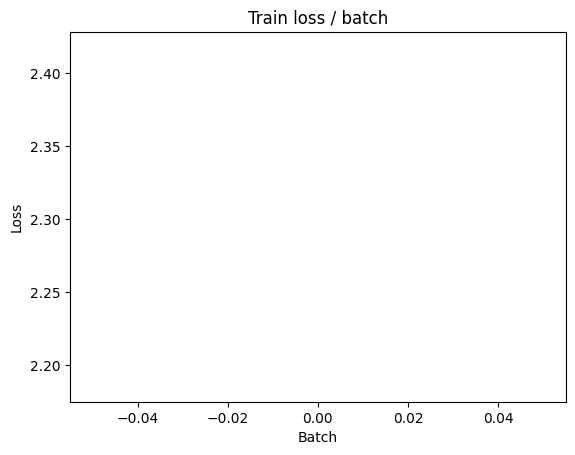

[TRAIN Batch 200/391]	Time 0.102s (0.035s)	Loss 1.7041 (1.8934)	Prec@1  39.1 ( 31.9)	Prec@5  86.7 ( 81.3)


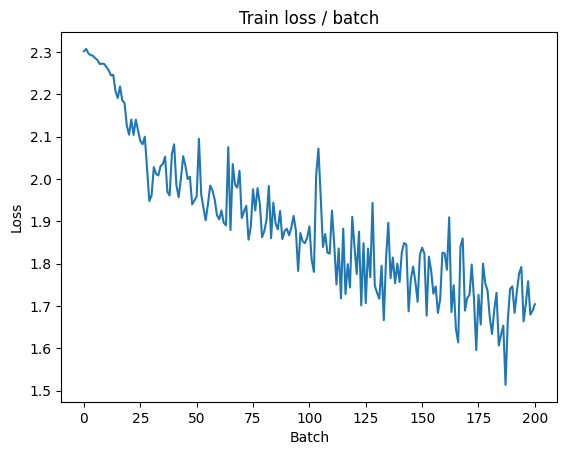


===============> Total time 12s	Avg loss 1.7630	Avg Prec@1 37.01 %	Avg Prec@5 84.84 %

[EVAL Batch 000/079]	Time 0.155s (0.155s)	Loss 1.5798 (1.5798)	Prec@1  43.0 ( 43.0)	Prec@5  92.2 ( 92.2)

===============> Total time 2s	Avg loss 1.6469	Avg Prec@1 40.25 %	Avg Prec@5 88.31 %



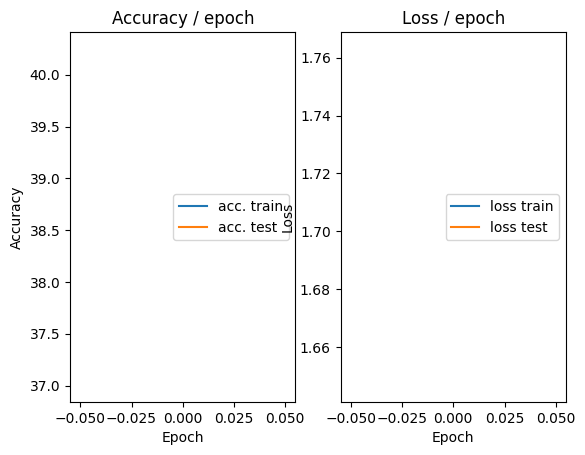

=== EPOCH 2 =====

[TRAIN Batch 000/391]	Time 0.158s (0.158s)	Loss 1.6134 (1.6134)	Prec@1  39.8 ( 39.8)	Prec@5  85.9 ( 85.9)


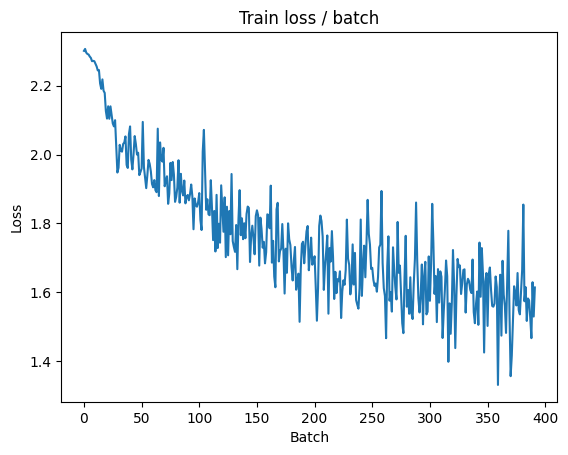

[TRAIN Batch 200/391]	Time 0.047s (0.036s)	Loss 1.5751 (1.4993)	Prec@1  36.7 ( 46.6)	Prec@5  93.0 ( 90.9)


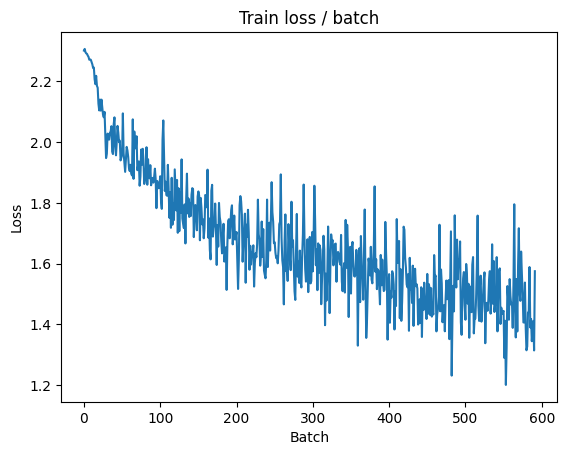


===============> Total time 12s	Avg loss 1.4551	Avg Prec@1 48.11 %	Avg Prec@5 91.61 %

[EVAL Batch 000/079]	Time 0.174s (0.174s)	Loss 1.3538 (1.3538)	Prec@1  56.2 ( 56.2)	Prec@5  89.8 ( 89.8)

===============> Total time 2s	Avg loss 1.4297	Avg Prec@1 49.64 %	Avg Prec@5 91.51 %



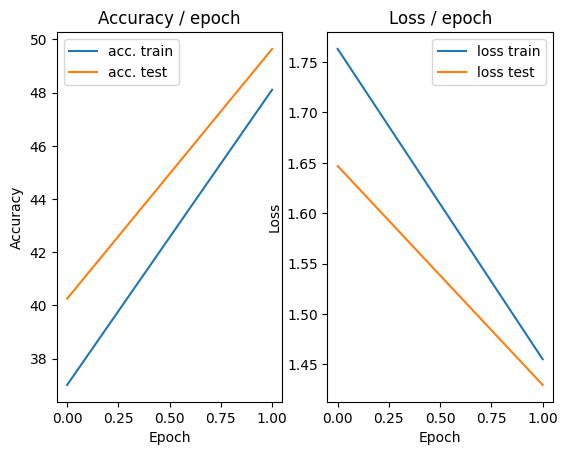

=== EPOCH 3 =====

[TRAIN Batch 000/391]	Time 0.283s (0.283s)	Loss 1.2788 (1.2788)	Prec@1  54.7 ( 54.7)	Prec@5  93.8 ( 93.8)


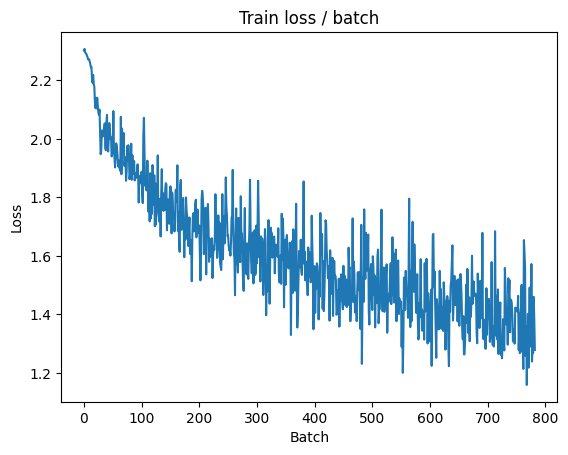

[TRAIN Batch 200/391]	Time 0.004s (0.034s)	Loss 1.2686 (1.3263)	Prec@1  57.0 ( 52.5)	Prec@5  91.4 ( 93.8)


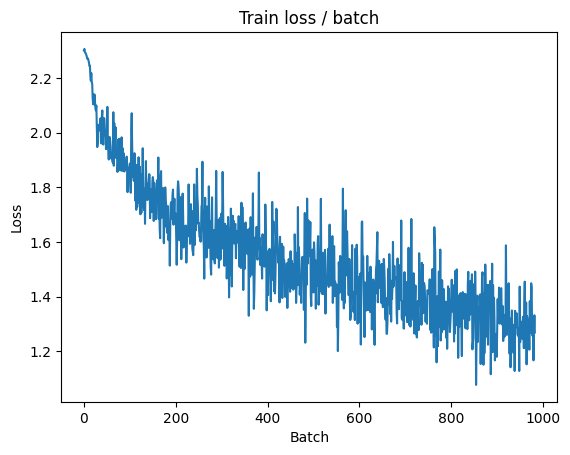


===============> Total time 13s	Avg loss 1.3096	Avg Prec@1 53.34 %	Avg Prec@5 93.88 %

[EVAL Batch 000/079]	Time 0.275s (0.275s)	Loss 1.3006 (1.3006)	Prec@1  54.7 ( 54.7)	Prec@5  89.8 ( 89.8)

===============> Total time 3s	Avg loss 1.4140	Avg Prec@1 48.94 %	Avg Prec@5 91.98 %



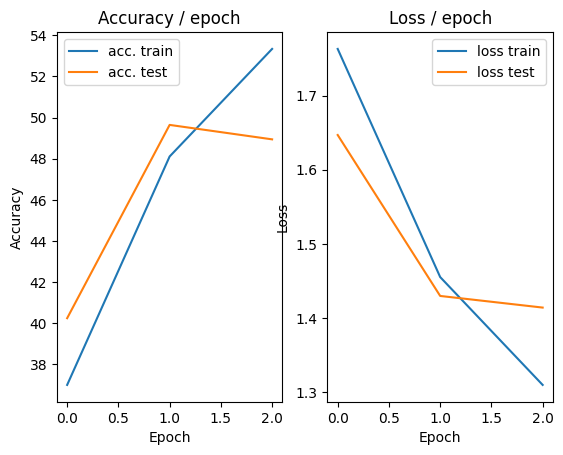

=== EPOCH 4 =====

[TRAIN Batch 000/391]	Time 0.180s (0.180s)	Loss 1.4458 (1.4458)	Prec@1  49.2 ( 49.2)	Prec@5  89.8 ( 89.8)


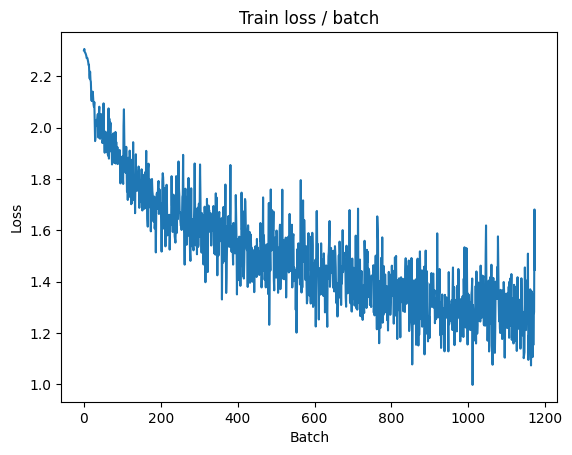

[TRAIN Batch 200/391]	Time 0.004s (0.031s)	Loss 1.2980 (1.2212)	Prec@1  53.9 ( 56.3)	Prec@5  96.9 ( 94.7)


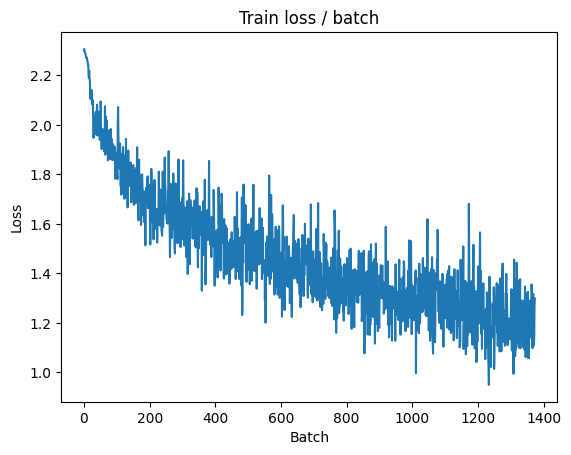


===============> Total time 13s	Avg loss 1.2072	Avg Prec@1 57.10 %	Avg Prec@5 94.99 %

[EVAL Batch 000/079]	Time 0.165s (0.165s)	Loss 1.0976 (1.0976)	Prec@1  62.5 ( 62.5)	Prec@5  93.8 ( 93.8)

===============> Total time 2s	Avg loss 1.2082	Avg Prec@1 56.60 %	Avg Prec@5 94.97 %



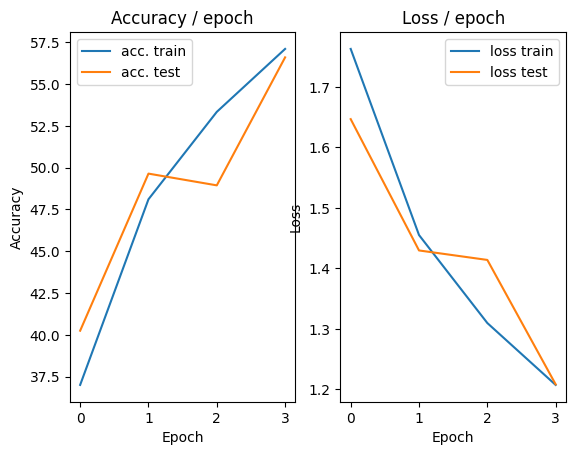

=== EPOCH 5 =====

[TRAIN Batch 000/391]	Time 0.182s (0.182s)	Loss 1.2144 (1.2144)	Prec@1  57.8 ( 57.8)	Prec@5  94.5 ( 94.5)


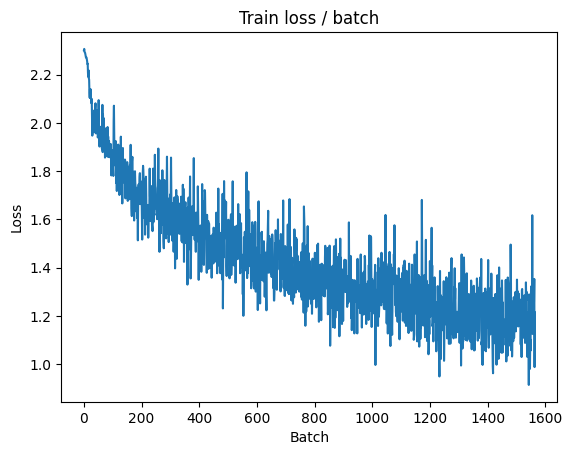

[TRAIN Batch 200/391]	Time 0.003s (0.033s)	Loss 1.0356 (1.1383)	Prec@1  61.7 ( 59.5)	Prec@5  98.4 ( 95.7)


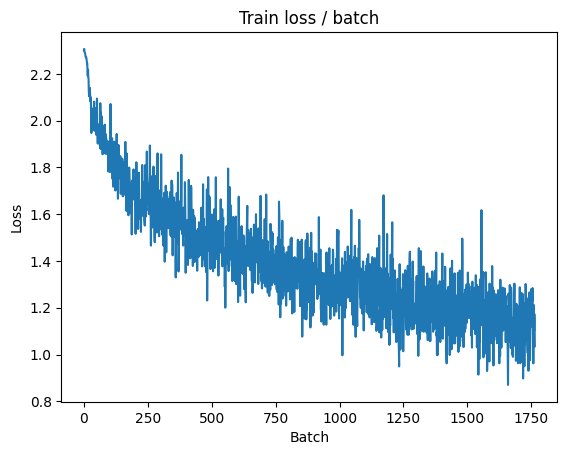


===============> Total time 12s	Avg loss 1.1362	Avg Prec@1 59.52 %	Avg Prec@5 95.75 %

[EVAL Batch 000/079]	Time 0.140s (0.140s)	Loss 1.1919 (1.1919)	Prec@1  58.6 ( 58.6)	Prec@5  95.3 ( 95.3)

===============> Total time 2s	Avg loss 1.2651	Avg Prec@1 55.76 %	Avg Prec@5 94.68 %



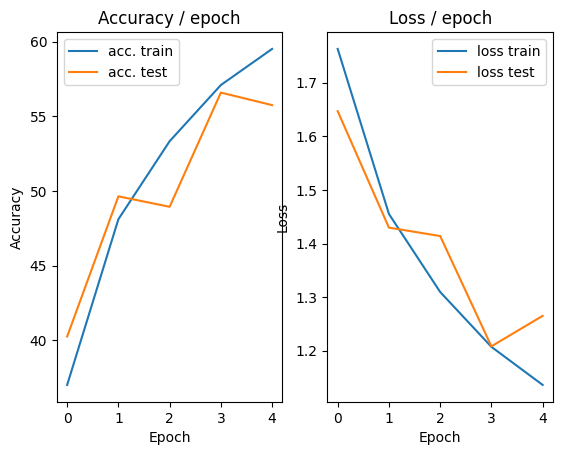

=== EPOCH 6 =====

[TRAIN Batch 000/391]	Time 0.179s (0.179s)	Loss 1.2239 (1.2239)	Prec@1  53.1 ( 53.1)	Prec@5  93.8 ( 93.8)


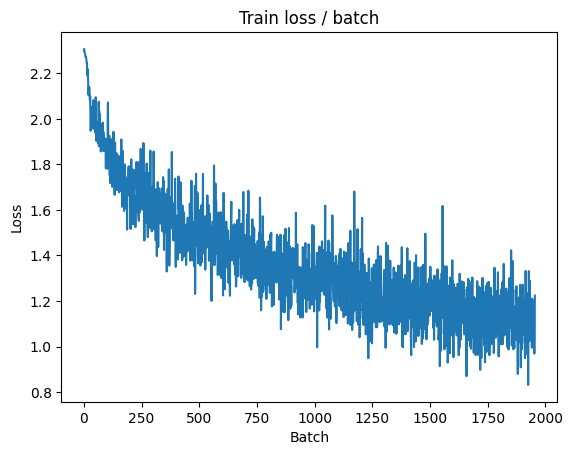

[TRAIN Batch 200/391]	Time 0.004s (0.038s)	Loss 1.0674 (1.0871)	Prec@1  64.8 ( 61.5)	Prec@5  96.9 ( 96.1)


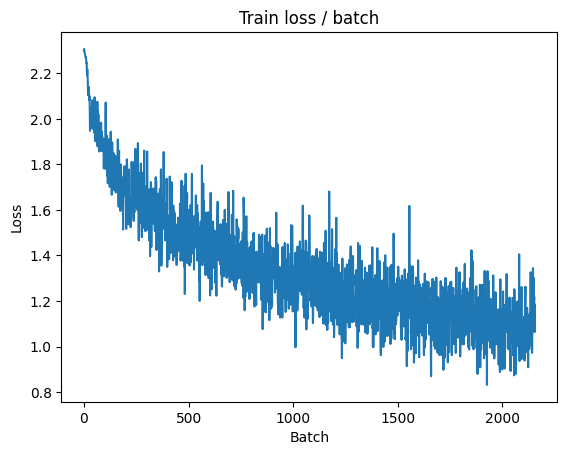


===============> Total time 13s	Avg loss 1.0876	Avg Prec@1 61.61 %	Avg Prec@5 96.12 %

[EVAL Batch 000/079]	Time 0.152s (0.152s)	Loss 0.9908 (0.9908)	Prec@1  66.4 ( 66.4)	Prec@5  96.9 ( 96.9)

===============> Total time 2s	Avg loss 1.1497	Avg Prec@1 58.95 %	Avg Prec@5 95.35 %



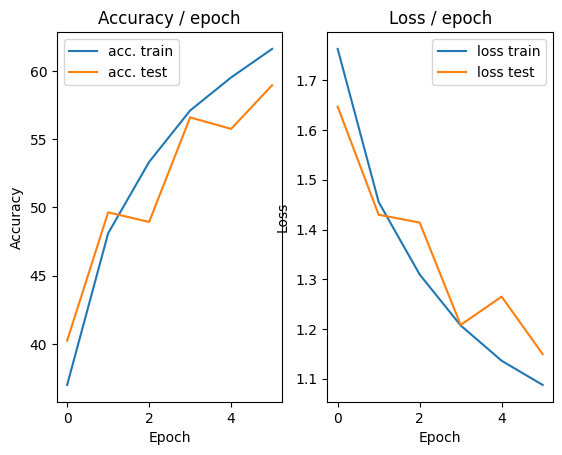

=== EPOCH 7 =====

[TRAIN Batch 000/391]	Time 0.292s (0.292s)	Loss 1.0459 (1.0459)	Prec@1  63.3 ( 63.3)	Prec@5  96.9 ( 96.9)


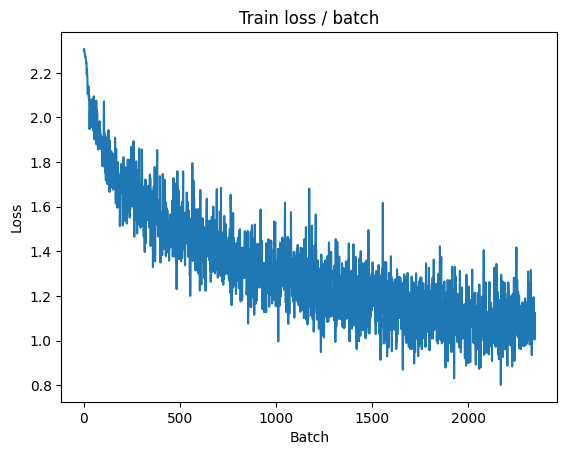

[TRAIN Batch 200/391]	Time 0.004s (0.036s)	Loss 1.0501 (1.0454)	Prec@1  61.7 ( 63.2)	Prec@5  96.9 ( 96.5)


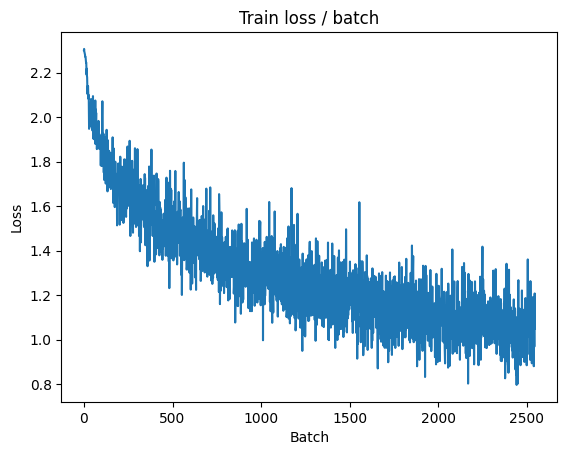


===============> Total time 13s	Avg loss 1.0425	Avg Prec@1 63.19 %	Avg Prec@5 96.60 %

[EVAL Batch 000/079]	Time 0.183s (0.183s)	Loss 1.0270 (1.0270)	Prec@1  63.3 ( 63.3)	Prec@5  95.3 ( 95.3)

===============> Total time 3s	Avg loss 1.1177	Avg Prec@1 59.99 %	Avg Prec@5 95.79 %



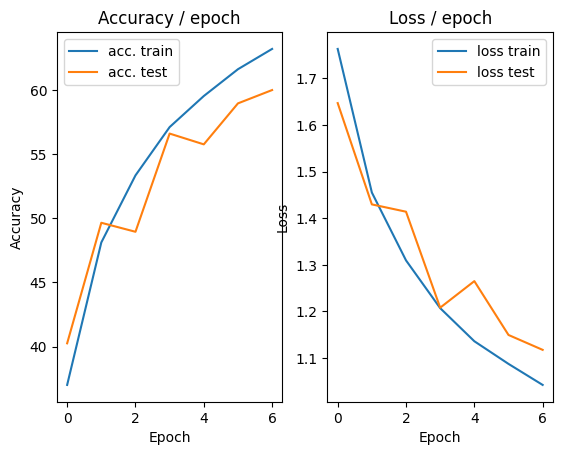

=== EPOCH 8 =====

[TRAIN Batch 000/391]	Time 0.186s (0.186s)	Loss 0.9668 (0.9668)	Prec@1  61.7 ( 61.7)	Prec@5  97.7 ( 97.7)


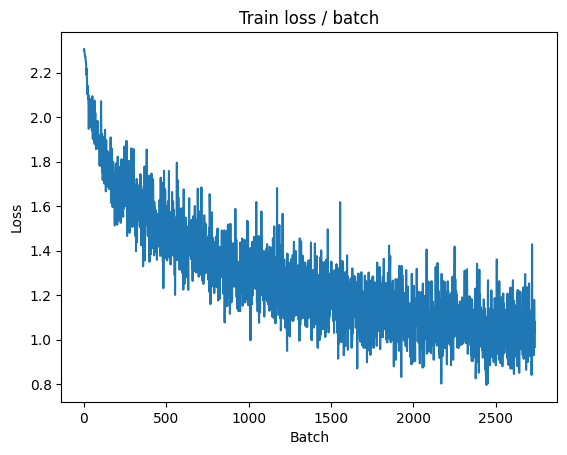

[TRAIN Batch 200/391]	Time 0.004s (0.031s)	Loss 0.9092 (1.0078)	Prec@1  71.9 ( 64.3)	Prec@5  96.1 ( 96.8)


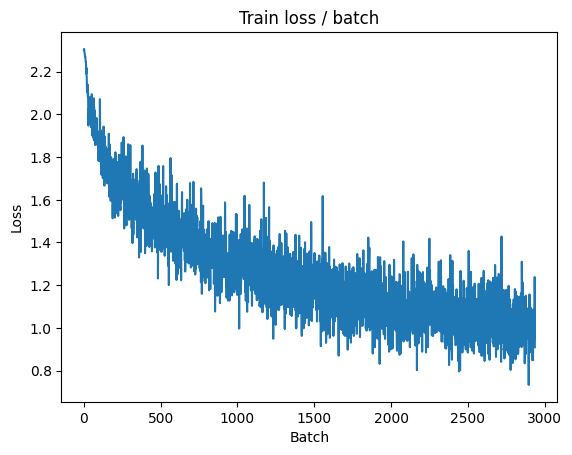


===============> Total time 13s	Avg loss 1.0025	Avg Prec@1 64.51 %	Avg Prec@5 96.92 %

[EVAL Batch 000/079]	Time 0.159s (0.159s)	Loss 1.0180 (1.0180)	Prec@1  59.4 ( 59.4)	Prec@5  96.1 ( 96.1)

===============> Total time 2s	Avg loss 1.1046	Avg Prec@1 60.80 %	Avg Prec@5 95.90 %



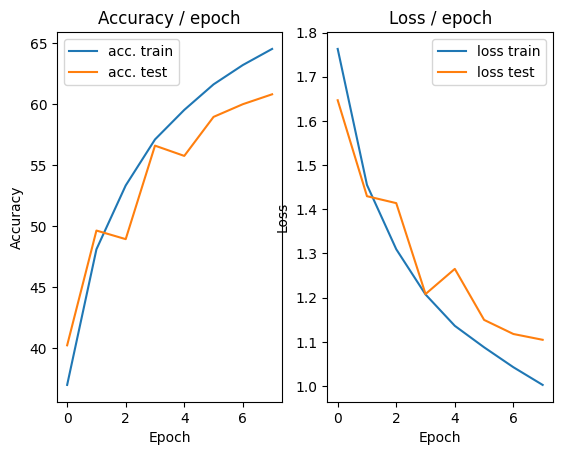

=== EPOCH 9 =====

[TRAIN Batch 000/391]	Time 0.179s (0.179s)	Loss 0.7542 (0.7542)	Prec@1  71.1 ( 71.1)	Prec@5  98.4 ( 98.4)


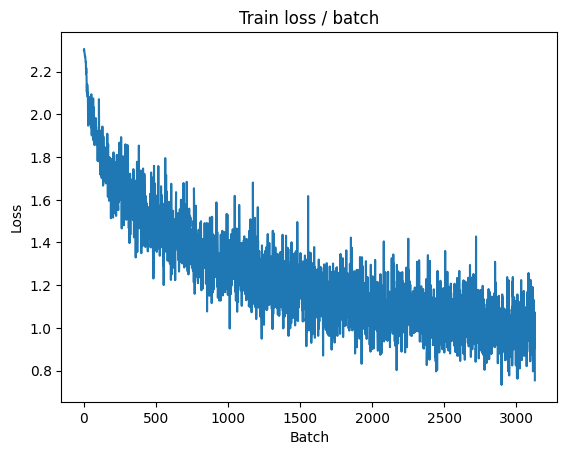

[TRAIN Batch 200/391]	Time 0.092s (0.032s)	Loss 0.7972 (0.9628)	Prec@1  73.4 ( 66.3)	Prec@5  98.4 ( 97.1)


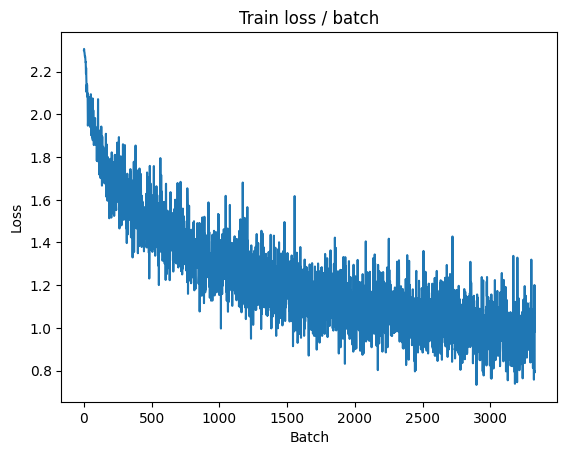


===============> Total time 13s	Avg loss 0.9592	Avg Prec@1 66.16 %	Avg Prec@5 97.21 %

[EVAL Batch 000/079]	Time 0.157s (0.157s)	Loss 0.9495 (0.9495)	Prec@1  64.8 ( 64.8)	Prec@5  96.9 ( 96.9)

===============> Total time 2s	Avg loss 1.1488	Avg Prec@1 59.89 %	Avg Prec@5 95.65 %



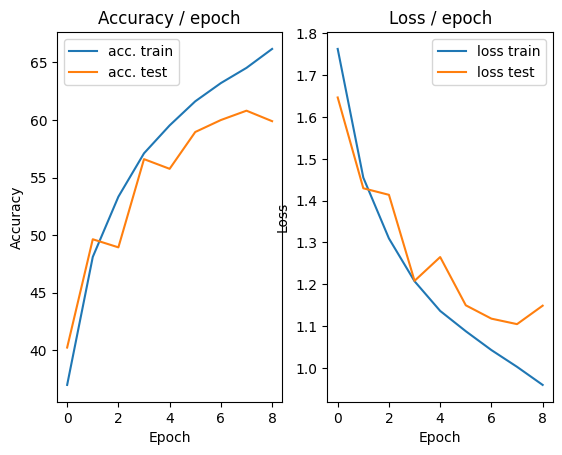

=== EPOCH 10 =====

[TRAIN Batch 000/391]	Time 0.177s (0.177s)	Loss 1.0425 (1.0425)	Prec@1  57.8 ( 57.8)	Prec@5  93.8 ( 93.8)


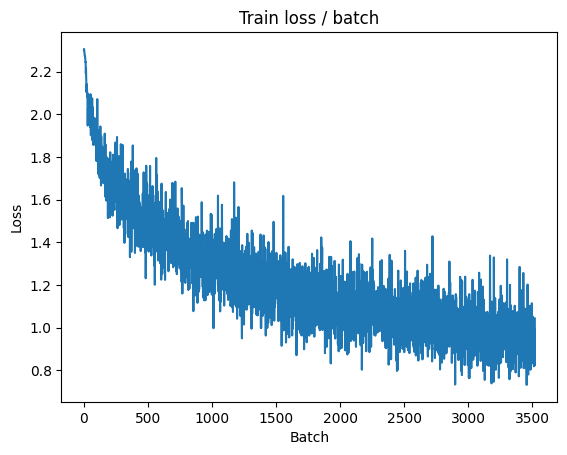

[TRAIN Batch 200/391]	Time 0.056s (0.036s)	Loss 0.9383 (0.9211)	Prec@1  71.1 ( 67.4)	Prec@5  96.1 ( 97.5)


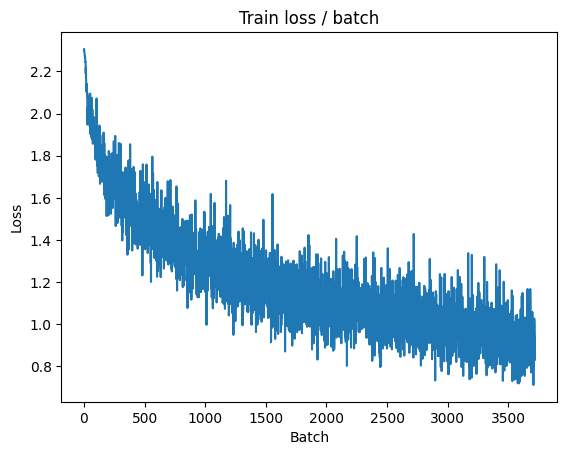


===============> Total time 12s	Avg loss 0.9252	Avg Prec@1 67.15 %	Avg Prec@5 97.48 %

[EVAL Batch 000/079]	Time 0.157s (0.157s)	Loss 0.9304 (0.9304)	Prec@1  69.5 ( 69.5)	Prec@5  96.1 ( 96.1)

===============> Total time 2s	Avg loss 1.0492	Avg Prec@1 63.13 %	Avg Prec@5 96.36 %



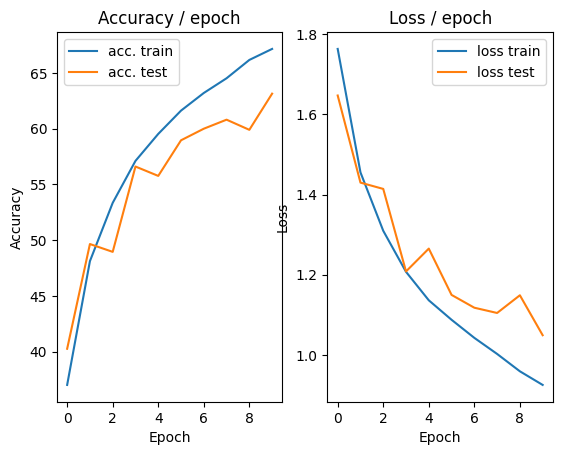

=== EPOCH 11 =====

[TRAIN Batch 000/391]	Time 0.250s (0.250s)	Loss 0.9814 (0.9814)	Prec@1  63.3 ( 63.3)	Prec@5  98.4 ( 98.4)


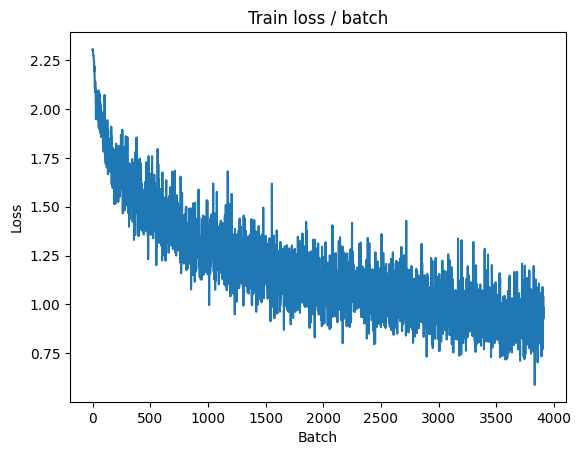

[TRAIN Batch 200/391]	Time 0.034s (0.037s)	Loss 0.8947 (0.8808)	Prec@1  64.8 ( 68.8)	Prec@5  97.7 ( 97.9)


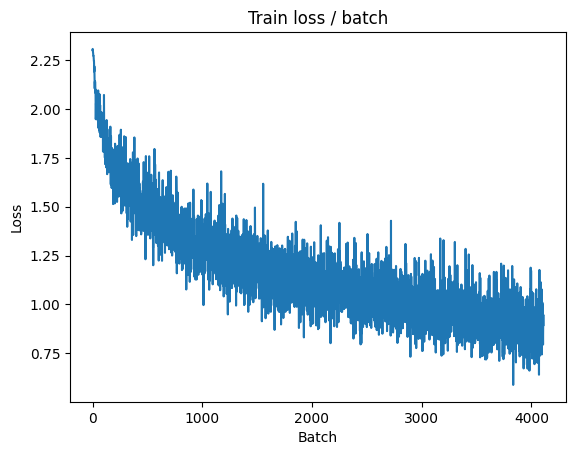


===============> Total time 13s	Avg loss 0.8892	Avg Prec@1 68.50 %	Avg Prec@5 97.75 %

[EVAL Batch 000/079]	Time 0.256s (0.256s)	Loss 0.9846 (0.9846)	Prec@1  71.1 ( 71.1)	Prec@5  95.3 ( 95.3)

===============> Total time 3s	Avg loss 1.1204	Avg Prec@1 61.58 %	Avg Prec@5 95.93 %



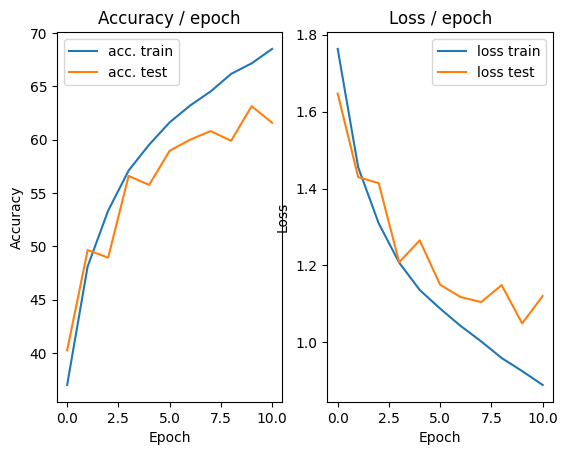

=== EPOCH 12 =====

[TRAIN Batch 000/391]	Time 0.176s (0.176s)	Loss 0.9924 (0.9924)	Prec@1  68.0 ( 68.0)	Prec@5  97.7 ( 97.7)


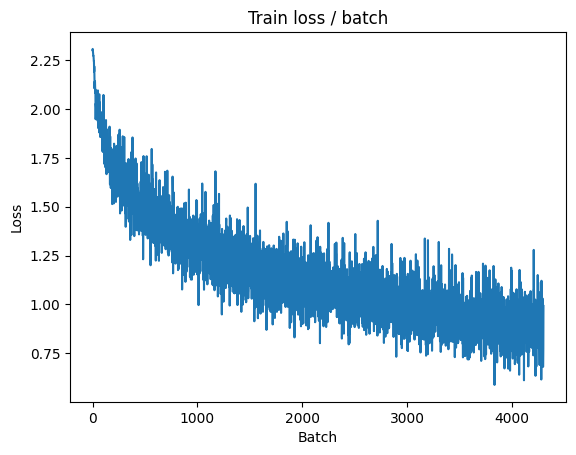

[TRAIN Batch 200/391]	Time 0.052s (0.031s)	Loss 0.8177 (0.8457)	Prec@1  71.9 ( 70.1)	Prec@5  96.1 ( 98.0)


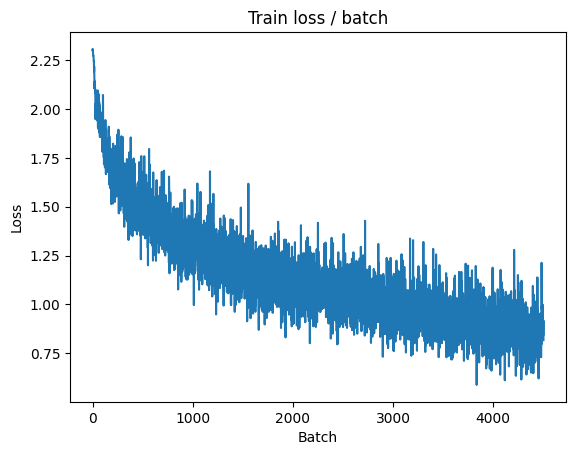


===============> Total time 12s	Avg loss 0.8520	Avg Prec@1 69.83 %	Avg Prec@5 97.96 %

[EVAL Batch 000/079]	Time 0.149s (0.149s)	Loss 0.9561 (0.9561)	Prec@1  68.0 ( 68.0)	Prec@5  96.1 ( 96.1)

===============> Total time 2s	Avg loss 1.0900	Avg Prec@1 61.89 %	Avg Prec@5 96.30 %



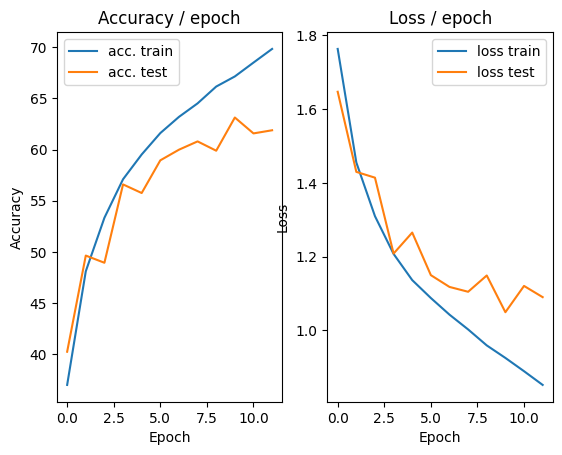

=== EPOCH 13 =====

[TRAIN Batch 000/391]	Time 0.184s (0.184s)	Loss 0.9840 (0.9840)	Prec@1  67.2 ( 67.2)	Prec@5  96.1 ( 96.1)


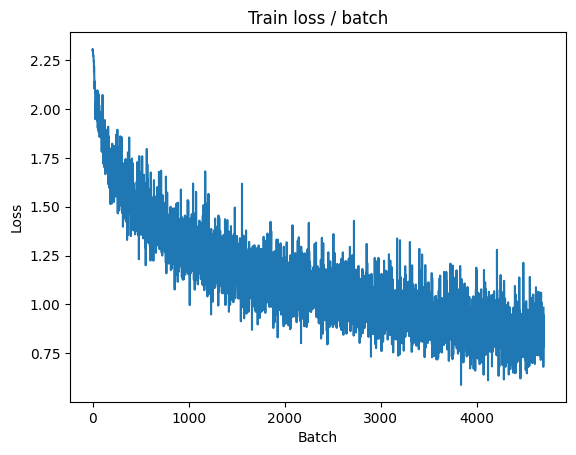

[TRAIN Batch 200/391]	Time 0.007s (0.032s)	Loss 0.9651 (0.8028)	Prec@1  70.3 ( 71.8)	Prec@5  95.3 ( 98.0)


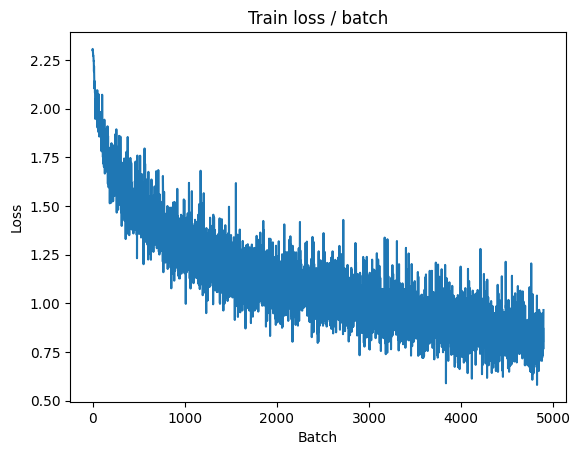


===============> Total time 13s	Avg loss 0.8146	Avg Prec@1 71.20 %	Avg Prec@5 98.07 %

[EVAL Batch 000/079]	Time 0.163s (0.163s)	Loss 0.9268 (0.9268)	Prec@1  69.5 ( 69.5)	Prec@5  96.1 ( 96.1)

===============> Total time 2s	Avg loss 1.0710	Avg Prec@1 63.25 %	Avg Prec@5 96.11 %



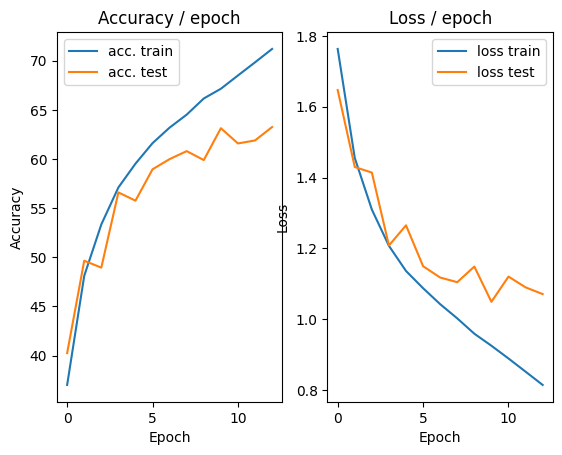

=== EPOCH 14 =====

[TRAIN Batch 000/391]	Time 0.214s (0.214s)	Loss 0.7673 (0.7673)	Prec@1  73.4 ( 73.4)	Prec@5  97.7 ( 97.7)


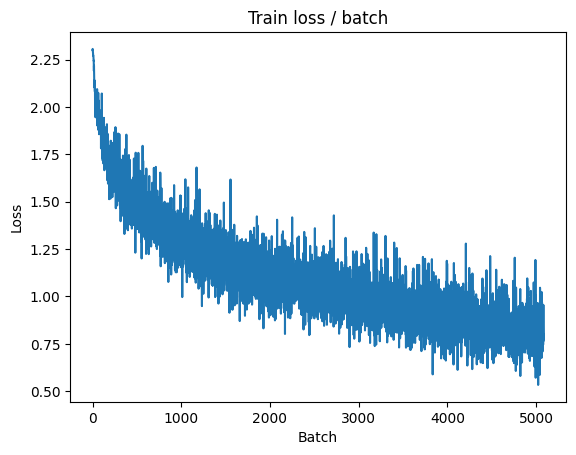

[TRAIN Batch 200/391]	Time 0.005s (0.037s)	Loss 0.6260 (0.7661)	Prec@1  82.8 ( 73.0)	Prec@5  98.4 ( 98.4)


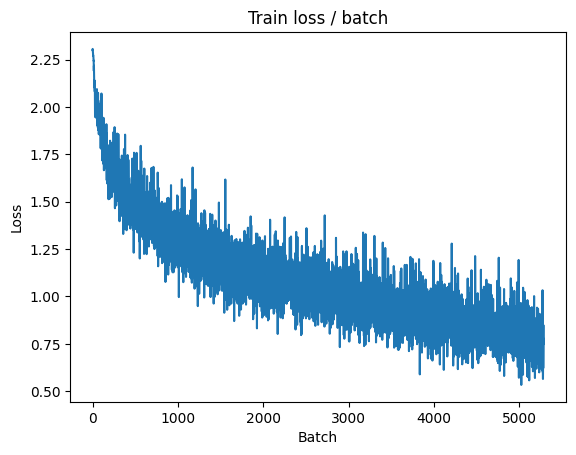


===============> Total time 13s	Avg loss 0.7782	Avg Prec@1 72.53 %	Avg Prec@5 98.34 %

[EVAL Batch 000/079]	Time 0.159s (0.159s)	Loss 0.9618 (0.9618)	Prec@1  69.5 ( 69.5)	Prec@5  95.3 ( 95.3)

===============> Total time 2s	Avg loss 1.0927	Avg Prec@1 62.11 %	Avg Prec@5 96.15 %



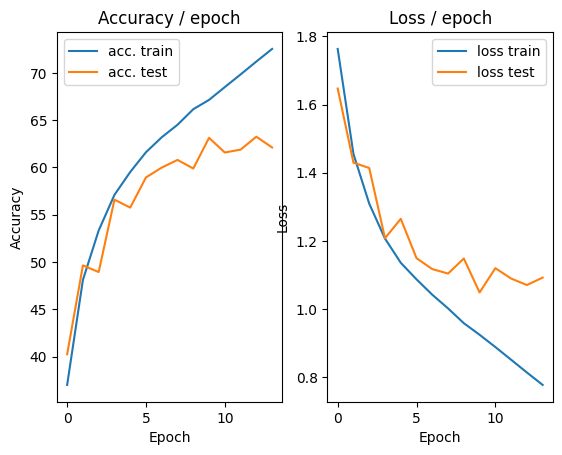

=== EPOCH 15 =====

[TRAIN Batch 000/391]	Time 0.190s (0.190s)	Loss 0.7639 (0.7639)	Prec@1  76.6 ( 76.6)	Prec@5  98.4 ( 98.4)


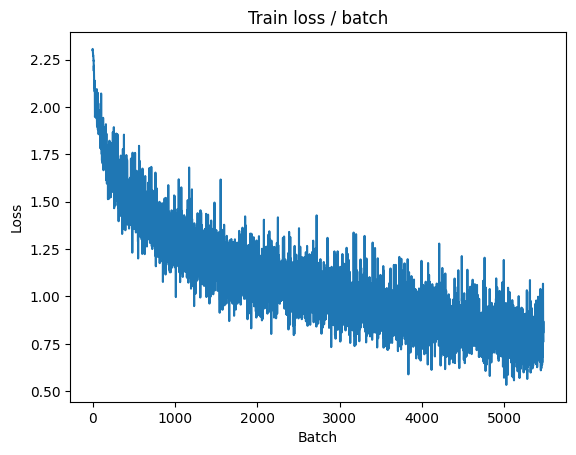

[TRAIN Batch 200/391]	Time 0.043s (0.037s)	Loss 0.7150 (0.7267)	Prec@1  73.4 ( 74.3)	Prec@5  97.7 ( 98.7)


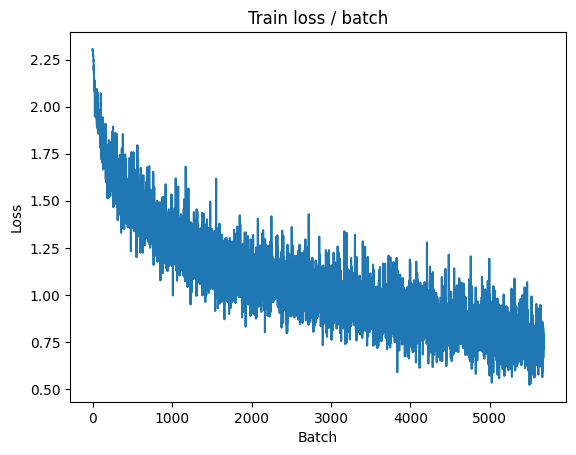


===============> Total time 13s	Avg loss 0.7409	Avg Prec@1 73.71 %	Avg Prec@5 98.59 %

[EVAL Batch 000/079]	Time 0.259s (0.259s)	Loss 1.0178 (1.0178)	Prec@1  68.8 ( 68.8)	Prec@5  95.3 ( 95.3)

===============> Total time 3s	Avg loss 1.1299	Avg Prec@1 62.06 %	Avg Prec@5 95.82 %



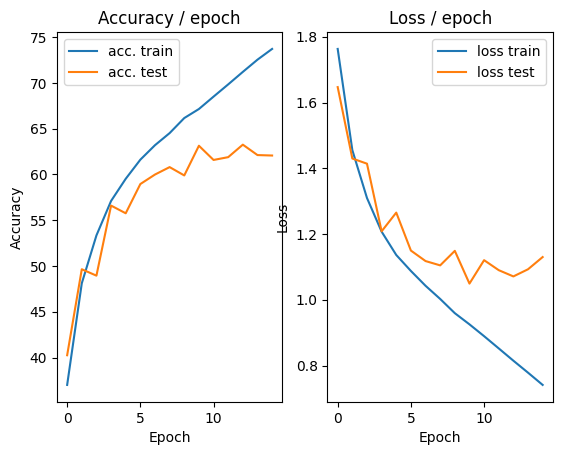

=== EPOCH 16 =====

[TRAIN Batch 000/391]	Time 0.194s (0.194s)	Loss 0.7552 (0.7552)	Prec@1  69.5 ( 69.5)	Prec@5  98.4 ( 98.4)


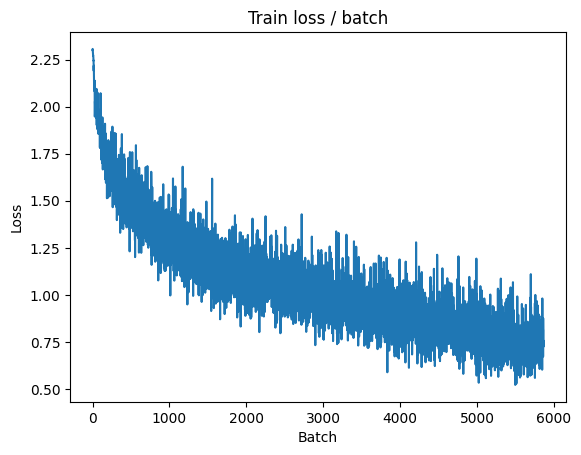

[TRAIN Batch 200/391]	Time 0.004s (0.032s)	Loss 0.7146 (0.6780)	Prec@1  71.9 ( 76.2)	Prec@5  98.4 ( 98.8)


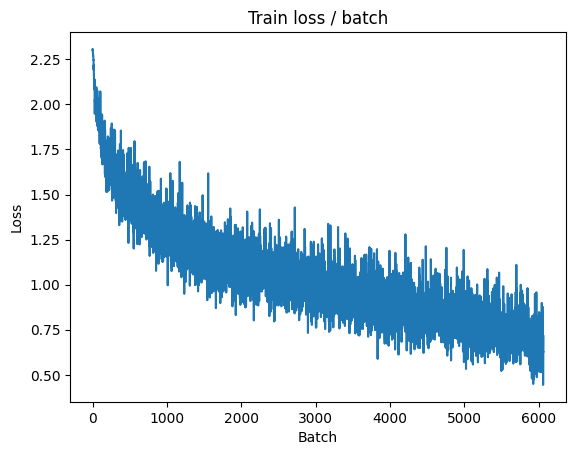


===============> Total time 13s	Avg loss 0.7026	Avg Prec@1 75.37 %	Avg Prec@5 98.68 %

[EVAL Batch 000/079]	Time 0.163s (0.163s)	Loss 1.0183 (1.0183)	Prec@1  66.4 ( 66.4)	Prec@5  96.1 ( 96.1)

===============> Total time 2s	Avg loss 1.1071	Avg Prec@1 62.69 %	Avg Prec@5 96.24 %



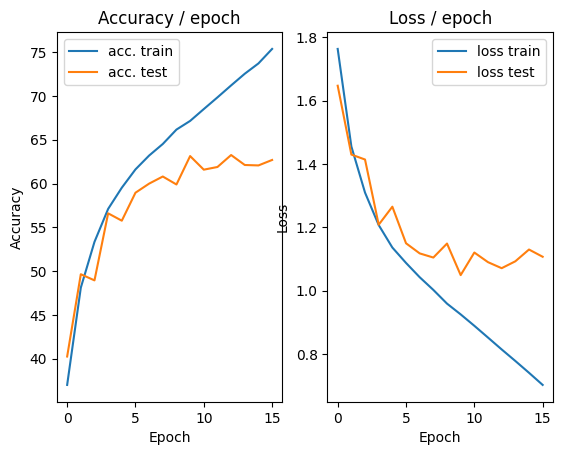

=== EPOCH 17 =====

[TRAIN Batch 000/391]	Time 0.198s (0.198s)	Loss 0.6230 (0.6230)	Prec@1  77.3 ( 77.3)	Prec@5  99.2 ( 99.2)


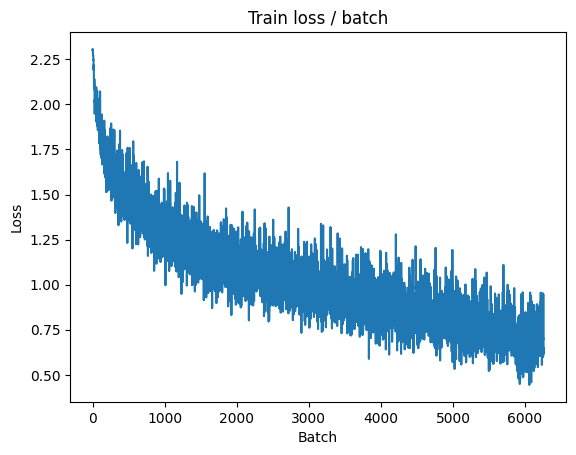

[TRAIN Batch 200/391]	Time 0.004s (0.032s)	Loss 0.6196 (0.6595)	Prec@1  78.9 ( 77.0)	Prec@5  99.2 ( 98.8)


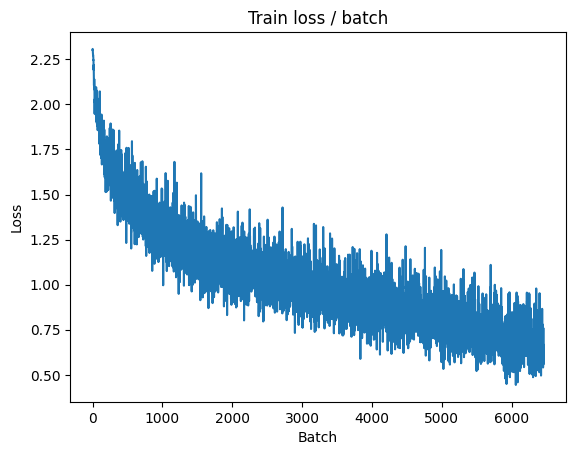


===============> Total time 13s	Avg loss 0.6708	Avg Prec@1 76.41 %	Avg Prec@5 98.84 %

[EVAL Batch 000/079]	Time 0.159s (0.159s)	Loss 1.0488 (1.0488)	Prec@1  67.2 ( 67.2)	Prec@5  95.3 ( 95.3)

===============> Total time 2s	Avg loss 1.1547	Avg Prec@1 62.31 %	Avg Prec@5 95.92 %



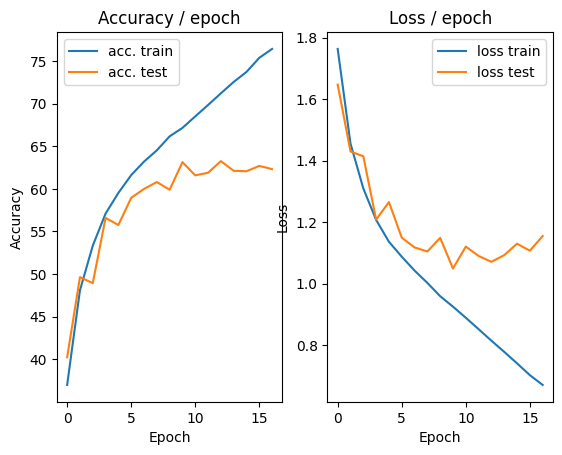

=== EPOCH 18 =====

[TRAIN Batch 000/391]	Time 0.200s (0.200s)	Loss 0.5617 (0.5617)	Prec@1  82.0 ( 82.0)	Prec@5  99.2 ( 99.2)


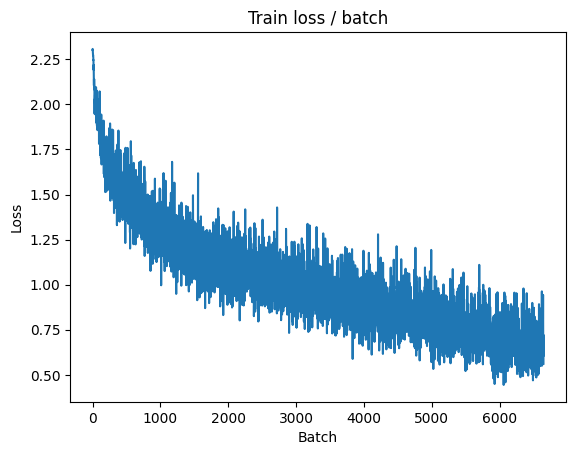

[TRAIN Batch 200/391]	Time 0.052s (0.037s)	Loss 0.8148 (0.6099)	Prec@1  72.7 ( 78.7)	Prec@5  97.7 ( 99.1)


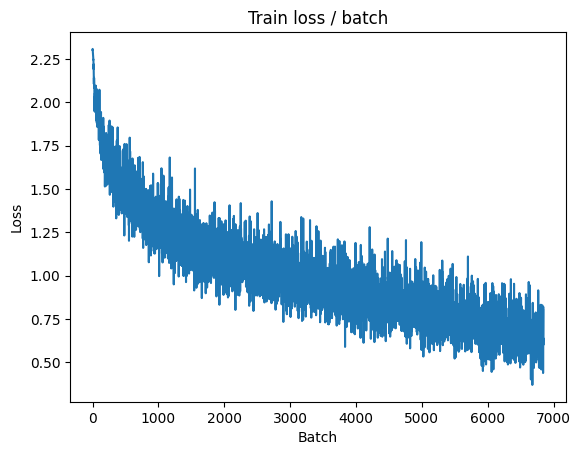


===============> Total time 13s	Avg loss 0.6301	Avg Prec@1 77.86 %	Avg Prec@5 99.06 %

[EVAL Batch 000/079]	Time 0.165s (0.165s)	Loss 1.0591 (1.0591)	Prec@1  61.7 ( 61.7)	Prec@5  95.3 ( 95.3)

===============> Total time 2s	Avg loss 1.1535	Avg Prec@1 62.40 %	Avg Prec@5 96.36 %



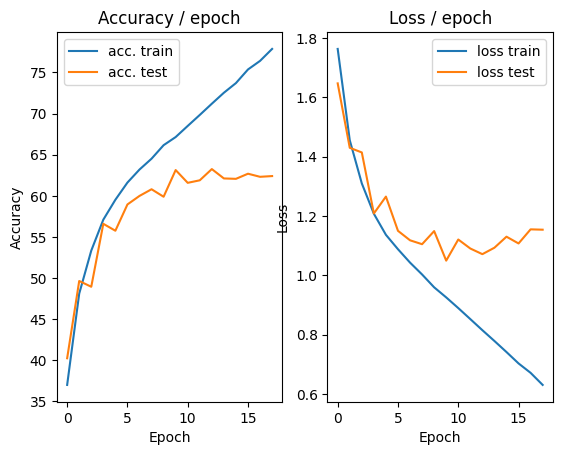

=== EPOCH 19 =====

[TRAIN Batch 000/391]	Time 0.208s (0.208s)	Loss 0.5802 (0.5802)	Prec@1  81.2 ( 81.2)	Prec@5  99.2 ( 99.2)


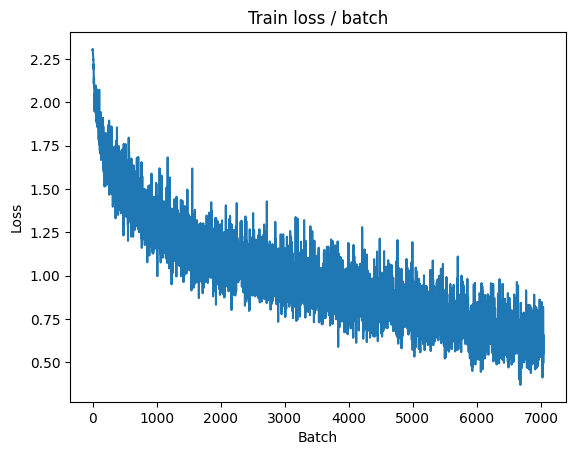

[TRAIN Batch 200/391]	Time 0.004s (0.037s)	Loss 0.5899 (0.5719)	Prec@1  82.8 ( 80.0)	Prec@5  96.9 ( 99.2)


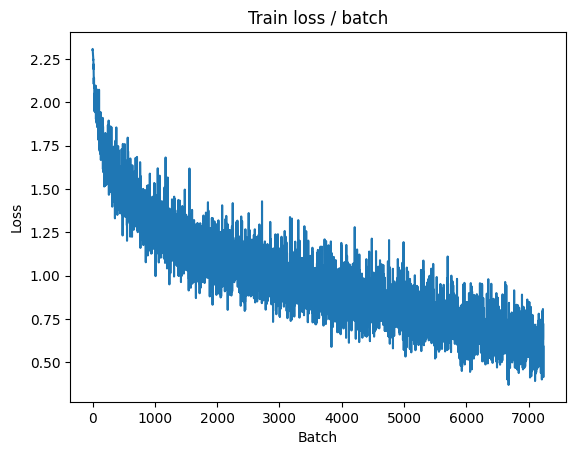


===============> Total time 13s	Avg loss 0.5977	Avg Prec@1 78.89 %	Avg Prec@5 99.09 %

[EVAL Batch 000/079]	Time 0.154s (0.154s)	Loss 1.0841 (1.0841)	Prec@1  64.8 ( 64.8)	Prec@5  96.1 ( 96.1)

===============> Total time 3s	Avg loss 1.2148	Avg Prec@1 61.70 %	Avg Prec@5 96.00 %



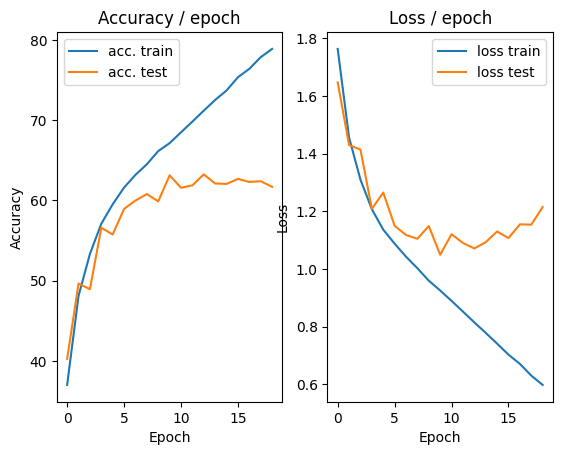

=== EPOCH 20 =====

[TRAIN Batch 000/391]	Time 0.199s (0.199s)	Loss 0.6155 (0.6155)	Prec@1  75.8 ( 75.8)	Prec@5 100.0 (100.0)


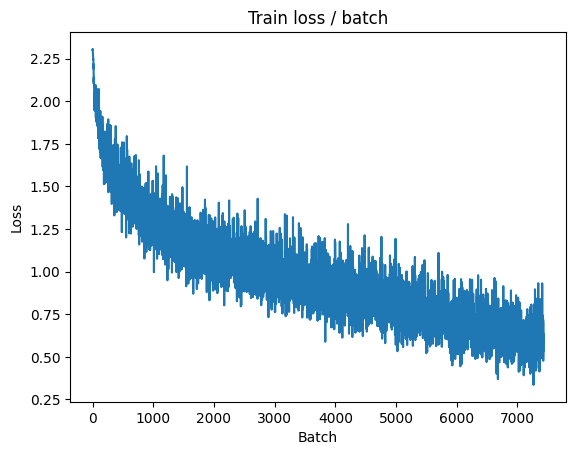

[TRAIN Batch 200/391]	Time 0.045s (0.031s)	Loss 0.4702 (0.5333)	Prec@1  82.0 ( 81.3)	Prec@5  99.2 ( 99.4)


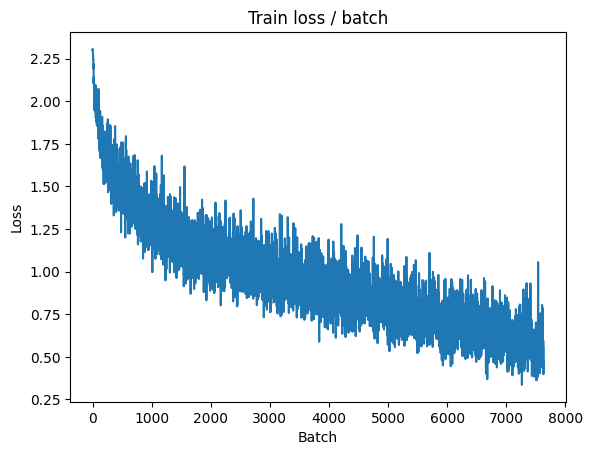


===============> Total time 13s	Avg loss 0.5565	Avg Prec@1 80.36 %	Avg Prec@5 99.33 %

[EVAL Batch 000/079]	Time 0.161s (0.161s)	Loss 1.1375 (1.1375)	Prec@1  66.4 ( 66.4)	Prec@5  95.3 ( 95.3)

===============> Total time 2s	Avg loss 1.3355	Avg Prec@1 59.51 %	Avg Prec@5 95.84 %



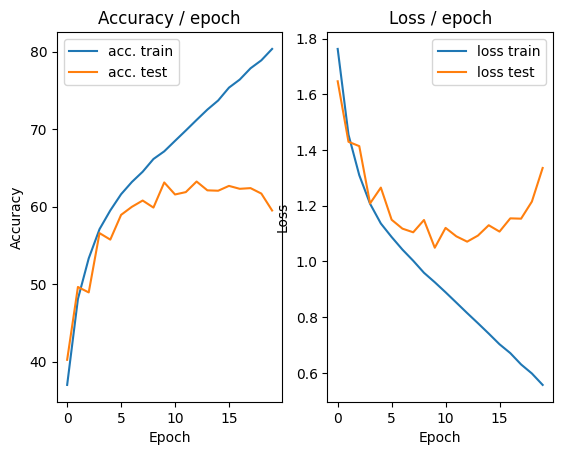

In [ ]:
main(batch_size=128, lr=0.1, epochs=20,cuda=True)

## Increase in the number of training examples by data increase

In [ ]:
class ConvNet(nn.Module):
    """
    This class defines the structure of the neural network
    """

    def __init__(self):
        super(ConvNet, self).__init__()
        # We first define the convolution and pooling layers as a features extractor
        self.features = nn.Sequential(
            nn.Conv2d(3, 6, (5, 5), stride=1, padding=2),
            nn.Tanh(),
            nn.MaxPool2d((2, 2), stride=2, padding=0),
            nn.Conv2d(6, 16, (5, 5), stride=1, padding=0),
            nn.Tanh(),
            nn.MaxPool2d((2, 2), stride=2, padding=0),
        )
        # We then define fully connected layers as a classifier
        self.classifier = nn.Sequential(
            nn.Linear(400, 256),
            nn.Tanh(),
            nn.Linear(256, 84),
            nn.Tanh(),
            nn.Linear(84, 10)
            # Reminder: The softmax is included in the loss, do not put it here
        )

    # Method called when we apply the network to an input batch
    def forward(self, input):
        bsize = input.size(0) # batch size
        output = self.features(input) # output of the conv layers
        output = output.view(bsize, -1) # we flatten the 2D feature maps into one 1D vector for each input
        output = self.classifier(output) # we compute the output of the fc layers
        return output



def get_dataset(batch_size, cuda=False):
    """
    This function loads the dataset and performs transformations on each
    image (listed in `transform = ...`).
    """
    train_dataset = datasets.CIFAR10(PATH, train=True, download=True,
        transform=transforms.Compose([
            transforms.RandomCrop(28),
            transforms.RandomHorizontalFlip(),
            transforms.ToTensor(),
        ]))

    val_dataset = datasets.CIFAR10(PATH, train=False, download=True,
        transform=transforms.Compose([
            transforms.CenterCrop(28),
            transforms.ToTensor()
        ]))

    train_loader = torch.utils.data.DataLoader(train_dataset,
                        batch_size=batch_size, shuffle=True, pin_memory=cuda, num_workers=2)
    val_loader = torch.utils.data.DataLoader(val_dataset,
                        batch_size=batch_size, shuffle=False, pin_memory=cuda, num_workers=2)

    return train_loader, val_loader



def epoch(data, model, criterion, optimizer=None, cuda=False):
    """
    Make a pass (called epoch in English) on the data `data` with the
     model `model`. Evaluates `criterion` as loss.
     If `optimizer` is given, perform a training epoch using
     the given optimizer, otherwise, perform an evaluation epoch (no backward)
     of the model.
    """

    # indicates whether the model is in eval or train mode (some layers behave differently in train and eval)
    model.eval() if optimizer is None else model.train()

    # objects to store metric averages
    avg_loss = AverageMeter()
    avg_top1_acc = AverageMeter()
    avg_top5_acc = AverageMeter()
    avg_batch_time = AverageMeter()
    global loss_plot

    # we iterate on the batches
    tic = time.time()
    for i, (input, target) in enumerate(data):

        if cuda: # only with GPU, and not with CPU
            input = input.cuda()
            target = target.cuda()

        # forward
        output = model(input)
        loss = criterion(output, target)

        # backward if we are training
        if optimizer:
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

        # compute metrics
        prec1, prec5 = accuracy(output, target, topk=(1, 5))
        batch_time = time.time() - tic
        tic = time.time()

        # update
        avg_loss.update(loss.item())
        avg_top1_acc.update(prec1.item())
        avg_top5_acc.update(prec5.item())
        avg_batch_time.update(batch_time)
        if optimizer:
            loss_plot.update(avg_loss.val)
        # print info
        if i % PRINT_INTERVAL == 0:
            print('[{0:s} Batch {1:03d}/{2:03d}]\t'
                  'Time {batch_time.val:.3f}s ({batch_time.avg:.3f}s)\t'
                  'Loss {loss.val:.4f} ({loss.avg:.4f})\t'
                  'Prec@1 {top1.val:5.1f} ({top1.avg:5.1f})\t'
                  'Prec@5 {top5.val:5.1f} ({top5.avg:5.1f})'.format(
                   "EVAL" if optimizer is None else "TRAIN", i, len(data), batch_time=avg_batch_time, loss=avg_loss,
                   top1=avg_top1_acc, top5=avg_top5_acc))
            if optimizer:
                loss_plot.plot()

    # Print summary
    print('\n===============> Total time {batch_time:d}s\t'
          'Avg loss {loss.avg:.4f}\t'
          'Avg Prec@1 {top1.avg:5.2f} %\t'
          'Avg Prec@5 {top5.avg:5.2f} %\n'.format(
           batch_time=int(avg_batch_time.sum), loss=avg_loss,
           top1=avg_top1_acc, top5=avg_top5_acc))

    return avg_top1_acc, avg_top5_acc, avg_loss


def main(batch_size=128, lr=0.1, epochs=5, cuda=False):

    # ex :
    #   {"batch_size": 128, "epochs": 5, "lr": 0.1}

    # define model, loss, optim
    model = ConvNet()
    criterion = nn.CrossEntropyLoss()
    optimizer = torch.optim.SGD(model.parameters(), lr)

    if cuda: # only with GPU, and not with CPU
        cudnn.benchmark = True
        model = model.cuda()
        criterion = criterion.cuda()

    # Get the data
    train, test = get_dataset(batch_size, cuda)

    # init plots
    plot = AccLossPlot()
    global loss_plot
    loss_plot = TrainLossPlot()

    # We iterate on the epochs
    for i in range(epochs):
        print("=================\n=== EPOCH "+str(i+1)+" =====\n=================\n")
        # Train phase
        top1_acc, avg_top5_acc, loss = epoch(train, model, criterion, optimizer, cuda)
        # Test phase
        top1_acc_test, top5_acc_test, loss_test = epoch(test, model, criterion, cuda=cuda)
        # plot
        plot.update(loss.avg, loss_test.avg, top1_acc.avg, top1_acc_test.avg)


Files already downloaded and verified
Files already downloaded and verified
=== EPOCH 1 =====

[TRAIN Batch 000/391]	Time 0.174s (0.174s)	Loss 2.3058 (2.3058)	Prec@1   7.0 (  7.0)	Prec@5  51.6 ( 51.6)


<Figure size 640x480 with 0 Axes>

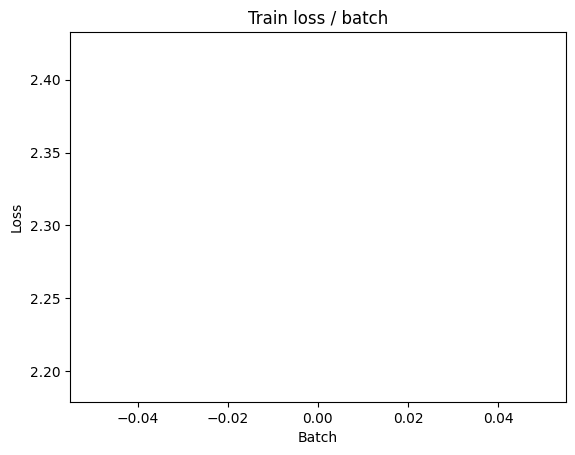

[TRAIN Batch 200/391]	Time 0.104s (0.035s)	Loss 2.1147 (2.1569)	Prec@1  32.0 ( 19.6)	Prec@5  73.4 ( 68.8)


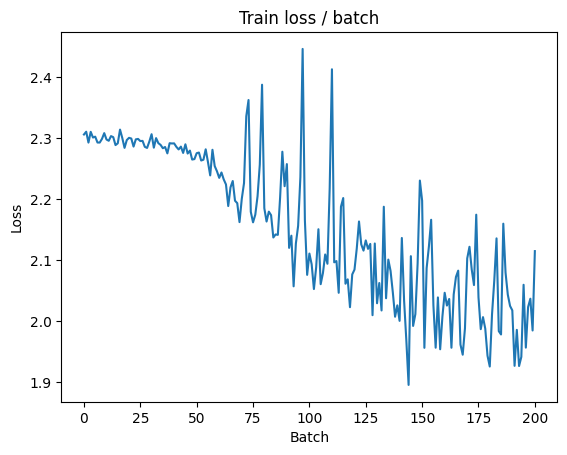


===============> Total time 12s	Avg loss 2.0249	Avg Prec@1 25.58 %	Avg Prec@5 75.25 %

[EVAL Batch 000/079]	Time 0.138s (0.138s)	Loss 1.7653 (1.7653)	Prec@1  35.9 ( 35.9)	Prec@5  90.6 ( 90.6)

===============> Total time 1s	Avg loss 1.7847	Avg Prec@1 33.71 %	Avg Prec@5 86.64 %



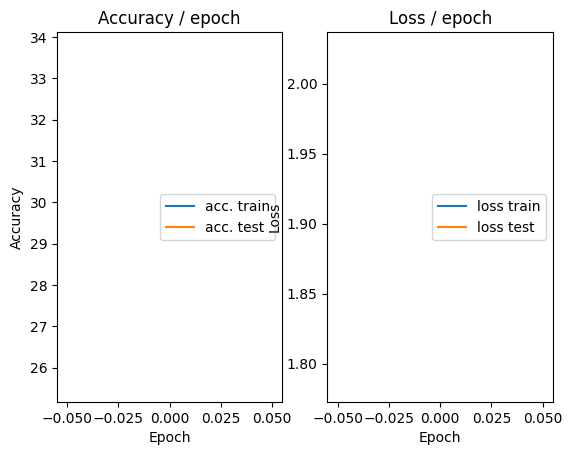

=== EPOCH 2 =====

[TRAIN Batch 000/391]	Time 0.170s (0.170s)	Loss 1.7277 (1.7277)	Prec@1  33.6 ( 33.6)	Prec@5  90.6 ( 90.6)


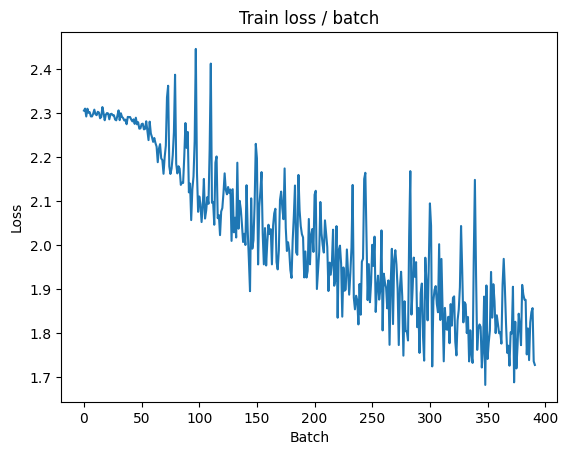

[TRAIN Batch 200/391]	Time 0.012s (0.036s)	Loss 1.7192 (1.7341)	Prec@1  34.4 ( 37.2)	Prec@5  89.8 ( 86.9)


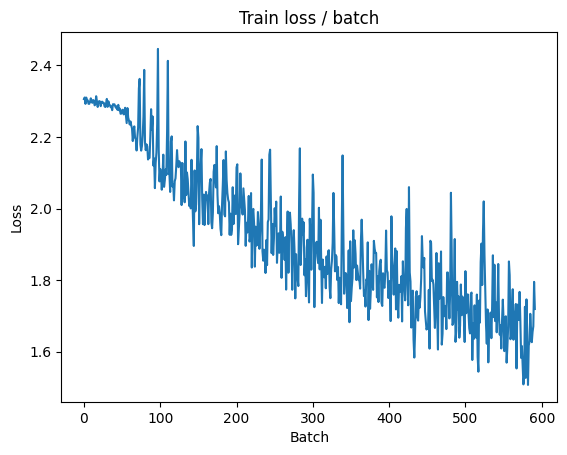


===============> Total time 13s	Avg loss 1.6807	Avg Prec@1 39.20 %	Avg Prec@5 87.88 %

[EVAL Batch 000/079]	Time 0.134s (0.134s)	Loss 1.4914 (1.4914)	Prec@1  50.0 ( 50.0)	Prec@5  91.4 ( 91.4)

===============> Total time 1s	Avg loss 1.5105	Avg Prec@1 46.48 %	Avg Prec@5 91.05 %



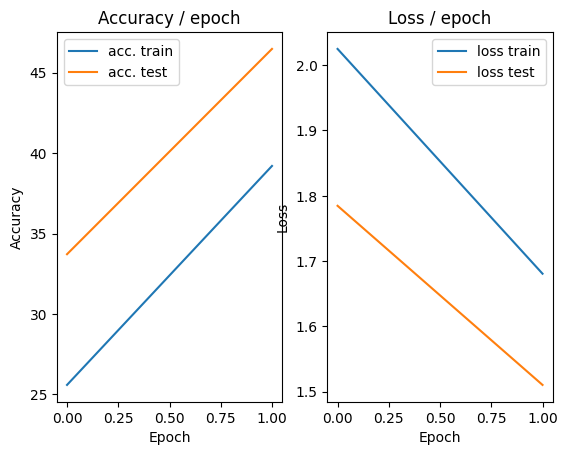

=== EPOCH 3 =====

[TRAIN Batch 000/391]	Time 0.287s (0.287s)	Loss 1.6308 (1.6308)	Prec@1  43.8 ( 43.8)	Prec@5  89.1 ( 89.1)


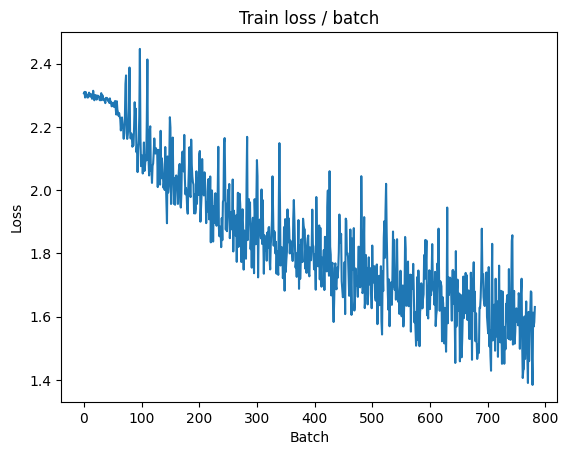

[TRAIN Batch 200/391]	Time 0.039s (0.037s)	Loss 1.5017 (1.5606)	Prec@1  45.3 ( 43.8)	Prec@5  92.2 ( 90.2)


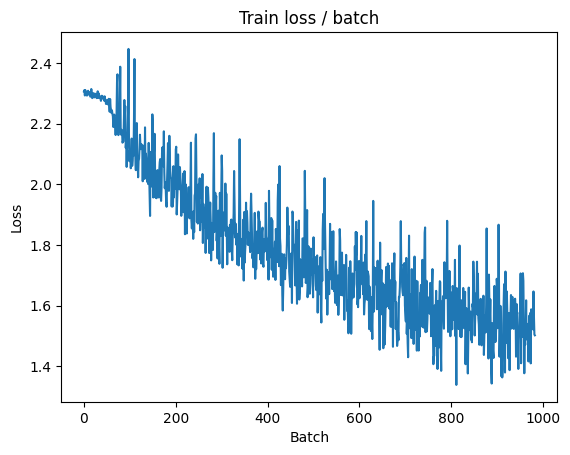


===============> Total time 13s	Avg loss 1.5367	Avg Prec@1 44.67 %	Avg Prec@5 90.64 %

[EVAL Batch 000/079]	Time 0.241s (0.241s)	Loss 1.3944 (1.3944)	Prec@1  54.7 ( 54.7)	Prec@5  92.2 ( 92.2)

===============> Total time 2s	Avg loss 1.4443	Avg Prec@1 47.06 %	Avg Prec@5 92.28 %



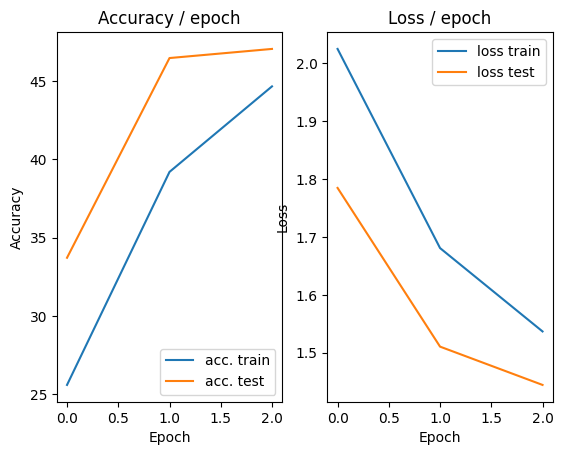

=== EPOCH 4 =====

[TRAIN Batch 000/391]	Time 0.187s (0.187s)	Loss 1.3444 (1.3444)	Prec@1  48.4 ( 48.4)	Prec@5  96.1 ( 96.1)


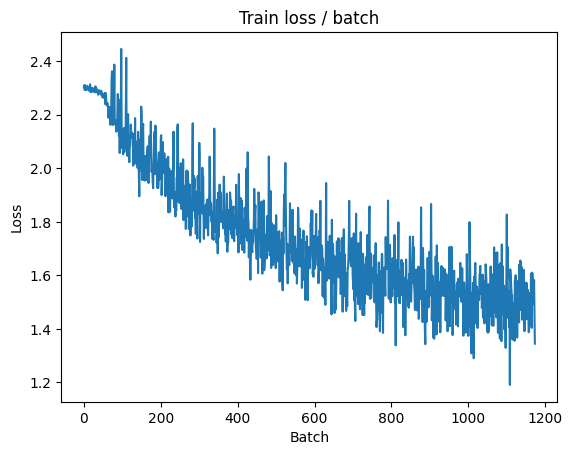

[TRAIN Batch 200/391]	Time 0.065s (0.031s)	Loss 1.5728 (1.4852)	Prec@1  41.4 ( 47.1)	Prec@5  88.3 ( 91.2)


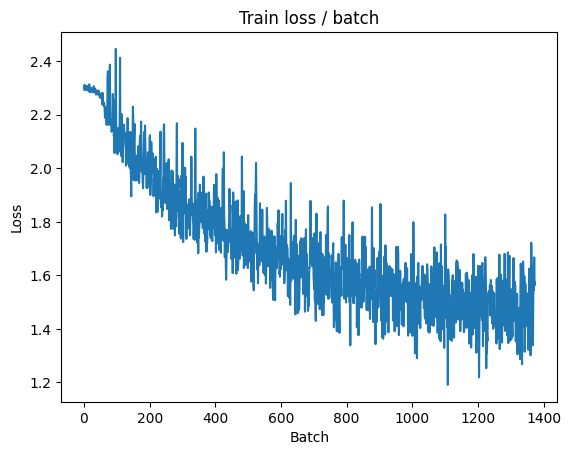


===============> Total time 13s	Avg loss 1.4606	Avg Prec@1 47.91 %	Avg Prec@5 91.65 %

[EVAL Batch 000/079]	Time 0.139s (0.139s)	Loss 1.3718 (1.3718)	Prec@1  53.9 ( 53.9)	Prec@5  89.1 ( 89.1)

===============> Total time 1s	Avg loss 1.4448	Avg Prec@1 48.67 %	Avg Prec@5 91.67 %



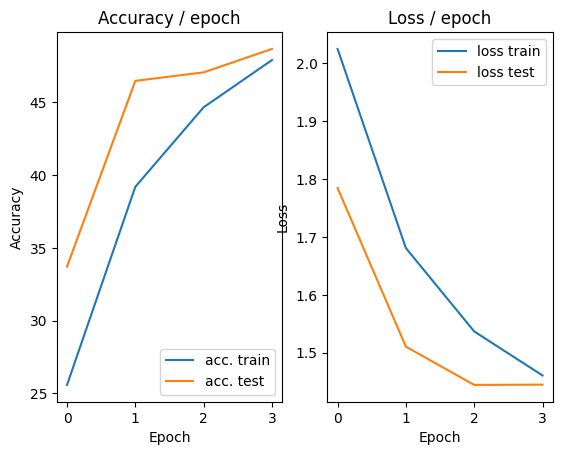

=== EPOCH 5 =====

[TRAIN Batch 000/391]	Time 0.178s (0.178s)	Loss 1.4604 (1.4604)	Prec@1  51.6 ( 51.6)	Prec@5  89.1 ( 89.1)


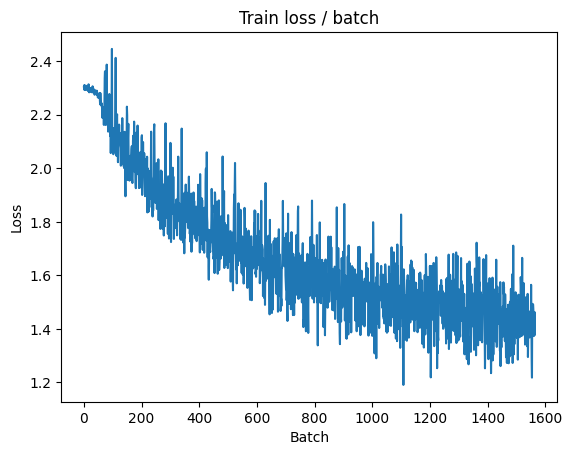

[TRAIN Batch 200/391]	Time 0.052s (0.031s)	Loss 1.3600 (1.4003)	Prec@1  50.0 ( 50.0)	Prec@5  96.9 ( 92.7)


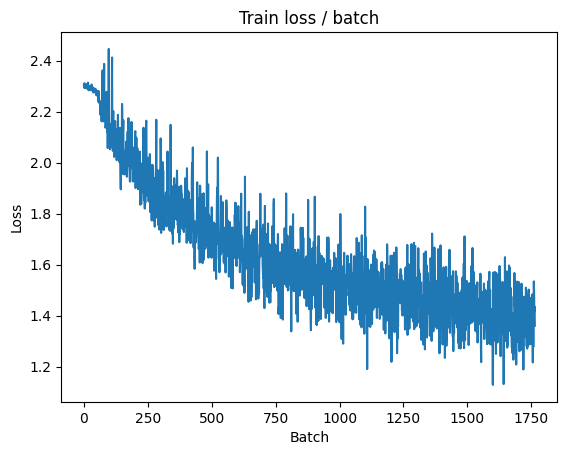


===============> Total time 12s	Avg loss 1.3947	Avg Prec@1 50.33 %	Avg Prec@5 92.67 %

[EVAL Batch 000/079]	Time 0.137s (0.137s)	Loss 1.3513 (1.3513)	Prec@1  52.3 ( 52.3)	Prec@5  90.6 ( 90.6)

===============> Total time 1s	Avg loss 1.3518	Avg Prec@1 51.49 %	Avg Prec@5 93.45 %



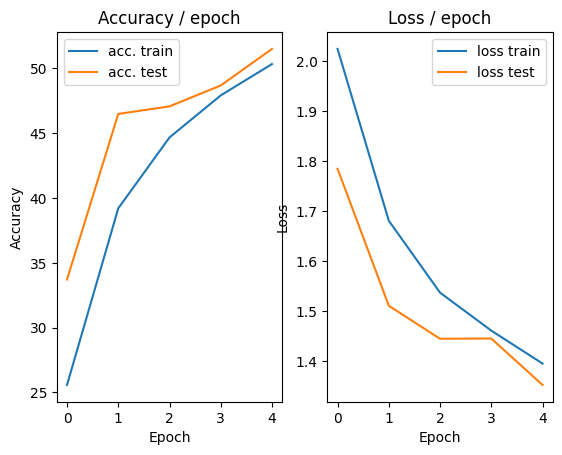

=== EPOCH 6 =====

[TRAIN Batch 000/391]	Time 0.191s (0.191s)	Loss 1.3264 (1.3264)	Prec@1  51.6 ( 51.6)	Prec@5  95.3 ( 95.3)


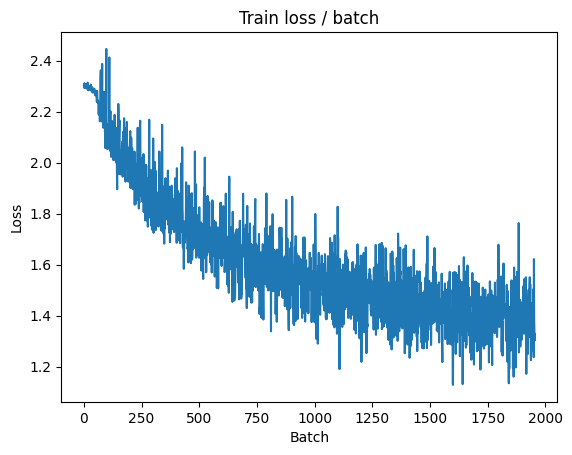

[TRAIN Batch 200/391]	Time 0.055s (0.033s)	Loss 1.4095 (1.3537)	Prec@1  49.2 ( 51.8)	Prec@5  93.0 ( 93.3)


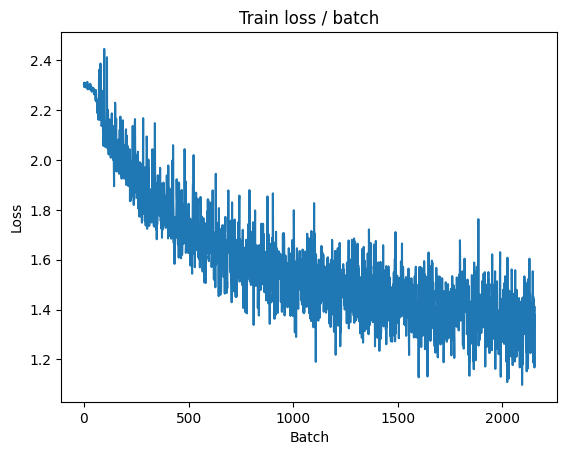


===============> Total time 12s	Avg loss 1.3461	Avg Prec@1 52.03 %	Avg Prec@5 93.32 %

[EVAL Batch 000/079]	Time 0.132s (0.132s)	Loss 1.1878 (1.1878)	Prec@1  58.6 ( 58.6)	Prec@5  94.5 ( 94.5)

===============> Total time 1s	Avg loss 1.2576	Avg Prec@1 54.61 %	Avg Prec@5 94.31 %



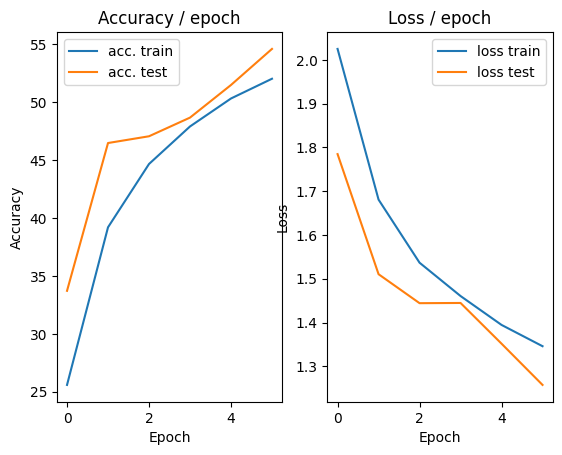

=== EPOCH 7 =====

[TRAIN Batch 000/391]	Time 0.173s (0.173s)	Loss 1.3733 (1.3733)	Prec@1  49.2 ( 49.2)	Prec@5  94.5 ( 94.5)


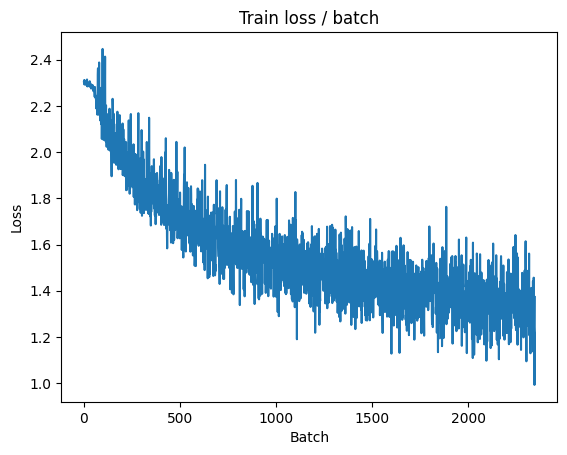

[TRAIN Batch 200/391]	Time 0.051s (0.036s)	Loss 1.2734 (1.3108)	Prec@1  51.6 ( 53.3)	Prec@5  94.5 ( 93.7)


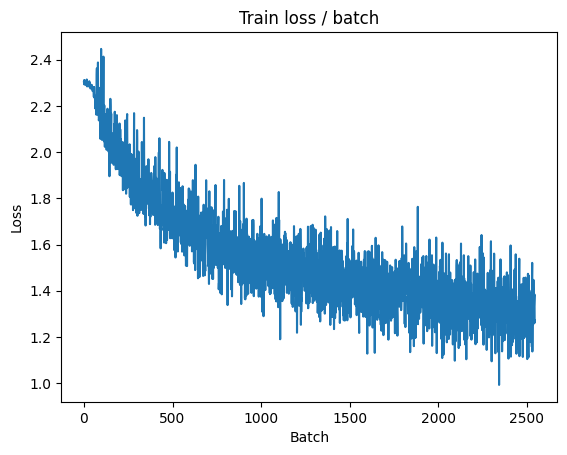


===============> Total time 12s	Avg loss 1.3033	Avg Prec@1 53.42 %	Avg Prec@5 93.71 %

[EVAL Batch 000/079]	Time 0.149s (0.149s)	Loss 1.2334 (1.2334)	Prec@1  56.2 ( 56.2)	Prec@5  93.8 ( 93.8)

===============> Total time 1s	Avg loss 1.2538	Avg Prec@1 55.80 %	Avg Prec@5 94.43 %



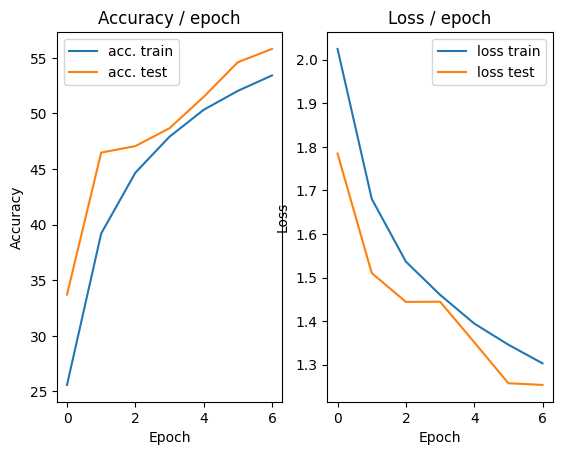

=== EPOCH 8 =====

[TRAIN Batch 000/391]	Time 0.175s (0.175s)	Loss 1.2843 (1.2843)	Prec@1  53.9 ( 53.9)	Prec@5  92.2 ( 92.2)


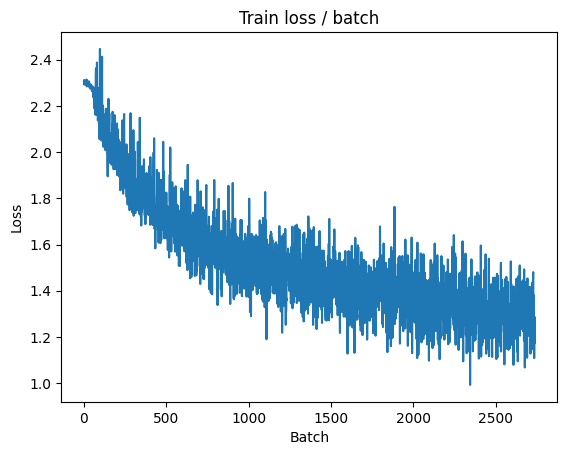

[TRAIN Batch 200/391]	Time 0.021s (0.036s)	Loss 1.3460 (1.2794)	Prec@1  53.1 ( 54.6)	Prec@5  93.0 ( 93.8)


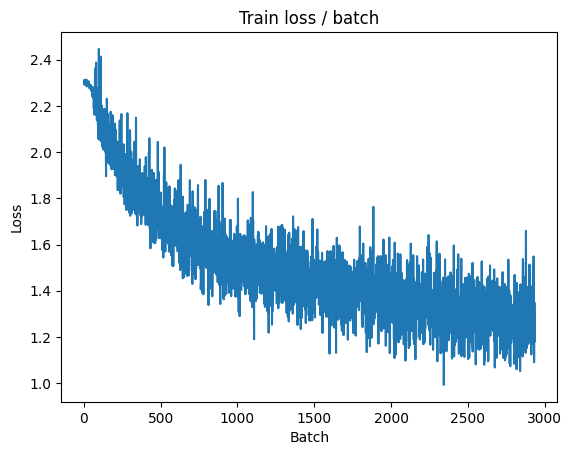


===============> Total time 12s	Avg loss 1.2761	Avg Prec@1 54.50 %	Avg Prec@5 94.05 %

[EVAL Batch 000/079]	Time 0.134s (0.134s)	Loss 1.2056 (1.2056)	Prec@1  59.4 ( 59.4)	Prec@5  94.5 ( 94.5)

===============> Total time 2s	Avg loss 1.2322	Avg Prec@1 55.69 %	Avg Prec@5 94.87 %



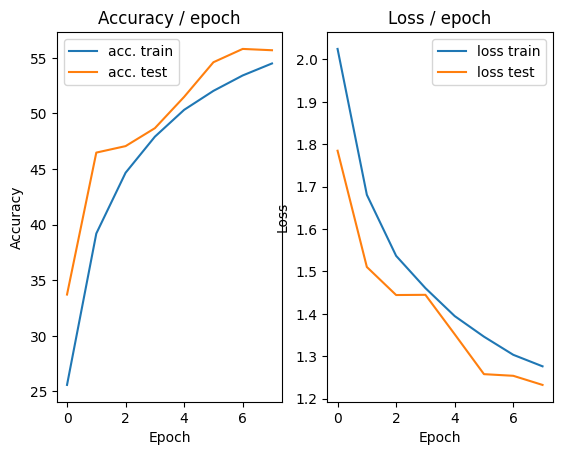

=== EPOCH 9 =====

[TRAIN Batch 000/391]	Time 0.301s (0.301s)	Loss 1.2143 (1.2143)	Prec@1  52.3 ( 52.3)	Prec@5  93.0 ( 93.0)


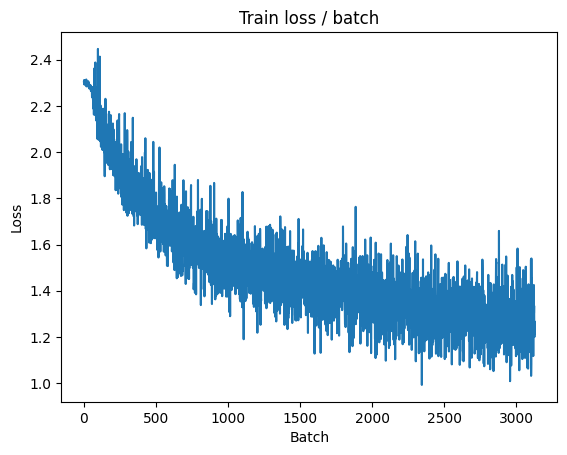

[TRAIN Batch 200/391]	Time 0.004s (0.033s)	Loss 1.3056 (1.2523)	Prec@1  49.2 ( 55.3)	Prec@5  96.9 ( 94.6)


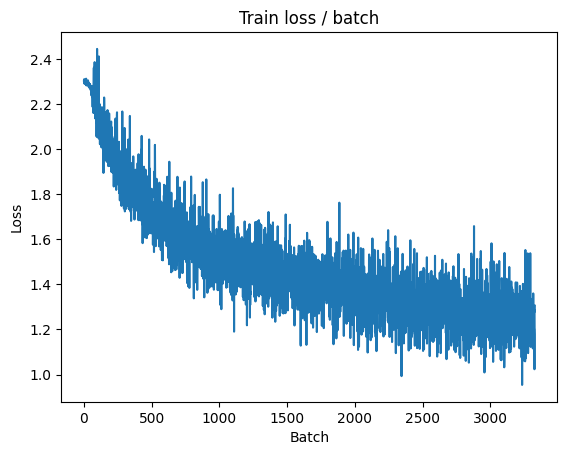


===============> Total time 13s	Avg loss 1.2458	Avg Prec@1 55.67 %	Avg Prec@5 94.58 %

[EVAL Batch 000/079]	Time 0.230s (0.230s)	Loss 1.2604 (1.2604)	Prec@1  52.3 ( 52.3)	Prec@5  93.0 ( 93.0)

===============> Total time 1s	Avg loss 1.2638	Avg Prec@1 54.88 %	Avg Prec@5 94.20 %



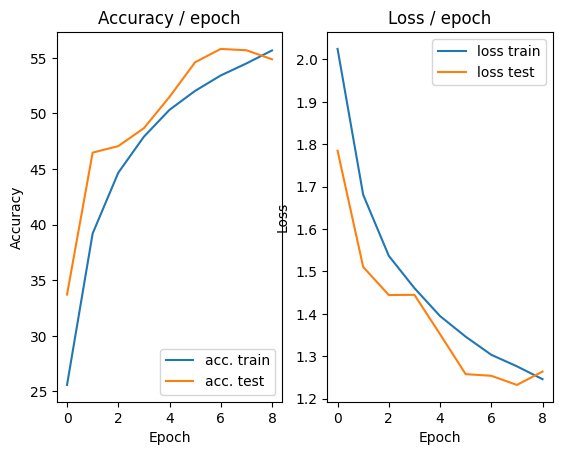

=== EPOCH 10 =====

[TRAIN Batch 000/391]	Time 0.190s (0.190s)	Loss 1.3419 (1.3419)	Prec@1  47.7 ( 47.7)	Prec@5  91.4 ( 91.4)


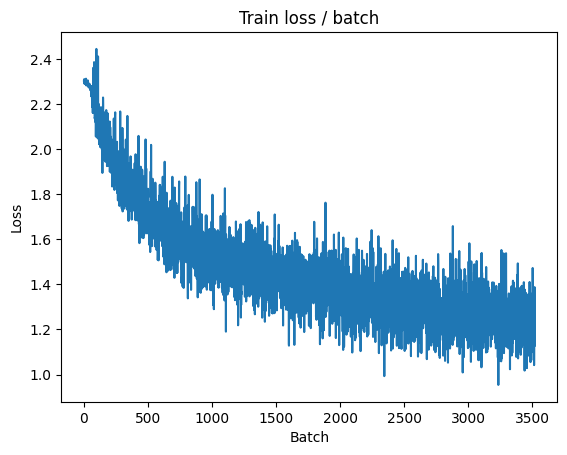

[TRAIN Batch 200/391]	Time 0.004s (0.031s)	Loss 1.3609 (1.2292)	Prec@1  53.9 ( 56.5)	Prec@5  92.2 ( 94.8)


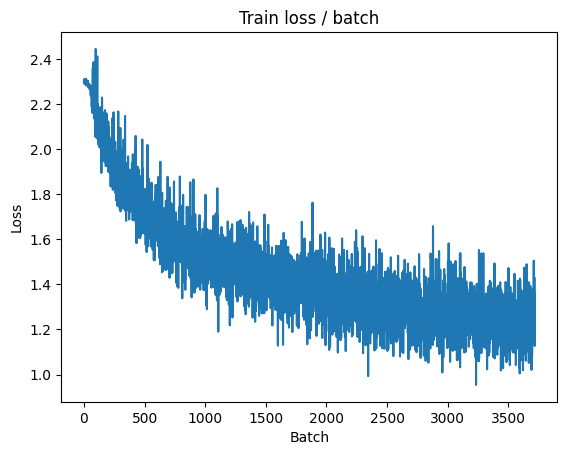


===============> Total time 12s	Avg loss 1.2199	Avg Prec@1 56.76 %	Avg Prec@5 94.87 %

[EVAL Batch 000/079]	Time 0.141s (0.141s)	Loss 1.1455 (1.1455)	Prec@1  61.7 ( 61.7)	Prec@5  95.3 ( 95.3)

===============> Total time 1s	Avg loss 1.2432	Avg Prec@1 55.83 %	Avg Prec@5 94.27 %



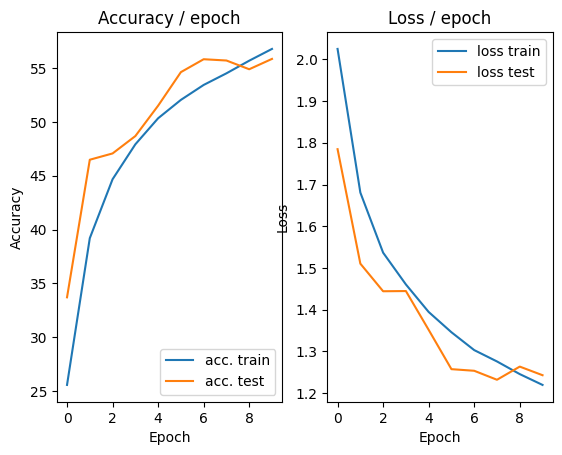

=== EPOCH 11 =====

[TRAIN Batch 000/391]	Time 0.180s (0.180s)	Loss 1.3153 (1.3153)	Prec@1  47.7 ( 47.7)	Prec@5  96.1 ( 96.1)


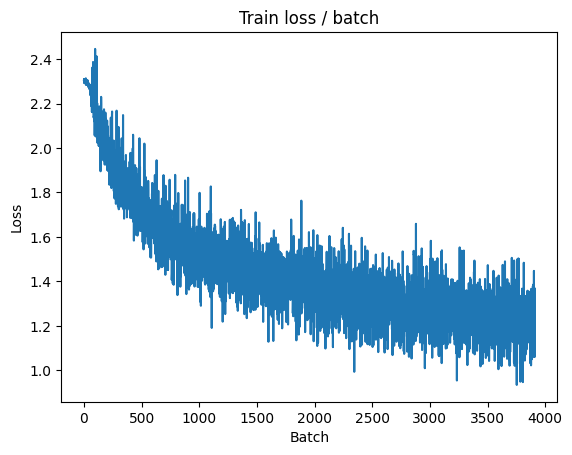

[TRAIN Batch 200/391]	Time 0.003s (0.032s)	Loss 1.2034 (1.1960)	Prec@1  53.1 ( 57.3)	Prec@5  95.3 ( 95.1)


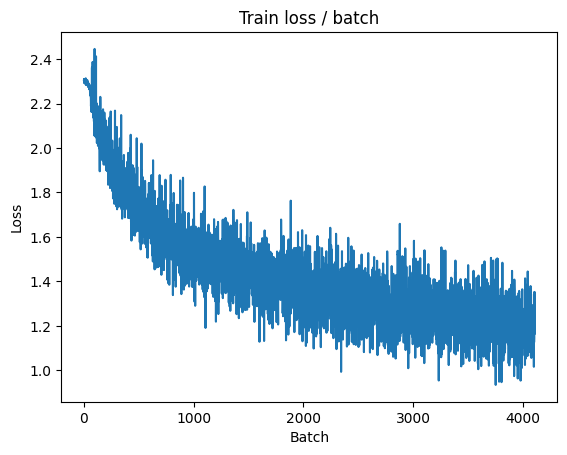


===============> Total time 12s	Avg loss 1.1956	Avg Prec@1 57.39 %	Avg Prec@5 95.11 %

[EVAL Batch 000/079]	Time 0.150s (0.150s)	Loss 1.0915 (1.0915)	Prec@1  61.7 ( 61.7)	Prec@5  92.2 ( 92.2)

===============> Total time 1s	Avg loss 1.1375	Avg Prec@1 59.28 %	Avg Prec@5 95.54 %



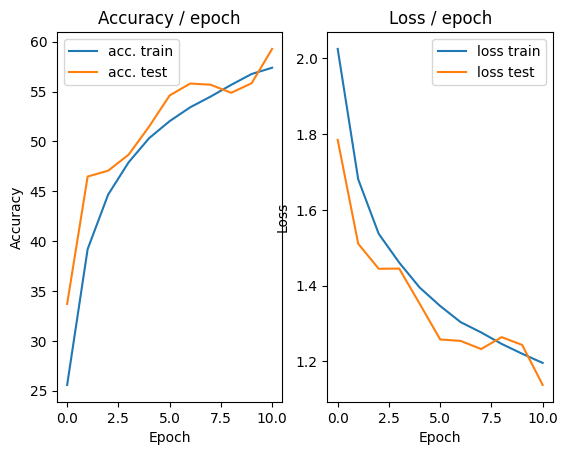

=== EPOCH 12 =====

[TRAIN Batch 000/391]	Time 0.190s (0.190s)	Loss 1.2362 (1.2362)	Prec@1  60.2 ( 60.2)	Prec@5  93.8 ( 93.8)


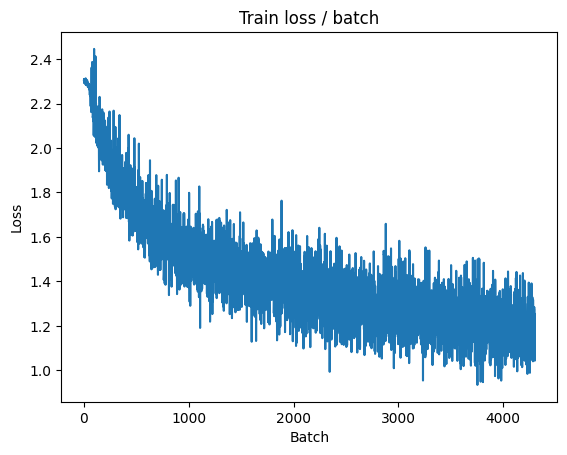

[TRAIN Batch 200/391]	Time 0.022s (0.036s)	Loss 1.2633 (1.1842)	Prec@1  55.5 ( 57.9)	Prec@5  93.8 ( 95.3)


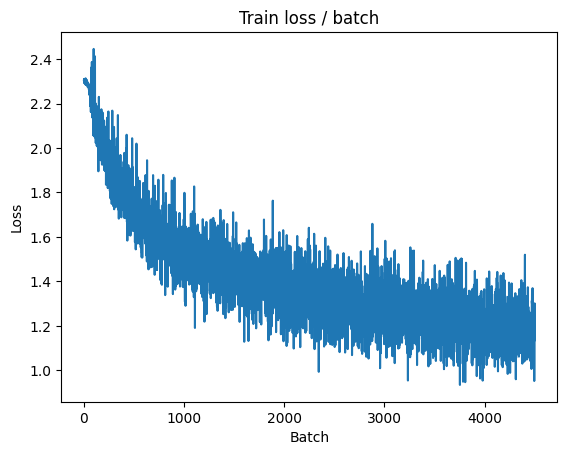


===============> Total time 13s	Avg loss 1.1766	Avg Prec@1 58.34 %	Avg Prec@5 95.31 %

[EVAL Batch 000/079]	Time 0.148s (0.148s)	Loss 1.1477 (1.1477)	Prec@1  59.4 ( 59.4)	Prec@5  93.0 ( 93.0)

===============> Total time 1s	Avg loss 1.1695	Avg Prec@1 58.35 %	Avg Prec@5 95.09 %



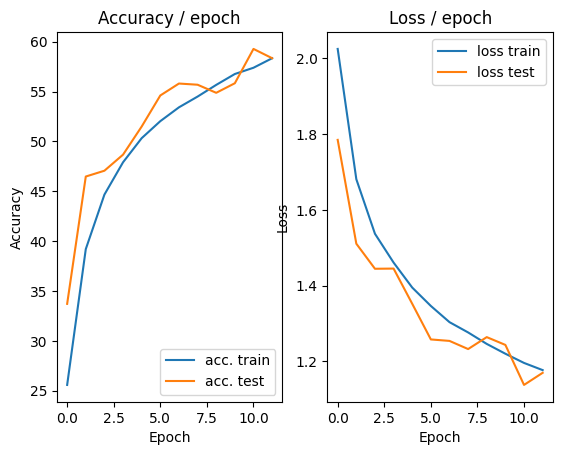

=== EPOCH 13 =====

[TRAIN Batch 000/391]	Time 0.174s (0.174s)	Loss 1.1848 (1.1848)	Prec@1  58.6 ( 58.6)	Prec@5  94.5 ( 94.5)


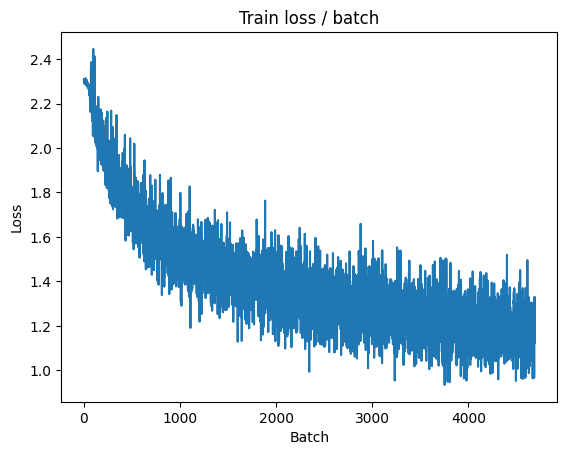

[TRAIN Batch 200/391]	Time 0.017s (0.036s)	Loss 1.1283 (1.1656)	Prec@1  61.7 ( 58.8)	Prec@5  94.5 ( 95.1)


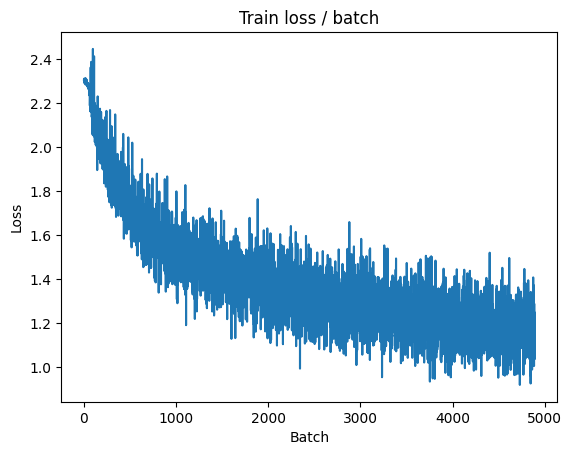


===============> Total time 12s	Avg loss 1.1615	Avg Prec@1 58.79 %	Avg Prec@5 95.35 %

[EVAL Batch 000/079]	Time 0.148s (0.148s)	Loss 1.1489 (1.1489)	Prec@1  59.4 ( 59.4)	Prec@5  93.8 ( 93.8)

===============> Total time 1s	Avg loss 1.1400	Avg Prec@1 59.30 %	Avg Prec@5 95.71 %



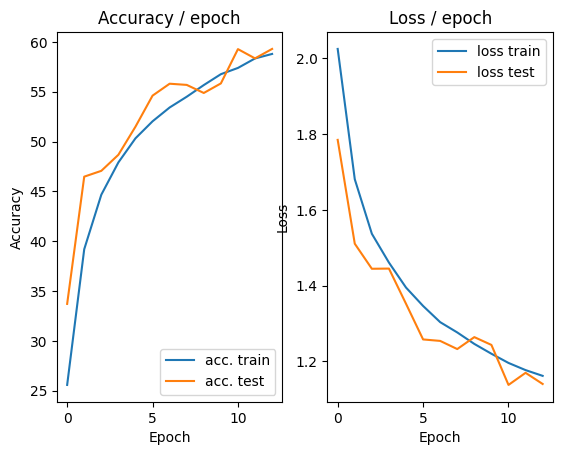

=== EPOCH 14 =====

[TRAIN Batch 000/391]	Time 0.314s (0.314s)	Loss 1.1454 (1.1454)	Prec@1  62.5 ( 62.5)	Prec@5  94.5 ( 94.5)


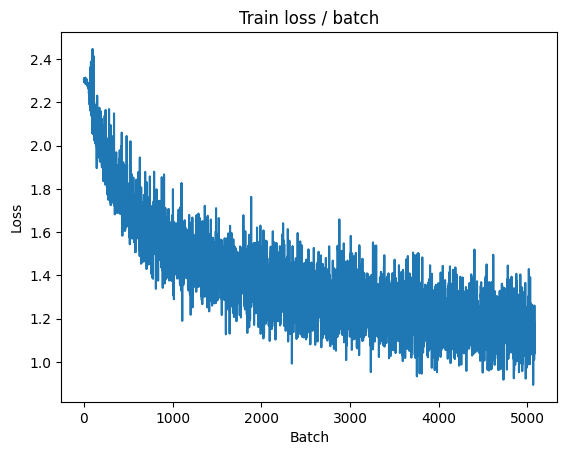

[TRAIN Batch 200/391]	Time 0.053s (0.034s)	Loss 0.9445 (1.1327)	Prec@1  67.2 ( 60.3)	Prec@5  98.4 ( 95.7)


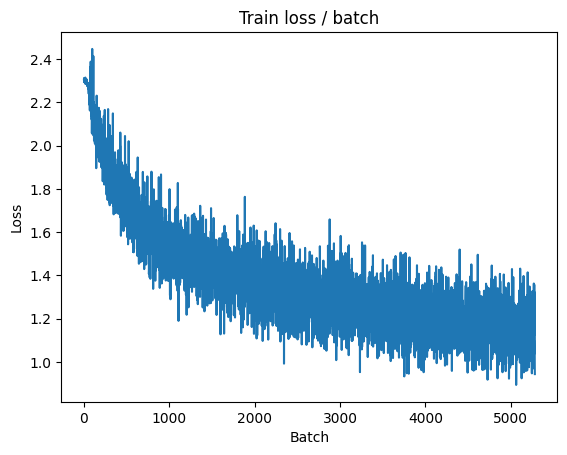


===============> Total time 12s	Avg loss 1.1402	Avg Prec@1 59.82 %	Avg Prec@5 95.68 %

[EVAL Batch 000/079]	Time 0.261s (0.261s)	Loss 1.0537 (1.0537)	Prec@1  64.8 ( 64.8)	Prec@5  93.8 ( 93.8)

===============> Total time 2s	Avg loss 1.0795	Avg Prec@1 62.06 %	Avg Prec@5 95.89 %



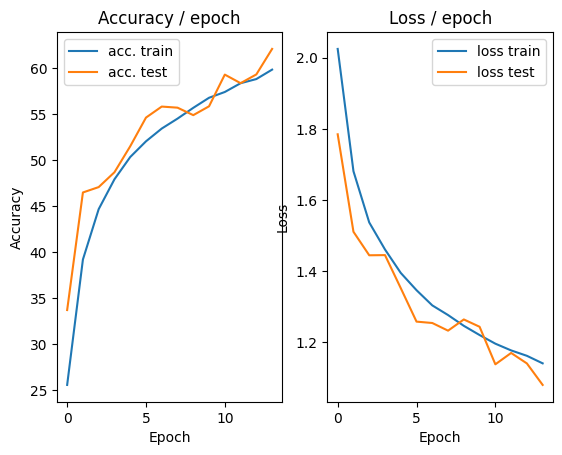

=== EPOCH 15 =====

[TRAIN Batch 000/391]	Time 0.195s (0.195s)	Loss 1.0812 (1.0812)	Prec@1  60.9 ( 60.9)	Prec@5  94.5 ( 94.5)


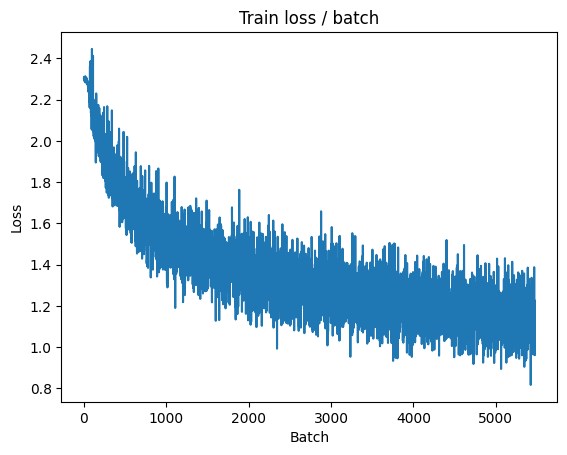

[TRAIN Batch 200/391]	Time 0.055s (0.031s)	Loss 1.1514 (1.1145)	Prec@1  60.9 ( 60.4)	Prec@5  96.1 ( 95.9)


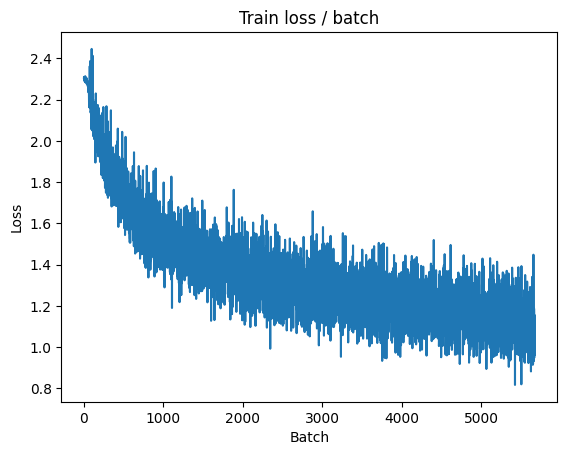


===============> Total time 12s	Avg loss 1.1263	Avg Prec@1 60.11 %	Avg Prec@5 95.75 %

[EVAL Batch 000/079]	Time 0.141s (0.141s)	Loss 1.0494 (1.0494)	Prec@1  64.1 ( 64.1)	Prec@5  96.1 ( 96.1)

===============> Total time 1s	Avg loss 1.1066	Avg Prec@1 60.60 %	Avg Prec@5 96.00 %



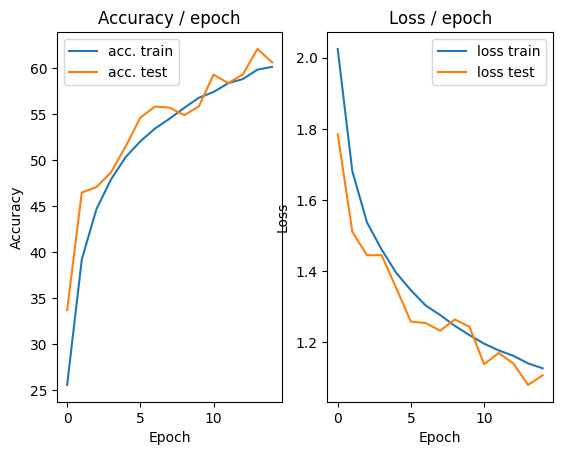

=== EPOCH 16 =====

[TRAIN Batch 000/391]	Time 0.215s (0.215s)	Loss 1.2643 (1.2643)	Prec@1  50.0 ( 50.0)	Prec@5  96.1 ( 96.1)


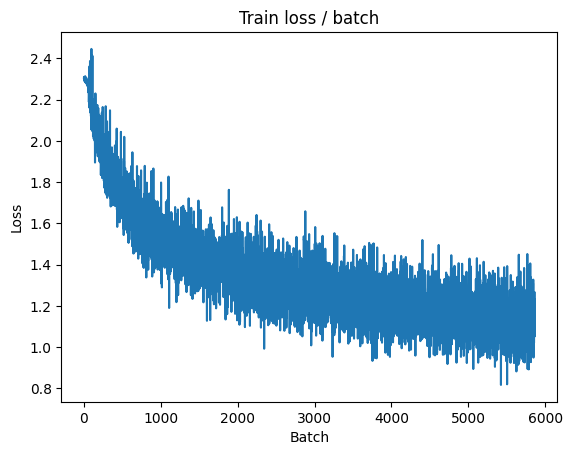

[TRAIN Batch 200/391]	Time 0.004s (0.031s)	Loss 1.1711 (1.1191)	Prec@1  57.0 ( 59.9)	Prec@5  94.5 ( 95.8)


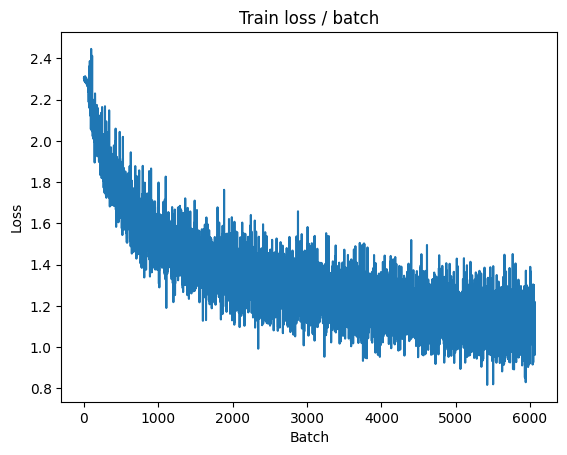


===============> Total time 13s	Avg loss 1.1150	Avg Prec@1 60.41 %	Avg Prec@5 95.84 %

[EVAL Batch 000/079]	Time 0.143s (0.143s)	Loss 1.0131 (1.0131)	Prec@1  64.8 ( 64.8)	Prec@5  93.0 ( 93.0)

===============> Total time 1s	Avg loss 1.1191	Avg Prec@1 59.70 %	Avg Prec@5 95.82 %



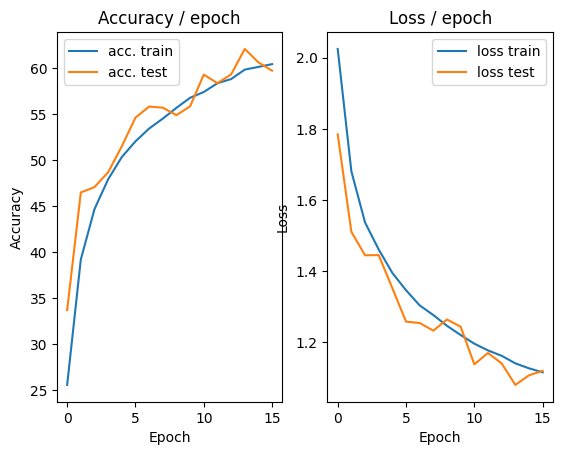

=== EPOCH 17 =====

[TRAIN Batch 000/391]	Time 0.200s (0.200s)	Loss 1.1695 (1.1695)	Prec@1  52.3 ( 52.3)	Prec@5  95.3 ( 95.3)


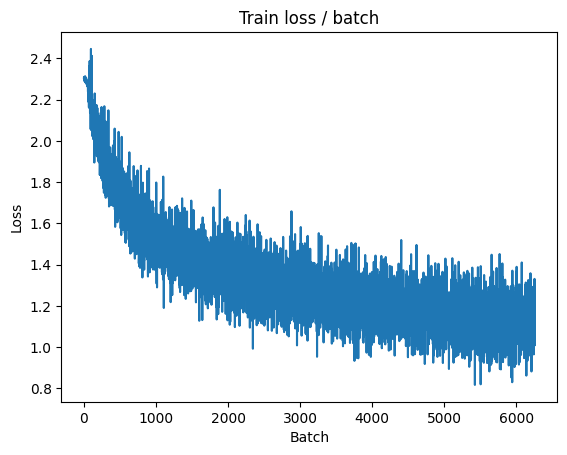

[TRAIN Batch 200/391]	Time 0.008s (0.036s)	Loss 1.1156 (1.0971)	Prec@1  62.5 ( 61.3)	Prec@5  96.1 ( 96.1)


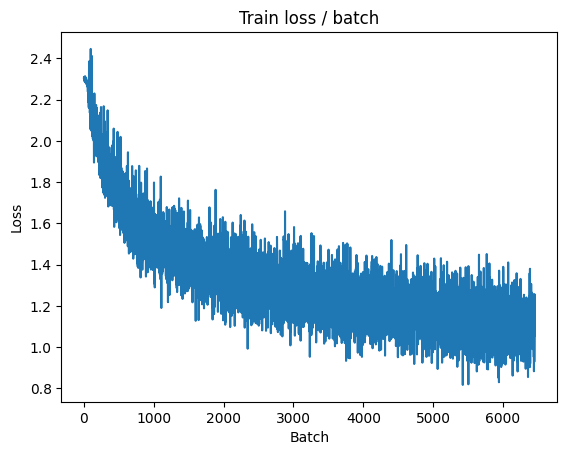


===============> Total time 13s	Avg loss 1.0963	Avg Prec@1 61.43 %	Avg Prec@5 96.03 %

[EVAL Batch 000/079]	Time 0.150s (0.150s)	Loss 1.0419 (1.0419)	Prec@1  64.1 ( 64.1)	Prec@5  95.3 ( 95.3)

===============> Total time 1s	Avg loss 1.0691	Avg Prec@1 62.02 %	Avg Prec@5 96.21 %



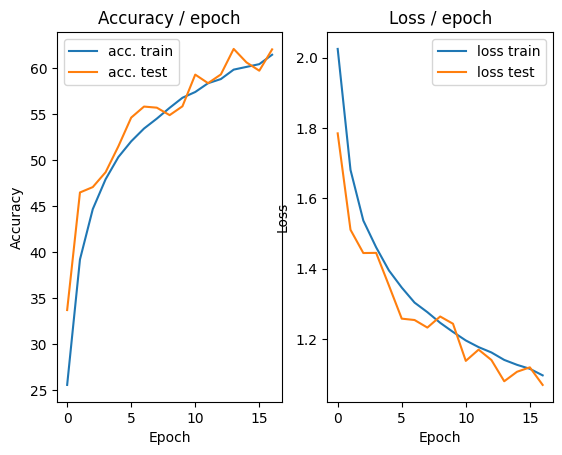

=== EPOCH 18 =====

[TRAIN Batch 000/391]	Time 0.194s (0.194s)	Loss 1.1938 (1.1938)	Prec@1  57.8 ( 57.8)	Prec@5  96.1 ( 96.1)


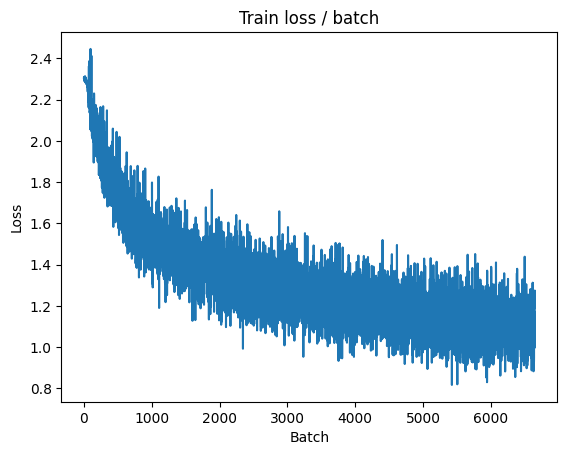

[TRAIN Batch 200/391]	Time 0.051s (0.037s)	Loss 1.0346 (1.0716)	Prec@1  64.1 ( 62.1)	Prec@5  96.1 ( 96.1)


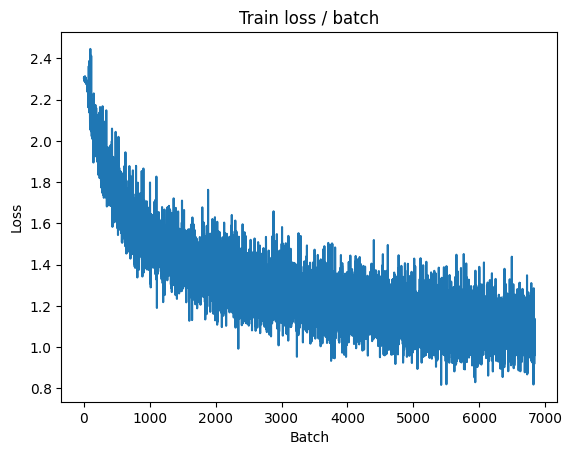


===============> Total time 13s	Avg loss 1.0784	Avg Prec@1 61.71 %	Avg Prec@5 96.02 %

[EVAL Batch 000/079]	Time 0.146s (0.146s)	Loss 0.9508 (0.9508)	Prec@1  67.2 ( 67.2)	Prec@5  96.1 ( 96.1)

===============> Total time 1s	Avg loss 1.0560	Avg Prec@1 62.79 %	Avg Prec@5 96.14 %



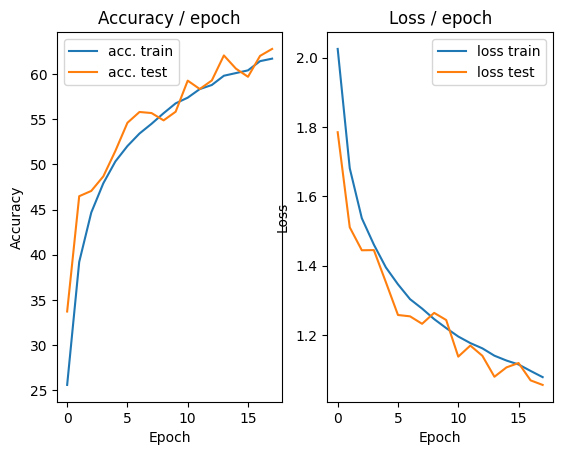

=== EPOCH 19 =====

[TRAIN Batch 000/391]	Time 0.282s (0.282s)	Loss 1.0725 (1.0725)	Prec@1  60.2 ( 60.2)	Prec@5  94.5 ( 94.5)


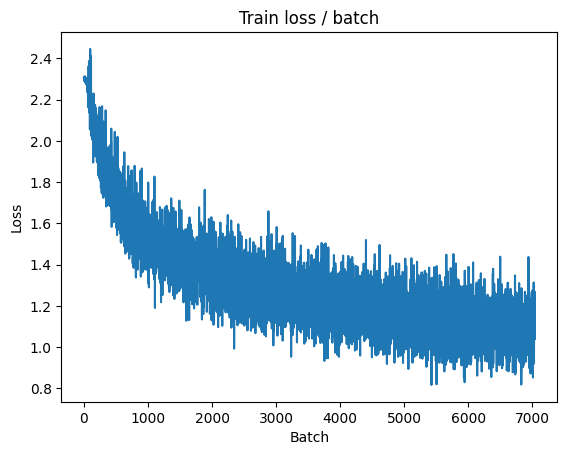

[TRAIN Batch 200/391]	Time 0.004s (0.035s)	Loss 0.9232 (1.0671)	Prec@1  68.8 ( 62.3)	Prec@5  96.9 ( 96.2)


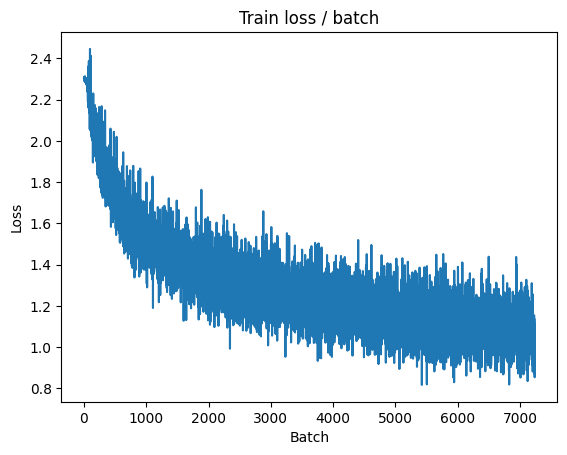


===============> Total time 12s	Avg loss 1.0657	Avg Prec@1 62.16 %	Avg Prec@5 96.24 %

[EVAL Batch 000/079]	Time 0.181s (0.181s)	Loss 1.0668 (1.0668)	Prec@1  63.3 ( 63.3)	Prec@5  94.5 ( 94.5)

===============> Total time 2s	Avg loss 1.1160	Avg Prec@1 60.11 %	Avg Prec@5 95.77 %



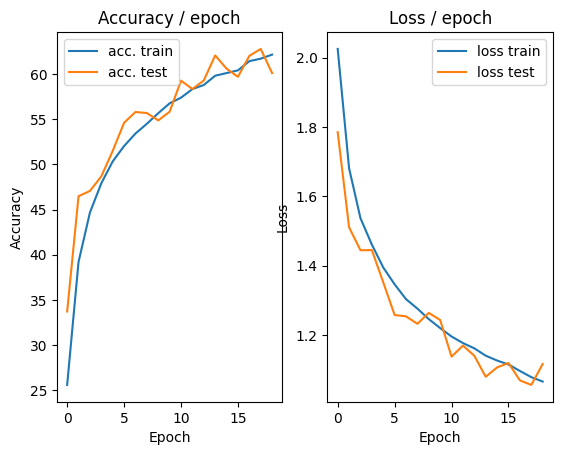

=== EPOCH 20 =====

[TRAIN Batch 000/391]	Time 0.214s (0.214s)	Loss 1.0195 (1.0195)	Prec@1  59.4 ( 59.4)	Prec@5  96.1 ( 96.1)


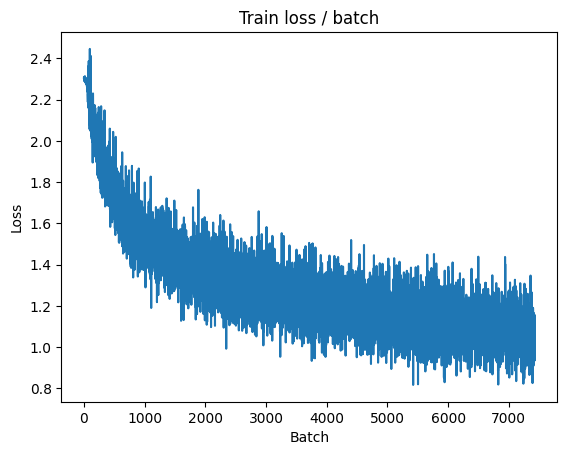

[TRAIN Batch 200/391]	Time 0.027s (0.032s)	Loss 1.0380 (1.0623)	Prec@1  60.9 ( 62.5)	Prec@5  96.1 ( 96.3)


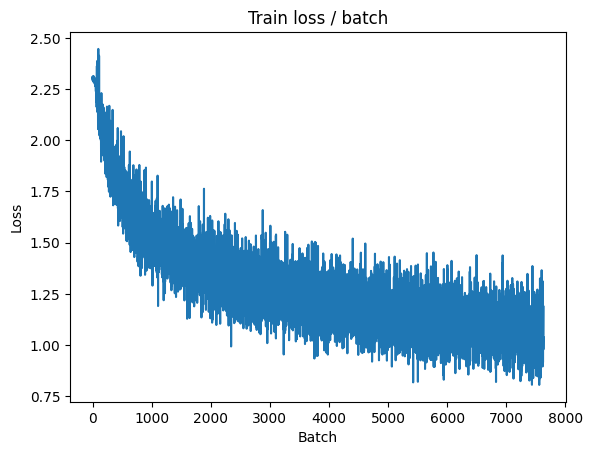


===============> Total time 13s	Avg loss 1.0646	Avg Prec@1 62.59 %	Avg Prec@5 96.17 %

[EVAL Batch 000/079]	Time 0.150s (0.150s)	Loss 0.9491 (0.9491)	Prec@1  68.8 ( 68.8)	Prec@5  94.5 ( 94.5)

===============> Total time 1s	Avg loss 1.0318	Avg Prec@1 63.15 %	Avg Prec@5 96.37 %



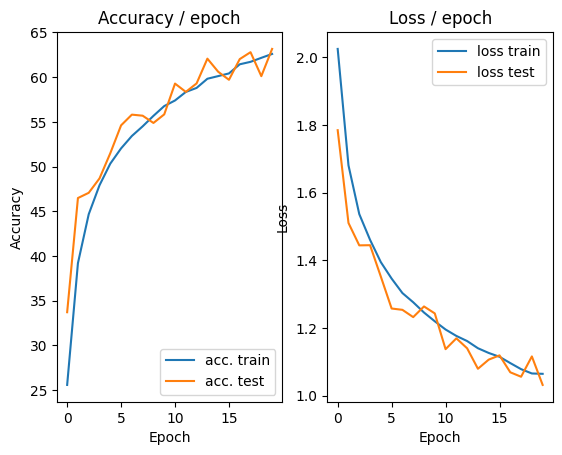

In [ ]:
main(batch_size=128, lr=0.1, epochs=20,cuda=True)

## Variants on the optimization algorithm

In [ ]:
import torch.optim.lr_scheduler
class ConvNet(nn.Module):
    """
    This class defines the structure of the neural network
    """

    def __init__(self):
        super(ConvNet, self).__init__()
        # We first define the convolution and pooling layers as a features extractor
        self.features = nn.Sequential(
            nn.Conv2d(3, 6, (5, 5), stride=1, padding=2),
            nn.Tanh(),
            nn.MaxPool2d((2, 2), stride=2, padding=0),
            nn.Conv2d(6, 16, (5, 5), stride=1, padding=0),
            nn.Tanh(),
            nn.MaxPool2d((2, 2), stride=2, padding=0),
        )
        # We then define fully connected layers as a classifier
        self.classifier = nn.Sequential(
            nn.Linear(576, 256),
            nn.Tanh(),
            nn.Linear(256, 84),
            nn.Tanh(),
            nn.Linear(84, 10)
            # Reminder: The softmax is included in the loss, do not put it here
        )

    # Method called when we apply the network to an input batch
    def forward(self, input):
        bsize = input.size(0) # batch size
        output = self.features(input) # output of the conv layers
        output = output.view(bsize, -1) # we flatten the 2D feature maps into one 1D vector for each input
        output = self.classifier(output) # we compute the output of the fc layers
        return output



def get_dataset(batch_size, cuda=False):
    """
    This function loads the dataset and performs transformations on each
    image (listed in `transform = ...`).
    """
    train_dataset = datasets.CIFAR10(PATH, train=True, download=True,
        transform=transforms.Compose([
            transforms.ToTensor()
        ]))

    val_dataset = datasets.CIFAR10(PATH, train=False, download=True,
        transform=transforms.Compose([
            transforms.ToTensor()
        ]))

    train_loader = torch.utils.data.DataLoader(train_dataset,
                        batch_size=batch_size, shuffle=True, pin_memory=cuda, num_workers=2)
    val_loader = torch.utils.data.DataLoader(val_dataset,
                        batch_size=batch_size, shuffle=False, pin_memory=cuda, num_workers=2)

    return train_loader, val_loader



def epoch(data, model, criterion, optimizer=None, cuda=False):
    """
    Make a pass (called epoch in English) on the data `data` with the
     model `model`. Evaluates `criterion` as loss.
     If `optimizer` is given, perform a training epoch using
     the given optimizer, otherwise, perform an evaluation epoch (no backward)
     of the model.
    """

    # indicates whether the model is in eval or train mode (some layers behave differently in train and eval)
    model.eval() if optimizer is None else model.train()

    # objects to store metric averages
    avg_loss = AverageMeter()
    avg_top1_acc = AverageMeter()
    avg_top5_acc = AverageMeter()
    avg_batch_time = AverageMeter()
    global loss_plot

    # we iterate on the batches
    tic = time.time()
    for i, (input, target) in enumerate(data):

        if cuda: # only with GPU, and not with CPU
            input = input.cuda()
            target = target.cuda()

        # forward
        output = model(input)
        loss = criterion(output, target)

        # backward if we are training
        if optimizer:
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

        # compute metrics
        prec1, prec5 = accuracy(output, target, topk=(1, 5))
        batch_time = time.time() - tic
        tic = time.time()

        # update
        avg_loss.update(loss.item())
        avg_top1_acc.update(prec1.item())
        avg_top5_acc.update(prec5.item())
        avg_batch_time.update(batch_time)
        if optimizer:
            loss_plot.update(avg_loss.val)
        # print info
        if i % PRINT_INTERVAL == 0:
            print('[{0:s} Batch {1:03d}/{2:03d}]\t'
                  'Time {batch_time.val:.3f}s ({batch_time.avg:.3f}s)\t'
                  'Loss {loss.val:.4f} ({loss.avg:.4f})\t'
                  'Prec@1 {top1.val:5.1f} ({top1.avg:5.1f})\t'
                  'Prec@5 {top5.val:5.1f} ({top5.avg:5.1f})'.format(
                   "EVAL" if optimizer is None else "TRAIN", i, len(data), batch_time=avg_batch_time, loss=avg_loss,
                   top1=avg_top1_acc, top5=avg_top5_acc))
            if optimizer:
                loss_plot.plot()

    # Print summary
    print('\n===============> Total time {batch_time:d}s\t'
          'Avg loss {loss.avg:.4f}\t'
          'Avg Prec@1 {top1.avg:5.2f} %\t'
          'Avg Prec@5 {top5.avg:5.2f} %\n'.format(
           batch_time=int(avg_batch_time.sum), loss=avg_loss,
           top1=avg_top1_acc, top5=avg_top5_acc))

    return avg_top1_acc, avg_top5_acc, avg_loss


def main(batch_size=128, lr=0.1, epochs=5, cuda=False):

    # ex :
    #   {"batch_size": 128, "epochs": 5, "lr": 0.1}

    # define model, loss, optim
    model = ConvNet()
    criterion = nn.CrossEntropyLoss()
    optimizer = torch.optim.SGD(model.parameters(), lr)
    lr_sched = torch.optim.lr_scheduler.ExponentialLR(optimizer, gamma=0.95)

    if cuda: # only with GPU, and not with CPU
        cudnn.benchmark = True
        model = model.cuda()
        criterion = criterion.cuda()

    # Get the data
    train, test = get_dataset(batch_size, cuda)

    # init plots
    plot = AccLossPlot()
    global loss_plot
    loss_plot = TrainLossPlot()

    # We iterate on the epochs
    for i in range(epochs):
        print("=================\n=== EPOCH "+str(i+1)+" =====\n=================\n")
        # Train phase
        top1_acc, avg_top5_acc, loss = epoch(train, model, criterion, optimizer, cuda)
        lr_sched.step()
        # Test phase
        top1_acc_test, top5_acc_test, loss_test = epoch(test, model, criterion, cuda=cuda)
        # plot
        plot.update(loss.avg, loss_test.avg, top1_acc.avg, top1_acc_test.avg)


Files already downloaded and verified
Files already downloaded and verified
=== EPOCH 1 =====

[TRAIN Batch 000/391]	Time 0.146s (0.146s)	Loss 2.3051 (2.3051)	Prec@1   7.8 (  7.8)	Prec@5  50.8 ( 50.8)


<Figure size 640x480 with 0 Axes>

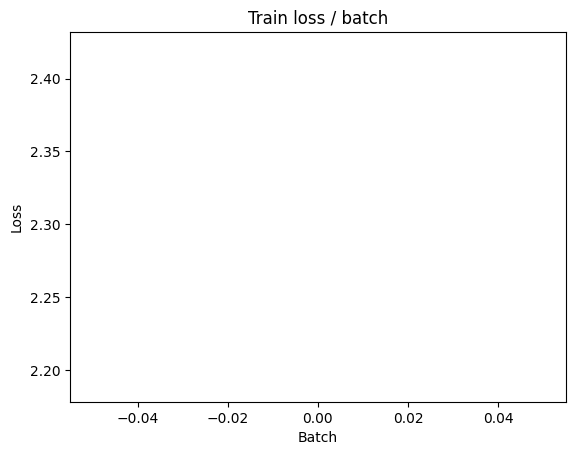

[TRAIN Batch 200/391]	Time 0.035s (0.020s)	Loss 1.8475 (2.1348)	Prec@1  38.3 ( 20.8)	Prec@5  80.5 ( 68.8)


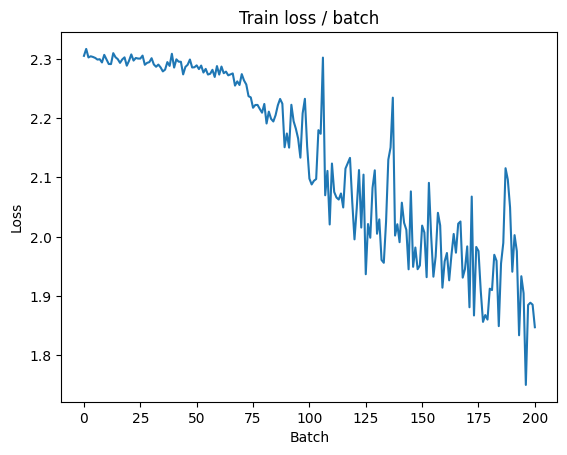


===============> Total time 8s	Avg loss 1.9710	Avg Prec@1 27.66 %	Avg Prec@5 76.77 %

[EVAL Batch 000/079]	Time 0.135s (0.135s)	Loss 1.6518 (1.6518)	Prec@1  39.8 ( 39.8)	Prec@5  89.1 ( 89.1)

===============> Total time 1s	Avg loss 1.6705	Avg Prec@1 39.06 %	Avg Prec@5 88.51 %



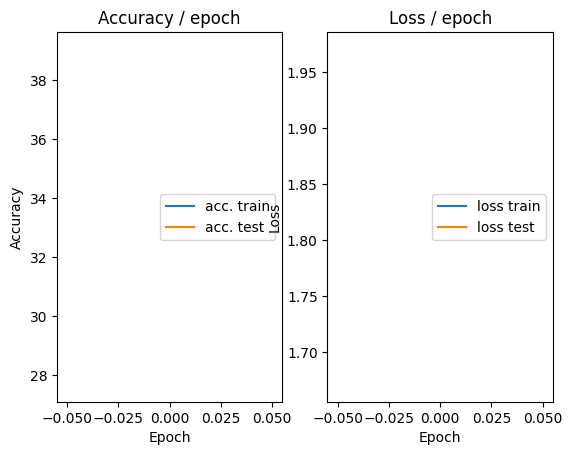

=== EPOCH 2 =====

[TRAIN Batch 000/391]	Time 0.152s (0.152s)	Loss 1.7609 (1.7609)	Prec@1  37.5 ( 37.5)	Prec@5  85.9 ( 85.9)


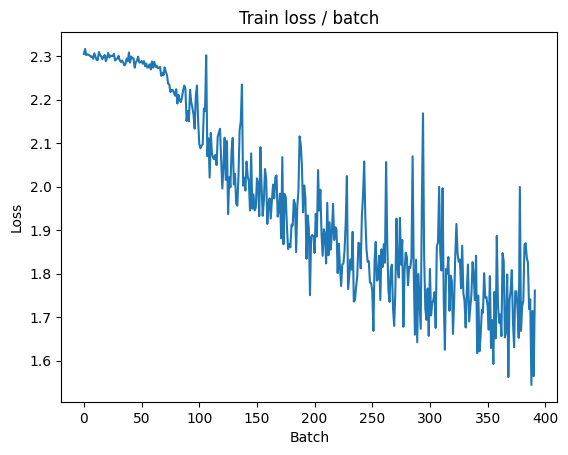

[TRAIN Batch 200/391]	Time 0.032s (0.021s)	Loss 1.5107 (1.6268)	Prec@1  41.4 ( 41.3)	Prec@5  90.6 ( 89.3)


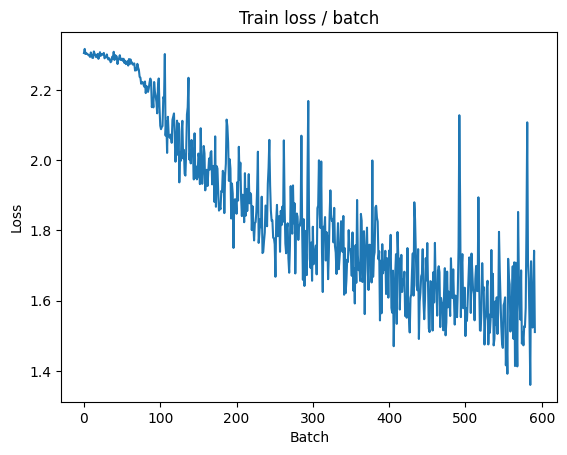


===============> Total time 8s	Avg loss 1.5853	Avg Prec@1 42.90 %	Avg Prec@5 89.91 %

[EVAL Batch 000/079]	Time 0.220s (0.220s)	Loss 1.3993 (1.3993)	Prec@1  52.3 ( 52.3)	Prec@5  91.4 ( 91.4)

===============> Total time 2s	Avg loss 1.4707	Avg Prec@1 47.16 %	Avg Prec@5 91.69 %



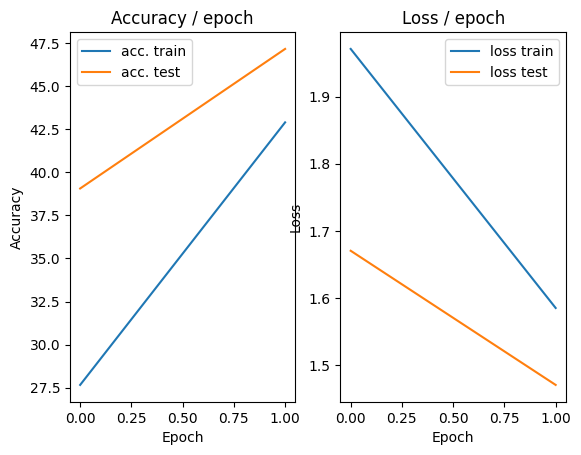

=== EPOCH 3 =====

[TRAIN Batch 000/391]	Time 0.157s (0.157s)	Loss 1.3166 (1.3166)	Prec@1  57.0 ( 57.0)	Prec@5  94.5 ( 94.5)


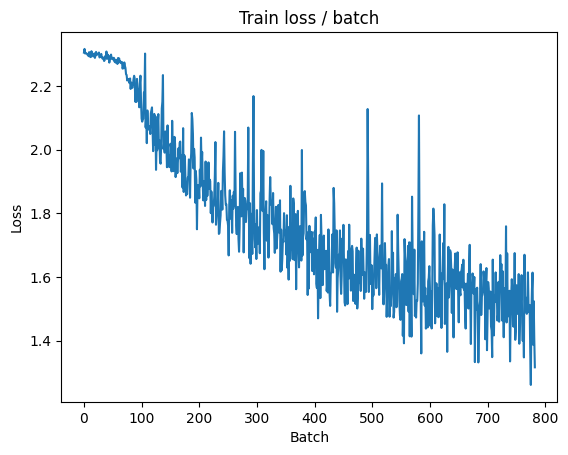

[TRAIN Batch 200/391]	Time 0.004s (0.021s)	Loss 1.5290 (1.4422)	Prec@1  39.8 ( 48.5)	Prec@5  93.8 ( 91.9)


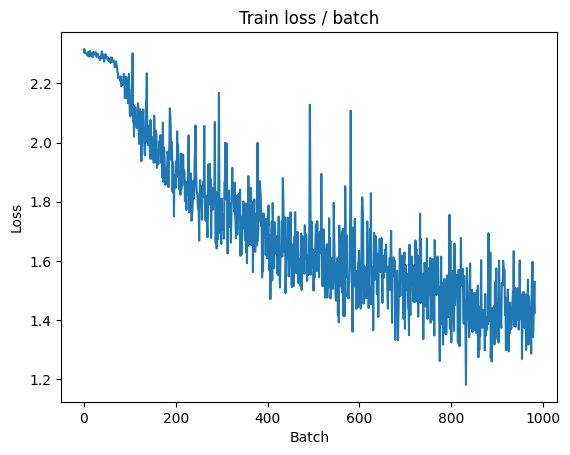


===============> Total time 8s	Avg loss 1.4189	Avg Prec@1 49.31 %	Avg Prec@5 92.26 %

[EVAL Batch 000/079]	Time 0.140s (0.140s)	Loss 1.2735 (1.2735)	Prec@1  55.5 ( 55.5)	Prec@5  96.1 ( 96.1)

===============> Total time 1s	Avg loss 1.4030	Avg Prec@1 49.43 %	Avg Prec@5 92.29 %



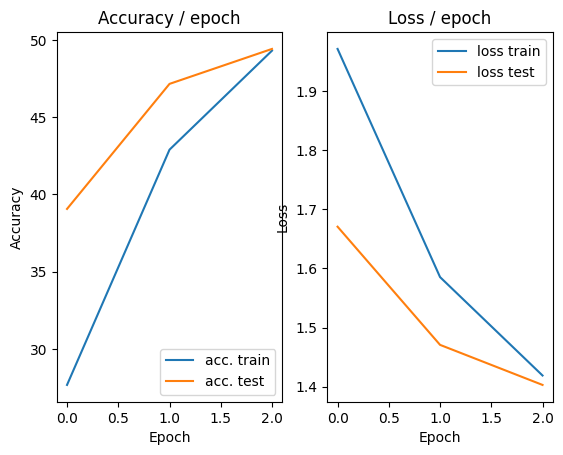

=== EPOCH 4 =====

[TRAIN Batch 000/391]	Time 0.242s (0.242s)	Loss 1.4645 (1.4645)	Prec@1  51.6 ( 51.6)	Prec@5  90.6 ( 90.6)


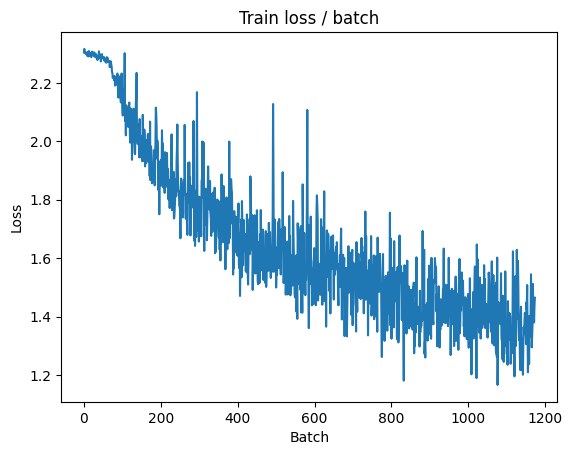

[TRAIN Batch 200/391]	Time 0.004s (0.024s)	Loss 1.3545 (1.3219)	Prec@1  47.7 ( 52.9)	Prec@5  95.3 ( 93.6)


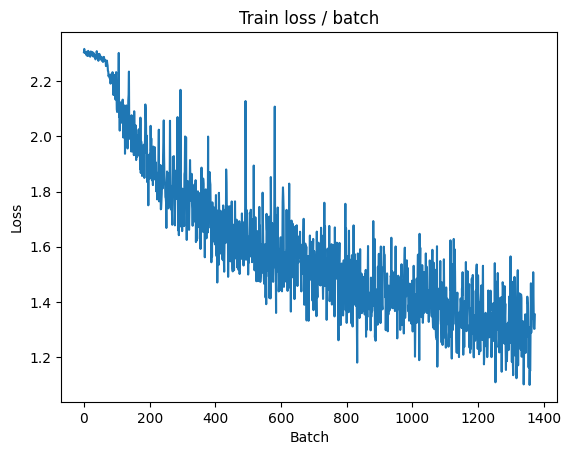


===============> Total time 8s	Avg loss 1.3045	Avg Prec@1 53.56 %	Avg Prec@5 93.96 %

[EVAL Batch 000/079]	Time 0.131s (0.131s)	Loss 1.1861 (1.1861)	Prec@1  59.4 ( 59.4)	Prec@5  96.1 ( 96.1)

===============> Total time 1s	Avg loss 1.2931	Avg Prec@1 54.43 %	Avg Prec@5 93.54 %



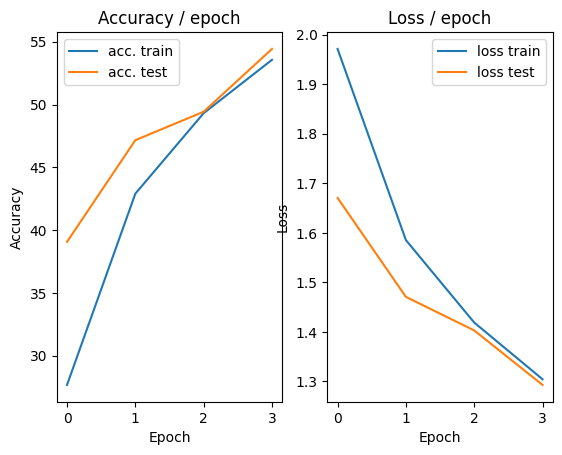

=== EPOCH 5 =====

[TRAIN Batch 000/391]	Time 0.157s (0.157s)	Loss 1.2981 (1.2981)	Prec@1  53.9 ( 53.9)	Prec@5  93.8 ( 93.8)


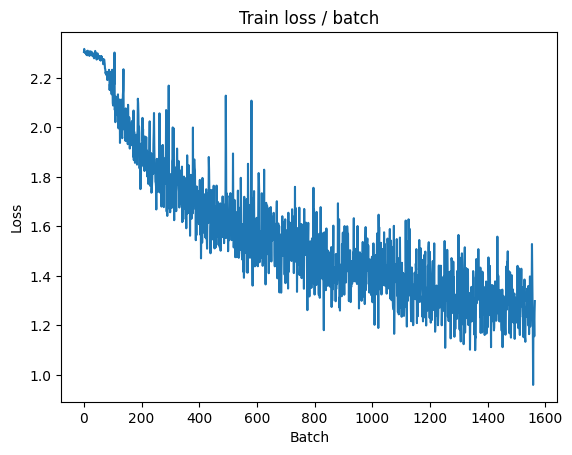

[TRAIN Batch 200/391]	Time 0.004s (0.026s)	Loss 1.1536 (1.2405)	Prec@1  58.6 ( 56.1)	Prec@5  96.9 ( 94.8)


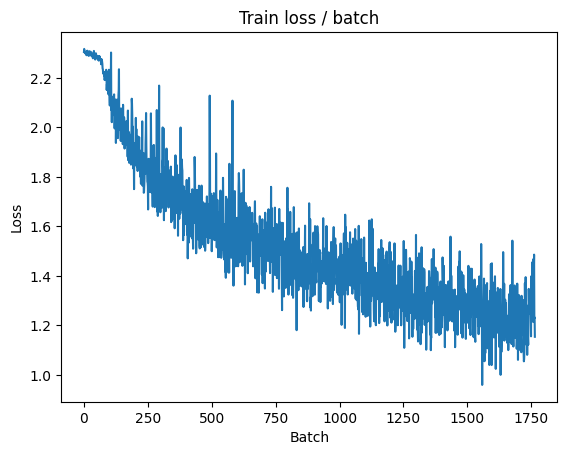


===============> Total time 9s	Avg loss 1.2305	Avg Prec@1 56.42 %	Avg Prec@5 94.80 %

[EVAL Batch 000/079]	Time 0.137s (0.137s)	Loss 1.1116 (1.1116)	Prec@1  60.9 ( 60.9)	Prec@5  95.3 ( 95.3)

===============> Total time 1s	Avg loss 1.2541	Avg Prec@1 56.08 %	Avg Prec@5 94.02 %



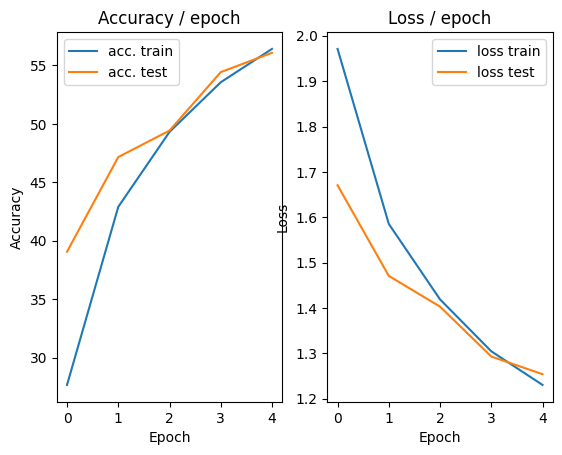

=== EPOCH 6 =====

[TRAIN Batch 000/391]	Time 0.152s (0.152s)	Loss 1.1335 (1.1335)	Prec@1  63.3 ( 63.3)	Prec@5  93.0 ( 93.0)


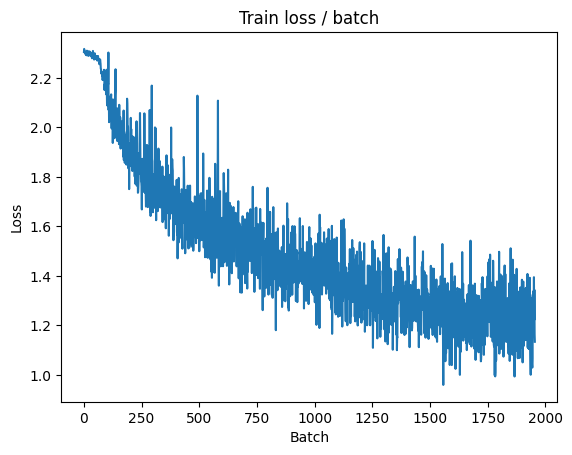

[TRAIN Batch 200/391]	Time 0.004s (0.025s)	Loss 1.0549 (1.1761)	Prec@1  63.3 ( 58.4)	Prec@5  96.1 ( 95.3)


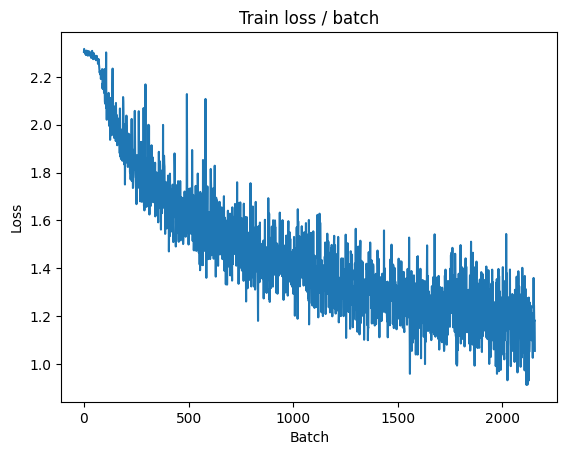


===============> Total time 9s	Avg loss 1.1699	Avg Prec@1 58.56 %	Avg Prec@5 95.33 %

[EVAL Batch 000/079]	Time 0.139s (0.139s)	Loss 1.0536 (1.0536)	Prec@1  62.5 ( 62.5)	Prec@5  95.3 ( 95.3)

===============> Total time 1s	Avg loss 1.2628	Avg Prec@1 55.48 %	Avg Prec@5 94.38 %



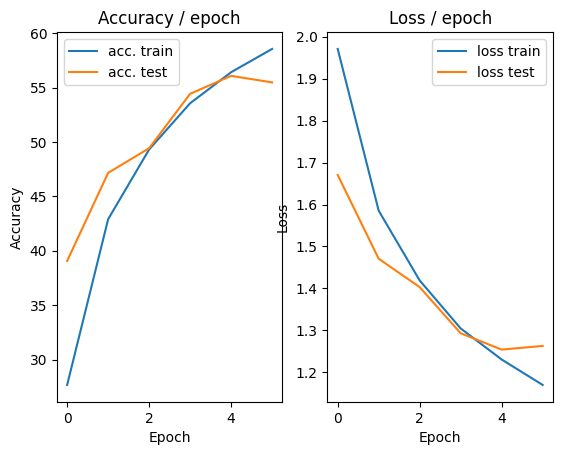

=== EPOCH 7 =====

[TRAIN Batch 000/391]	Time 0.152s (0.152s)	Loss 1.1306 (1.1306)	Prec@1  61.7 ( 61.7)	Prec@5  92.2 ( 92.2)


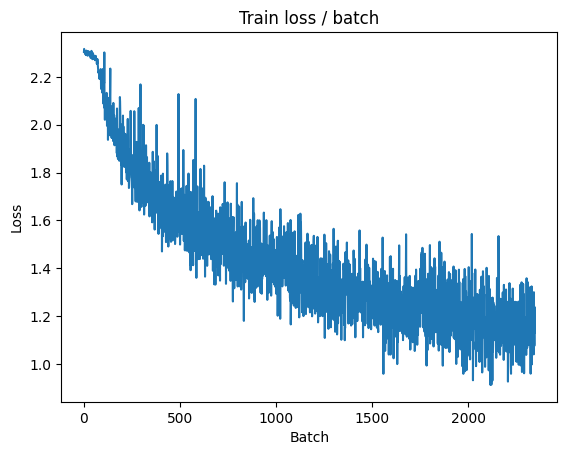

[TRAIN Batch 200/391]	Time 0.027s (0.021s)	Loss 1.1085 (1.1156)	Prec@1  58.6 ( 60.3)	Prec@5  96.9 ( 95.9)


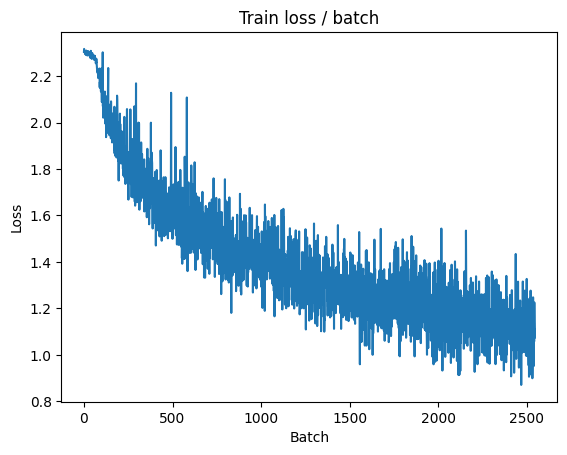


===============> Total time 9s	Avg loss 1.1240	Avg Prec@1 60.28 %	Avg Prec@5 95.73 %

[EVAL Batch 000/079]	Time 0.137s (0.137s)	Loss 1.1148 (1.1148)	Prec@1  57.8 ( 57.8)	Prec@5  96.1 ( 96.1)

===============> Total time 1s	Avg loss 1.2096	Avg Prec@1 56.85 %	Avg Prec@5 94.96 %



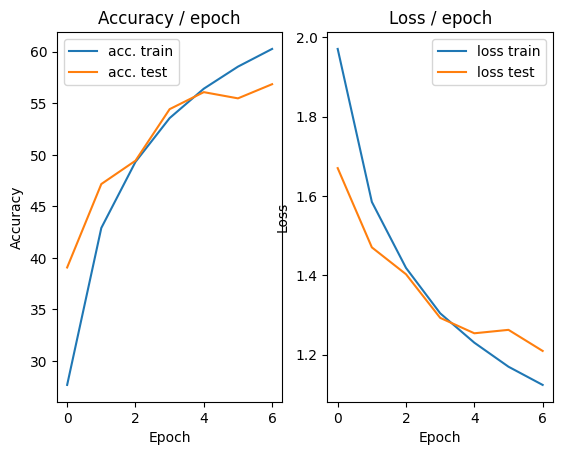

=== EPOCH 8 =====

[TRAIN Batch 000/391]	Time 0.163s (0.163s)	Loss 1.3412 (1.3412)	Prec@1  52.3 ( 52.3)	Prec@5  91.4 ( 91.4)


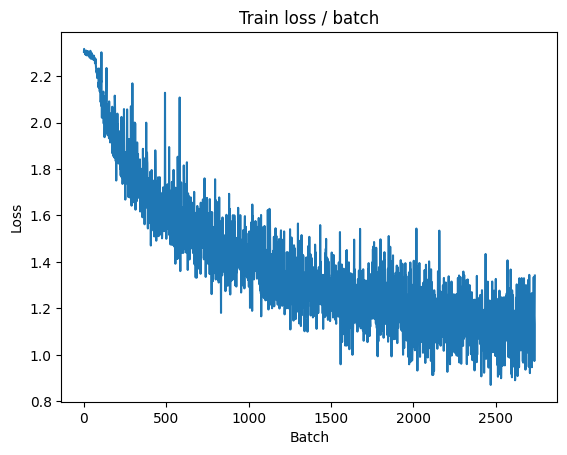

[TRAIN Batch 200/391]	Time 0.029s (0.021s)	Loss 1.1179 (1.0814)	Prec@1  60.2 ( 61.5)	Prec@5  94.5 ( 96.2)


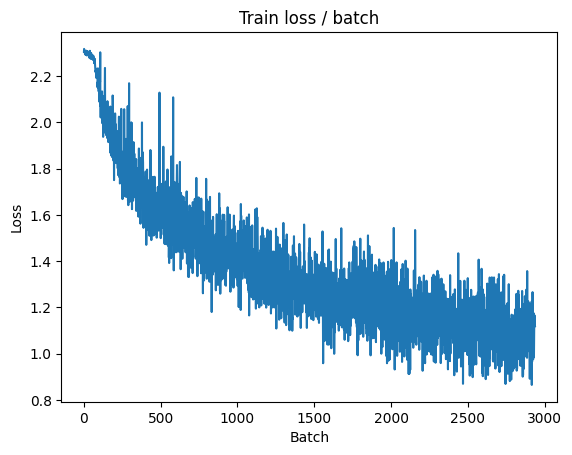


===============> Total time 8s	Avg loss 1.0804	Avg Prec@1 61.76 %	Avg Prec@5 96.19 %

[EVAL Batch 000/079]	Time 0.170s (0.170s)	Loss 0.9822 (0.9822)	Prec@1  64.8 ( 64.8)	Prec@5  96.1 ( 96.1)

===============> Total time 1s	Avg loss 1.1831	Avg Prec@1 58.09 %	Avg Prec@5 95.19 %



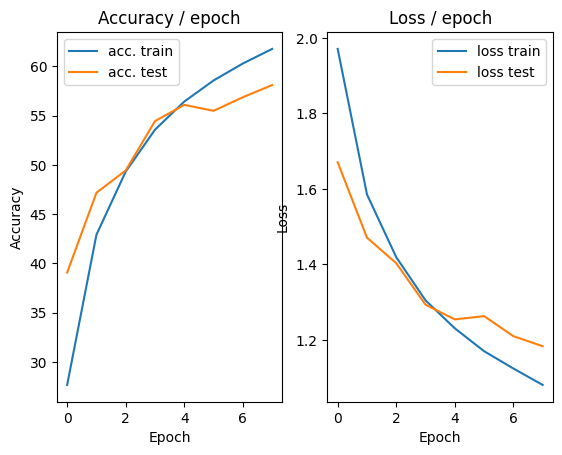

=== EPOCH 9 =====

[TRAIN Batch 000/391]	Time 0.156s (0.156s)	Loss 1.1585 (1.1585)	Prec@1  63.3 ( 63.3)	Prec@5  95.3 ( 95.3)


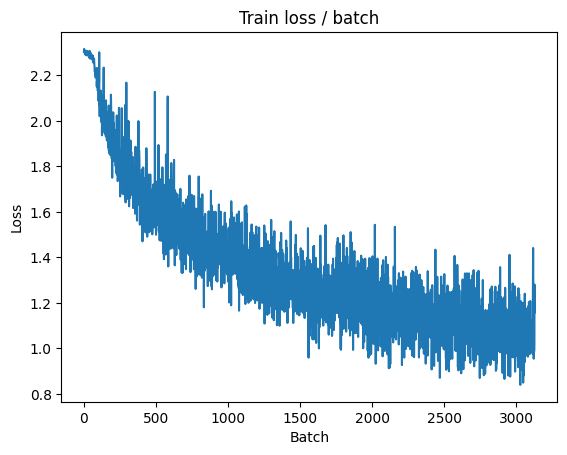

[TRAIN Batch 200/391]	Time 0.007s (0.021s)	Loss 1.0821 (1.0396)	Prec@1  60.9 ( 63.2)	Prec@5  94.5 ( 96.5)


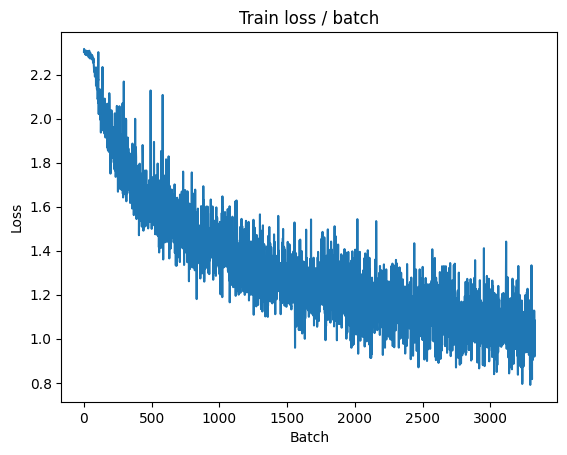


===============> Total time 7s	Avg loss 1.0415	Avg Prec@1 63.11 %	Avg Prec@5 96.41 %

[EVAL Batch 000/079]	Time 0.141s (0.141s)	Loss 1.0166 (1.0166)	Prec@1  62.5 ( 62.5)	Prec@5  96.1 ( 96.1)

===============> Total time 2s	Avg loss 1.1458	Avg Prec@1 59.59 %	Avg Prec@5 95.58 %



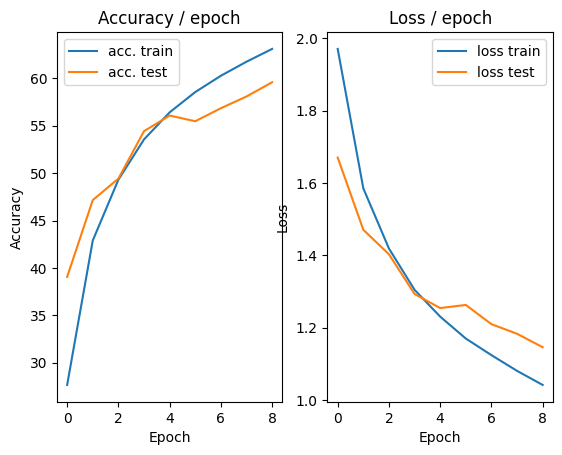

=== EPOCH 10 =====

[TRAIN Batch 000/391]	Time 0.231s (0.231s)	Loss 1.1629 (1.1629)	Prec@1  60.2 ( 60.2)	Prec@5  96.1 ( 96.1)


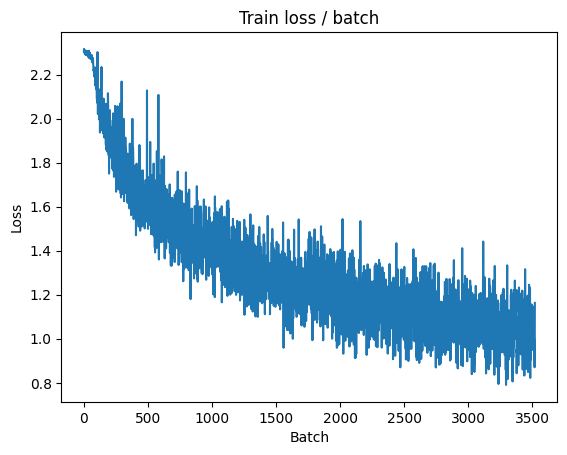

[TRAIN Batch 200/391]	Time 0.006s (0.021s)	Loss 1.0646 (1.0071)	Prec@1  65.6 ( 64.6)	Prec@5  94.5 ( 96.7)


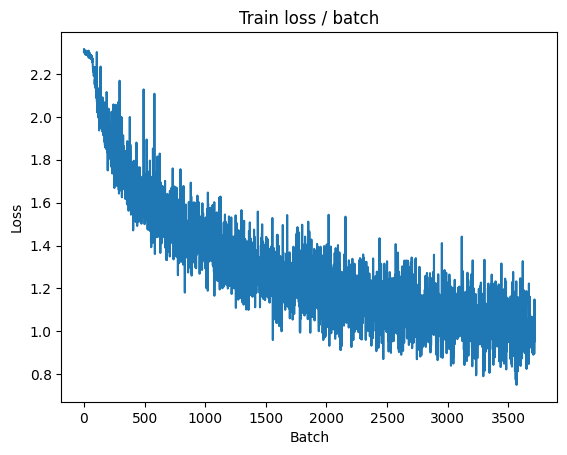


===============> Total time 8s	Avg loss 1.0086	Avg Prec@1 64.44 %	Avg Prec@5 96.74 %

[EVAL Batch 000/079]	Time 0.131s (0.131s)	Loss 0.9071 (0.9071)	Prec@1  68.0 ( 68.0)	Prec@5  96.9 ( 96.9)

===============> Total time 1s	Avg loss 1.1097	Avg Prec@1 61.12 %	Avg Prec@5 95.63 %



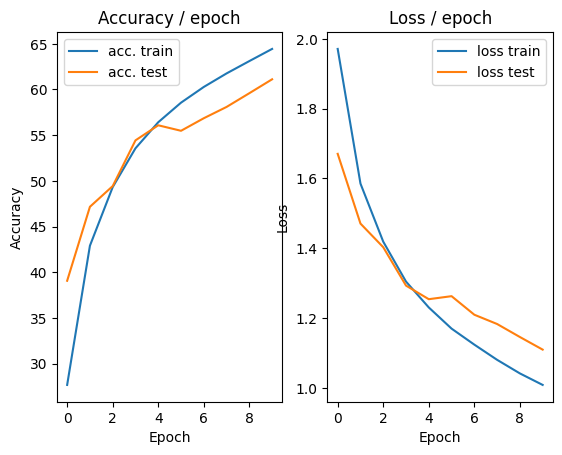

=== EPOCH 11 =====

[TRAIN Batch 000/391]	Time 0.156s (0.156s)	Loss 0.9758 (0.9758)	Prec@1  71.1 ( 71.1)	Prec@5  95.3 ( 95.3)


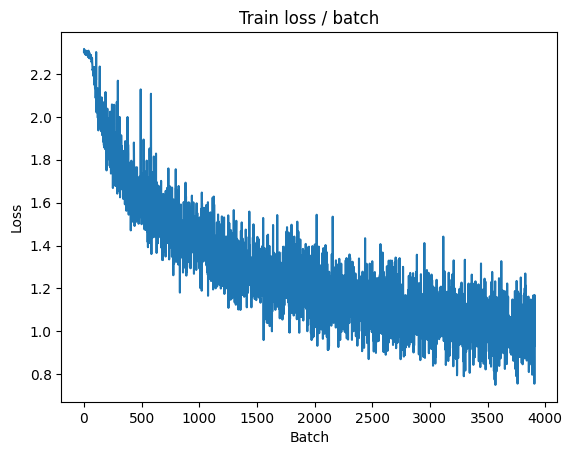

[TRAIN Batch 200/391]	Time 0.035s (0.028s)	Loss 1.0044 (0.9643)	Prec@1  61.7 ( 66.1)	Prec@5  97.7 ( 97.0)


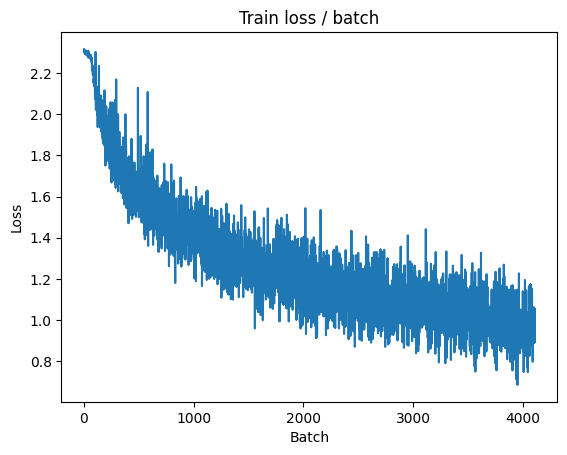


===============> Total time 9s	Avg loss 0.9753	Avg Prec@1 65.74 %	Avg Prec@5 97.00 %

[EVAL Batch 000/079]	Time 0.150s (0.150s)	Loss 0.9310 (0.9310)	Prec@1  69.5 ( 69.5)	Prec@5  95.3 ( 95.3)

===============> Total time 1s	Avg loss 1.1248	Avg Prec@1 60.42 %	Avg Prec@5 95.76 %



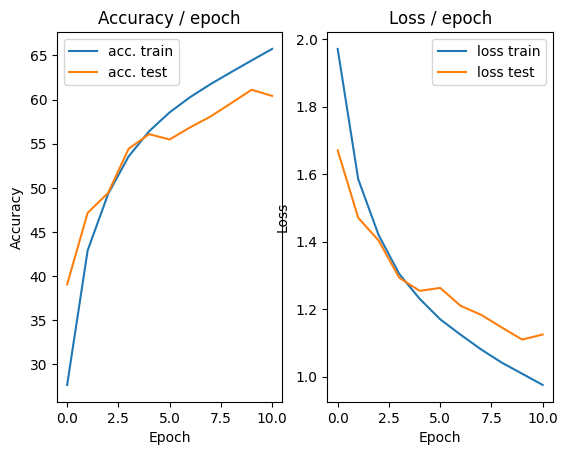

=== EPOCH 12 =====

[TRAIN Batch 000/391]	Time 0.182s (0.182s)	Loss 0.7975 (0.7975)	Prec@1  71.9 ( 71.9)	Prec@5  97.7 ( 97.7)


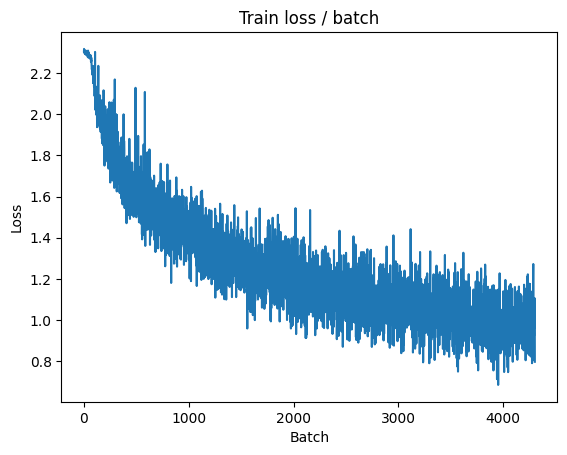

[TRAIN Batch 200/391]	Time 0.030s (0.027s)	Loss 1.0305 (0.9407)	Prec@1  65.6 ( 67.0)	Prec@5  96.1 ( 97.2)


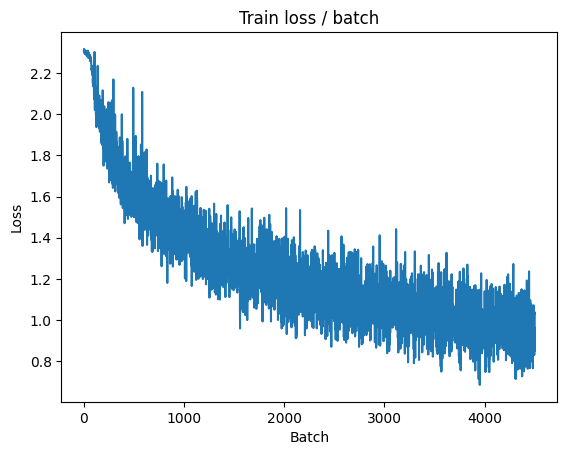


===============> Total time 9s	Avg loss 0.9432	Avg Prec@1 66.89 %	Avg Prec@5 97.17 %

[EVAL Batch 000/079]	Time 0.139s (0.139s)	Loss 0.8798 (0.8798)	Prec@1  71.1 ( 71.1)	Prec@5  96.9 ( 96.9)

===============> Total time 1s	Avg loss 1.0767	Avg Prec@1 62.21 %	Avg Prec@5 95.96 %



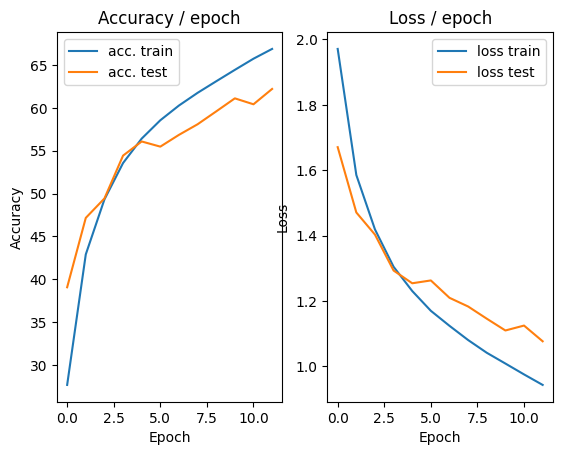

=== EPOCH 13 =====

[TRAIN Batch 000/391]	Time 0.166s (0.166s)	Loss 0.9338 (0.9338)	Prec@1  63.3 ( 63.3)	Prec@5  99.2 ( 99.2)


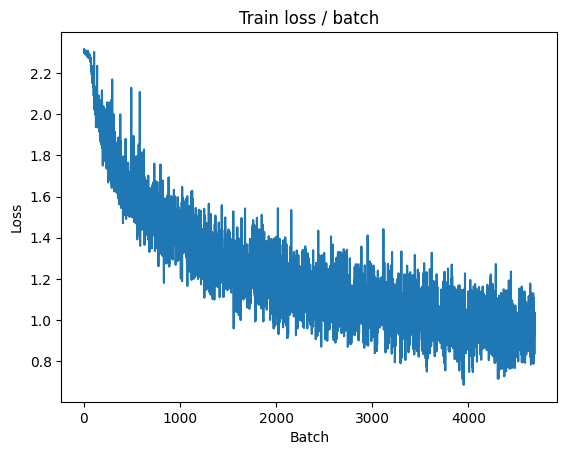

[TRAIN Batch 200/391]	Time 0.055s (0.023s)	Loss 0.9119 (0.9065)	Prec@1  66.4 ( 68.3)	Prec@5  97.7 ( 97.5)


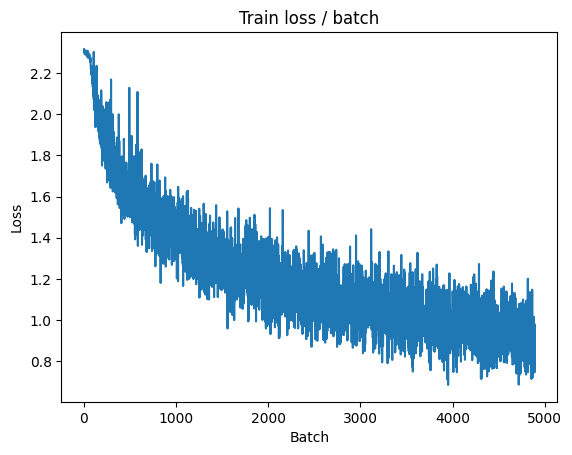


===============> Total time 9s	Avg loss 0.9138	Avg Prec@1 67.87 %	Avg Prec@5 97.40 %

[EVAL Batch 000/079]	Time 0.138s (0.138s)	Loss 0.9335 (0.9335)	Prec@1  67.2 ( 67.2)	Prec@5  97.7 ( 97.7)

===============> Total time 1s	Avg loss 1.1003	Avg Prec@1 61.13 %	Avg Prec@5 95.92 %



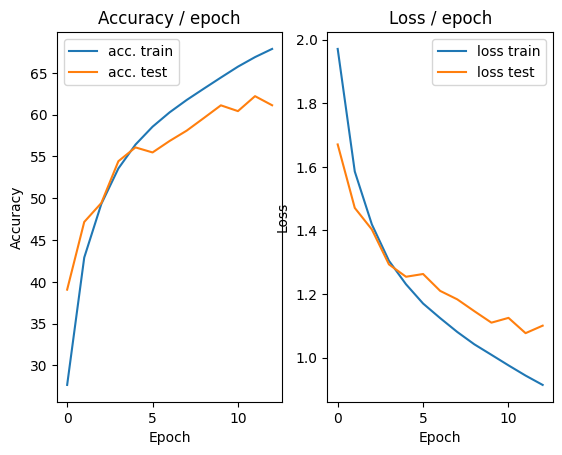

=== EPOCH 14 =====

[TRAIN Batch 000/391]	Time 0.156s (0.156s)	Loss 0.8943 (0.8943)	Prec@1  68.0 ( 68.0)	Prec@5  97.7 ( 97.7)


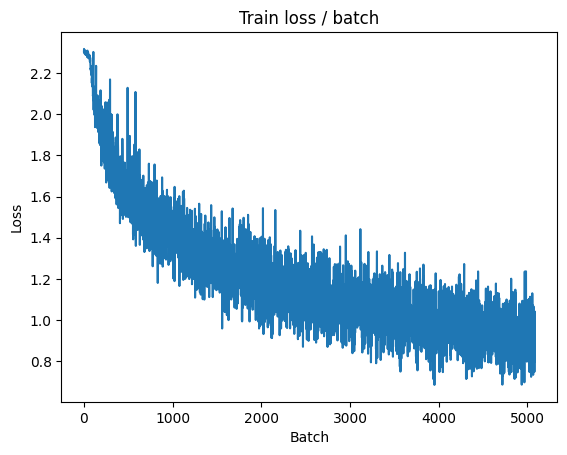

[TRAIN Batch 200/391]	Time 0.034s (0.021s)	Loss 0.7257 (0.8825)	Prec@1  75.8 ( 69.3)	Prec@5  96.9 ( 97.6)


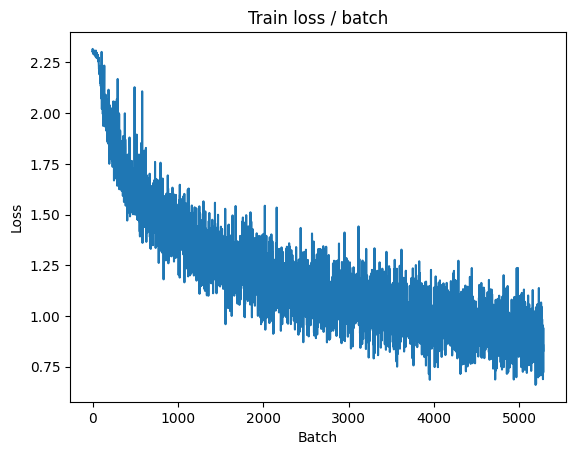


===============> Total time 9s	Avg loss 0.8833	Avg Prec@1 69.07 %	Avg Prec@5 97.57 %

[EVAL Batch 000/079]	Time 0.130s (0.130s)	Loss 0.8669 (0.8669)	Prec@1  70.3 ( 70.3)	Prec@5  96.1 ( 96.1)

===============> Total time 1s	Avg loss 1.0833	Avg Prec@1 61.68 %	Avg Prec@5 95.97 %



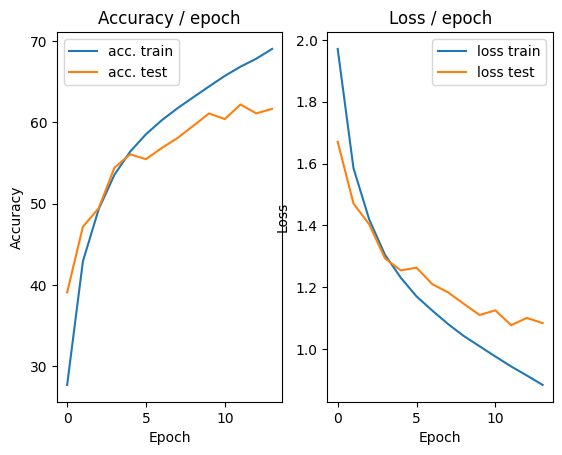

=== EPOCH 15 =====

[TRAIN Batch 000/391]	Time 0.170s (0.170s)	Loss 0.9035 (0.9035)	Prec@1  68.8 ( 68.8)	Prec@5  98.4 ( 98.4)


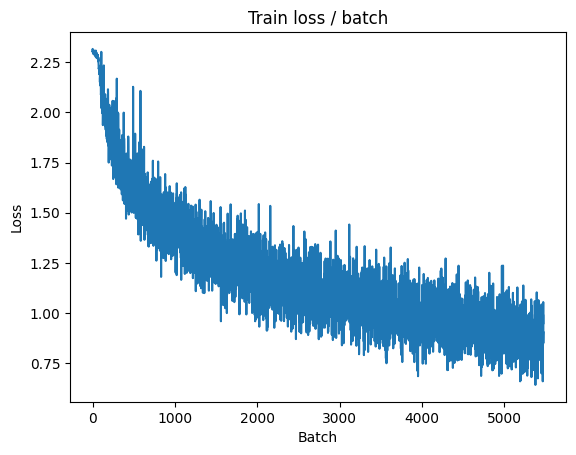

[TRAIN Batch 200/391]	Time 0.034s (0.021s)	Loss 0.8699 (0.8458)	Prec@1  68.8 ( 70.3)	Prec@5  96.9 ( 97.8)


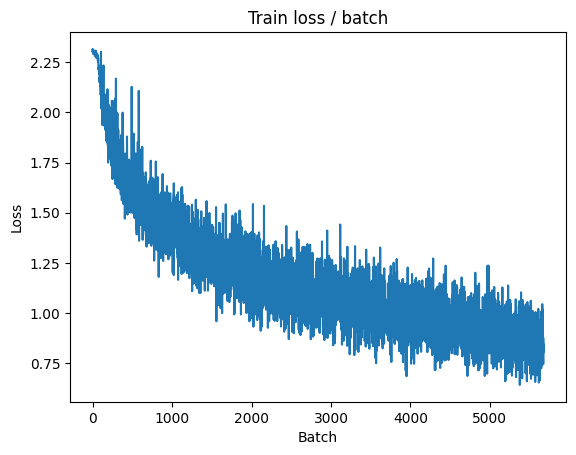


===============> Total time 8s	Avg loss 0.8543	Avg Prec@1 70.08 %	Avg Prec@5 97.75 %

[EVAL Batch 000/079]	Time 0.171s (0.171s)	Loss 0.8815 (0.8815)	Prec@1  71.9 ( 71.9)	Prec@5  96.9 ( 96.9)

===============> Total time 2s	Avg loss 1.0679	Avg Prec@1 63.03 %	Avg Prec@5 96.19 %



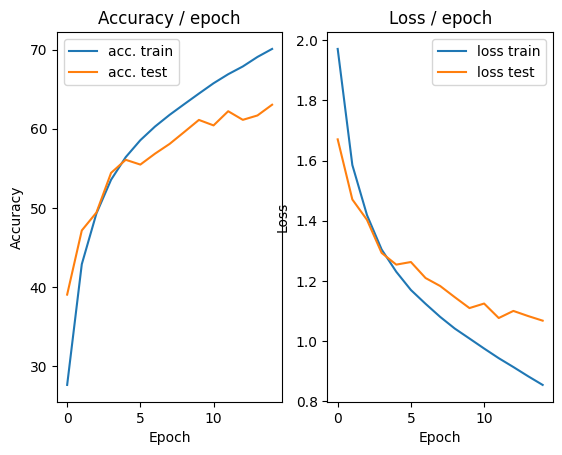

=== EPOCH 16 =====

[TRAIN Batch 000/391]	Time 0.185s (0.185s)	Loss 0.9326 (0.9326)	Prec@1  66.4 ( 66.4)	Prec@5  96.1 ( 96.1)


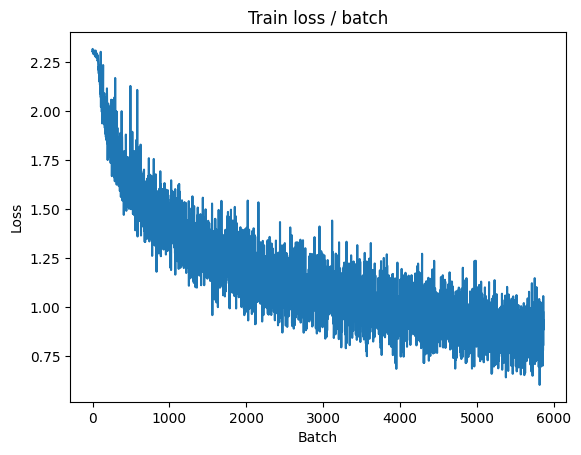

[TRAIN Batch 200/391]	Time 0.033s (0.021s)	Loss 0.7737 (0.8257)	Prec@1  73.4 ( 71.1)	Prec@5  96.9 ( 98.0)


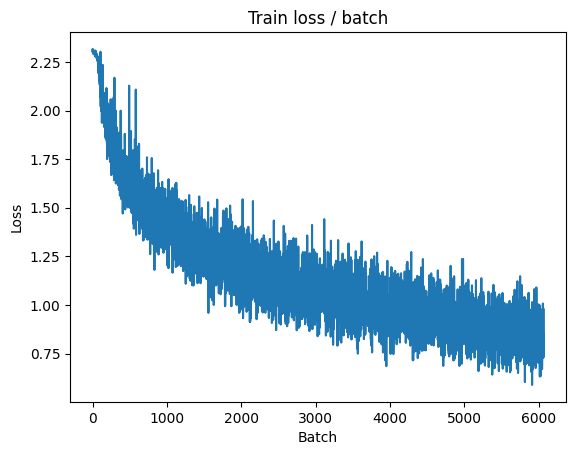


===============> Total time 8s	Avg loss 0.8282	Avg Prec@1 71.02 %	Avg Prec@5 97.98 %

[EVAL Batch 000/079]	Time 0.142s (0.142s)	Loss 0.8561 (0.8561)	Prec@1  70.3 ( 70.3)	Prec@5  96.1 ( 96.1)

===============> Total time 1s	Avg loss 1.0500	Avg Prec@1 63.17 %	Avg Prec@5 96.15 %



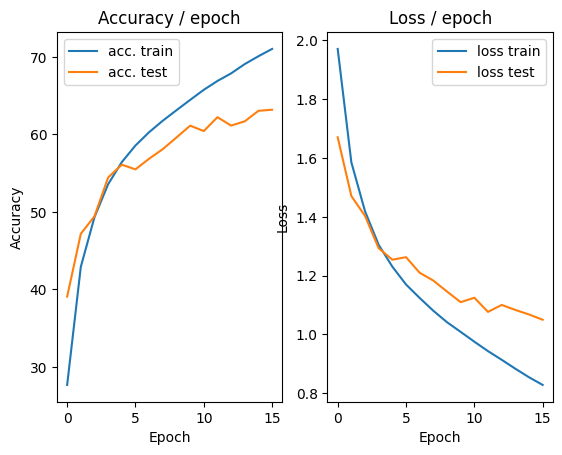

=== EPOCH 17 =====

[TRAIN Batch 000/391]	Time 0.225s (0.225s)	Loss 0.6940 (0.6940)	Prec@1  79.7 ( 79.7)	Prec@5  97.7 ( 97.7)


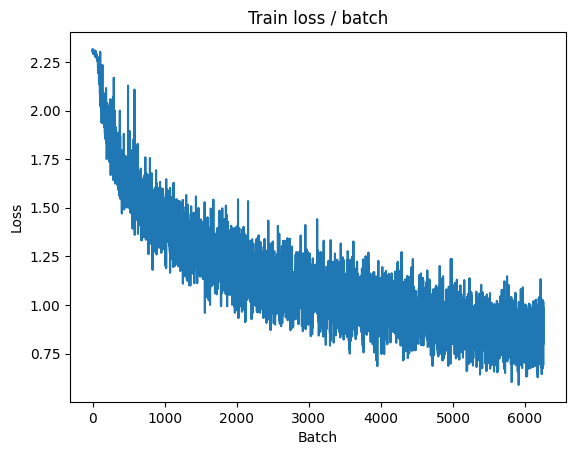

[TRAIN Batch 200/391]	Time 0.004s (0.024s)	Loss 0.8590 (0.8011)	Prec@1  72.7 ( 72.1)	Prec@5  97.7 ( 98.1)


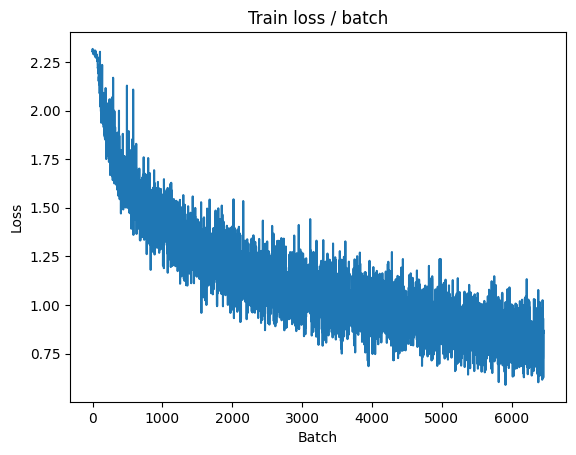


===============> Total time 8s	Avg loss 0.8006	Avg Prec@1 72.04 %	Avg Prec@5 98.12 %

[EVAL Batch 000/079]	Time 0.136s (0.136s)	Loss 0.9458 (0.9458)	Prec@1  67.2 ( 67.2)	Prec@5  96.9 ( 96.9)

===============> Total time 1s	Avg loss 1.0985	Avg Prec@1 62.50 %	Avg Prec@5 95.81 %



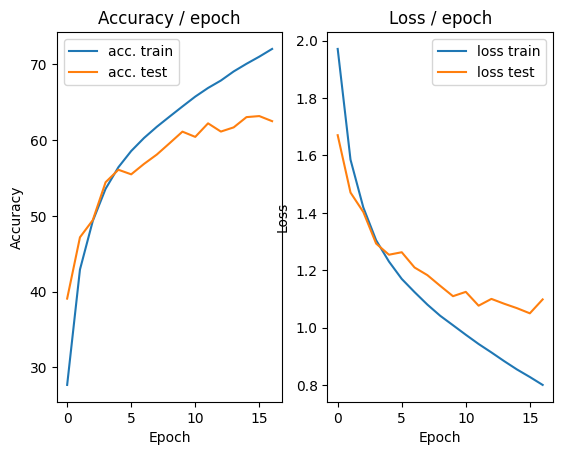

=== EPOCH 18 =====

[TRAIN Batch 000/391]	Time 0.182s (0.182s)	Loss 0.7586 (0.7586)	Prec@1  67.2 ( 67.2)	Prec@5  98.4 ( 98.4)


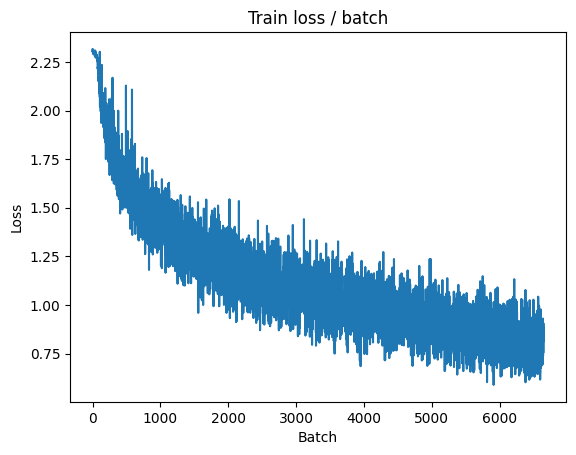

[TRAIN Batch 200/391]	Time 0.004s (0.026s)	Loss 0.6240 (0.7791)	Prec@1  82.8 ( 72.8)	Prec@5 100.0 ( 98.2)


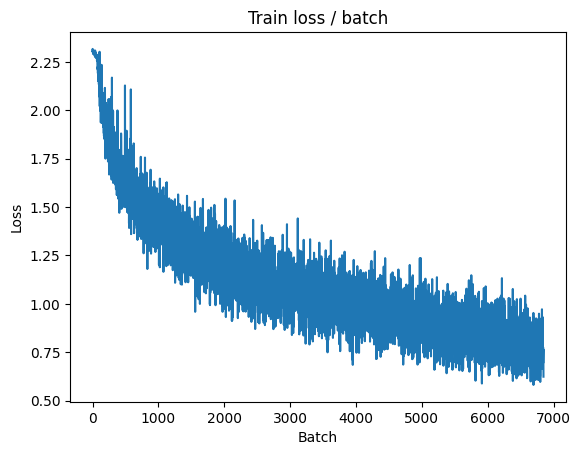


===============> Total time 9s	Avg loss 0.7781	Avg Prec@1 72.74 %	Avg Prec@5 98.27 %

[EVAL Batch 000/079]	Time 0.144s (0.144s)	Loss 0.9072 (0.9072)	Prec@1  71.1 ( 71.1)	Prec@5  97.7 ( 97.7)

===============> Total time 1s	Avg loss 1.0762	Avg Prec@1 63.03 %	Avg Prec@5 96.12 %



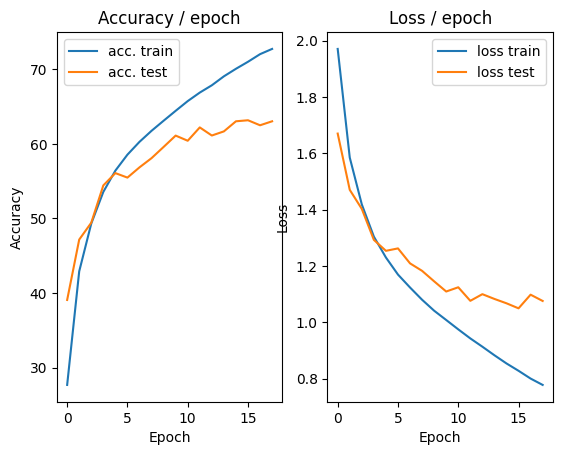

=== EPOCH 19 =====

[TRAIN Batch 000/391]	Time 0.196s (0.196s)	Loss 0.7183 (0.7183)	Prec@1  78.1 ( 78.1)	Prec@5 100.0 (100.0)


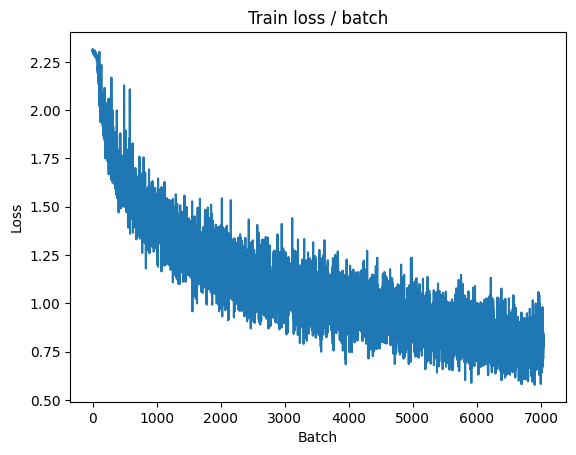

[TRAIN Batch 200/391]	Time 0.070s (0.027s)	Loss 0.8592 (0.7517)	Prec@1  70.3 ( 73.7)	Prec@5  98.4 ( 98.4)


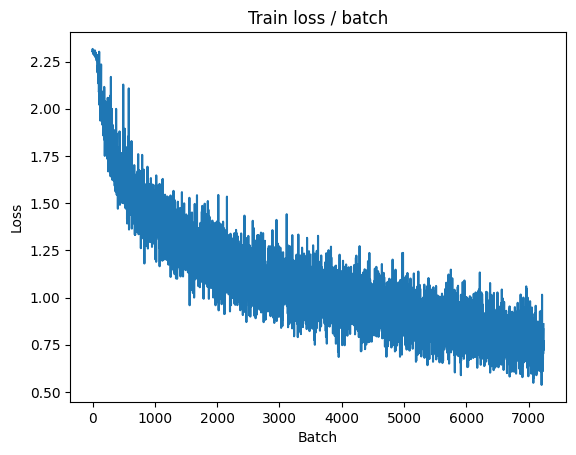


===============> Total time 9s	Avg loss 0.7521	Avg Prec@1 73.74 %	Avg Prec@5 98.39 %

[EVAL Batch 000/079]	Time 0.153s (0.153s)	Loss 0.8427 (0.8427)	Prec@1  73.4 ( 73.4)	Prec@5  96.1 ( 96.1)

===============> Total time 1s	Avg loss 1.0418	Avg Prec@1 64.46 %	Avg Prec@5 96.22 %



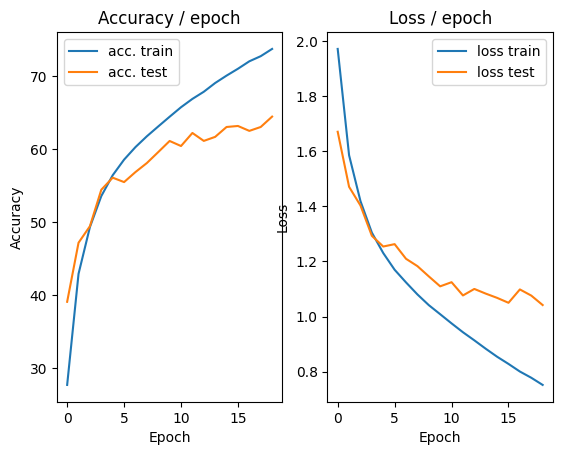

=== EPOCH 20 =====

[TRAIN Batch 000/391]	Time 0.201s (0.201s)	Loss 0.7932 (0.7932)	Prec@1  72.7 ( 72.7)	Prec@5  96.9 ( 96.9)


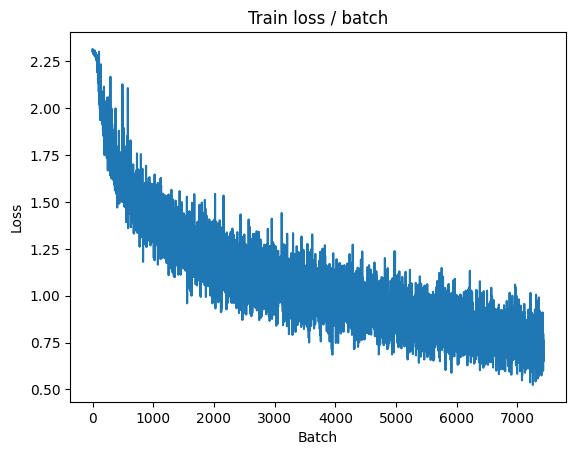

[TRAIN Batch 200/391]	Time 0.040s (0.021s)	Loss 0.8005 (0.7238)	Prec@1  68.8 ( 74.9)	Prec@5  98.4 ( 98.4)


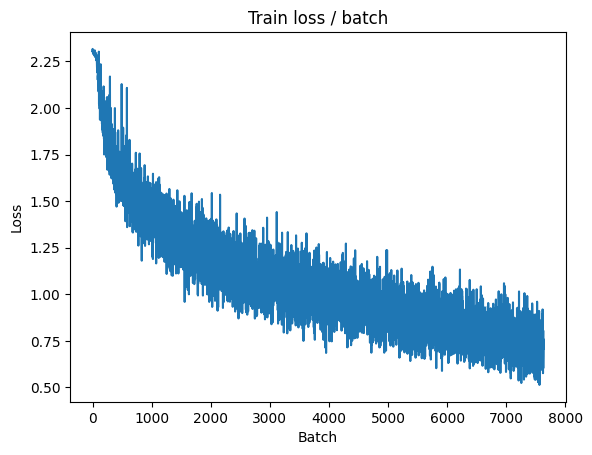


===============> Total time 9s	Avg loss 0.7267	Avg Prec@1 74.68 %	Avg Prec@5 98.51 %

[EVAL Batch 000/079]	Time 0.168s (0.168s)	Loss 0.8393 (0.8393)	Prec@1  71.1 ( 71.1)	Prec@5  95.3 ( 95.3)

===============> Total time 1s	Avg loss 1.0284	Avg Prec@1 64.43 %	Avg Prec@5 96.29 %



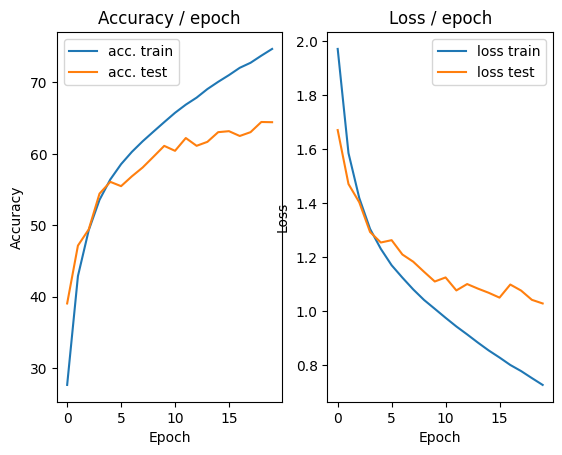

In [ ]:
main(batch_size=128, lr=0.1, epochs=20,cuda=True)

## Regularization of the network by dropout

In [ ]:

class ConvNet(nn.Module):
    """
    This class defines the structure of the neural network
    """

    def __init__(self):
        super(ConvNet, self).__init__()
        # We first define the convolution and pooling layers as a features extractor
        self.features = nn.Sequential(
            nn.Conv2d(3, 6, (5, 5), stride=1, padding=2),
            nn.ReLU(),
            nn.MaxPool2d((2, 2), stride=2, padding=0),
            nn.Conv2d(6, 16, (5, 5), stride=1, padding=0),
            nn.ReLU(),
            nn.MaxPool2d((2, 2), stride=2, padding=0),
        )
        # We then define fully connected layers as a classifier
        self.classifier = nn.Sequential(
            nn.Linear(576, 256),
            nn.ReLU(),
            nn.Linear(256, 84),
            nn.ReLU(),
            nn.Dropout(p=0.5),
            nn.Linear(84, 10)
            # Reminder: The softmax is included in the loss, do not put it here
        )

    # Method called when we apply the network to an input batch
    def forward(self, input):
        bsize = input.size(0) # batch size
        output = self.features(input) # output of the conv layers
        output = output.view(bsize, -1) # we flatten the 2D feature maps into one 1D vector for each input
        output = self.classifier(output) # we compute the output of the fc layers
        return output



def get_dataset(batch_size, cuda=False):
    """
    This function loads the dataset and performs transformations on each
    image (listed in `transform = ...`).
    """
    train_dataset = datasets.CIFAR10(PATH, train=True, download=True,
        transform=transforms.Compose([
            transforms.ToTensor()
        ]))

    val_dataset = datasets.CIFAR10(PATH, train=False, download=True,
        transform=transforms.Compose([
            transforms.ToTensor()
        ]))

    train_loader = torch.utils.data.DataLoader(train_dataset,
                        batch_size=batch_size, shuffle=True, pin_memory=cuda, num_workers=2)
    val_loader = torch.utils.data.DataLoader(val_dataset,
                        batch_size=batch_size, shuffle=False, pin_memory=cuda, num_workers=2)

    return train_loader, val_loader



def epoch(data, model, criterion, optimizer=None, cuda=False):
    """
    Make a pass (called epoch in English) on the data `data` with the
     model `model`. Evaluates `criterion` as loss.
     If `optimizer` is given, perform a training epoch using
     the given optimizer, otherwise, perform an evaluation epoch (no backward)
     of the model.
    """

    # indicates whether the model is in eval or train mode (some layers behave differently in train and eval)
    model.eval() if optimizer is None else model.train()

    # objects to store metric averages
    avg_loss = AverageMeter()
    avg_top1_acc = AverageMeter()
    avg_top5_acc = AverageMeter()
    avg_batch_time = AverageMeter()
    global loss_plot

    # we iterate on the batches
    tic = time.time()
    for i, (input, target) in enumerate(data):

        if cuda: # only with GPU, and not with CPU
            input = input.cuda()
            target = target.cuda()

        # forward
        output = model(input)
        loss = criterion(output, target)

        # backward if we are training
        if optimizer:
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

        # compute metrics
        prec1, prec5 = accuracy(output, target, topk=(1, 5))
        batch_time = time.time() - tic
        tic = time.time()

        # update
        avg_loss.update(loss.item())
        avg_top1_acc.update(prec1.item())
        avg_top5_acc.update(prec5.item())
        avg_batch_time.update(batch_time)
        if optimizer:
            loss_plot.update(avg_loss.val)
        # print info
        if i % PRINT_INTERVAL == 0:
            print('[{0:s} Batch {1:03d}/{2:03d}]\t'
                  'Time {batch_time.val:.3f}s ({batch_time.avg:.3f}s)\t'
                  'Loss {loss.val:.4f} ({loss.avg:.4f})\t'
                  'Prec@1 {top1.val:5.1f} ({top1.avg:5.1f})\t'
                  'Prec@5 {top5.val:5.1f} ({top5.avg:5.1f})'.format(
                   "EVAL" if optimizer is None else "TRAIN", i, len(data), batch_time=avg_batch_time, loss=avg_loss,
                   top1=avg_top1_acc, top5=avg_top5_acc))
            if optimizer:
                loss_plot.plot()

    # Print summary
    print('\n===============> Total time {batch_time:d}s\t'
          'Avg loss {loss.avg:.4f}\t'
          'Avg Prec@1 {top1.avg:5.2f} %\t'
          'Avg Prec@5 {top5.avg:5.2f} %\n'.format(
           batch_time=int(avg_batch_time.sum), loss=avg_loss,
           top1=avg_top1_acc, top5=avg_top5_acc))

    return avg_top1_acc, avg_top5_acc, avg_loss


def main(batch_size=128, lr=0.1, epochs=5, cuda=False):

    # ex :
    #   {"batch_size": 128, "epochs": 5, "lr": 0.1}

    # define model, loss, optim
    model = ConvNet()
    criterion = nn.CrossEntropyLoss()
    optimizer = torch.optim.SGD(model.parameters(), lr)

    if cuda: # only with GPU, and not with CPU
        cudnn.benchmark = True
        model = model.cuda()
        criterion = criterion.cuda()

    # Get the data
    train, test = get_dataset(batch_size, cuda)

    # init plots
    plot = AccLossPlot()
    global loss_plot
    loss_plot = TrainLossPlot()

    # We iterate on the epochs
    for i in range(epochs):
        print("=================\n=== EPOCH "+str(i+1)+" =====\n=================\n")
        # Train phase
        top1_acc, avg_top5_acc, loss = epoch(train, model, criterion, optimizer, cuda)
        # Test phase
        top1_acc_test, top5_acc_test, loss_test = epoch(test, model, criterion, cuda=cuda)
        # plot
        plot.update(loss.avg, loss_test.avg, top1_acc.avg, top1_acc_test.avg)


Files already downloaded and verified
Files already downloaded and verified
=== EPOCH 1 =====

[TRAIN Batch 000/391]	Time 0.190s (0.190s)	Loss 2.3084 (2.3084)	Prec@1  11.7 ( 11.7)	Prec@5  47.7 ( 47.7)


<Figure size 640x480 with 0 Axes>

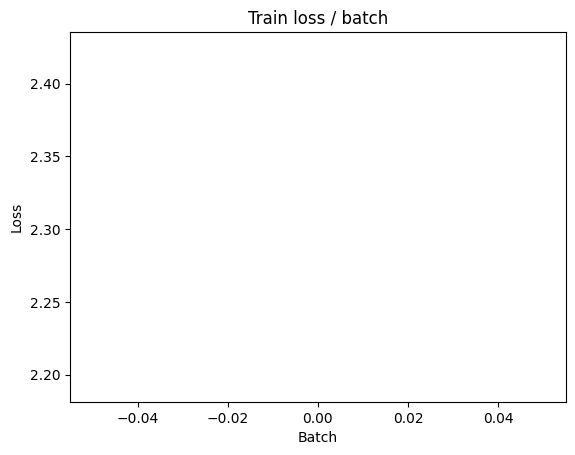

[TRAIN Batch 200/391]	Time 0.020s (0.022s)	Loss 2.1905 (2.2543)	Prec@1  14.8 ( 14.7)	Prec@5  68.0 ( 60.4)


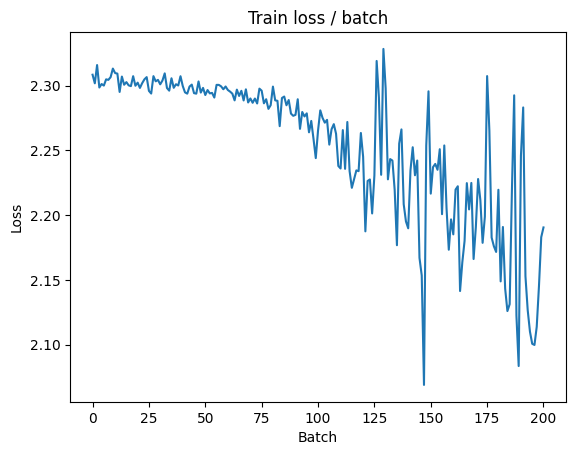


===============> Total time 9s	Avg loss 2.1815	Avg Prec@1 18.51 %	Avg Prec@5 67.04 %

[EVAL Batch 000/079]	Time 0.147s (0.147s)	Loss 1.9218 (1.9218)	Prec@1  30.5 ( 30.5)	Prec@5  87.5 ( 87.5)

===============> Total time 1s	Avg loss 1.9543	Avg Prec@1 26.96 %	Avg Prec@5 79.97 %



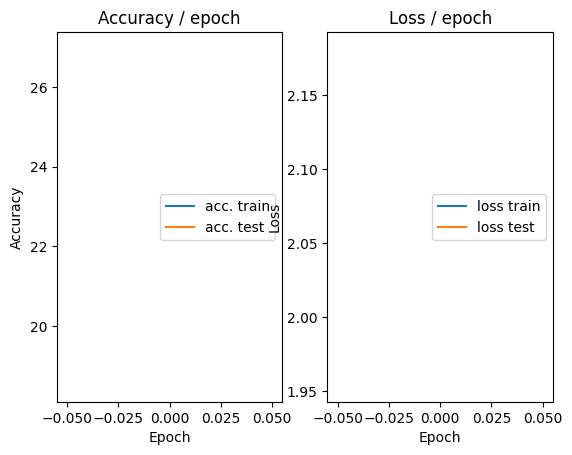

=== EPOCH 2 =====

[TRAIN Batch 000/391]	Time 0.131s (0.131s)	Loss 2.0554 (2.0554)	Prec@1  20.3 ( 20.3)	Prec@5  78.1 ( 78.1)


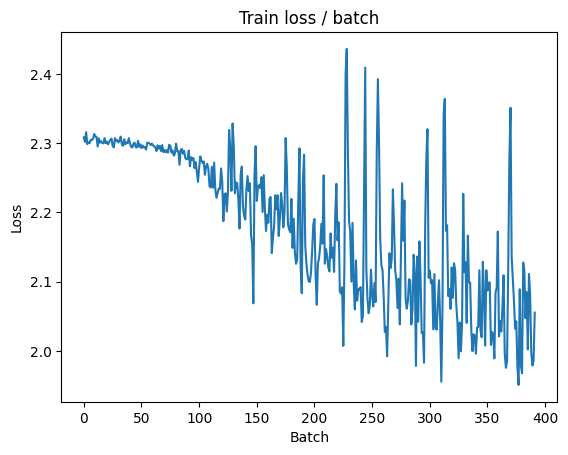

[TRAIN Batch 200/391]	Time 0.004s (0.022s)	Loss 1.9820 (2.0107)	Prec@1  33.6 ( 26.5)	Prec@5  78.9 ( 78.3)


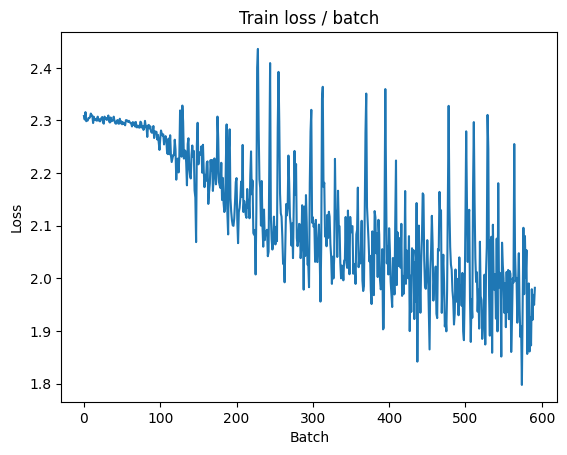


===============> Total time 8s	Avg loss 1.9633	Avg Prec@1 28.64 %	Avg Prec@5 80.27 %

[EVAL Batch 000/079]	Time 0.130s (0.130s)	Loss 1.7370 (1.7370)	Prec@1  42.2 ( 42.2)	Prec@5  87.5 ( 87.5)

===============> Total time 2s	Avg loss 1.7962	Avg Prec@1 35.00 %	Avg Prec@5 85.30 %



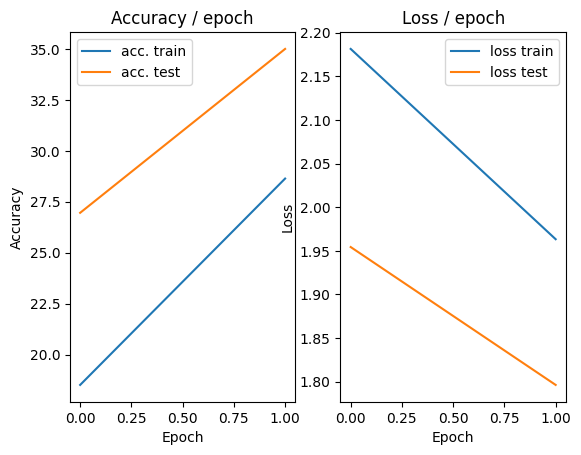

=== EPOCH 3 =====

[TRAIN Batch 000/391]	Time 0.143s (0.143s)	Loss 1.7977 (1.7977)	Prec@1  32.0 ( 32.0)	Prec@5  89.8 ( 89.8)


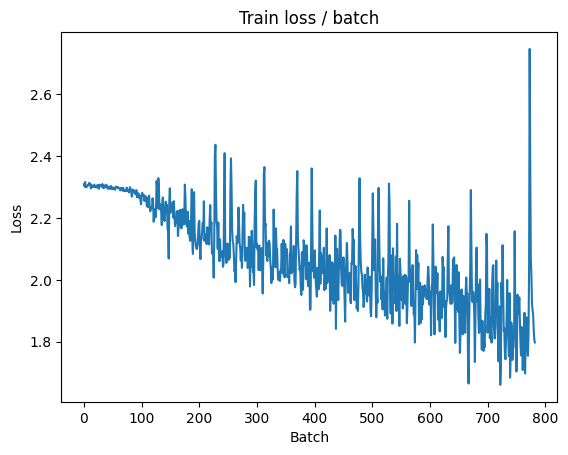

[TRAIN Batch 200/391]	Time 0.041s (0.022s)	Loss 1.8517 (1.7705)	Prec@1  31.2 ( 36.8)	Prec@5  84.4 ( 86.3)


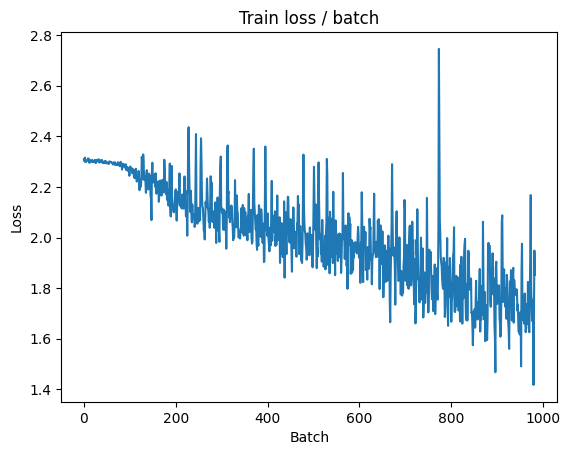


===============> Total time 8s	Avg loss 1.7243	Avg Prec@1 38.19 %	Avg Prec@5 87.53 %

[EVAL Batch 000/079]	Time 0.121s (0.121s)	Loss 1.5419 (1.5419)	Prec@1  43.8 ( 43.8)	Prec@5  89.1 ( 89.1)

===============> Total time 2s	Avg loss 1.6048	Avg Prec@1 40.76 %	Avg Prec@5 89.99 %



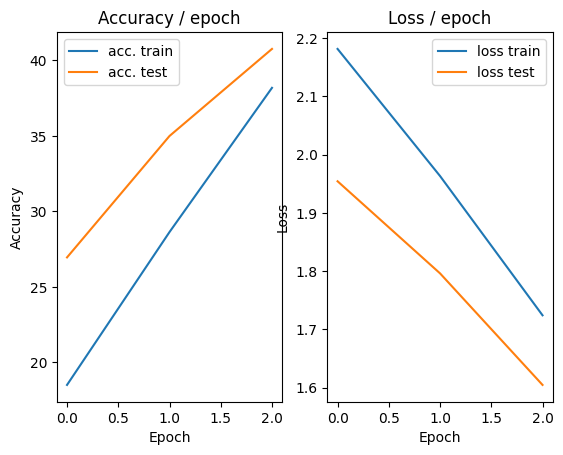

=== EPOCH 4 =====

[TRAIN Batch 000/391]	Time 0.185s (0.185s)	Loss 1.7064 (1.7064)	Prec@1  36.7 ( 36.7)	Prec@5  89.1 ( 89.1)


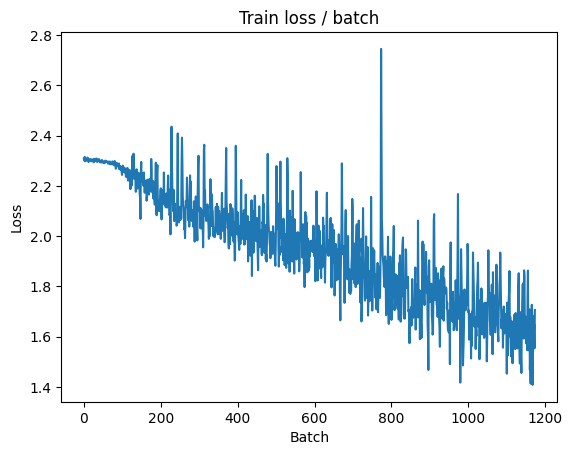

[TRAIN Batch 200/391]	Time 0.004s (0.028s)	Loss 1.6078 (1.5926)	Prec@1  41.4 ( 42.9)	Prec@5  87.5 ( 90.2)


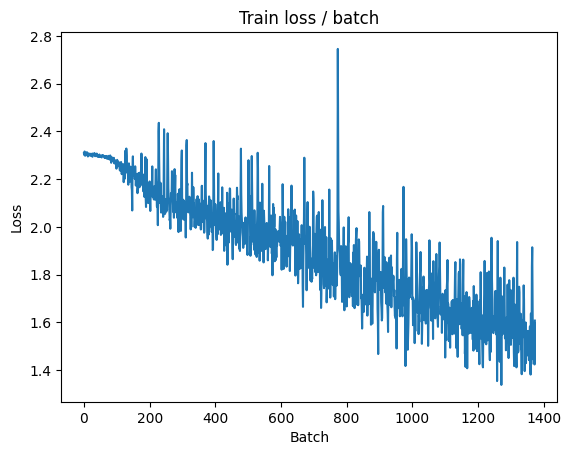


===============> Total time 9s	Avg loss 1.5802	Avg Prec@1 43.40 %	Avg Prec@5 90.39 %

[EVAL Batch 000/079]	Time 0.112s (0.112s)	Loss 1.3087 (1.3087)	Prec@1  57.0 ( 57.0)	Prec@5  93.0 ( 93.0)

===============> Total time 1s	Avg loss 1.4310	Avg Prec@1 48.06 %	Avg Prec@5 92.77 %



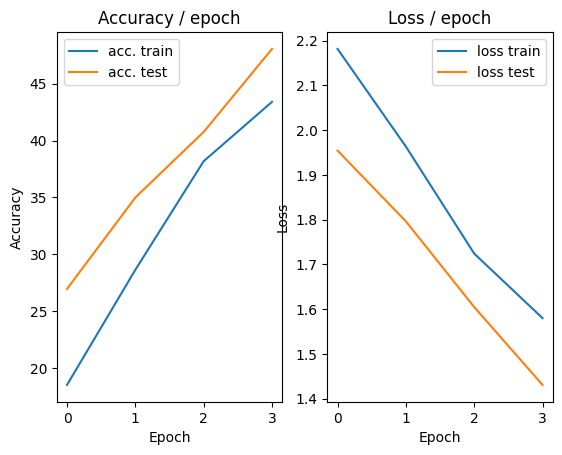

=== EPOCH 5 =====

[TRAIN Batch 000/391]	Time 0.206s (0.206s)	Loss 1.3730 (1.3730)	Prec@1  51.6 ( 51.6)	Prec@5  91.4 ( 91.4)


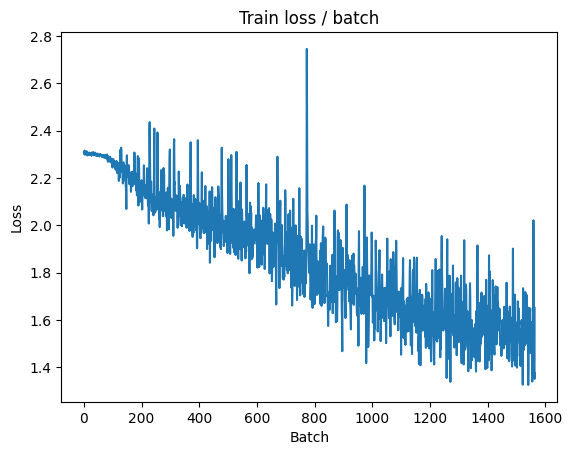

[TRAIN Batch 200/391]	Time 0.004s (0.027s)	Loss 1.4611 (1.5187)	Prec@1  50.8 ( 45.8)	Prec@5  93.8 ( 91.4)


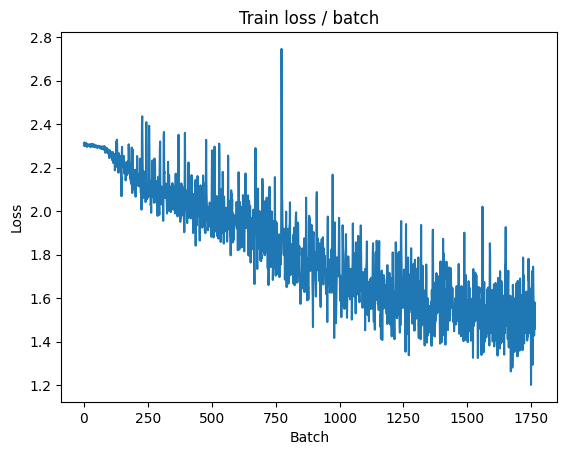


===============> Total time 9s	Avg loss 1.4946	Avg Prec@1 46.65 %	Avg Prec@5 91.55 %

[EVAL Batch 000/079]	Time 0.123s (0.123s)	Loss 1.3032 (1.3032)	Prec@1  60.2 ( 60.2)	Prec@5  94.5 ( 94.5)

===============> Total time 1s	Avg loss 1.4117	Avg Prec@1 49.11 %	Avg Prec@5 92.94 %



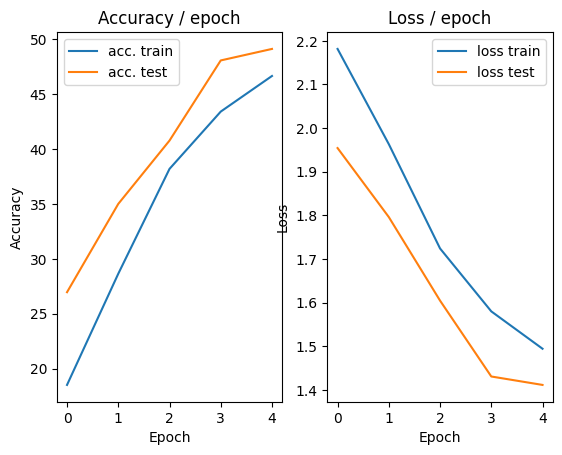

=== EPOCH 6 =====

[TRAIN Batch 000/391]	Time 0.142s (0.142s)	Loss 1.4579 (1.4579)	Prec@1  43.0 ( 43.0)	Prec@5  91.4 ( 91.4)


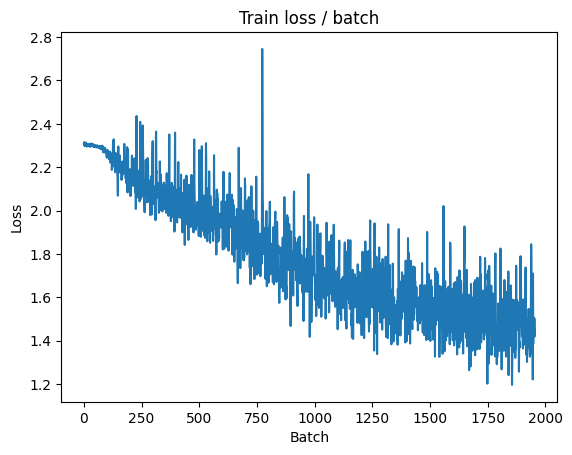

[TRAIN Batch 200/391]	Time 0.024s (0.028s)	Loss 1.2354 (1.4275)	Prec@1  62.5 ( 49.0)	Prec@5  94.5 ( 92.7)


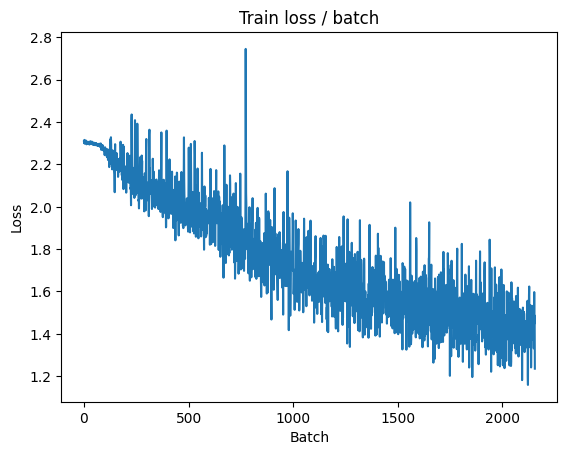


===============> Total time 9s	Avg loss 1.4185	Avg Prec@1 49.69 %	Avg Prec@5 92.70 %

[EVAL Batch 000/079]	Time 0.133s (0.133s)	Loss 1.2144 (1.2144)	Prec@1  64.1 ( 64.1)	Prec@5  96.1 ( 96.1)

===============> Total time 1s	Avg loss 1.3148	Avg Prec@1 52.63 %	Avg Prec@5 93.46 %



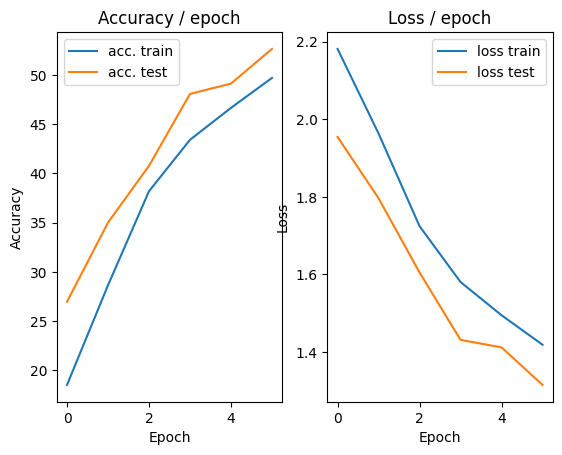

=== EPOCH 7 =====

[TRAIN Batch 000/391]	Time 0.145s (0.145s)	Loss 1.2817 (1.2817)	Prec@1  56.2 ( 56.2)	Prec@5  93.8 ( 93.8)


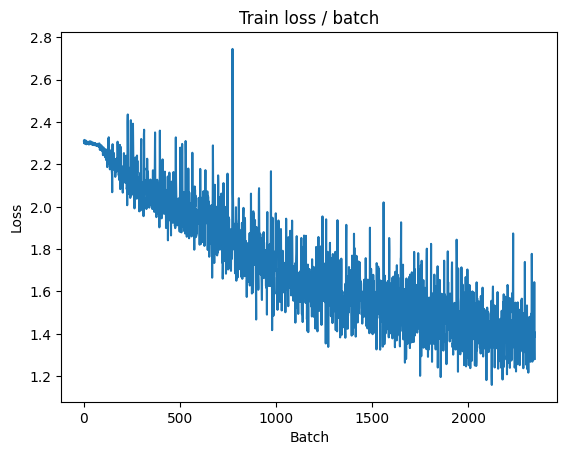

[TRAIN Batch 200/391]	Time 0.004s (0.031s)	Loss 1.3226 (1.3615)	Prec@1  57.0 ( 51.8)	Prec@5  91.4 ( 93.3)


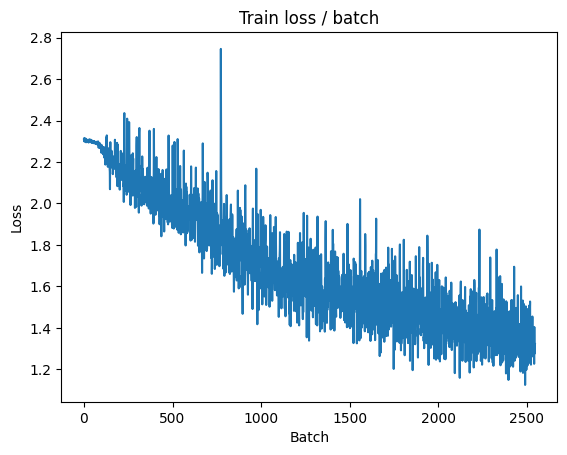


===============> Total time 10s	Avg loss 1.3556	Avg Prec@1 52.16 %	Avg Prec@5 93.31 %

[EVAL Batch 000/079]	Time 0.128s (0.128s)	Loss 1.3289 (1.3289)	Prec@1  52.3 ( 52.3)	Prec@5  94.5 ( 94.5)

===============> Total time 1s	Avg loss 1.4435	Avg Prec@1 47.72 %	Avg Prec@5 91.76 %



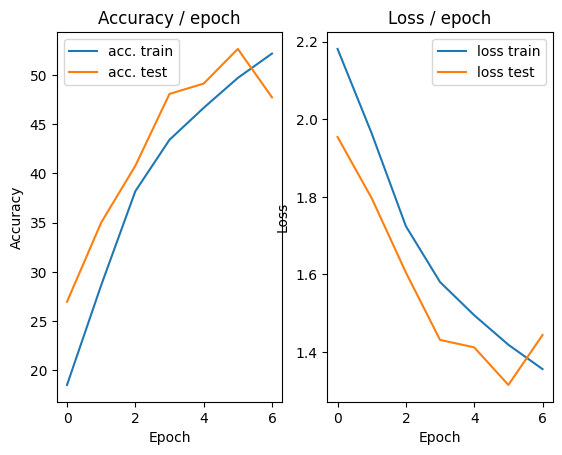

=== EPOCH 8 =====

[TRAIN Batch 000/391]	Time 0.154s (0.154s)	Loss 1.5526 (1.5526)	Prec@1  48.4 ( 48.4)	Prec@5  89.1 ( 89.1)


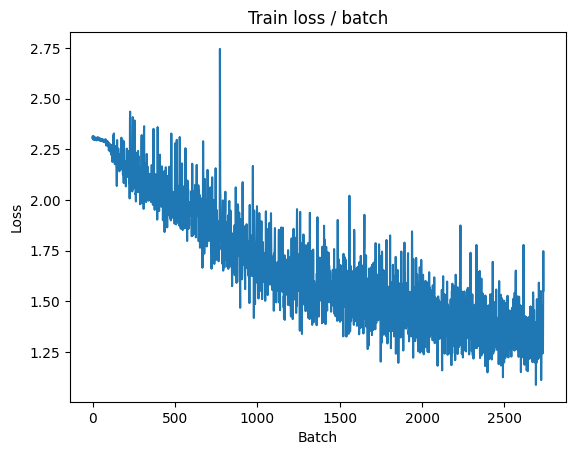

[TRAIN Batch 200/391]	Time 0.060s (0.027s)	Loss 1.2199 (1.3054)	Prec@1  55.5 ( 54.4)	Prec@5  96.1 ( 93.9)


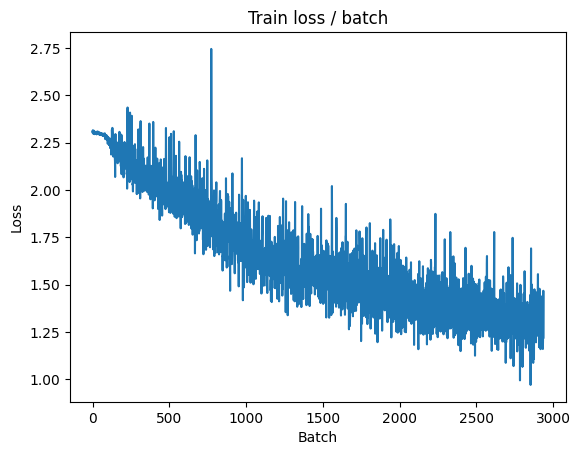


===============> Total time 9s	Avg loss 1.3011	Avg Prec@1 54.34 %	Avg Prec@5 93.89 %

[EVAL Batch 000/079]	Time 0.135s (0.135s)	Loss 1.3010 (1.3010)	Prec@1  49.2 ( 49.2)	Prec@5  96.1 ( 96.1)

===============> Total time 1s	Avg loss 1.3873	Avg Prec@1 51.41 %	Avg Prec@5 92.92 %



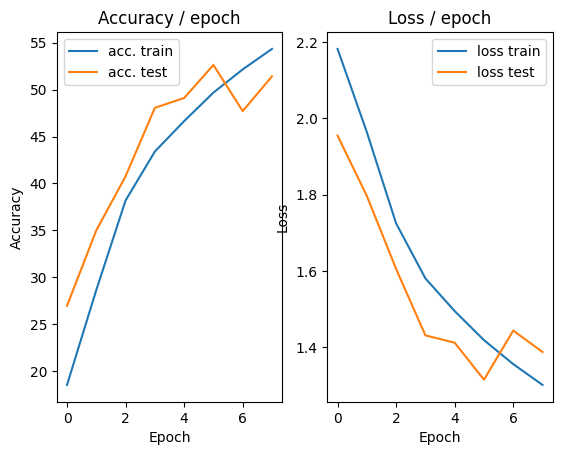

=== EPOCH 9 =====

[TRAIN Batch 000/391]	Time 0.155s (0.155s)	Loss 1.4306 (1.4306)	Prec@1  50.0 ( 50.0)	Prec@5  92.2 ( 92.2)


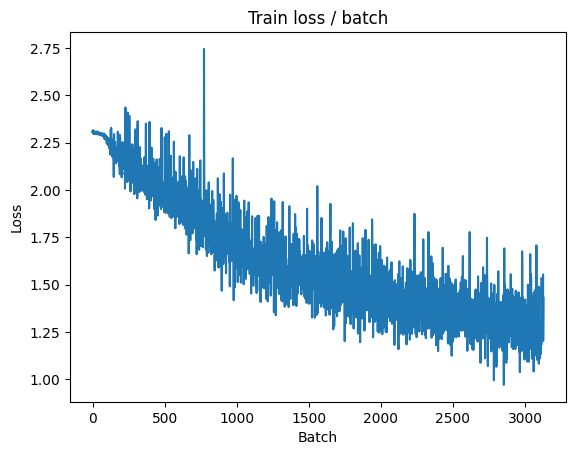

[TRAIN Batch 200/391]	Time 0.003s (0.023s)	Loss 1.2527 (1.2515)	Prec@1  58.6 ( 55.9)	Prec@5  94.5 ( 94.5)


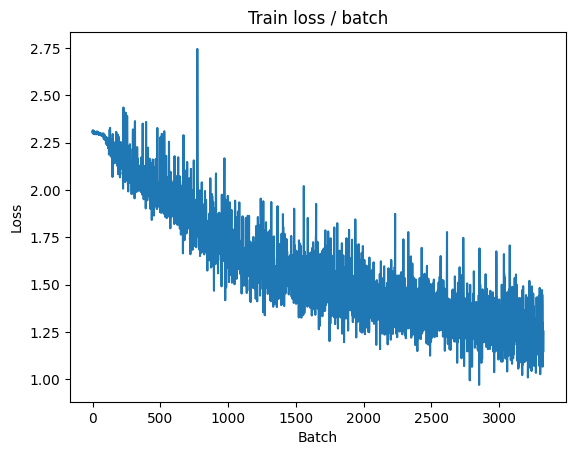


===============> Total time 9s	Avg loss 1.2469	Avg Prec@1 56.20 %	Avg Prec@5 94.53 %

[EVAL Batch 000/079]	Time 0.129s (0.129s)	Loss 1.0549 (1.0549)	Prec@1  61.7 ( 61.7)	Prec@5  93.8 ( 93.8)

===============> Total time 1s	Avg loss 1.1811	Avg Prec@1 57.57 %	Avg Prec@5 95.09 %



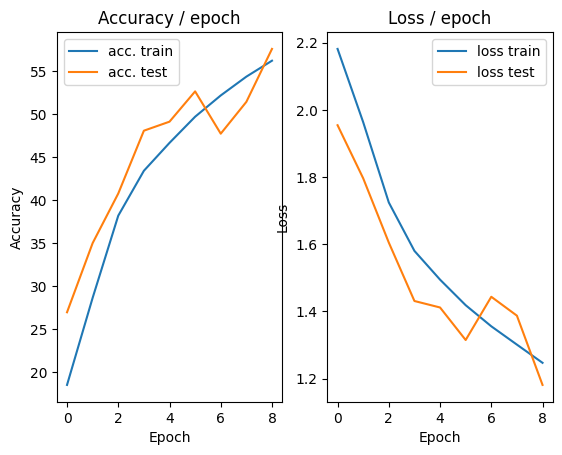

=== EPOCH 10 =====

[TRAIN Batch 000/391]	Time 0.145s (0.145s)	Loss 1.1625 (1.1625)	Prec@1  56.2 ( 56.2)	Prec@5  93.8 ( 93.8)


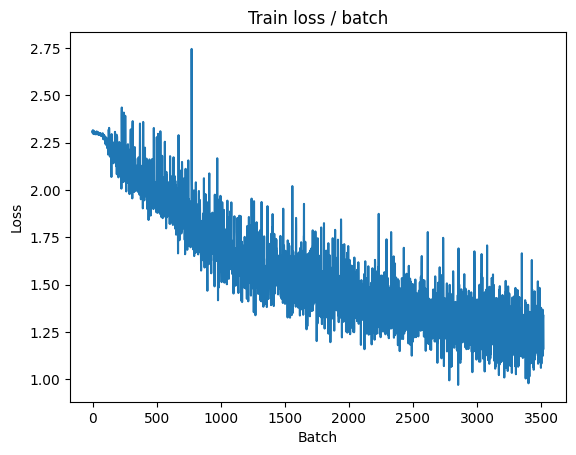

[TRAIN Batch 200/391]	Time 0.004s (0.023s)	Loss 1.1551 (1.1906)	Prec@1  60.9 ( 58.5)	Prec@5  96.1 ( 94.9)


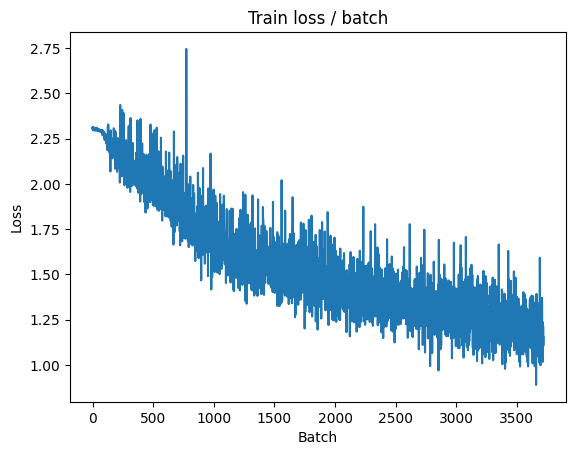


===============> Total time 9s	Avg loss 1.1894	Avg Prec@1 58.42 %	Avg Prec@5 95.06 %

[EVAL Batch 000/079]	Time 0.128s (0.128s)	Loss 0.9986 (0.9986)	Prec@1  67.2 ( 67.2)	Prec@5  96.1 ( 96.1)

===============> Total time 1s	Avg loss 1.1595	Avg Prec@1 58.56 %	Avg Prec@5 95.26 %



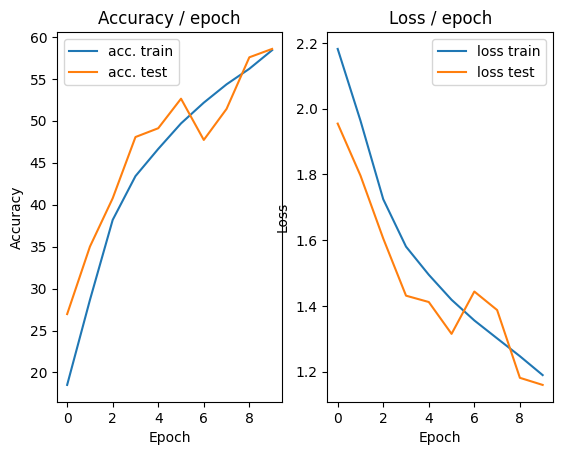

=== EPOCH 11 =====

[TRAIN Batch 000/391]	Time 0.165s (0.165s)	Loss 1.1501 (1.1501)	Prec@1  60.2 ( 60.2)	Prec@5  95.3 ( 95.3)


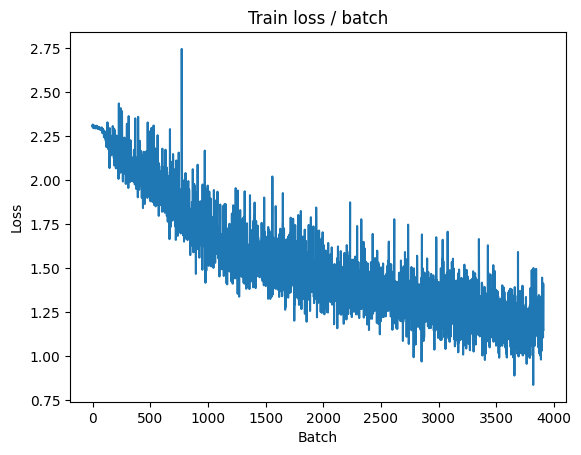

[TRAIN Batch 200/391]	Time 0.004s (0.022s)	Loss 1.2109 (1.1443)	Prec@1  57.8 ( 60.1)	Prec@5  96.9 ( 95.6)


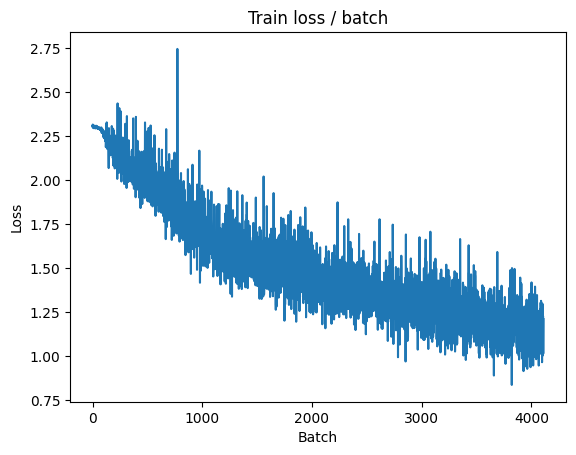


===============> Total time 9s	Avg loss 1.1436	Avg Prec@1 60.01 %	Avg Prec@5 95.60 %

[EVAL Batch 000/079]	Time 0.153s (0.153s)	Loss 1.0491 (1.0491)	Prec@1  63.3 ( 63.3)	Prec@5  98.4 ( 98.4)

===============> Total time 1s	Avg loss 1.1573	Avg Prec@1 59.28 %	Avg Prec@5 95.15 %



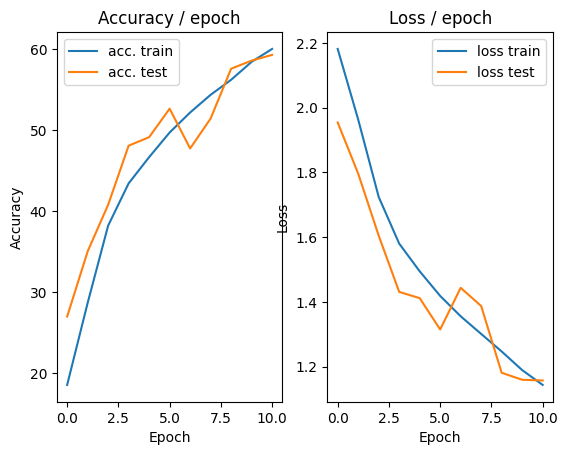

=== EPOCH 12 =====

[TRAIN Batch 000/391]	Time 0.146s (0.146s)	Loss 1.2238 (1.2238)	Prec@1  57.0 ( 57.0)	Prec@5  96.1 ( 96.1)


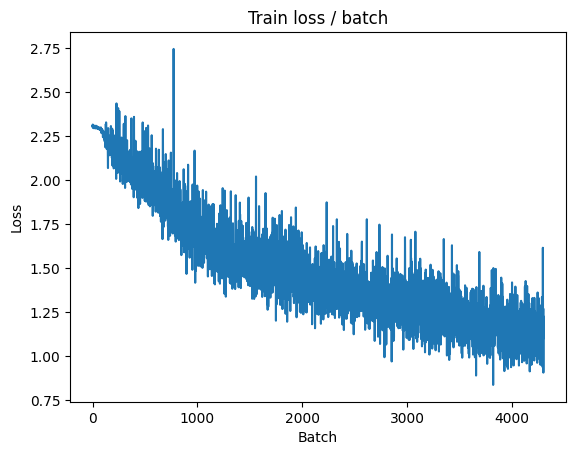

[TRAIN Batch 200/391]	Time 0.018s (0.022s)	Loss 1.0200 (1.0921)	Prec@1  68.8 ( 61.7)	Prec@5  95.3 ( 96.1)


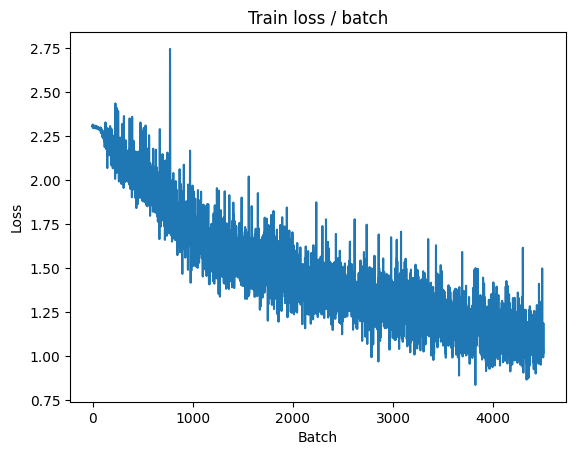


===============> Total time 8s	Avg loss 1.0922	Avg Prec@1 61.82 %	Avg Prec@5 96.02 %

[EVAL Batch 000/079]	Time 0.237s (0.237s)	Loss 1.0588 (1.0588)	Prec@1  64.1 ( 64.1)	Prec@5  97.7 ( 97.7)

===============> Total time 2s	Avg loss 1.1458	Avg Prec@1 59.79 %	Avg Prec@5 95.12 %



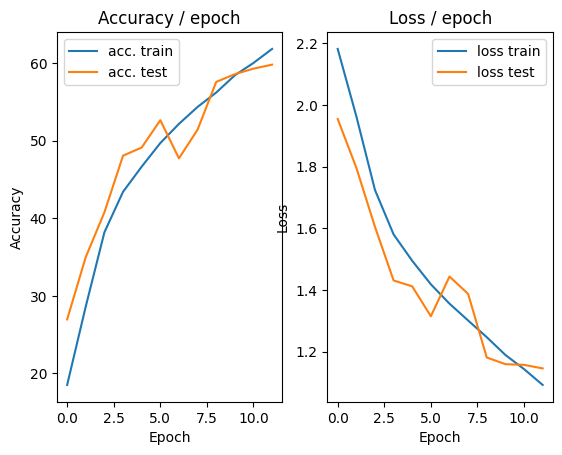

=== EPOCH 13 =====

[TRAIN Batch 000/391]	Time 0.154s (0.154s)	Loss 1.0959 (1.0959)	Prec@1  61.7 ( 61.7)	Prec@5  96.1 ( 96.1)


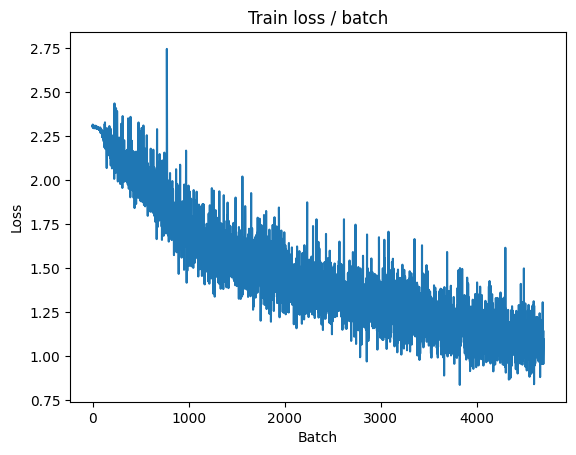

[TRAIN Batch 200/391]	Time 0.004s (0.022s)	Loss 0.9825 (1.0433)	Prec@1  64.8 ( 63.8)	Prec@5  97.7 ( 96.5)


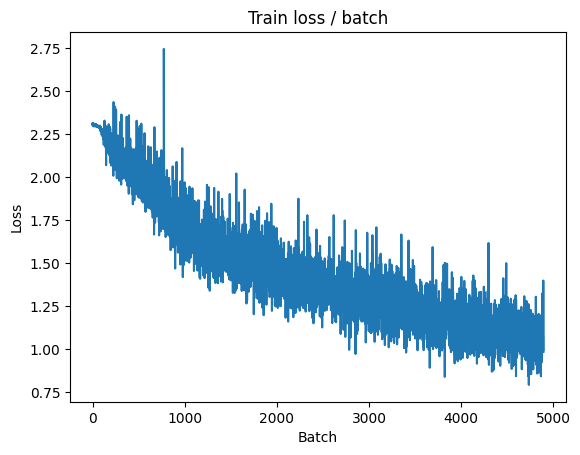


===============> Total time 8s	Avg loss 1.0513	Avg Prec@1 63.48 %	Avg Prec@5 96.34 %

[EVAL Batch 000/079]	Time 0.130s (0.130s)	Loss 1.0318 (1.0318)	Prec@1  62.5 ( 62.5)	Prec@5  96.9 ( 96.9)

===============> Total time 1s	Avg loss 1.1382	Avg Prec@1 60.60 %	Avg Prec@5 95.29 %



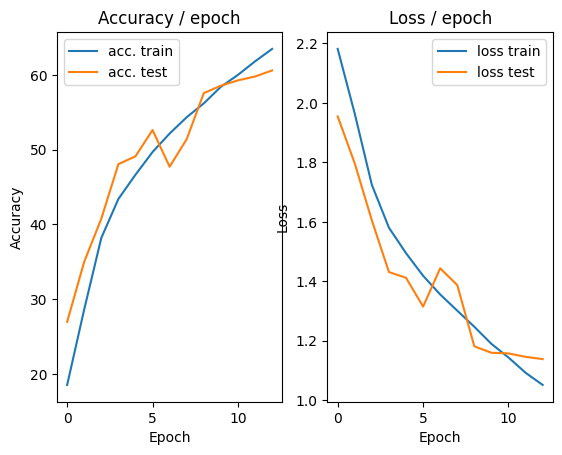

=== EPOCH 14 =====

[TRAIN Batch 000/391]	Time 0.259s (0.259s)	Loss 1.0819 (1.0819)	Prec@1  60.2 ( 60.2)	Prec@5  96.1 ( 96.1)


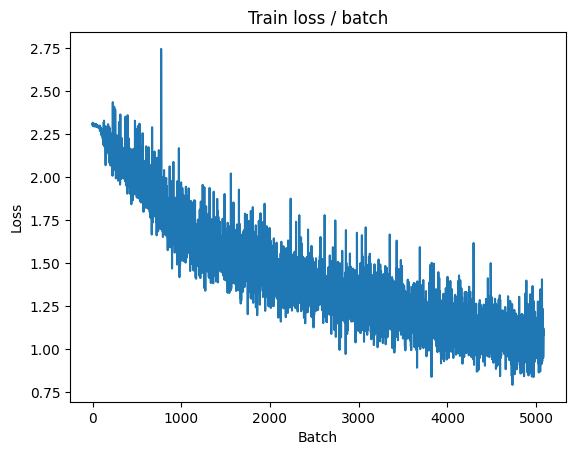

[TRAIN Batch 200/391]	Time 0.010s (0.026s)	Loss 0.8485 (1.0064)	Prec@1  77.3 ( 64.6)	Prec@5  97.7 ( 96.6)


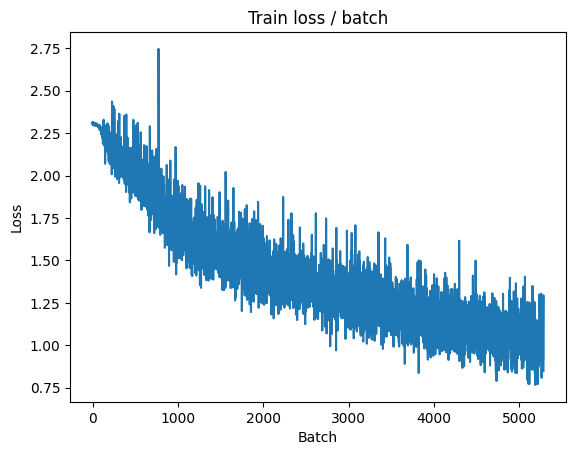


===============> Total time 9s	Avg loss 1.0075	Avg Prec@1 64.72 %	Avg Prec@5 96.63 %

[EVAL Batch 000/079]	Time 0.145s (0.145s)	Loss 1.0053 (1.0053)	Prec@1  64.8 ( 64.8)	Prec@5  97.7 ( 97.7)

===============> Total time 1s	Avg loss 1.1069	Avg Prec@1 61.77 %	Avg Prec@5 95.29 %



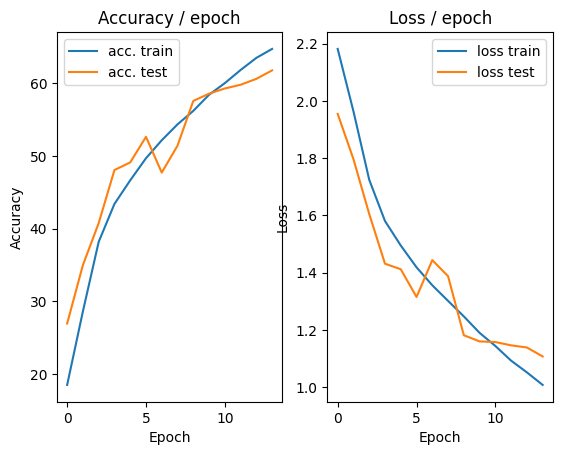

=== EPOCH 15 =====

[TRAIN Batch 000/391]	Time 0.165s (0.165s)	Loss 0.9299 (0.9299)	Prec@1  71.1 ( 71.1)	Prec@5  97.7 ( 97.7)


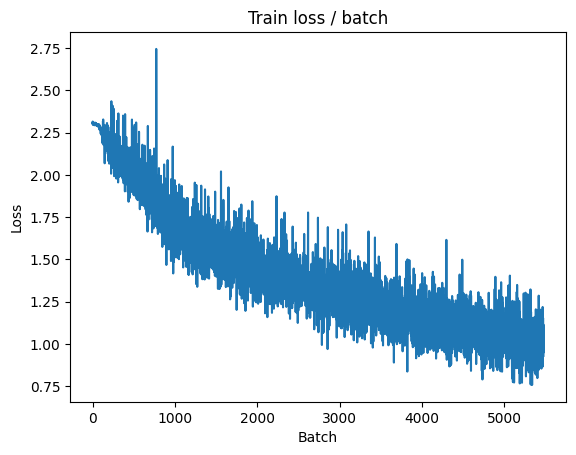

[TRAIN Batch 200/391]	Time 0.038s (0.028s)	Loss 1.0405 (0.9599)	Prec@1  64.1 ( 66.3)	Prec@5  96.9 ( 97.2)


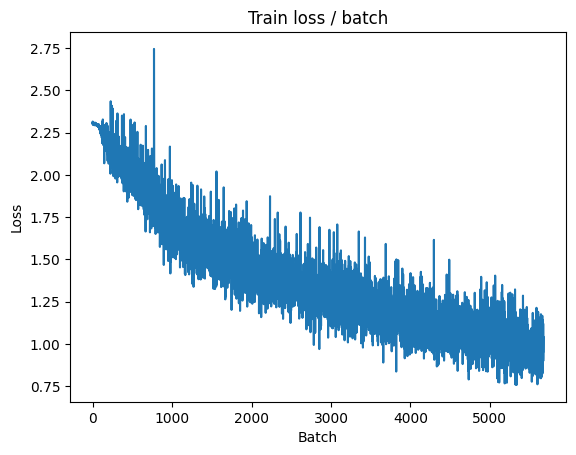


===============> Total time 9s	Avg loss 0.9677	Avg Prec@1 66.13 %	Avg Prec@5 97.19 %

[EVAL Batch 000/079]	Time 0.144s (0.144s)	Loss 1.2633 (1.2633)	Prec@1  57.0 ( 57.0)	Prec@5  94.5 ( 94.5)

===============> Total time 1s	Avg loss 1.2089	Avg Prec@1 59.85 %	Avg Prec@5 94.23 %



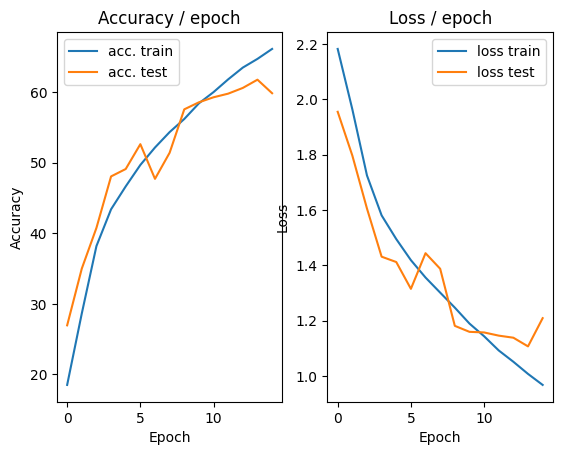

=== EPOCH 16 =====

[TRAIN Batch 000/391]	Time 0.150s (0.150s)	Loss 1.0747 (1.0747)	Prec@1  63.3 ( 63.3)	Prec@5  96.9 ( 96.9)


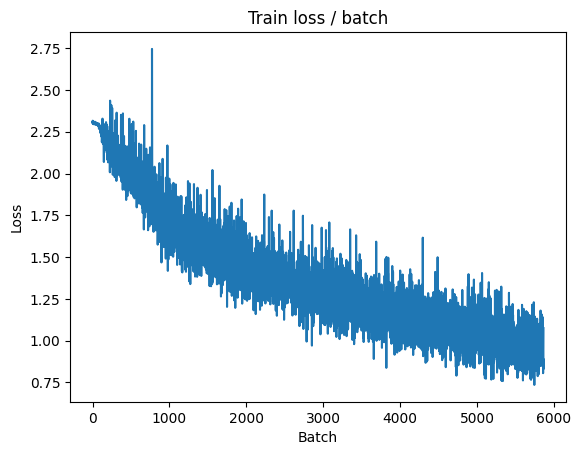

[TRAIN Batch 200/391]	Time 0.005s (0.028s)	Loss 0.8736 (0.9129)	Prec@1  69.5 ( 68.1)	Prec@5  98.4 ( 97.5)


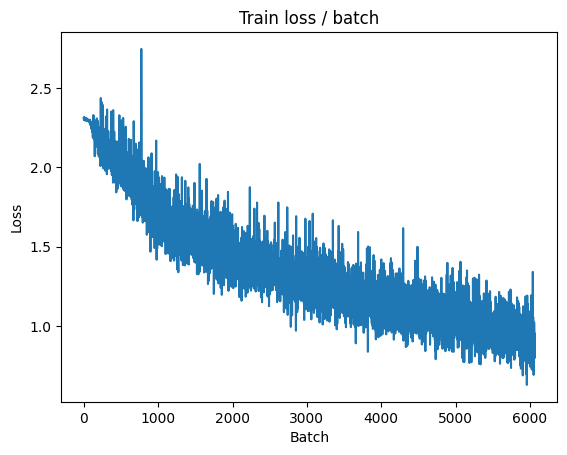


===============> Total time 9s	Avg loss 0.9234	Avg Prec@1 67.70 %	Avg Prec@5 97.37 %

[EVAL Batch 000/079]	Time 0.162s (0.162s)	Loss 1.1171 (1.1171)	Prec@1  56.2 ( 56.2)	Prec@5  96.1 ( 96.1)

===============> Total time 1s	Avg loss 1.1526	Avg Prec@1 61.52 %	Avg Prec@5 95.20 %



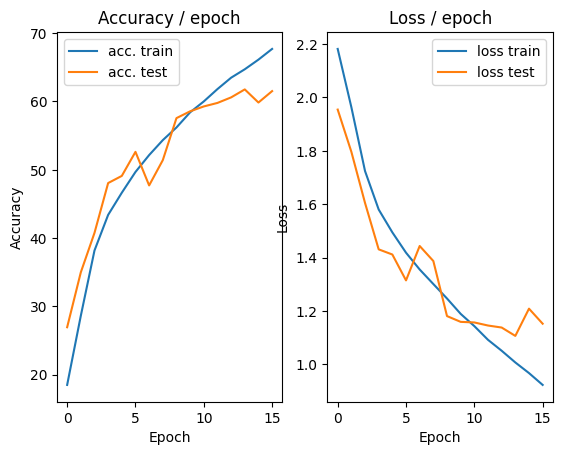

=== EPOCH 17 =====

[TRAIN Batch 000/391]	Time 0.163s (0.163s)	Loss 0.7031 (0.7031)	Prec@1  73.4 ( 73.4)	Prec@5 100.0 (100.0)


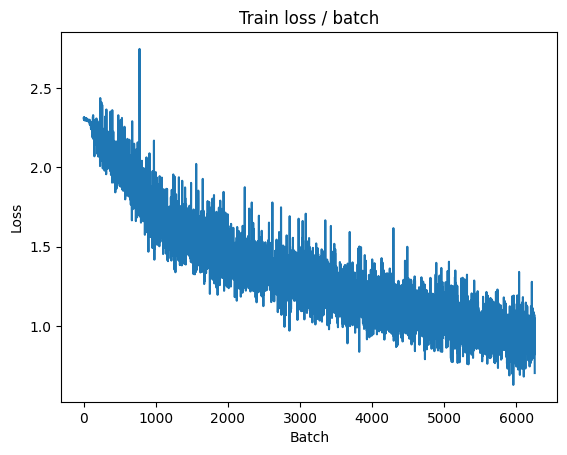

[TRAIN Batch 200/391]	Time 0.012s (0.025s)	Loss 1.0651 (0.8741)	Prec@1  65.6 ( 69.3)	Prec@5  95.3 ( 97.6)


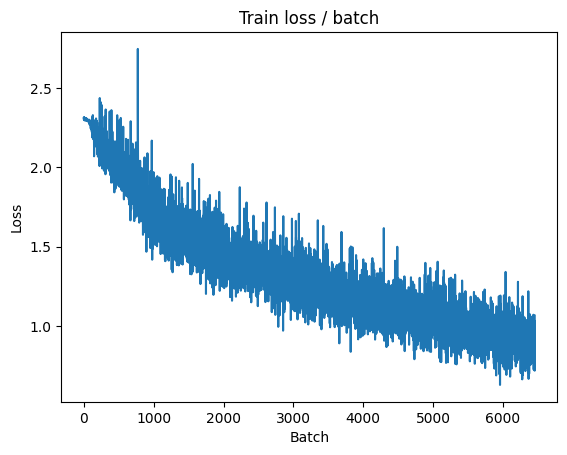


===============> Total time 9s	Avg loss 0.8899	Avg Prec@1 68.61 %	Avg Prec@5 97.59 %

[EVAL Batch 000/079]	Time 0.157s (0.157s)	Loss 1.1198 (1.1198)	Prec@1  62.5 ( 62.5)	Prec@5  96.1 ( 96.1)

===============> Total time 1s	Avg loss 1.1596	Avg Prec@1 62.00 %	Avg Prec@5 95.25 %



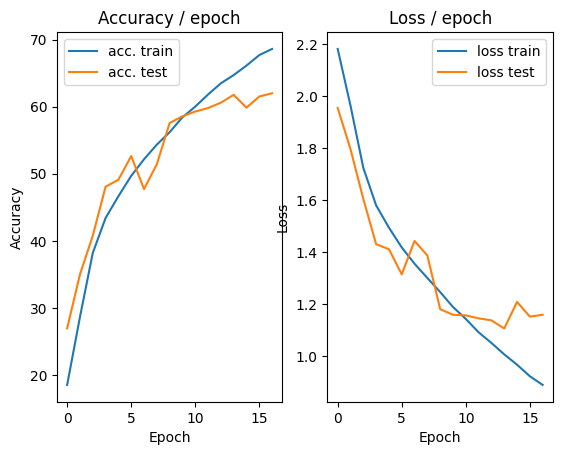

=== EPOCH 18 =====

[TRAIN Batch 000/391]	Time 0.158s (0.158s)	Loss 0.8697 (0.8697)	Prec@1  68.8 ( 68.8)	Prec@5  98.4 ( 98.4)


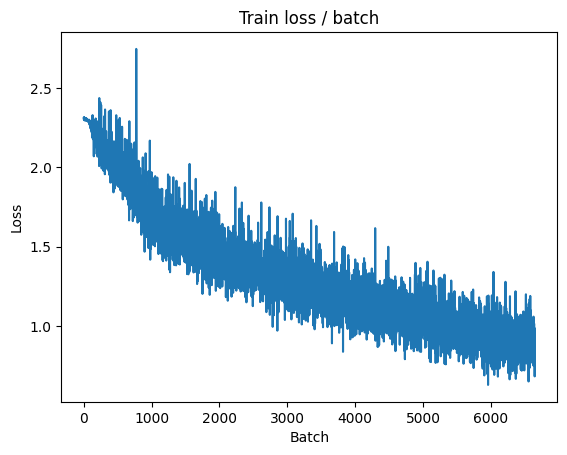

[TRAIN Batch 200/391]	Time 0.004s (0.022s)	Loss 0.6317 (0.8482)	Prec@1  78.9 ( 70.2)	Prec@5  97.7 ( 98.0)


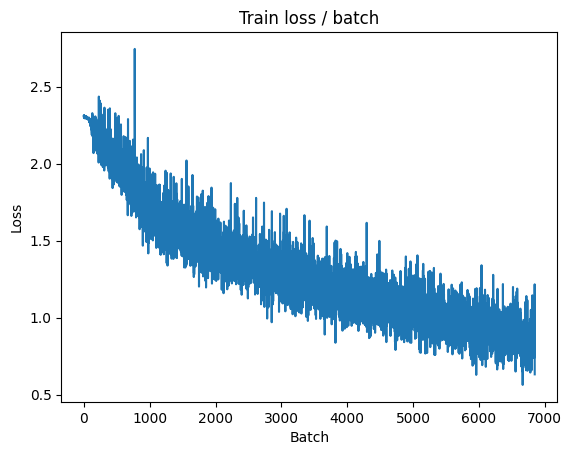


===============> Total time 9s	Avg loss 0.8550	Avg Prec@1 69.97 %	Avg Prec@5 97.88 %

[EVAL Batch 000/079]	Time 0.142s (0.142s)	Loss 1.0352 (1.0352)	Prec@1  64.1 ( 64.1)	Prec@5  96.1 ( 96.1)

===============> Total time 1s	Avg loss 1.1446	Avg Prec@1 61.87 %	Avg Prec@5 95.62 %



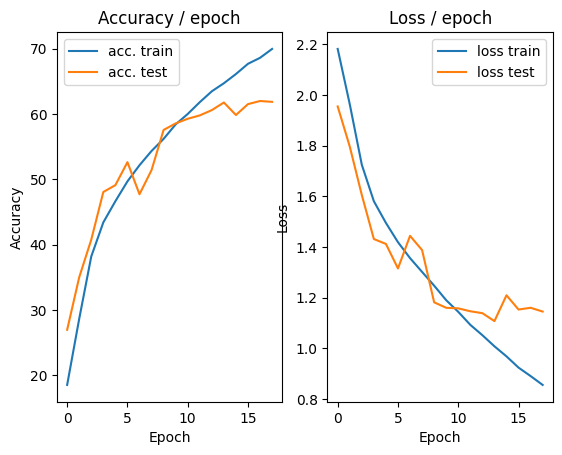

=== EPOCH 19 =====

[TRAIN Batch 000/391]	Time 0.181s (0.181s)	Loss 0.8324 (0.8324)	Prec@1  75.0 ( 75.0)	Prec@5  98.4 ( 98.4)


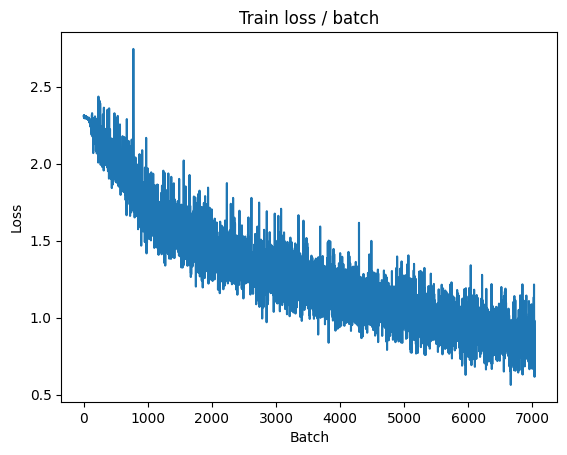

[TRAIN Batch 200/391]	Time 0.019s (0.022s)	Loss 0.8309 (0.7979)	Prec@1  73.4 ( 71.9)	Prec@5  98.4 ( 98.4)


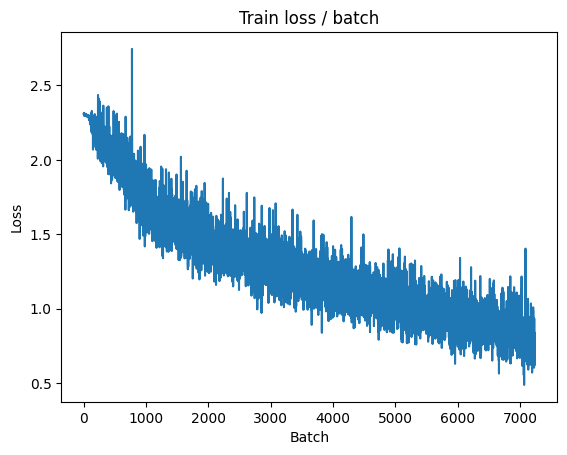


===============> Total time 9s	Avg loss 0.8164	Avg Prec@1 71.30 %	Avg Prec@5 98.16 %

[EVAL Batch 000/079]	Time 0.123s (0.123s)	Loss 1.0129 (1.0129)	Prec@1  64.1 ( 64.1)	Prec@5  98.4 ( 98.4)

===============> Total time 1s	Avg loss 1.1049	Avg Prec@1 62.84 %	Avg Prec@5 95.62 %



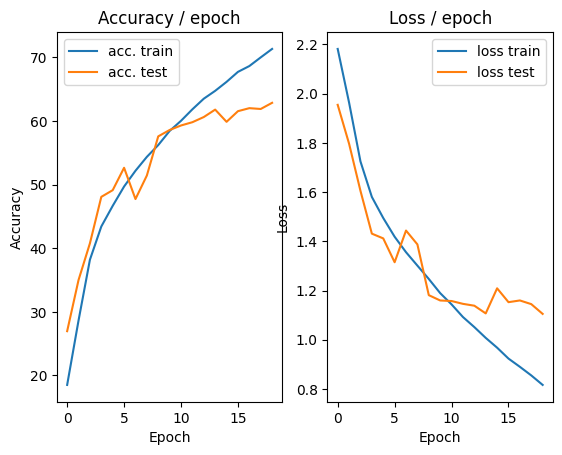

=== EPOCH 20 =====

[TRAIN Batch 000/391]	Time 0.167s (0.167s)	Loss 0.6589 (0.6589)	Prec@1  75.8 ( 75.8)	Prec@5  99.2 ( 99.2)


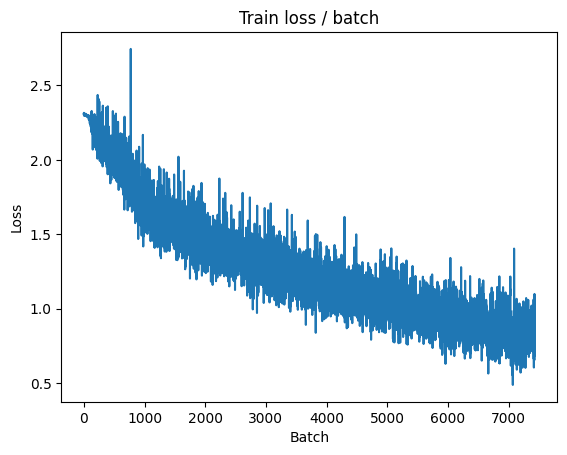

[TRAIN Batch 200/391]	Time 0.032s (0.022s)	Loss 0.7460 (0.7699)	Prec@1  73.4 ( 72.8)	Prec@5  97.7 ( 98.4)


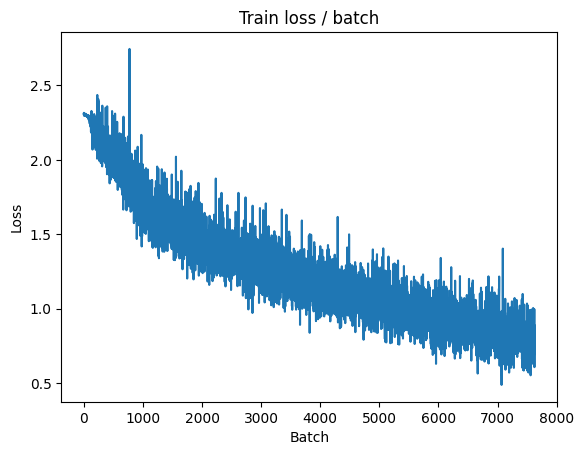


===============> Total time 9s	Avg loss 0.7861	Avg Prec@1 72.27 %	Avg Prec@5 98.26 %

[EVAL Batch 000/079]	Time 0.193s (0.193s)	Loss 1.1645 (1.1645)	Prec@1  62.5 ( 62.5)	Prec@5  95.3 ( 95.3)

===============> Total time 2s	Avg loss 1.1884	Avg Prec@1 61.97 %	Avg Prec@5 94.66 %



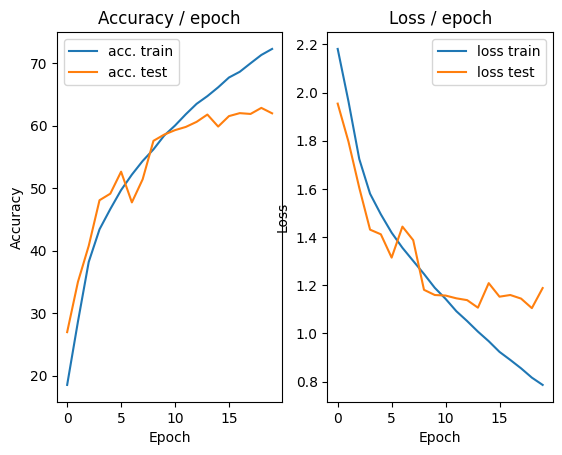

In [ ]:
main(batch_size=128, lr=0.1, epochs=20,cuda=True)

## Use of batch normalization

In [ ]:
class ConvNet(nn.Module):
    """
    This class defines the structure of the neural network
    """

    def __init__(self):
        super(ConvNet, self).__init__()
        # We first define the convolution and pooling layers as a features extractor
        self.features = nn.Sequential(
            nn.Conv2d(3, 6, (5, 5), stride=1, padding=2),
            nn.BatchNorm2d(6),
            nn.ReLU(),
            nn.MaxPool2d((2, 2), stride=2, padding=0),
            nn.Conv2d(6, 16, (5, 5), stride=1, padding=0),
            nn.BatchNorm2d(16),
            nn.ReLU(),
            nn.MaxPool2d((2, 2), stride=2, padding=0),
        )
        # We then define fully connected layers as a classifier
        self.classifier = nn.Sequential(
            nn.Linear(576, 256),
            nn.ReLU(),
            nn.Linear(256, 84),
            nn.ReLU(),
            nn.Linear(84, 10)
            # Reminder: The softmax is included in the loss, do not put it here
        )

    # Method called when we apply the network to an input batch
    def forward(self, input):
        bsize = input.size(0) # batch size
        output = self.features(input) # output of the conv layers
        output = output.view(bsize, -1) # we flatten the 2D feature maps into one 1D vector for each input
        output = self.classifier(output) # we compute the output of the fc layers
        return output



def get_dataset(batch_size, cuda=False):
    """
    This function loads the dataset and performs transformations on each
    image (listed in `transform = ...`).
    """
    train_dataset = datasets.CIFAR10(PATH, train=True, download=True,
        transform=transforms.Compose([
            transforms.ToTensor()
        ]))

    val_dataset = datasets.CIFAR10(PATH, train=False, download=True,
        transform=transforms.Compose([
            transforms.ToTensor()
        ]))

    train_loader = torch.utils.data.DataLoader(train_dataset,
                        batch_size=batch_size, shuffle=True, pin_memory=cuda, num_workers=2)
    val_loader = torch.utils.data.DataLoader(val_dataset,
                        batch_size=batch_size, shuffle=False, pin_memory=cuda, num_workers=2)

    return train_loader, val_loader



def epoch(data, model, criterion, optimizer=None, cuda=False):
    """
    Make a pass (called epoch in English) on the data `data` with the
     model `model`. Evaluates `criterion` as loss.
     If `optimizer` is given, perform a training epoch using
     the given optimizer, otherwise, perform an evaluation epoch (no backward)
     of the model.
    """

    # indicates whether the model is in eval or train mode (some layers behave differently in train and eval)
    model.eval() if optimizer is None else model.train()

    # objects to store metric averages
    avg_loss = AverageMeter()
    avg_top1_acc = AverageMeter()
    avg_top5_acc = AverageMeter()
    avg_batch_time = AverageMeter()
    global loss_plot

    # we iterate on the batches
    tic = time.time()
    for i, (input, target) in enumerate(data):

        if cuda: # only with GPU, and not with CPU
            input = input.cuda()
            target = target.cuda()

        # forward
        output = model(input)
        loss = criterion(output, target)

        # backward if we are training
        if optimizer:
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

        # compute metrics
        prec1, prec5 = accuracy(output, target, topk=(1, 5))
        batch_time = time.time() - tic
        tic = time.time()

        # update
        avg_loss.update(loss.item())
        avg_top1_acc.update(prec1.item())
        avg_top5_acc.update(prec5.item())
        avg_batch_time.update(batch_time)
        if optimizer:
            loss_plot.update(avg_loss.val)
        # print info
        if i % PRINT_INTERVAL == 0:
            print('[{0:s} Batch {1:03d}/{2:03d}]\t'
                  'Time {batch_time.val:.3f}s ({batch_time.avg:.3f}s)\t'
                  'Loss {loss.val:.4f} ({loss.avg:.4f})\t'
                  'Prec@1 {top1.val:5.1f} ({top1.avg:5.1f})\t'
                  'Prec@5 {top5.val:5.1f} ({top5.avg:5.1f})'.format(
                   "EVAL" if optimizer is None else "TRAIN", i, len(data), batch_time=avg_batch_time, loss=avg_loss,
                   top1=avg_top1_acc, top5=avg_top5_acc))
            if optimizer:
                loss_plot.plot()

    # Print summary
    print('\n===============> Total time {batch_time:d}s\t'
          'Avg loss {loss.avg:.4f}\t'
          'Avg Prec@1 {top1.avg:5.2f} %\t'
          'Avg Prec@5 {top5.avg:5.2f} %\n'.format(
           batch_time=int(avg_batch_time.sum), loss=avg_loss,
           top1=avg_top1_acc, top5=avg_top5_acc))

    return avg_top1_acc, avg_top5_acc, avg_loss


def main(batch_size=128, lr=0.1, epochs=5, cuda=False):

    # ex :
    #   {"batch_size": 128, "epochs": 5, "lr": 0.1}

    # define model, loss, optim
    model = ConvNet()
    criterion = nn.CrossEntropyLoss()
    optimizer = torch.optim.SGD(model.parameters(), lr)

    if cuda: # only with GPU, and not with CPU
        cudnn.benchmark = True
        model = model.cuda()
        criterion = criterion.cuda()

    # Get the data
    train, test = get_dataset(batch_size, cuda)

    # init plots
    plot = AccLossPlot()
    global loss_plot
    loss_plot = TrainLossPlot()

    # We iterate on the epochs
    for i in range(epochs):
        print("=================\n=== EPOCH "+str(i+1)+" =====\n=================\n")
        # Train phase
        top1_acc, avg_top5_acc, loss = epoch(train, model, criterion, optimizer, cuda)
        # Test phase
        top1_acc_test, top5_acc_test, loss_test = epoch(test, model, criterion, cuda=cuda)
        # plot
        plot.update(loss.avg, loss_test.avg, top1_acc.avg, top1_acc_test.avg)


100%|██████████| 170M/170M [00:13<00:00, 12.5MB/s]


Extracting datasets/cifar-10-python.tar.gz to datasets
Files already downloaded and verified
=== EPOCH 1 =====

[TRAIN Batch 000/391]	Time 2.128s (2.128s)	Loss 2.3075 (2.3075)	Prec@1  12.5 ( 12.5)	Prec@5  44.5 ( 44.5)


<Figure size 640x480 with 0 Axes>

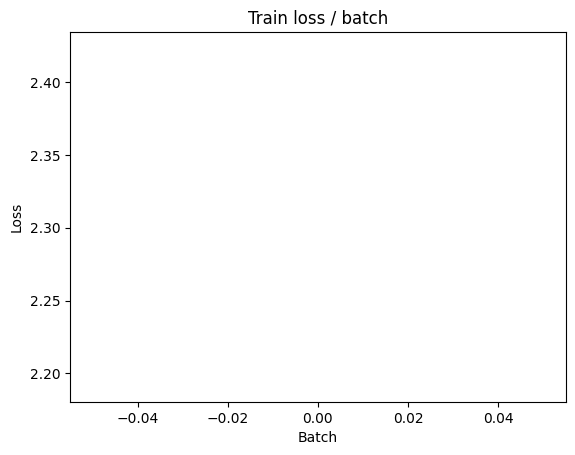

[TRAIN Batch 200/391]	Time 0.037s (0.037s)	Loss 1.5869 (1.7791)	Prec@1  47.7 ( 34.7)	Prec@5  93.0 ( 84.9)


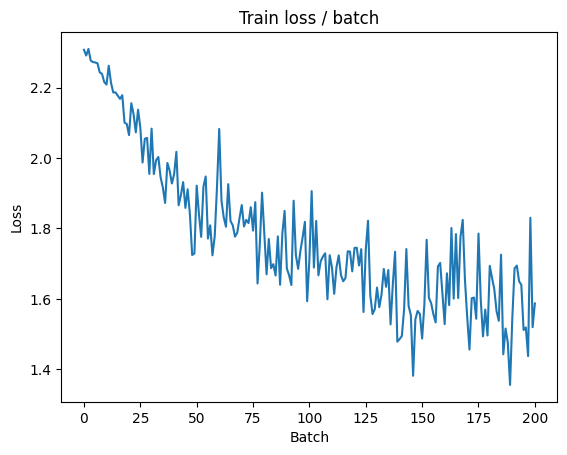


===============> Total time 11s	Avg loss 1.6249	Avg Prec@1 40.45 %	Avg Prec@5 88.49 %

[EVAL Batch 000/079]	Time 0.119s (0.119s)	Loss 1.5716 (1.5716)	Prec@1  44.5 ( 44.5)	Prec@5  92.2 ( 92.2)

===============> Total time 1s	Avg loss 1.6134	Avg Prec@1 42.17 %	Avg Prec@5 88.52 %



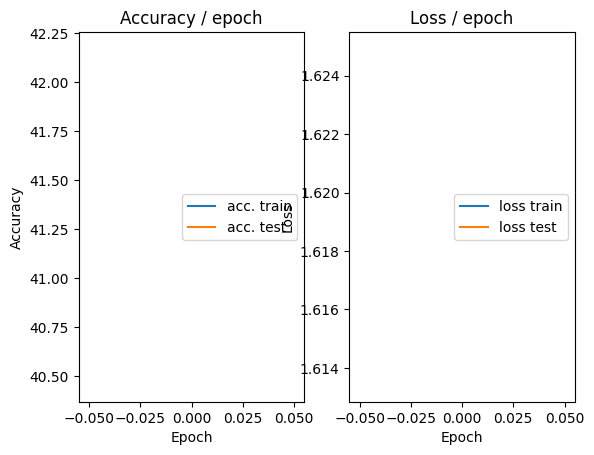

=== EPOCH 2 =====

[TRAIN Batch 000/391]	Time 0.132s (0.132s)	Loss 1.2260 (1.2260)	Prec@1  58.6 ( 58.6)	Prec@5  93.0 ( 93.0)


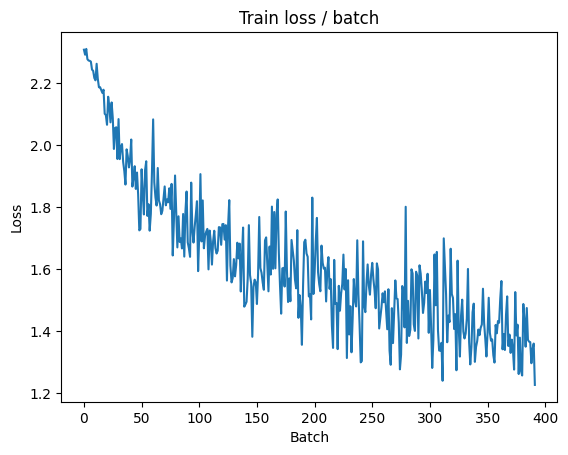

[TRAIN Batch 200/391]	Time 0.030s (0.028s)	Loss 1.1734 (1.3507)	Prec@1  57.0 ( 50.9)	Prec@5  95.3 ( 93.8)


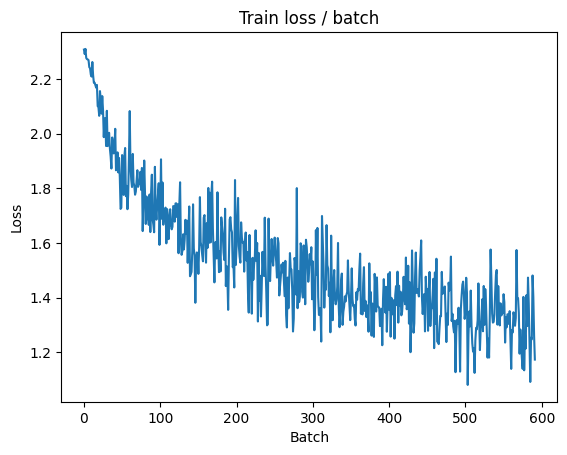


===============> Total time 9s	Avg loss 1.3213	Avg Prec@1 52.28 %	Avg Prec@5 94.05 %

[EVAL Batch 000/079]	Time 0.107s (0.107s)	Loss 1.3890 (1.3890)	Prec@1  51.6 ( 51.6)	Prec@5  88.3 ( 88.3)

===============> Total time 1s	Avg loss 1.5404	Avg Prec@1 47.31 %	Avg Prec@5 89.95 %



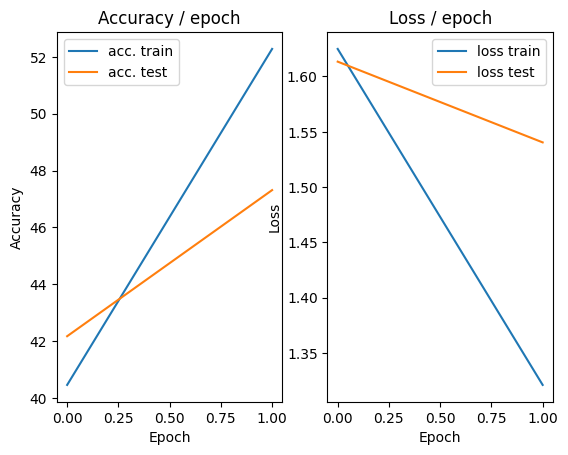

=== EPOCH 3 =====

[TRAIN Batch 000/391]	Time 0.125s (0.125s)	Loss 1.1281 (1.1281)	Prec@1  64.1 ( 64.1)	Prec@5  97.7 ( 97.7)


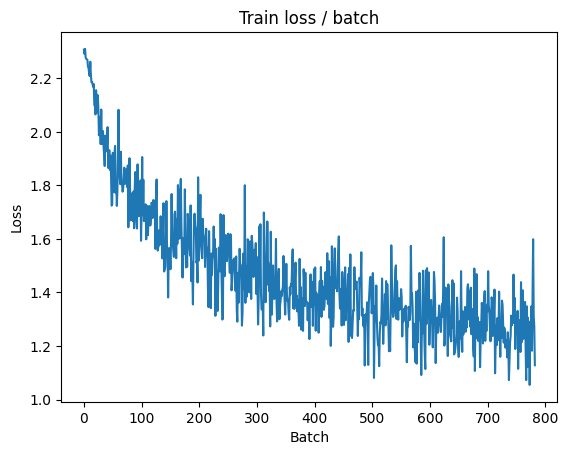

[TRAIN Batch 200/391]	Time 0.064s (0.028s)	Loss 1.2160 (1.1975)	Prec@1  55.5 ( 57.0)	Prec@5  95.3 ( 95.4)


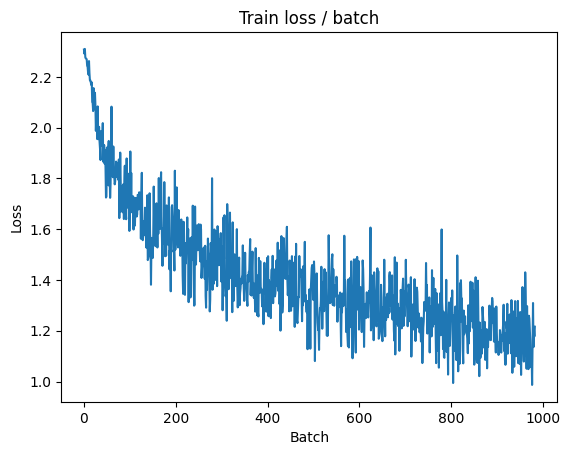


===============> Total time 9s	Avg loss 1.1740	Avg Prec@1 58.02 %	Avg Prec@5 95.48 %

[EVAL Batch 000/079]	Time 0.119s (0.119s)	Loss 1.0570 (1.0570)	Prec@1  58.6 ( 58.6)	Prec@5  95.3 ( 95.3)

===============> Total time 1s	Avg loss 1.2108	Avg Prec@1 56.13 %	Avg Prec@5 94.95 %



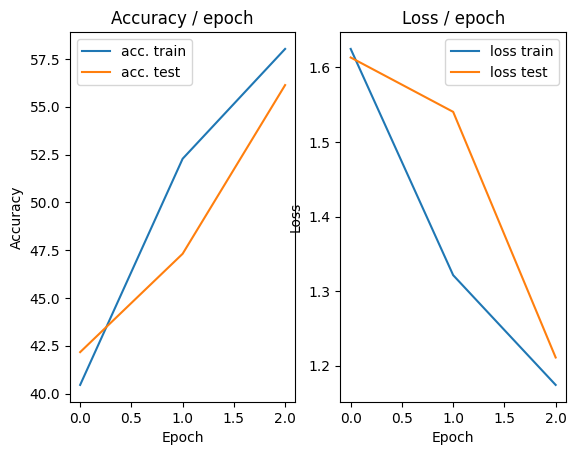

=== EPOCH 4 =====

[TRAIN Batch 000/391]	Time 0.134s (0.134s)	Loss 1.0187 (1.0187)	Prec@1  65.6 ( 65.6)	Prec@5  98.4 ( 98.4)


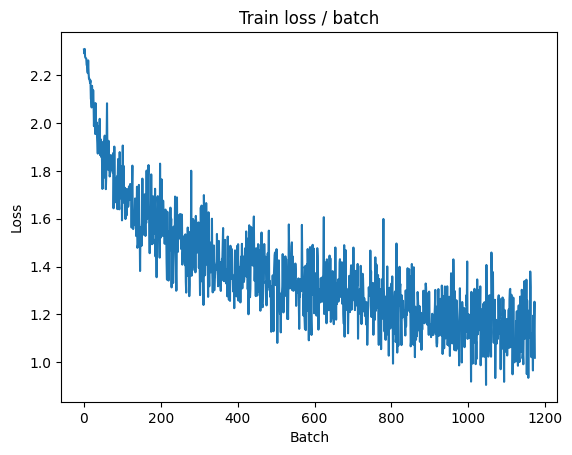

[TRAIN Batch 200/391]	Time 0.016s (0.023s)	Loss 1.0772 (1.0684)	Prec@1  60.2 ( 62.3)	Prec@5  96.1 ( 96.2)


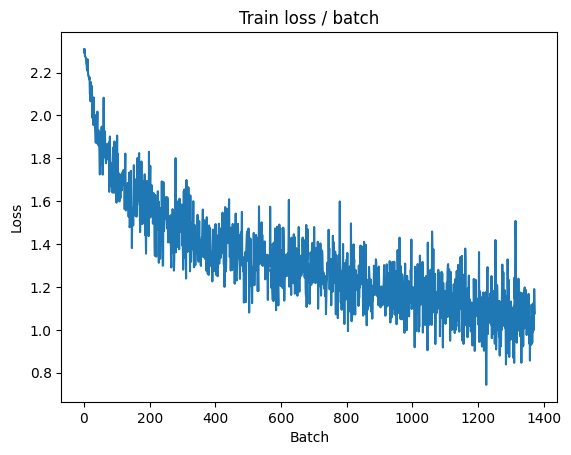


===============> Total time 9s	Avg loss 1.0629	Avg Prec@1 62.47 %	Avg Prec@5 96.28 %

[EVAL Batch 000/079]	Time 0.117s (0.117s)	Loss 1.1792 (1.1792)	Prec@1  60.2 ( 60.2)	Prec@5  93.0 ( 93.0)

===============> Total time 1s	Avg loss 1.2584	Avg Prec@1 56.37 %	Avg Prec@5 94.07 %



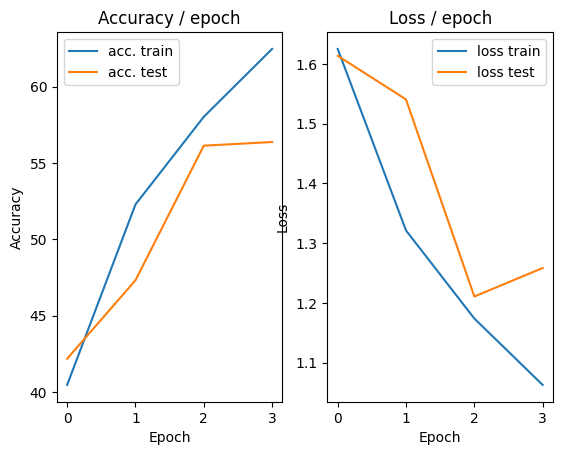

=== EPOCH 5 =====

[TRAIN Batch 000/391]	Time 0.148s (0.148s)	Loss 1.0776 (1.0776)	Prec@1  64.1 ( 64.1)	Prec@5  97.7 ( 97.7)


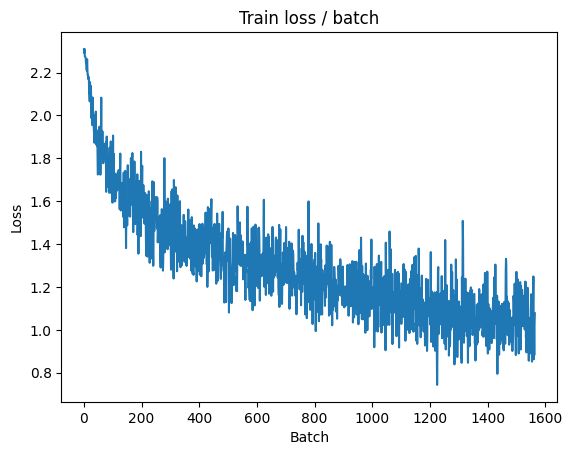

[TRAIN Batch 200/391]	Time 0.038s (0.022s)	Loss 0.8700 (0.9886)	Prec@1  68.0 ( 65.2)	Prec@5  99.2 ( 97.2)


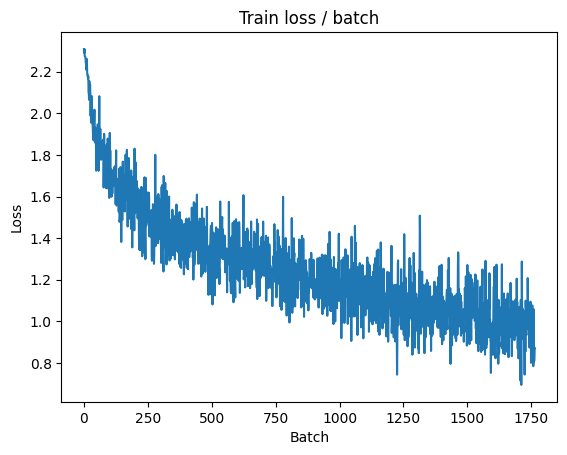


===============> Total time 9s	Avg loss 0.9716	Avg Prec@1 65.76 %	Avg Prec@5 97.09 %

[EVAL Batch 000/079]	Time 0.128s (0.128s)	Loss 1.0868 (1.0868)	Prec@1  61.7 ( 61.7)	Prec@5  95.3 ( 95.3)

===============> Total time 1s	Avg loss 1.1718	Avg Prec@1 59.00 %	Avg Prec@5 95.30 %



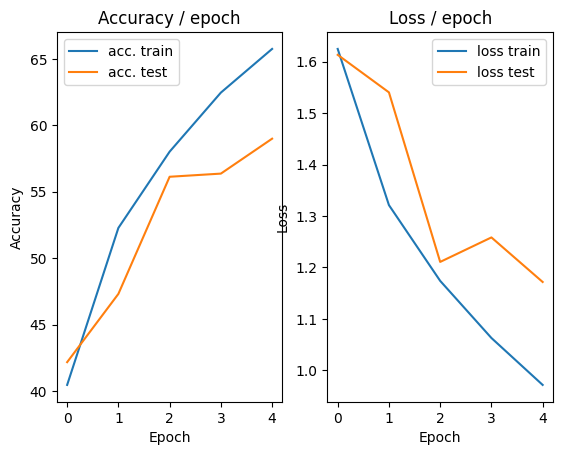

=== EPOCH 6 =====

[TRAIN Batch 000/391]	Time 0.131s (0.131s)	Loss 0.9437 (0.9437)	Prec@1  65.6 ( 65.6)	Prec@5  99.2 ( 99.2)


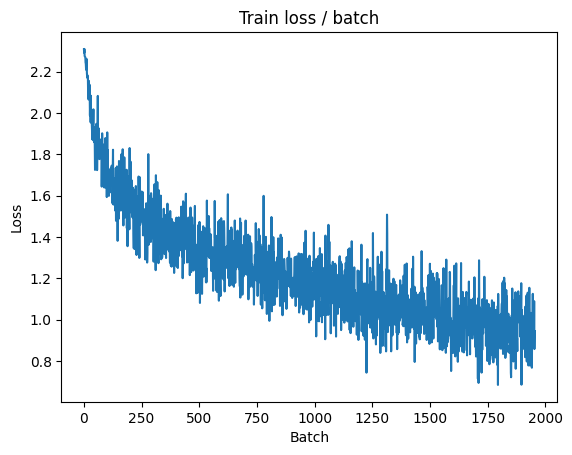

[TRAIN Batch 200/391]	Time 0.011s (0.022s)	Loss 0.6760 (0.8860)	Prec@1  74.2 ( 68.9)	Prec@5  98.4 ( 97.5)


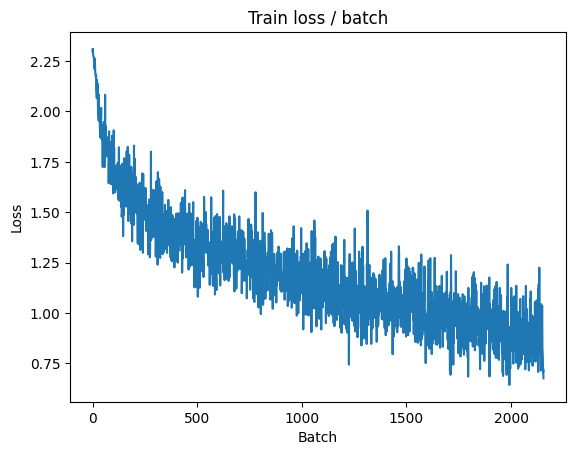


===============> Total time 9s	Avg loss 0.8927	Avg Prec@1 68.67 %	Avg Prec@5 97.45 %

[EVAL Batch 000/079]	Time 0.128s (0.128s)	Loss 0.9303 (0.9303)	Prec@1  68.8 ( 68.8)	Prec@5  96.9 ( 96.9)

===============> Total time 1s	Avg loss 0.9702	Avg Prec@1 66.43 %	Avg Prec@5 96.87 %



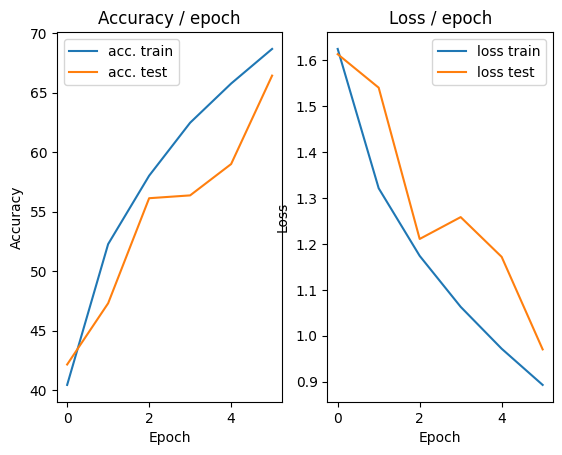

=== EPOCH 7 =====

[TRAIN Batch 000/391]	Time 0.152s (0.152s)	Loss 0.7183 (0.7183)	Prec@1  75.0 ( 75.0)	Prec@5  96.9 ( 96.9)


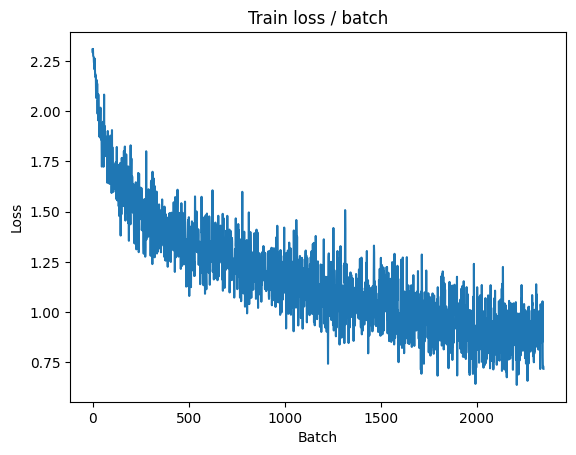

[TRAIN Batch 200/391]	Time 0.037s (0.022s)	Loss 0.9059 (0.8226)	Prec@1  67.2 ( 71.5)	Prec@5  98.4 ( 98.1)


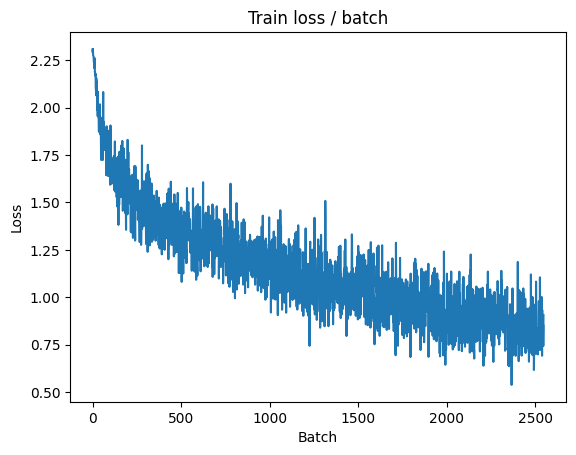


===============> Total time 8s	Avg loss 0.8255	Avg Prec@1 71.25 %	Avg Prec@5 97.95 %

[EVAL Batch 000/079]	Time 0.132s (0.132s)	Loss 1.0882 (1.0882)	Prec@1  58.6 ( 58.6)	Prec@5  95.3 ( 95.3)

===============> Total time 2s	Avg loss 1.1316	Avg Prec@1 61.12 %	Avg Prec@5 95.70 %



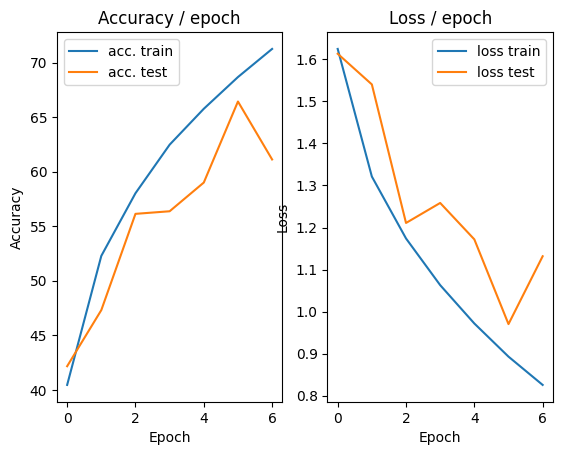

=== EPOCH 8 =====

[TRAIN Batch 000/391]	Time 0.158s (0.158s)	Loss 0.7252 (0.7252)	Prec@1  77.3 ( 77.3)	Prec@5 100.0 (100.0)


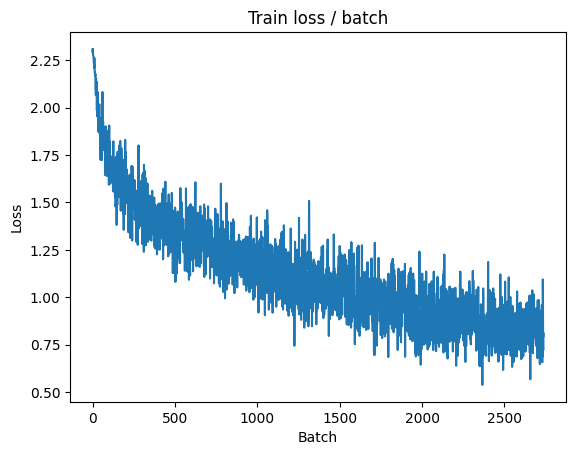

[TRAIN Batch 200/391]	Time 0.033s (0.023s)	Loss 0.8325 (0.7556)	Prec@1  68.0 ( 73.7)	Prec@5  96.1 ( 98.2)


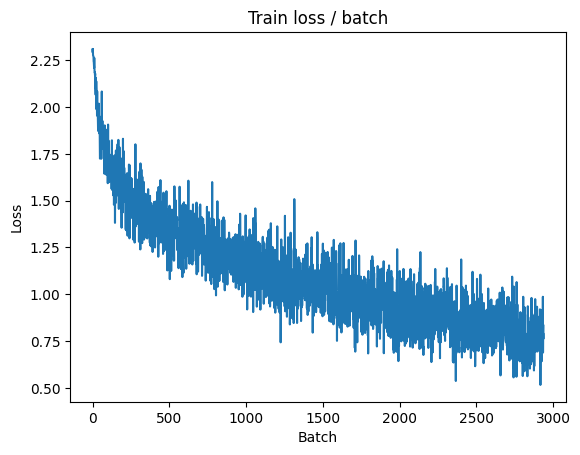


===============> Total time 8s	Avg loss 0.7651	Avg Prec@1 73.25 %	Avg Prec@5 98.18 %

[EVAL Batch 000/079]	Time 0.123s (0.123s)	Loss 1.0901 (1.0901)	Prec@1  62.5 ( 62.5)	Prec@5  94.5 ( 94.5)

===============> Total time 2s	Avg loss 1.0632	Avg Prec@1 63.24 %	Avg Prec@5 96.17 %



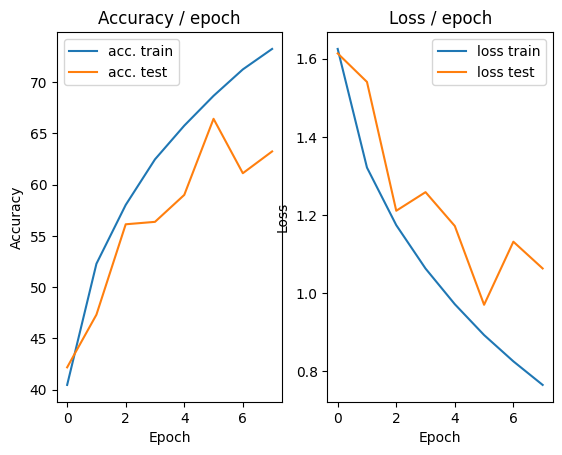

=== EPOCH 9 =====

[TRAIN Batch 000/391]	Time 0.223s (0.223s)	Loss 0.7278 (0.7278)	Prec@1  75.0 ( 75.0)	Prec@5  98.4 ( 98.4)


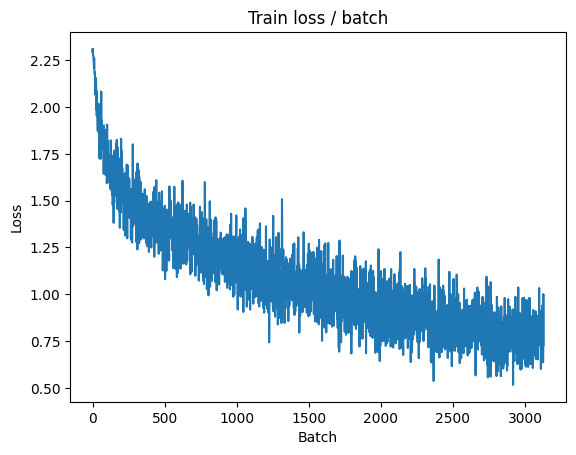

[TRAIN Batch 200/391]	Time 0.005s (0.024s)	Loss 0.7379 (0.7011)	Prec@1  77.3 ( 75.6)	Prec@5  96.1 ( 98.5)


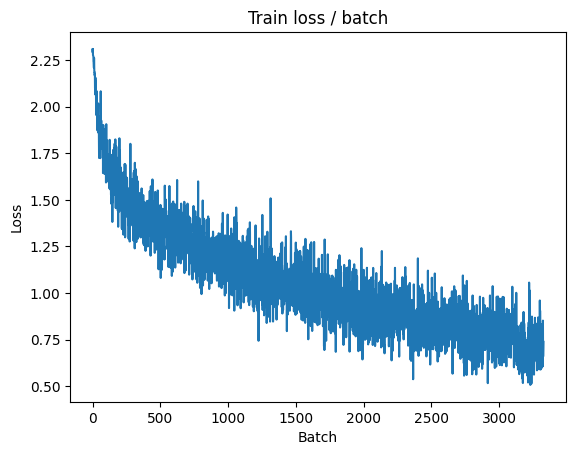


===============> Total time 8s	Avg loss 0.7091	Avg Prec@1 75.25 %	Avg Prec@5 98.47 %

[EVAL Batch 000/079]	Time 0.130s (0.130s)	Loss 1.2668 (1.2668)	Prec@1  58.6 ( 58.6)	Prec@5  95.3 ( 95.3)

===============> Total time 1s	Avg loss 1.2948	Avg Prec@1 56.99 %	Avg Prec@5 94.65 %



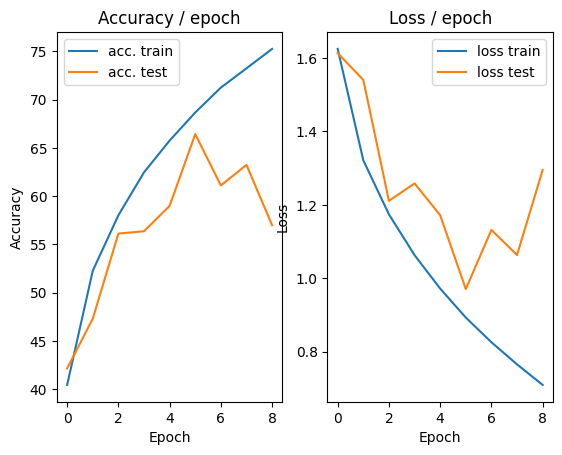

=== EPOCH 10 =====

[TRAIN Batch 000/391]	Time 0.278s (0.278s)	Loss 0.5616 (0.5616)	Prec@1  78.1 ( 78.1)	Prec@5  98.4 ( 98.4)


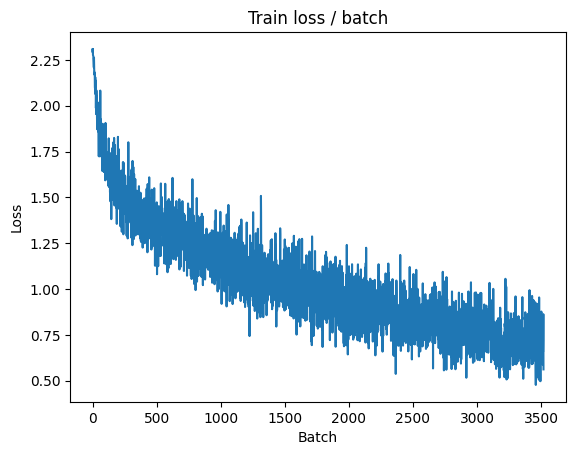

[TRAIN Batch 200/391]	Time 0.005s (0.027s)	Loss 0.6308 (0.6501)	Prec@1  76.6 ( 77.5)	Prec@5  97.7 ( 98.7)


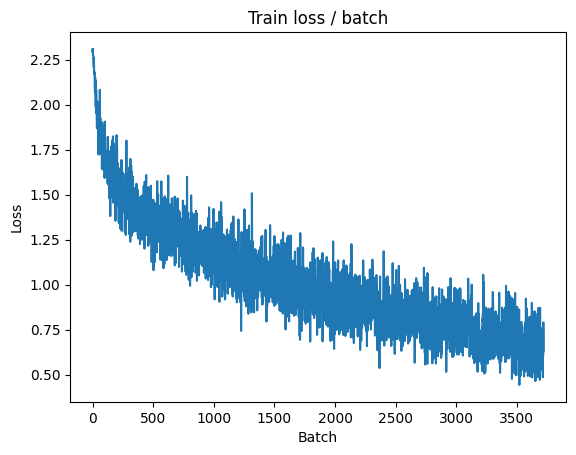


===============> Total time 9s	Avg loss 0.6632	Avg Prec@1 76.80 %	Avg Prec@5 98.72 %

[EVAL Batch 000/079]	Time 0.132s (0.132s)	Loss 1.0548 (1.0548)	Prec@1  64.1 ( 64.1)	Prec@5  97.7 ( 97.7)

===============> Total time 1s	Avg loss 1.0046	Avg Prec@1 66.52 %	Avg Prec@5 96.63 %



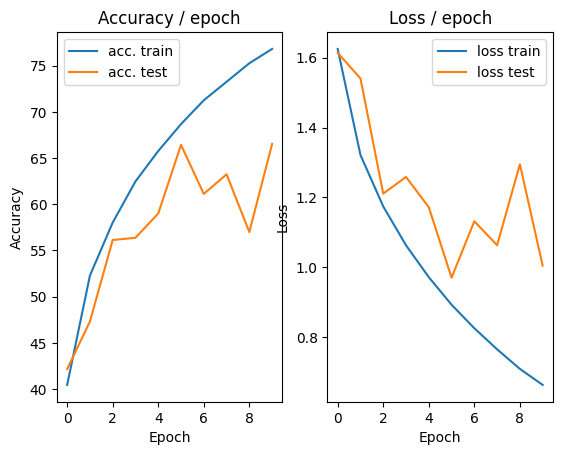

=== EPOCH 11 =====

[TRAIN Batch 000/391]	Time 0.155s (0.155s)	Loss 0.7343 (0.7343)	Prec@1  78.1 ( 78.1)	Prec@5  97.7 ( 97.7)


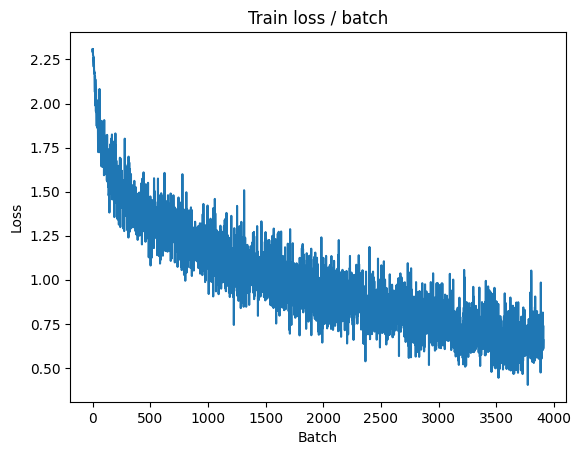

[TRAIN Batch 200/391]	Time 0.007s (0.029s)	Loss 0.6123 (0.5971)	Prec@1  80.5 ( 79.2)	Prec@5  97.7 ( 99.0)


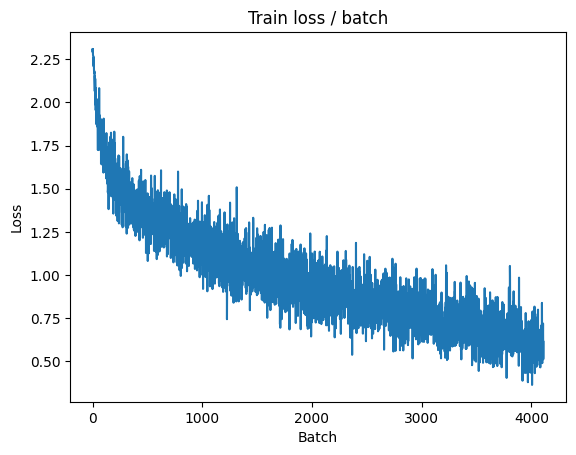


===============> Total time 10s	Avg loss 0.6097	Avg Prec@1 78.74 %	Avg Prec@5 98.92 %

[EVAL Batch 000/079]	Time 0.134s (0.134s)	Loss 1.1136 (1.1136)	Prec@1  69.5 ( 69.5)	Prec@5  96.9 ( 96.9)

===============> Total time 1s	Avg loss 1.1161	Avg Prec@1 62.95 %	Avg Prec@5 96.08 %



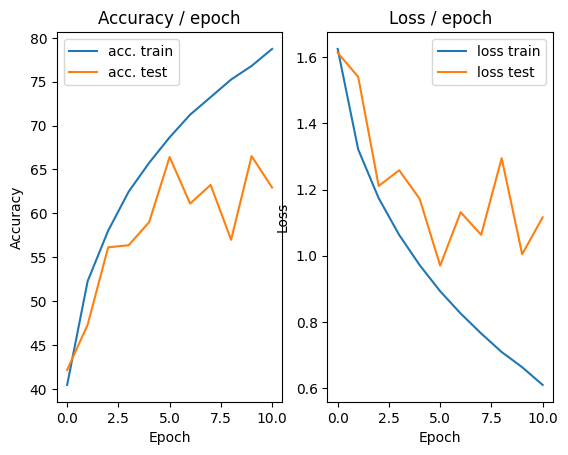

=== EPOCH 12 =====

[TRAIN Batch 000/391]	Time 0.177s (0.177s)	Loss 0.6702 (0.6702)	Prec@1  74.2 ( 74.2)	Prec@5  96.9 ( 96.9)


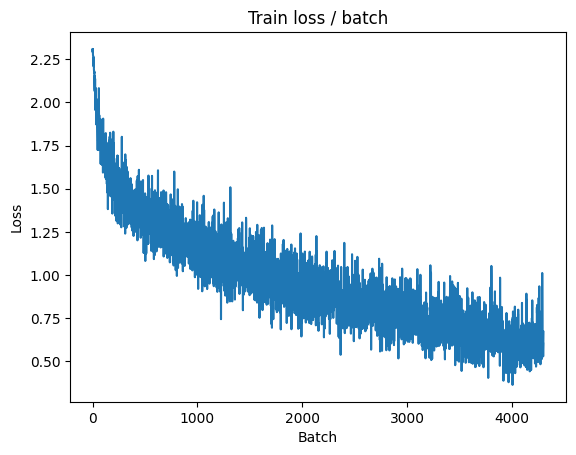

[TRAIN Batch 200/391]	Time 0.013s (0.029s)	Loss 0.5212 (0.5458)	Prec@1  80.5 ( 80.8)	Prec@5 100.0 ( 99.2)


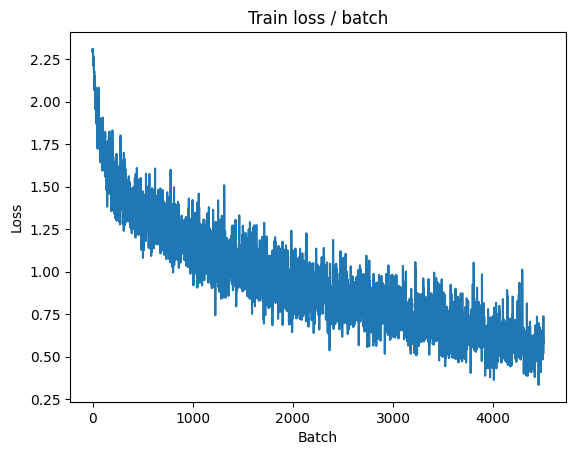


===============> Total time 9s	Avg loss 0.5647	Avg Prec@1 80.17 %	Avg Prec@5 99.10 %

[EVAL Batch 000/079]	Time 0.134s (0.134s)	Loss 1.3030 (1.3030)	Prec@1  64.1 ( 64.1)	Prec@5  96.9 ( 96.9)

===============> Total time 1s	Avg loss 1.2585	Avg Prec@1 62.17 %	Avg Prec@5 94.34 %



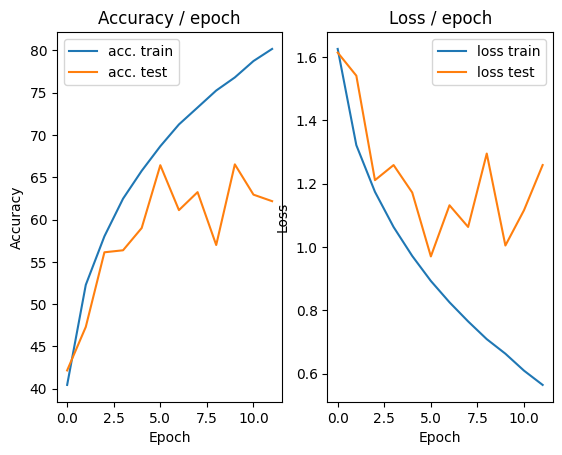

=== EPOCH 13 =====

[TRAIN Batch 000/391]	Time 0.159s (0.159s)	Loss 0.4984 (0.4984)	Prec@1  78.9 ( 78.9)	Prec@5  99.2 ( 99.2)


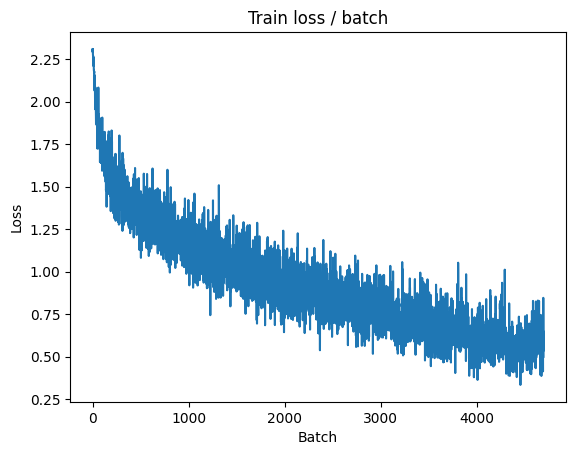

[TRAIN Batch 200/391]	Time 0.029s (0.030s)	Loss 0.4783 (0.5074)	Prec@1  84.4 ( 82.4)	Prec@5  99.2 ( 99.2)


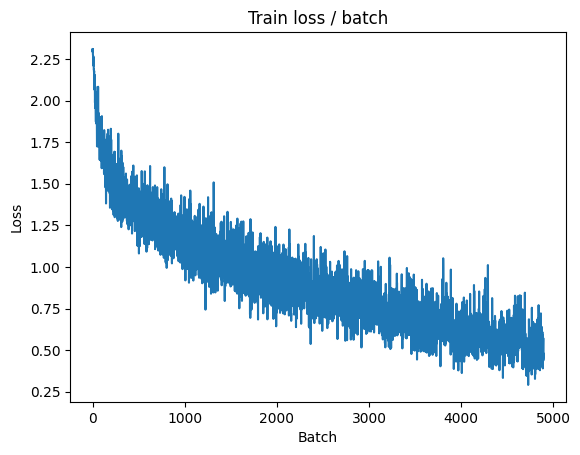


===============> Total time 10s	Avg loss 0.5205	Avg Prec@1 81.90 %	Avg Prec@5 99.25 %

[EVAL Batch 000/079]	Time 0.142s (0.142s)	Loss 1.2060 (1.2060)	Prec@1  64.1 ( 64.1)	Prec@5  97.7 ( 97.7)

===============> Total time 1s	Avg loss 1.1321	Avg Prec@1 65.02 %	Avg Prec@5 95.88 %



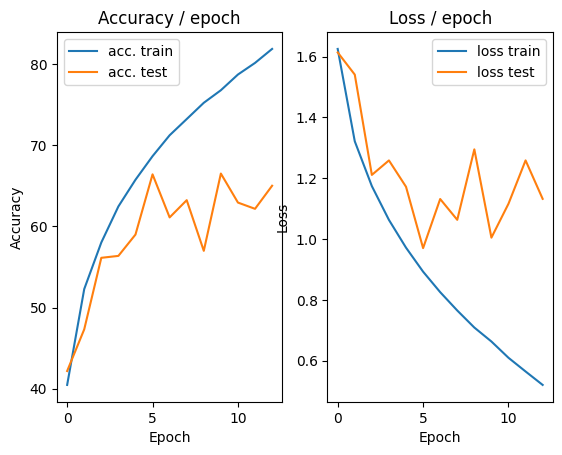

=== EPOCH 14 =====

[TRAIN Batch 000/391]	Time 0.166s (0.166s)	Loss 0.4125 (0.4125)	Prec@1  85.2 ( 85.2)	Prec@5 100.0 (100.0)


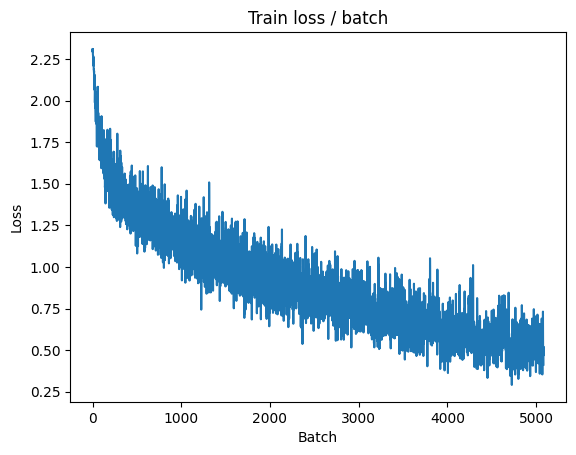

[TRAIN Batch 200/391]	Time 0.053s (0.025s)	Loss 0.3298 (0.4445)	Prec@1  88.3 ( 84.3)	Prec@5 100.0 ( 99.5)


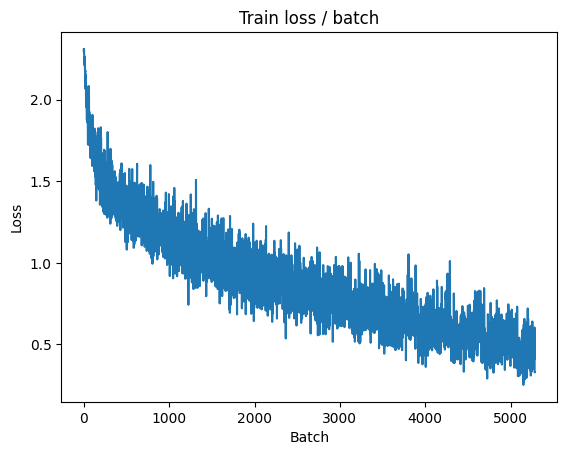


===============> Total time 9s	Avg loss 0.4736	Avg Prec@1 83.15 %	Avg Prec@5 99.39 %

[EVAL Batch 000/079]	Time 0.139s (0.139s)	Loss 1.1682 (1.1682)	Prec@1  62.5 ( 62.5)	Prec@5  96.1 ( 96.1)

===============> Total time 1s	Avg loss 1.1384	Avg Prec@1 65.55 %	Avg Prec@5 96.70 %



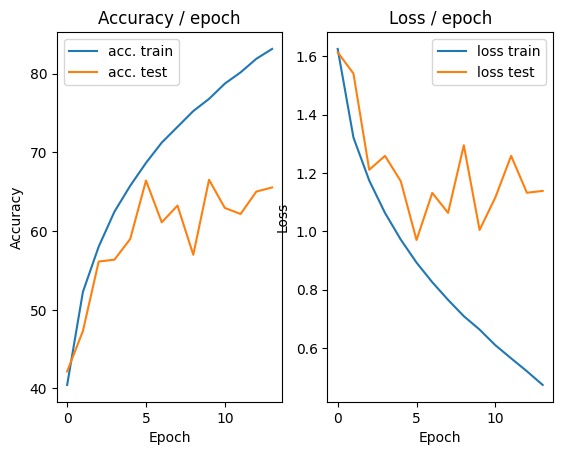

=== EPOCH 15 =====

[TRAIN Batch 000/391]	Time 0.164s (0.164s)	Loss 0.5048 (0.5048)	Prec@1  82.0 ( 82.0)	Prec@5 100.0 (100.0)


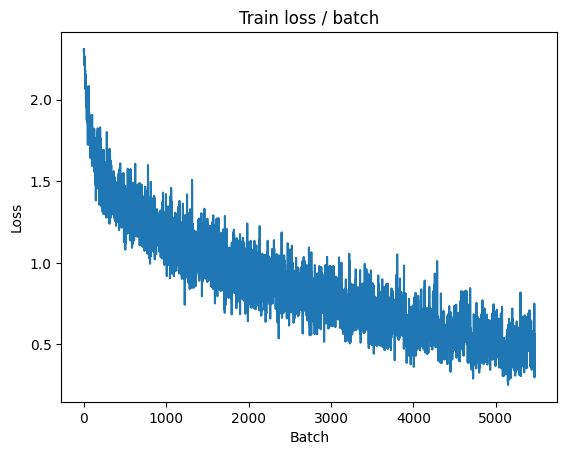

[TRAIN Batch 200/391]	Time 0.007s (0.022s)	Loss 0.6003 (0.4067)	Prec@1  77.3 ( 85.8)	Prec@5  99.2 ( 99.6)


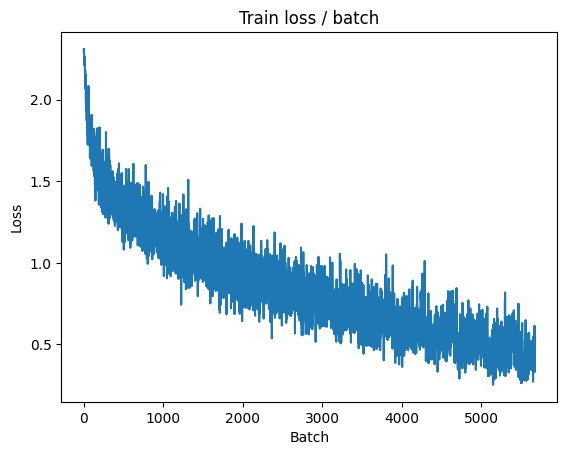


===============> Total time 9s	Avg loss 0.4337	Avg Prec@1 84.77 %	Avg Prec@5 99.52 %

[EVAL Batch 000/079]	Time 0.132s (0.132s)	Loss 1.3953 (1.3953)	Prec@1  59.4 ( 59.4)	Prec@5  96.9 ( 96.9)

===============> Total time 1s	Avg loss 1.2318	Avg Prec@1 65.47 %	Avg Prec@5 96.03 %



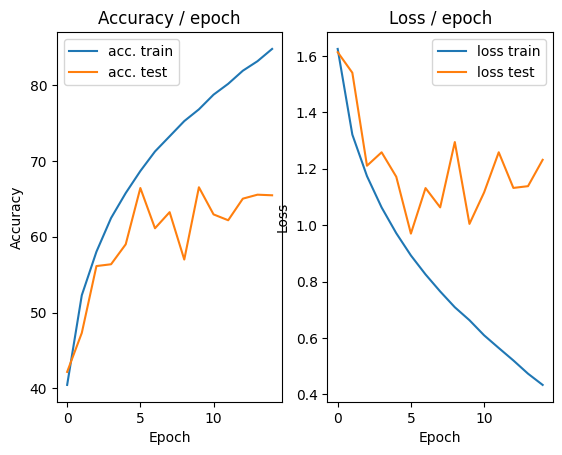

=== EPOCH 16 =====

[TRAIN Batch 000/391]	Time 0.167s (0.167s)	Loss 0.3850 (0.3850)	Prec@1  85.9 ( 85.9)	Prec@5  99.2 ( 99.2)


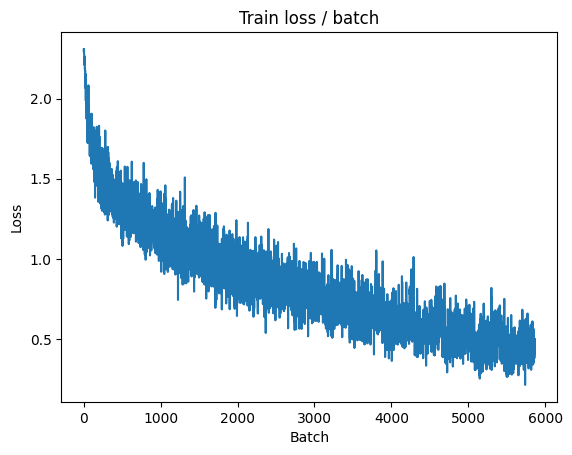

[TRAIN Batch 200/391]	Time 0.037s (0.022s)	Loss 0.4307 (0.3662)	Prec@1  86.7 ( 87.2)	Prec@5 100.0 ( 99.6)


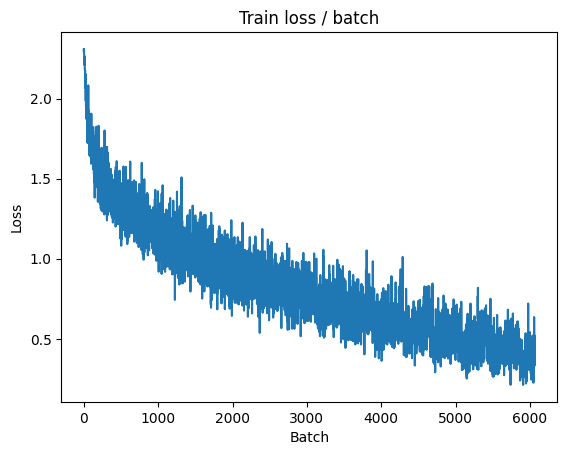


===============> Total time 9s	Avg loss 0.3936	Avg Prec@1 86.14 %	Avg Prec@5 99.59 %

[EVAL Batch 000/079]	Time 0.128s (0.128s)	Loss 1.5193 (1.5193)	Prec@1  63.3 ( 63.3)	Prec@5  93.8 ( 93.8)

===============> Total time 1s	Avg loss 1.5275	Avg Prec@1 60.80 %	Avg Prec@5 95.00 %



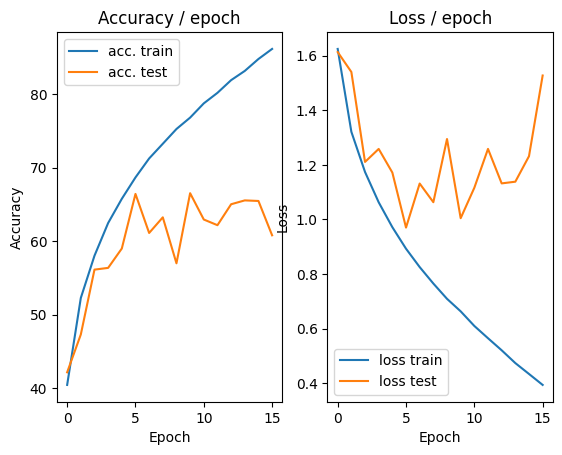

=== EPOCH 17 =====

[TRAIN Batch 000/391]	Time 0.180s (0.180s)	Loss 0.3724 (0.3724)	Prec@1  87.5 ( 87.5)	Prec@5 100.0 (100.0)


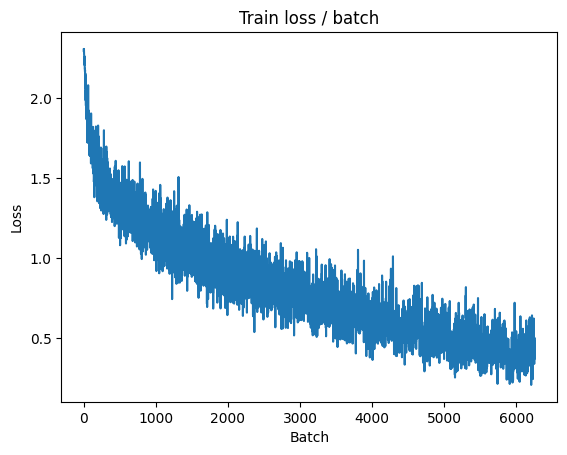

[TRAIN Batch 200/391]	Time 0.010s (0.023s)	Loss 0.5008 (0.3285)	Prec@1  81.2 ( 88.6)	Prec@5 100.0 ( 99.7)


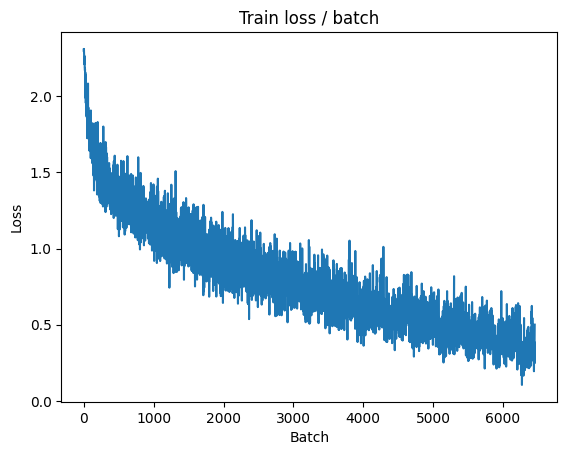


===============> Total time 9s	Avg loss 0.3616	Avg Prec@1 87.40 %	Avg Prec@5 99.69 %

[EVAL Batch 000/079]	Time 0.169s (0.169s)	Loss 1.6709 (1.6709)	Prec@1  57.8 ( 57.8)	Prec@5  96.1 ( 96.1)

===============> Total time 2s	Avg loss 1.8134	Avg Prec@1 57.91 %	Avg Prec@5 94.45 %



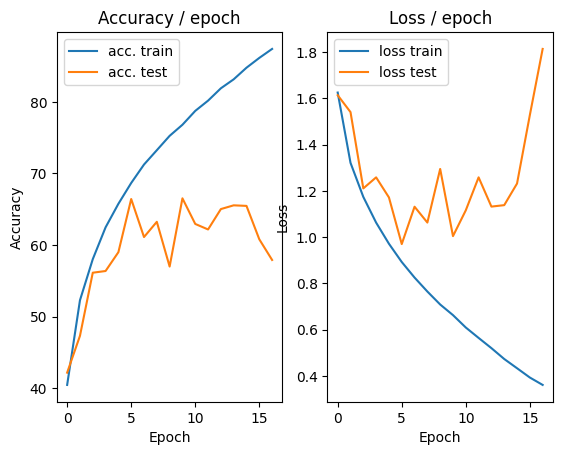

=== EPOCH 18 =====

[TRAIN Batch 000/391]	Time 0.163s (0.163s)	Loss 0.5766 (0.5766)	Prec@1  80.5 ( 80.5)	Prec@5 100.0 (100.0)


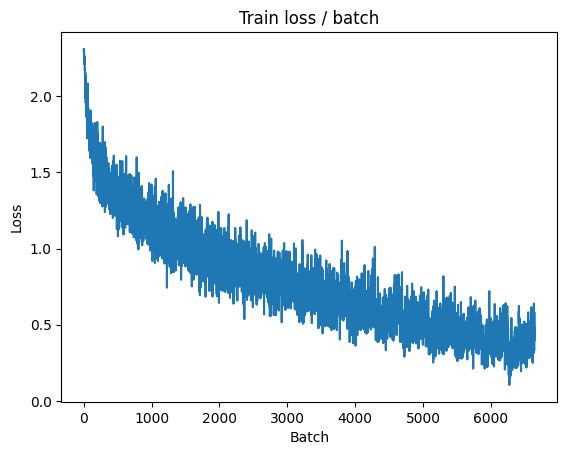

[TRAIN Batch 200/391]	Time 0.035s (0.022s)	Loss 0.3249 (0.3076)	Prec@1  87.5 ( 89.2)	Prec@5 100.0 ( 99.8)


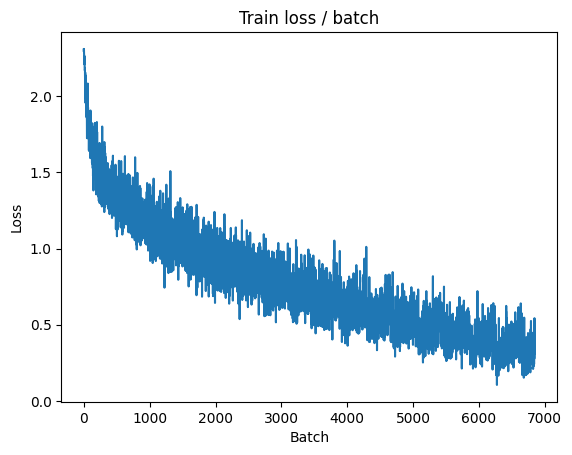


===============> Total time 8s	Avg loss 0.3278	Avg Prec@1 88.44 %	Avg Prec@5 99.78 %

[EVAL Batch 000/079]	Time 0.140s (0.140s)	Loss 1.3152 (1.3152)	Prec@1  60.9 ( 60.9)	Prec@5  96.9 ( 96.9)

===============> Total time 2s	Avg loss 1.3231	Avg Prec@1 65.11 %	Avg Prec@5 96.29 %



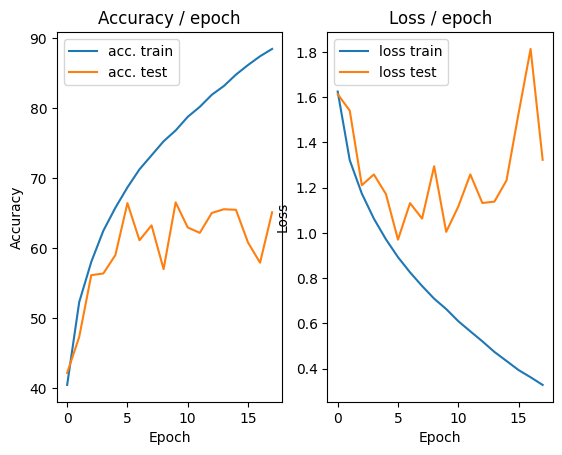

=== EPOCH 19 =====

[TRAIN Batch 000/391]	Time 0.156s (0.156s)	Loss 0.2686 (0.2686)	Prec@1  92.2 ( 92.2)	Prec@5 100.0 (100.0)


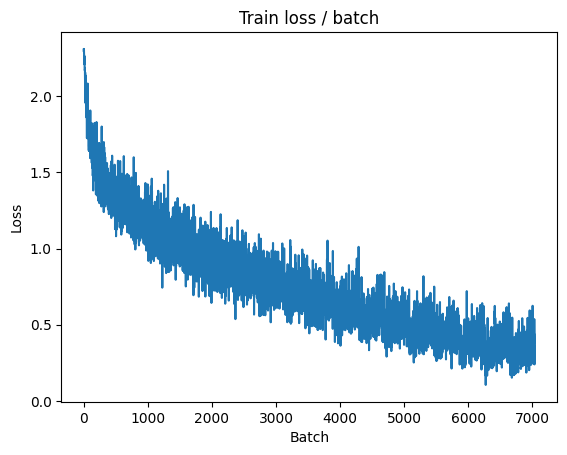

[TRAIN Batch 200/391]	Time 0.030s (0.022s)	Loss 0.2923 (0.2698)	Prec@1  92.2 ( 90.6)	Prec@5  99.2 ( 99.8)


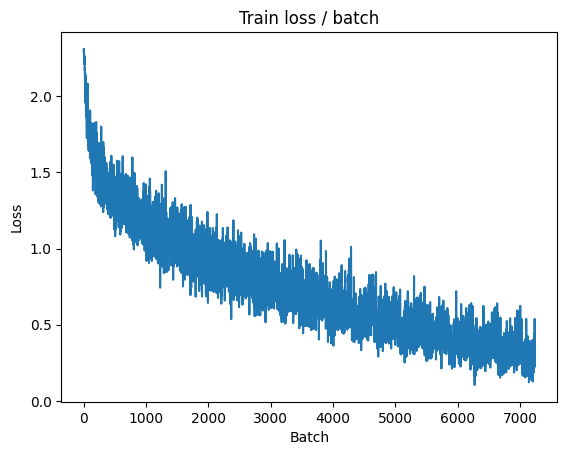


===============> Total time 8s	Avg loss 0.2965	Avg Prec@1 89.62 %	Avg Prec@5 99.81 %

[EVAL Batch 000/079]	Time 0.132s (0.132s)	Loss 1.5091 (1.5091)	Prec@1  64.8 ( 64.8)	Prec@5  95.3 ( 95.3)

===============> Total time 1s	Avg loss 1.4667	Avg Prec@1 63.85 %	Avg Prec@5 96.35 %



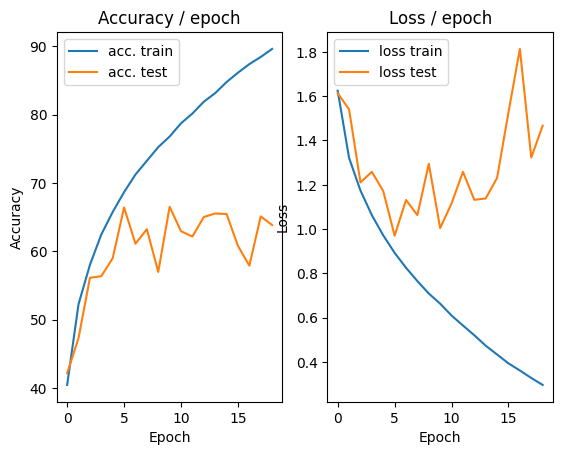

=== EPOCH 20 =====

[TRAIN Batch 000/391]	Time 0.248s (0.248s)	Loss 0.2280 (0.2280)	Prec@1  94.5 ( 94.5)	Prec@5 100.0 (100.0)


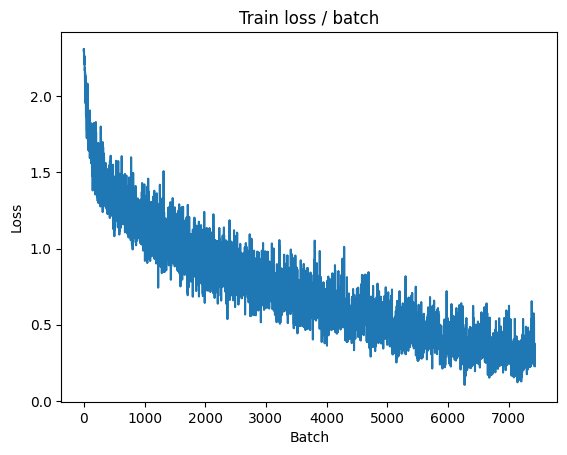

[TRAIN Batch 200/391]	Time 0.005s (0.027s)	Loss 0.2626 (0.2479)	Prec@1  88.3 ( 91.6)	Prec@5 100.0 ( 99.9)


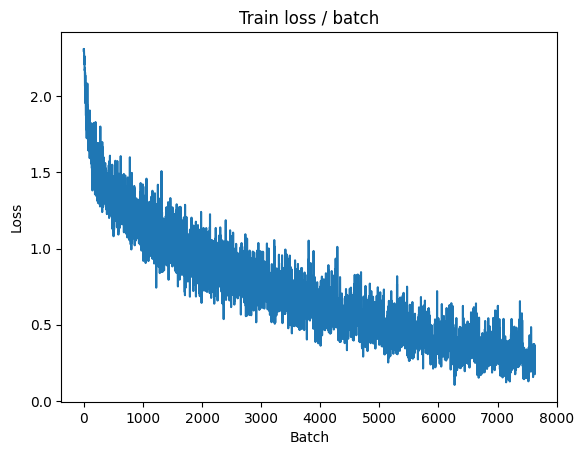


===============> Total time 9s	Avg loss 0.2708	Avg Prec@1 90.54 %	Avg Prec@5 99.86 %

[EVAL Batch 000/079]	Time 0.139s (0.139s)	Loss 1.8192 (1.8192)	Prec@1  60.9 ( 60.9)	Prec@5  93.8 ( 93.8)

===============> Total time 1s	Avg loss 1.7345	Avg Prec@1 59.75 %	Avg Prec@5 94.40 %



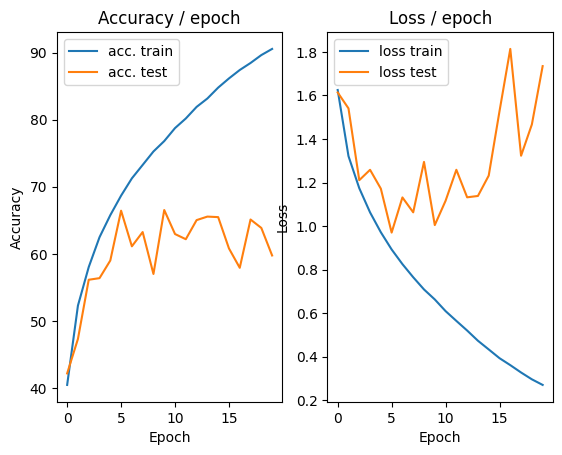

In [ ]:
main(batch_size=128, lr=0.1, epochs=20,cuda=True)